In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path  # For defining dataset Paths
import sys                # For include librep package
sys.path.append("../../..")

# Third party imports
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from librep.utils.workflow import SimpleTrainEvalWorkflow, MultiRunWorkflow
from librep.metrics.report import ClassificationReport
from librep.estimators import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from librep.metrics.dimred_evaluator import DimensionalityReductionQualityReport

from librep.transforms.topo_ae import TopologicalDimensionalityReduction
from librep.estimators.ae.torch.models.topological_ae.topological_ae import TopologicallyRegularizedAutoencoder


from librep.transforms import UMAP
from tabulate import tabulate

2022-10-23 02:02:21.480736: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-23 02:02:21.480758: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [4]:
from Experiments_topoae_KuHar20Hz_helper import *
kuhar_data = obtainKuHar20Hz()
train_HD = kuhar_data['train_HD']
train_LD = kuhar_data['train_LD']
train_Y = kuhar_data['train_Y']
test_HD = kuhar_data['test_HD']
test_LD = kuhar_data['test_LD']
test_Y = kuhar_data['test_Y']

# Preparing Table

Columns:
* RF (Accuracy, F1)
* SVC (Accuracy, F1)
* KNN (Accuracy, F1)
* Trustworthiness
* Continuity
* Co-k-nearest-neighbor-size

Rows:
* UMAP (2 dim)
* Generic Autoencoders
* Topological autoencoders (L=1)
* Topological autoencoders (L=100)

In [5]:
def print_table(table_info):
    tabulated = tabulate(
        table_info,
        headers='keys',
        tablefmt='fancy_grid',
        missingval='-'
    )
    print(tabulated)


table_info = {
    'Metrics': ['RF-ACC', 'RF-F1',
                'SVC-ACC', 'SVC-F1',
                'KNN-ACC', 'KNN-F1',
                'Trustworthiness',
                'Continuity',
                'Co-k-NNs'],
    'UMAP': ['-']*9,
    'Generic-AE': ['-']*9,
    'Topo-AEv2 (L=1000)': ['-']*9,
    'Topo-AEv2 (L=10000)': ['-']*9,
    'M-AE (L=1000)': ['-']*9,
    'M-AE (L=10000)': ['-']*9
}
print_table(table_info)

╒═════════════════╤════════╤══════════════╤══════════════════════╤═══════════════════════╤═════════════════╤══════════════════╕
│ Metrics         │ UMAP   │ Generic-AE   │ Topo-AEv2 (L=1000)   │ Topo-AEv2 (L=10000)   │ M-AE (L=1000)   │ M-AE (L=10000)   │
╞═════════════════╪════════╪══════════════╪══════════════════════╪═══════════════════════╪═════════════════╪══════════════════╡
│ RF-ACC          │ -      │ -            │ -                    │ -                     │ -               │ -                │
├─────────────────┼────────┼──────────────┼──────────────────────┼───────────────────────┼─────────────────┼──────────────────┤
│ RF-F1           │ -      │ -            │ -                    │ -                     │ -               │ -                │
├─────────────────┼────────┼──────────────┼──────────────────────┼───────────────────────┼─────────────────┼──────────────────┤
│ SVC-ACC         │ -      │ -            │ -                    │ -                     │ -            

# Visualization helper

In [6]:
def visualize(X, Y, filtered=None, xlim=None, ylim=None):
    data_grouped = list(zip(X, Y))
    uniques = filtered
    if filtered is None:
        uniques = np.unique(Y)
    
    for uval in uniques:
        data = [pair[0] for pair in data_grouped if pair[1]==uval]
        data_x = [unit[0] for unit in data]
        data_y = [unit[1] for unit in data]
        plt.scatter(data_x, data_y, label = uval)
    # print(data)
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    plt.grid()
    plt.legend()
    plt.show()

# Applying Scaler

MinMaxScaler, MaxAbsScaler and StandardScaler apply the scaling PER FEATURE, which means the distance between points would actually be modified, and so, the ranking as well.
Because of this, a new Scaler is used

In [7]:
# import numpy as np
# import matplotlib.pyplot as plt
# import scipy.fftpack

# # Number of samplepoints
# N = 600
# # sample spacing
# T = 1.0 / 800.0
# x = np.linspace(0.0, N*T, N)
# y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)
# yf = scipy.fftpack.fft(y)
# xf = np.linspace(0.0, 1.0/(2.0*T), N//2)


# # print(x)
# # print(xf)

# fig, ax = plt.subplots()
# # ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
# ax.plot(x,y)
# plt.show()

# fig, ax = plt.subplots()
# ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
# # ax.plot(x,y)
# plt.show()


In [8]:
# import numpy as np
# import matplotlib.pyplot as plt
# import scipy.fftpack

# # Number of samplepoints
# N = 600
# # sample spacing
# T = 1.0 / 800.0
# x = np.linspace(0.0, N*T, N)
# y = 2*(np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x))
# yf = scipy.fftpack.fft(y)
# xf = np.linspace(0.0, 1.0/(2.0*T), N//2)


# # print(x)
# # print(xf)

# fig, ax = plt.subplots()
# # ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
# ax.plot(x,y)
# plt.show()

# fig, ax = plt.subplots()
# ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
# # ax.plot(x,y)
# plt.show()


In [9]:
# from sklearn import preprocessing

# scaler = preprocessing.MinMaxScaler()

In [10]:
# train_HD = scaler.fit_transform(train_dataset_fft.X)
# train_LD = None
# # train_Y = train_dataset_fft.y
# test_HD = scaler.fit_transform(test_dataset_fft.X)
# test_LD = None
# # test_Y = test_dataset_fft.y

## Set Reporter

In [11]:
reporter = ClassificationReport(
    use_accuracy=True, 
    use_f1_score=True,
    use_classification_report=False,
    use_confusion_matrix=False,
    plot_confusion_matrix=False
)

# **SECTION:** Exploring Topological AE (dimensions)

In [12]:
dimensions_to_explore = [2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 50, 100]
# dimensions_to_explore = [2, 10, 100]
executions_per_model = 10
# executions_per_model = 2

def explore_dimension(train_HD, train_Y, test_HD, test_Y, topoae_dimension, times_to_execute=10):
    topoae_lambda = 1000
    result_object = {
        'RF-ACC': [],
        'RF-F1': [],
        'SVC-ACC': [],
        'SVC-F1': [],
        'KNN-ACC': [],
        'KNN-F1': [],
        'Trustworthiness': [],
        'Continuity': [],
        'Co-k-NNs': []   
    }
    for _ in range(times_to_execute):
        kwargs = {'input_dims':180, 'custom_dim':topoae_dimension}
        input_shape = (-1, 1, 180)
        topo_reducer = TopologicalDimensionalityReduction(
            ae_model='DeepAEforKuhar180ver2',
            lam=topoae_lambda,
            ae_kwargs=kwargs,
            input_shape=input_shape,
            patience=10
        )
        title_plot = "KUHAR 20Hz\nTopoAE lambda " + str(topoae_lambda)
        topo_reducer.fit(train_HD, train_Y, title_plot=title_plot)
        train_LD = np.reshape(topo_reducer.transform(train_HD), (-1, topoae_dimension))
        test_LD = np.reshape(topo_reducer.transform(test_HD), (-1, topoae_dimension))
        experiments_result = run_experiments(train_HD, train_LD, train_Y, test_HD, test_LD, test_Y)
        metrics_reporter = DimensionalityReductionQualityReport()
        metrics_report = metrics_reporter.evaluate([test_HD, test_LD])
        
        result_object['RF-ACC'].append(experiments_result['RF-ACC'])
        result_object['RF-F1'].append(experiments_result['RF-F1'])
        result_object['SVC-ACC'].append(experiments_result['SVC-ACC'])
        result_object['SVC-F1'].append(experiments_result['SVC-F1'])
        result_object['KNN-ACC'].append(experiments_result['KNN-ACC'])
        result_object['KNN-F1'].append(experiments_result['KNN-F1'])
        
        result_object['Trustworthiness'].append(metrics_report['trustworthiness'])
        result_object['Continuity'].append(metrics_report['continuity'])
        result_object['Co-k-NNs'].append(metrics_report['co k nearest neighbor size'])
        
    # for obj_property in result_object:
    #     mean_val = np.mean(result_object[obj_property])
    #     min_val = np.min(result_object[obj_property])
    #     max_val = np.max(result_object[obj_property])
    #     result_object[obj_property] = (min_val, mean_val, max_val)

    return result_object


Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:477.6300, Loss-ae:472.2760, Loss-topo:0.0054
Epoch:2, P:10, Loss:352.3151, Loss-ae:344.9996, Loss-topo:0.0073
Epoch:3, P:10, Loss:305.2325, Loss-ae:288.5355, Loss-topo:0.0167
Epoch:4, P:10, Loss:346.1369, Loss-ae:273.5259, Loss-topo:0.0726
Epoch:5, P:9, Loss:267.0371, Loss-ae:244.3179, Loss-topo:0.0227
Epoch:6, P:10, Loss:267.9691, Loss-ae:253.7185, Loss-topo:0.0143
Epoch:7, P:9, Loss:279.2955, Loss-ae:259.8091, Loss-topo:0.0195
Epoch:8, P:8, Loss:269.6366, Loss-ae:228.6049, Loss-topo:0.0410
Epoch:9, P:7, Loss:254.9547, Loss-ae:244.6331, Loss-topo:0.0103
Epoch:10, P:10, Loss:215.6234, Loss-ae:211.7595, Loss-topo:0.0039
Epoch:11, P:10, Loss:221.4416, Loss-ae:218.5978, Loss-topo:0.0028
Epoch:12, P:9, Loss:216.4959, Loss-ae:214.4953, Loss-topo:0.0020
Epoch:13, P:8, Loss:242.6165, Loss-ae:235.5229, Loss-topo:0.0071
Epoch:14, P:7, Loss:264.789

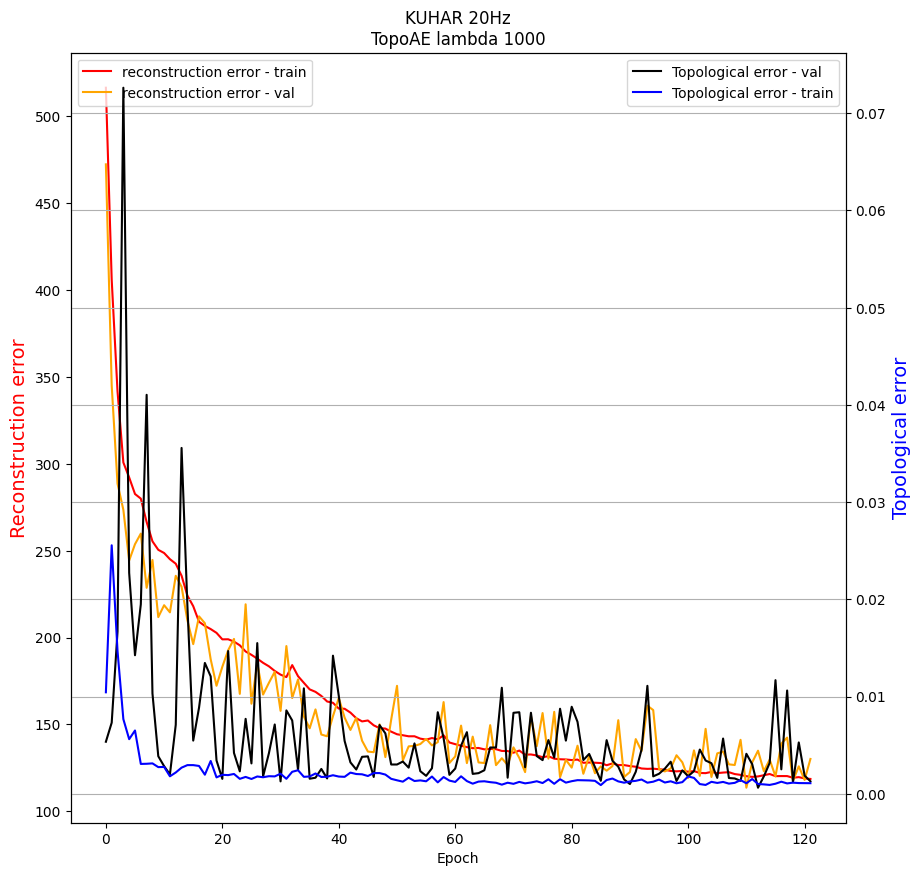

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:533.8607, Loss-ae:512.1283, Loss-topo:0.0217
Epoch:2, P:10, Loss:441.8983, Loss-ae:413.5057, Loss-topo:0.0284
Epoch:3, P:10, Loss:373.5216, Loss-ae:324.1743, Loss-topo:0.0493
Epoch:4, P:10, Loss:400.3222, Loss-ae:301.0227, Loss-topo:0.0993
Epoch:5, P:9, Loss:244.5301, Loss-ae:240.4573, Loss-topo:0.0041
Epoch:6, P:10, Loss:249.4553, Loss-ae:242.4977, Loss-topo:0.0070
Epoch:7, P:9, Loss:257.6310, Loss-ae:252.4968, Loss-topo:0.0051
Epoch:8, P:8, Loss:301.6995, Loss-ae:289.1612, Loss-topo:0.0125
Epoch:9, P:7, Loss:220.3716, Loss-ae:215.8065, Loss-topo:0.0046
Epoch:10, P:10, Loss:228.9909, Loss-ae:225.7518, Loss-topo:0.0032
Epoch:11, P:9, Loss:226.2540, Loss-ae:223.9603, Loss-topo:0.0023
Epoch:12, P:8, Loss:283.8948, Loss-ae:278.2309, Loss-topo:0.0057
Epoch:13, P:7, Loss:222.6067, Loss-ae:219.9780, Loss-topo:0.0026
Epoch:14, P:6, Loss:240.1955

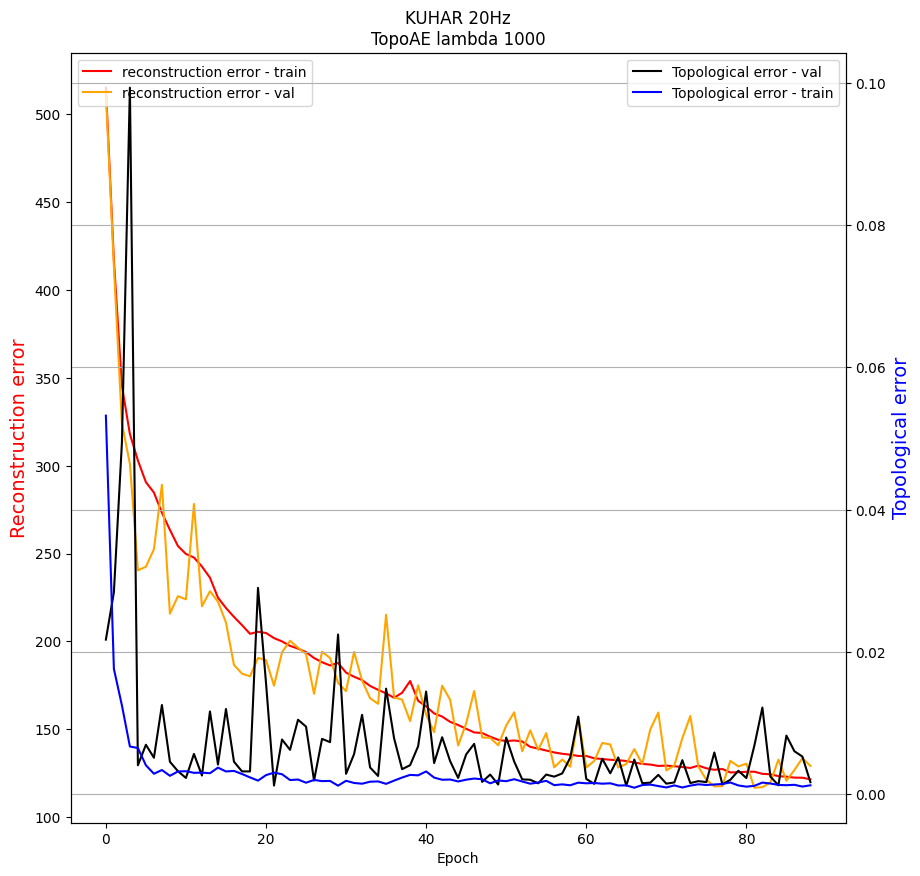

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:557.2786, Loss-ae:448.0408, Loss-topo:0.1092
Epoch:2, P:10, Loss:372.0411, Loss-ae:355.9293, Loss-topo:0.0161
Epoch:3, P:10, Loss:319.9594, Loss-ae:303.5686, Loss-topo:0.0164
Epoch:4, P:10, Loss:263.7476, Loss-ae:261.0996, Loss-topo:0.0026
Epoch:5, P:10, Loss:251.2545, Loss-ae:244.7740, Loss-topo:0.0065
Epoch:6, P:10, Loss:237.6226, Loss-ae:229.2726, Loss-topo:0.0084
Epoch:7, P:10, Loss:246.7614, Loss-ae:242.6760, Loss-topo:0.0041
Epoch:8, P:9, Loss:261.5708, Loss-ae:256.4225, Loss-topo:0.0051
Epoch:9, P:8, Loss:228.6622, Loss-ae:218.9377, Loss-topo:0.0097
Epoch:10, P:10, Loss:234.6087, Loss-ae:230.4775, Loss-topo:0.0041
Epoch:11, P:9, Loss:280.0607, Loss-ae:276.2067, Loss-topo:0.0039
Epoch:12, P:8, Loss:210.2818, Loss-ae:206.7208, Loss-topo:0.0036
Epoch:13, P:10, Loss:250.2961, Loss-ae:230.9675, Loss-topo:0.0193
Epoch:14, P:9, Loss:244.9

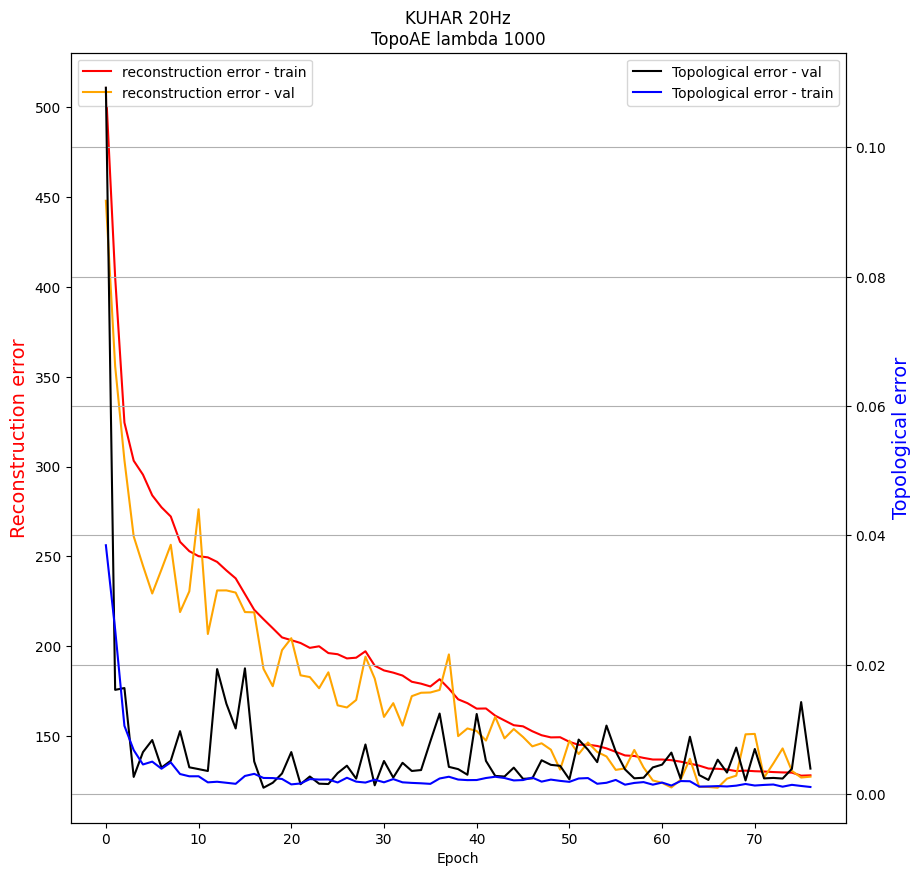

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:495.2471, Loss-ae:473.6464, Loss-topo:0.0216
Epoch:2, P:10, Loss:512.0486, Loss-ae:370.4461, Loss-topo:0.1416
Epoch:3, P:9, Loss:352.1323, Loss-ae:297.7493, Loss-topo:0.0544
Epoch:4, P:10, Loss:350.4991, Loss-ae:330.7807, Loss-topo:0.0197
Epoch:5, P:10, Loss:277.1084, Loss-ae:266.5595, Loss-topo:0.0105
Epoch:6, P:10, Loss:295.5325, Loss-ae:277.4955, Loss-topo:0.0180
Epoch:7, P:9, Loss:265.7741, Loss-ae:252.9791, Loss-topo:0.0128
Epoch:8, P:10, Loss:242.1177, Loss-ae:233.7739, Loss-topo:0.0083
Epoch:9, P:10, Loss:221.3034, Loss-ae:216.5189, Loss-topo:0.0048
Epoch:10, P:10, Loss:226.5632, Loss-ae:210.4660, Loss-topo:0.0161
Epoch:11, P:9, Loss:243.5833, Loss-ae:236.2288, Loss-topo:0.0074
Epoch:12, P:8, Loss:227.1146, Loss-ae:223.4590, Loss-topo:0.0037
Epoch:13, P:7, Loss:229.5302, Loss-ae:225.0644, Loss-topo:0.0045
Epoch:14, P:6, Loss:217.57

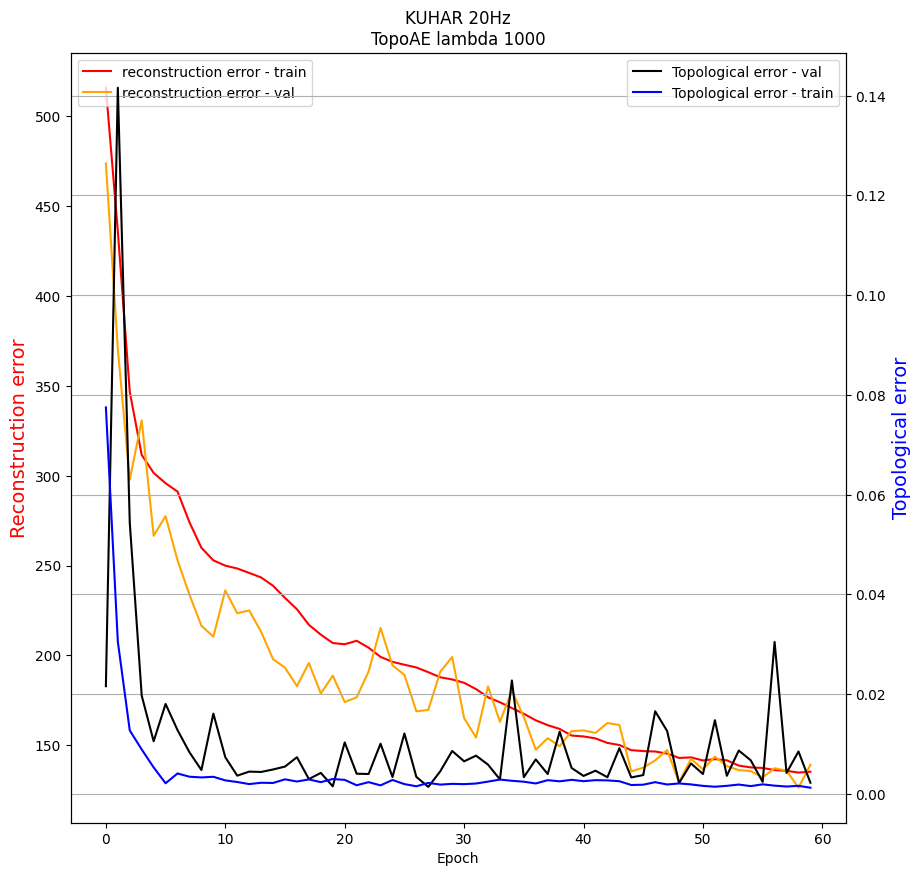

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:422.2660, Loss-ae:419.6484, Loss-topo:0.0026
Epoch:2, P:10, Loss:336.0461, Loss-ae:304.1166, Loss-topo:0.0319
Epoch:3, P:10, Loss:293.0492, Loss-ae:262.5617, Loss-topo:0.0305
Epoch:4, P:10, Loss:298.3664, Loss-ae:290.9496, Loss-topo:0.0074
Epoch:5, P:9, Loss:335.0714, Loss-ae:309.8337, Loss-topo:0.0252
Epoch:6, P:8, Loss:254.3243, Loss-ae:245.5693, Loss-topo:0.0088
Epoch:7, P:10, Loss:273.5896, Loss-ae:256.5526, Loss-topo:0.0170
Epoch:8, P:9, Loss:229.7588, Loss-ae:224.6060, Loss-topo:0.0052
Epoch:9, P:10, Loss:218.6823, Loss-ae:215.4784, Loss-topo:0.0032
Epoch:10, P:10, Loss:229.9776, Loss-ae:225.6650, Loss-topo:0.0043
Epoch:11, P:9, Loss:223.7279, Loss-ae:221.0395, Loss-topo:0.0027
Epoch:12, P:8, Loss:247.6548, Loss-ae:245.2479, Loss-topo:0.0024
Epoch:13, P:7, Loss:223.3268, Loss-ae:219.4056, Loss-topo:0.0039
Epoch:14, P:6, Loss:225.552

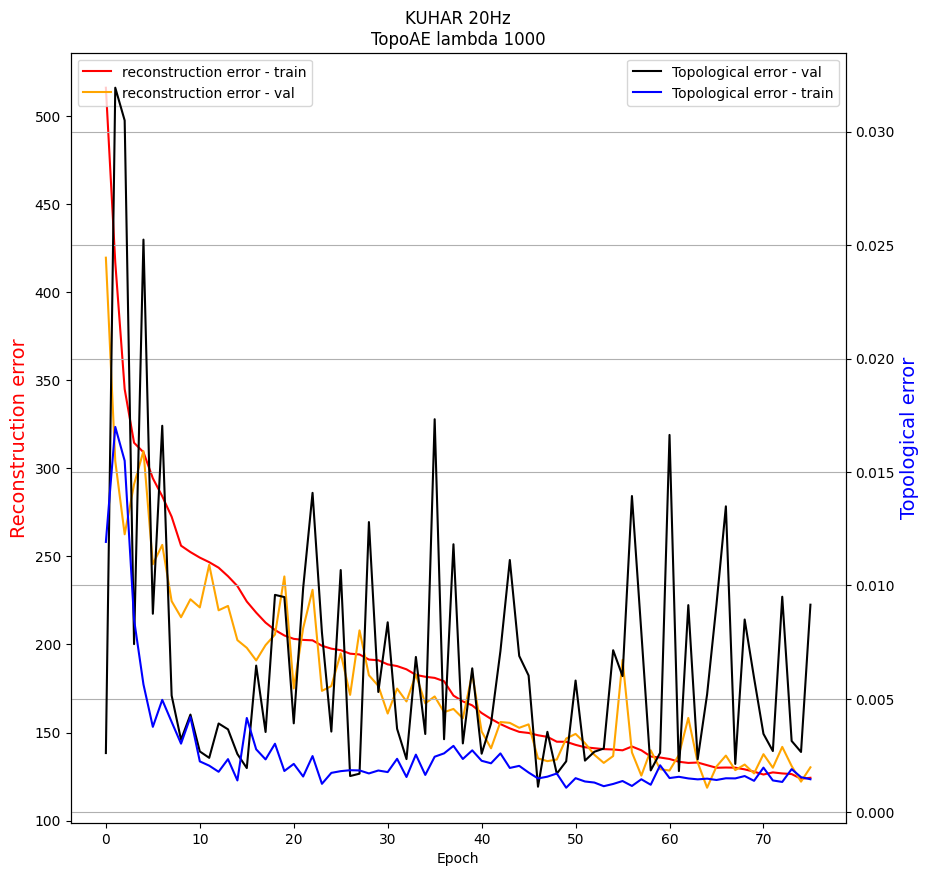

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:437.0109, Loss-ae:421.2795, Loss-topo:0.0157
Epoch:2, P:10, Loss:371.6385, Loss-ae:316.9046, Loss-topo:0.0547
Epoch:3, P:10, Loss:305.1794, Loss-ae:278.3315, Loss-topo:0.0268
Epoch:4, P:10, Loss:264.3547, Loss-ae:251.8410, Loss-topo:0.0125
Epoch:5, P:10, Loss:256.9963, Loss-ae:248.7871, Loss-topo:0.0082
Epoch:6, P:10, Loss:327.7793, Loss-ae:266.5139, Loss-topo:0.0613
Epoch:7, P:9, Loss:279.3201, Loss-ae:261.9987, Loss-topo:0.0173
Epoch:8, P:8, Loss:258.4428, Loss-ae:249.7736, Loss-topo:0.0087
Epoch:9, P:7, Loss:268.4824, Loss-ae:249.5889, Loss-topo:0.0189
Epoch:10, P:6, Loss:225.9194, Loss-ae:223.8552, Loss-topo:0.0021
Epoch:11, P:10, Loss:284.7667, Loss-ae:277.6799, Loss-topo:0.0071
Epoch:12, P:9, Loss:233.9086, Loss-ae:221.7336, Loss-topo:0.0122
Epoch:13, P:8, Loss:249.3289, Loss-ae:211.3100, Loss-topo:0.0380
Epoch:14, P:7, Loss:201.992

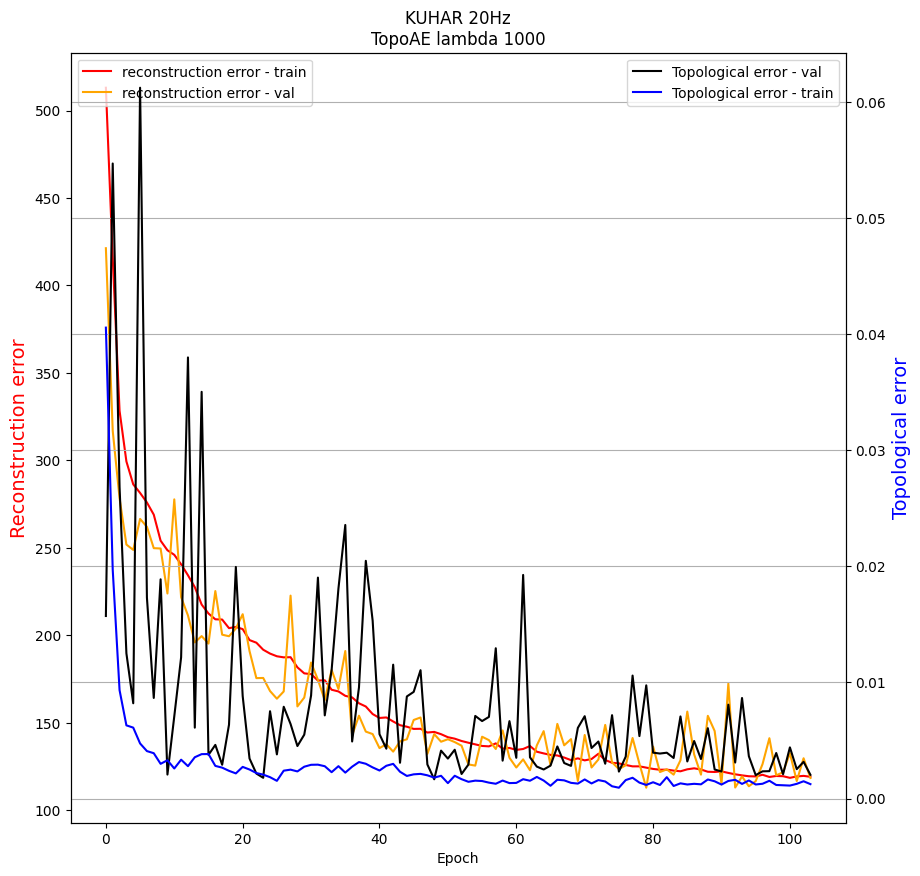

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:430.4220, Loss-ae:414.4506, Loss-topo:0.0160
Epoch:2, P:10, Loss:379.8667, Loss-ae:360.6197, Loss-topo:0.0192
Epoch:3, P:10, Loss:379.4692, Loss-ae:331.8624, Loss-topo:0.0476
Epoch:4, P:10, Loss:282.6682, Loss-ae:257.7311, Loss-topo:0.0249
Epoch:5, P:10, Loss:265.8219, Loss-ae:249.0950, Loss-topo:0.0167
Epoch:6, P:10, Loss:276.5565, Loss-ae:267.4032, Loss-topo:0.0092
Epoch:7, P:9, Loss:293.9711, Loss-ae:263.9422, Loss-topo:0.0300
Epoch:8, P:8, Loss:272.2930, Loss-ae:259.4450, Loss-topo:0.0128
Epoch:9, P:7, Loss:216.7051, Loss-ae:211.9891, Loss-topo:0.0047
Epoch:10, P:10, Loss:233.4198, Loss-ae:227.0107, Loss-topo:0.0064
Epoch:11, P:9, Loss:222.9376, Loss-ae:217.5413, Loss-topo:0.0054
Epoch:12, P:8, Loss:220.0856, Loss-ae:213.0858, Loss-topo:0.0070
Epoch:13, P:7, Loss:226.3879, Loss-ae:220.8426, Loss-topo:0.0055
Epoch:14, P:6, Loss:248.323

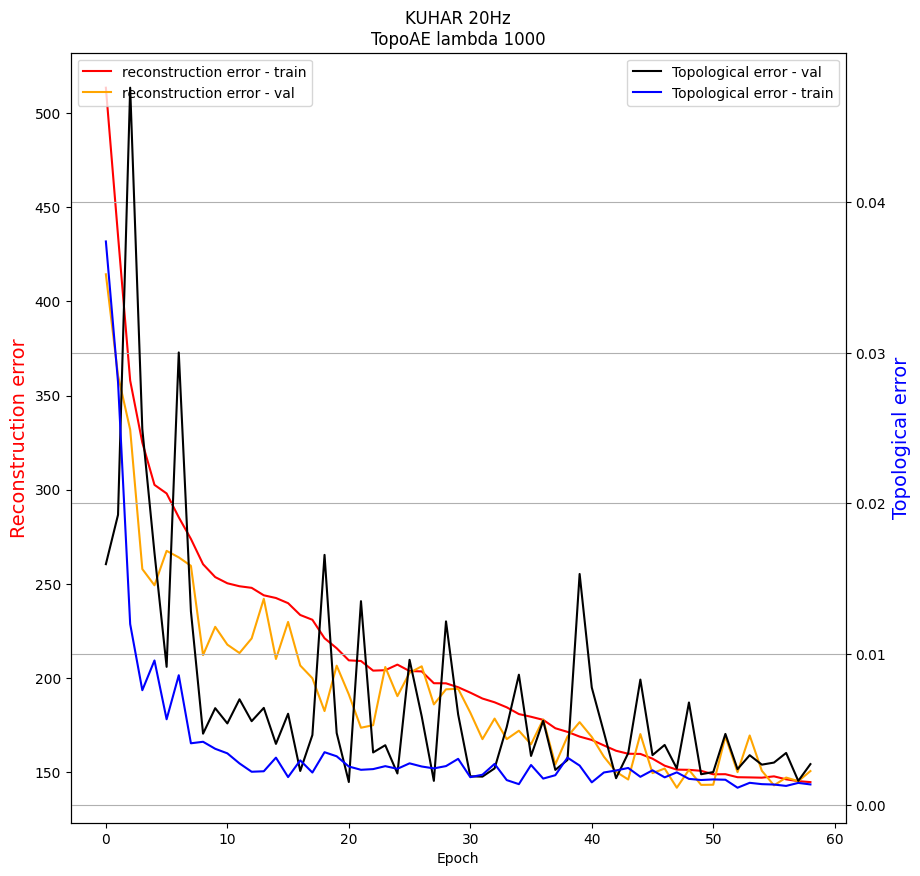

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:449.4740, Loss-ae:430.7972, Loss-topo:0.0187
Epoch:2, P:10, Loss:349.5582, Loss-ae:338.6027, Loss-topo:0.0110
Epoch:3, P:10, Loss:367.0239, Loss-ae:338.5370, Loss-topo:0.0285
Epoch:4, P:9, Loss:278.3873, Loss-ae:275.1436, Loss-topo:0.0032
Epoch:5, P:10, Loss:271.0453, Loss-ae:268.6621, Loss-topo:0.0024
Epoch:6, P:10, Loss:313.1309, Loss-ae:306.4068, Loss-topo:0.0067
Epoch:7, P:9, Loss:242.3421, Loss-ae:236.6687, Loss-topo:0.0057
Epoch:8, P:10, Loss:265.9887, Loss-ae:251.0033, Loss-topo:0.0150
Epoch:9, P:9, Loss:223.0919, Loss-ae:219.4208, Loss-topo:0.0037
Epoch:10, P:10, Loss:260.9853, Loss-ae:244.6189, Loss-topo:0.0164
Epoch:11, P:9, Loss:212.1323, Loss-ae:209.6935, Loss-topo:0.0024
Epoch:12, P:10, Loss:256.1946, Loss-ae:235.1951, Loss-topo:0.0210
Epoch:13, P:9, Loss:273.1460, Loss-ae:248.0402, Loss-topo:0.0251
Epoch:14, P:8, Loss:211.40

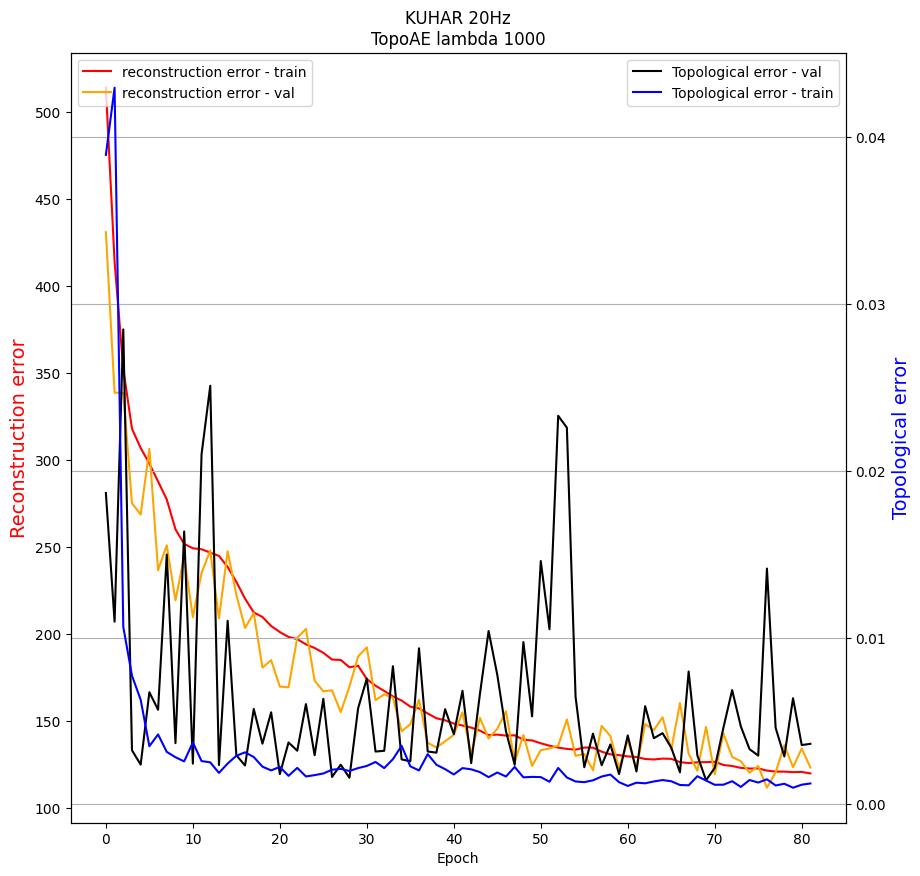

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:430.8794, Loss-ae:406.9146, Loss-topo:0.0240
Epoch:2, P:10, Loss:364.5029, Loss-ae:333.9982, Loss-topo:0.0305
Epoch:3, P:10, Loss:305.3263, Loss-ae:280.3041, Loss-topo:0.0250
Epoch:4, P:10, Loss:297.6013, Loss-ae:245.8715, Loss-topo:0.0517
Epoch:5, P:10, Loss:259.3068, Loss-ae:253.8919, Loss-topo:0.0054
Epoch:6, P:10, Loss:258.7377, Loss-ae:249.4097, Loss-topo:0.0093
Epoch:7, P:10, Loss:227.8504, Loss-ae:219.0509, Loss-topo:0.0088
Epoch:8, P:10, Loss:228.1066, Loss-ae:220.2374, Loss-topo:0.0079
Epoch:9, P:9, Loss:218.0675, Loss-ae:210.9884, Loss-topo:0.0071
Epoch:10, P:10, Loss:218.0875, Loss-ae:215.6955, Loss-topo:0.0024
Epoch:11, P:9, Loss:215.2027, Loss-ae:212.3853, Loss-topo:0.0028
Epoch:12, P:10, Loss:227.5721, Loss-ae:219.2356, Loss-topo:0.0083
Epoch:13, P:9, Loss:205.7594, Loss-ae:203.1507, Loss-topo:0.0026
Epoch:14, P:10, Loss:204

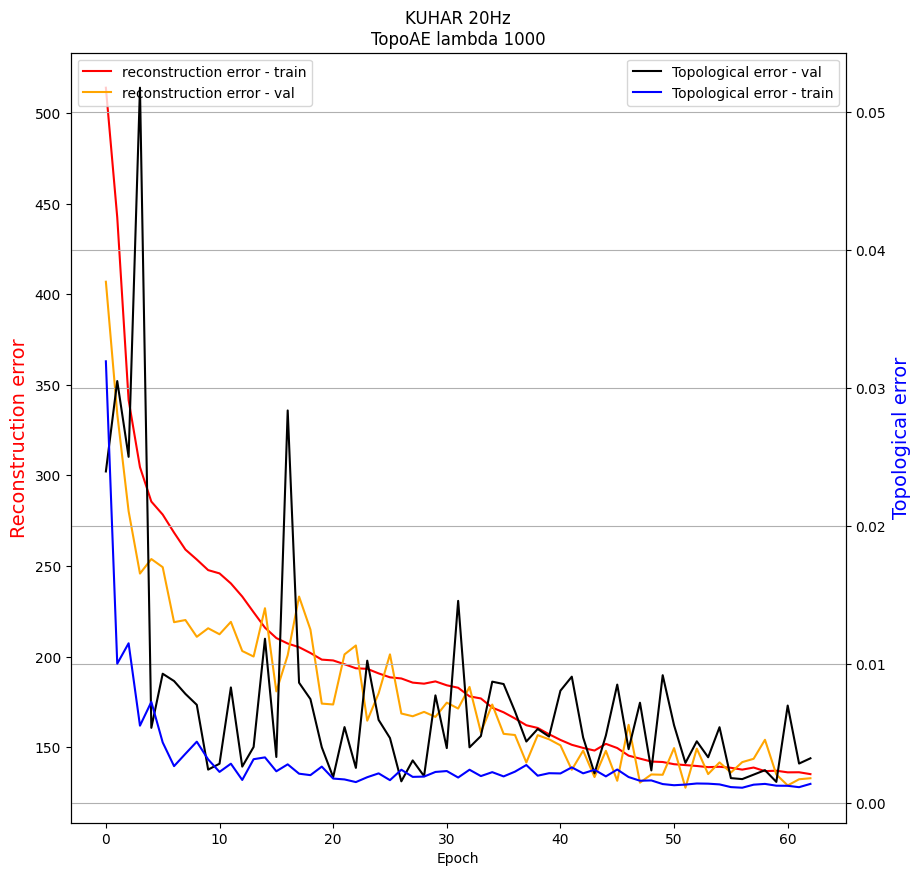

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 2
Epoch:1, P:10, Loss:467.3137, Loss-ae:461.5586, Loss-topo:0.0058
Epoch:2, P:10, Loss:321.4352, Loss-ae:296.1010, Loss-topo:0.0253
Epoch:3, P:10, Loss:367.8722, Loss-ae:275.8765, Loss-topo:0.0920
Epoch:4, P:9, Loss:256.1535, Loss-ae:242.9931, Loss-topo:0.0132
Epoch:5, P:10, Loss:264.7052, Loss-ae:256.0684, Loss-topo:0.0086
Epoch:6, P:9, Loss:260.7544, Loss-ae:251.4350, Loss-topo:0.0093
Epoch:7, P:8, Loss:242.9239, Loss-ae:239.2919, Loss-topo:0.0036
Epoch:8, P:10, Loss:242.4593, Loss-ae:236.7236, Loss-topo:0.0057
Epoch:9, P:10, Loss:245.2340, Loss-ae:242.2879, Loss-topo:0.0029
Epoch:10, P:9, Loss:225.2547, Loss-ae:222.6253, Loss-topo:0.0026
Epoch:11, P:10, Loss:287.7317, Loss-ae:243.0546, Loss-topo:0.0447
Epoch:12, P:9, Loss:227.1250, Loss-ae:223.9606, Loss-topo:0.0032
Epoch:13, P:8, Loss:208.6085, Loss-ae:201.3948, Loss-topo:0.0072
Epoch:14, P:10, Loss:210.04

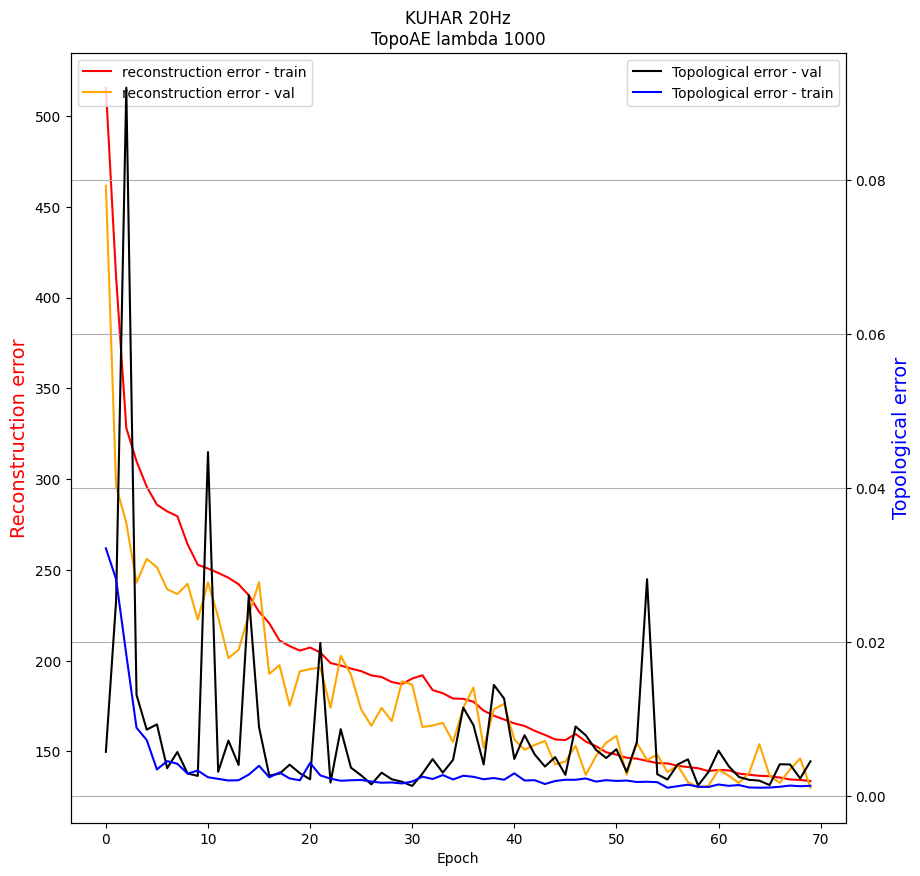

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:520.0845, Loss-ae:517.7758, Loss-topo:0.0023
Epoch:2, P:10, Loss:441.8721, Loss-ae:352.2600, Loss-topo:0.0896
Epoch:3, P:10, Loss:301.0818, Loss-ae:292.8526, Loss-topo:0.0082
Epoch:4, P:10, Loss:383.8429, Loss-ae:274.6742, Loss-topo:0.1092
Epoch:5, P:9, Loss:243.5133, Loss-ae:240.4422, Loss-topo:0.0031
Epoch:6, P:10, Loss:244.3250, Loss-ae:237.6160, Loss-topo:0.0067
Epoch:7, P:9, Loss:307.8736, Loss-ae:264.7090, Loss-topo:0.0432
Epoch:8, P:8, Loss:260.4331, Loss-ae:254.9680, Loss-topo:0.0055
Epoch:9, P:7, Loss:231.1722, Loss-ae:228.4232, Loss-topo:0.0027
Epoch:10, P:10, Loss:258.3981, Loss-ae:244.7882, Loss-topo:0.0136
Epoch:11, P:9, Loss:258.3381, Loss-ae:253.0098, Loss-topo:0.0053
Epoch:12, P:8, Loss:228.7010, Loss-ae:226.2056, Loss-topo:0.0025
Epoch:13, P:10, Loss:260.1253, Loss-ae:256.6382, Loss-topo:0.0035
Epoch:14, P:9, Loss:209.472

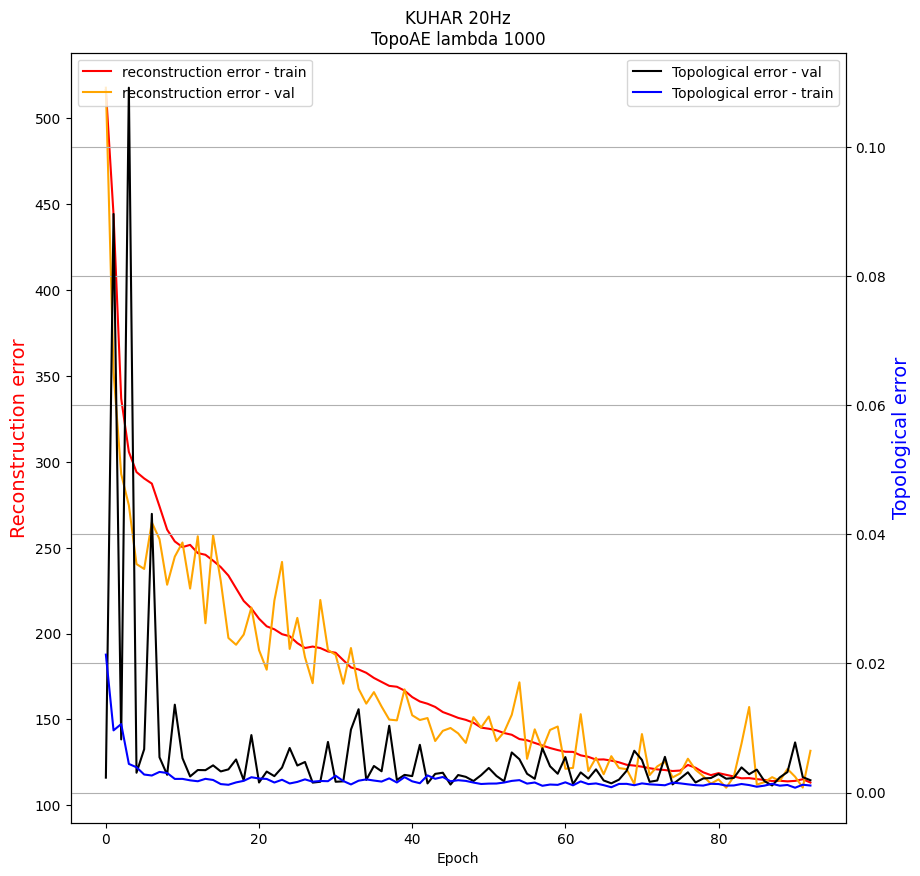

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:440.1424, Loss-ae:425.2006, Loss-topo:0.0149
Epoch:2, P:10, Loss:391.8048, Loss-ae:338.9179, Loss-topo:0.0529
Epoch:3, P:10, Loss:317.5311, Loss-ae:269.9608, Loss-topo:0.0476
Epoch:4, P:10, Loss:273.5900, Loss-ae:264.7709, Loss-topo:0.0088
Epoch:5, P:10, Loss:306.5410, Loss-ae:284.9100, Loss-topo:0.0216
Epoch:6, P:9, Loss:278.0732, Loss-ae:268.5419, Loss-topo:0.0095
Epoch:7, P:8, Loss:299.9718, Loss-ae:275.7064, Loss-topo:0.0243
Epoch:8, P:7, Loss:260.7328, Loss-ae:247.7249, Loss-topo:0.0130
Epoch:9, P:10, Loss:223.8485, Loss-ae:219.7206, Loss-topo:0.0041
Epoch:10, P:10, Loss:275.0792, Loss-ae:228.9507, Loss-topo:0.0461
Epoch:11, P:9, Loss:252.7876, Loss-ae:246.9583, Loss-topo:0.0058
Epoch:12, P:8, Loss:215.4424, Loss-ae:212.3802, Loss-topo:0.0031
Epoch:13, P:10, Loss:267.1686, Loss-ae:255.0522, Loss-topo:0.0121
Epoch:14, P:9, Loss:218.75

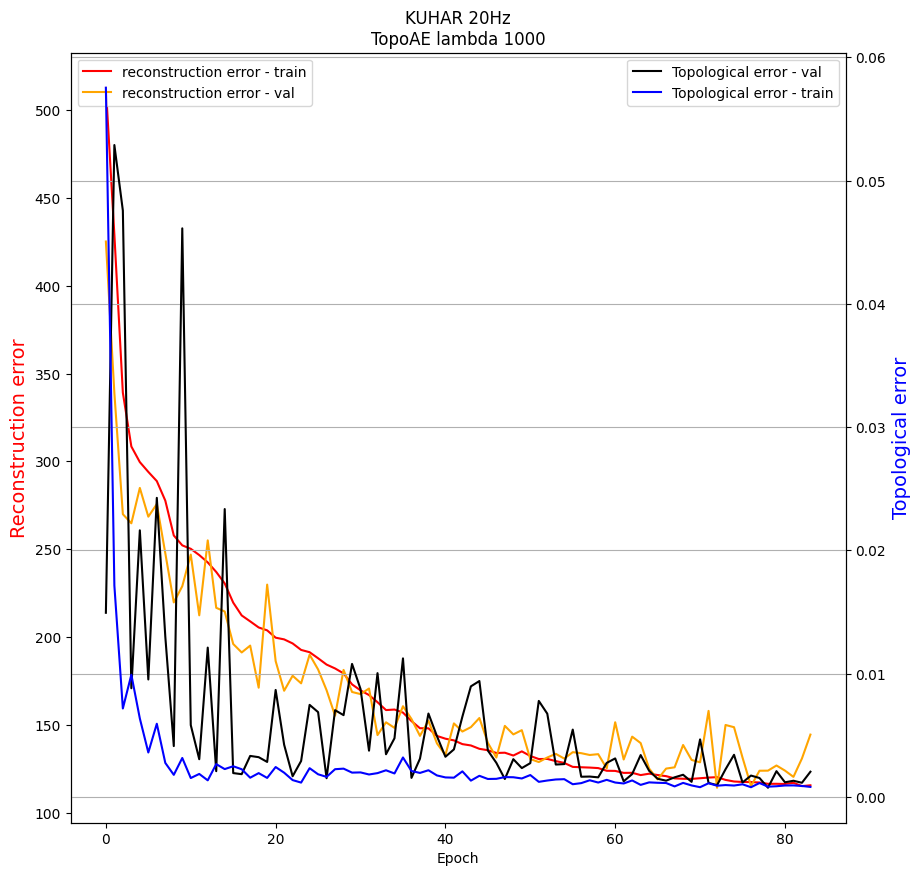

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:451.3935, Loss-ae:443.7720, Loss-topo:0.0076
Epoch:2, P:10, Loss:404.5919, Loss-ae:354.3509, Loss-topo:0.0502
Epoch:3, P:10, Loss:347.0522, Loss-ae:324.9154, Loss-topo:0.0221
Epoch:4, P:10, Loss:256.1332, Loss-ae:249.4939, Loss-topo:0.0066
Epoch:5, P:10, Loss:243.4041, Loss-ae:238.7095, Loss-topo:0.0047
Epoch:6, P:10, Loss:290.4287, Loss-ae:278.6483, Loss-topo:0.0118
Epoch:7, P:9, Loss:240.0265, Loss-ae:235.9015, Loss-topo:0.0041
Epoch:8, P:10, Loss:277.3765, Loss-ae:256.6370, Loss-topo:0.0207
Epoch:9, P:9, Loss:254.8973, Loss-ae:246.2842, Loss-topo:0.0086
Epoch:10, P:8, Loss:246.7987, Loss-ae:242.7709, Loss-topo:0.0040
Epoch:11, P:7, Loss:226.1063, Loss-ae:223.8862, Loss-topo:0.0022
Epoch:12, P:10, Loss:257.3807, Loss-ae:252.3932, Loss-topo:0.0050
Epoch:13, P:9, Loss:273.4793, Loss-ae:270.0537, Loss-topo:0.0034
Epoch:14, P:8, Loss:215.97

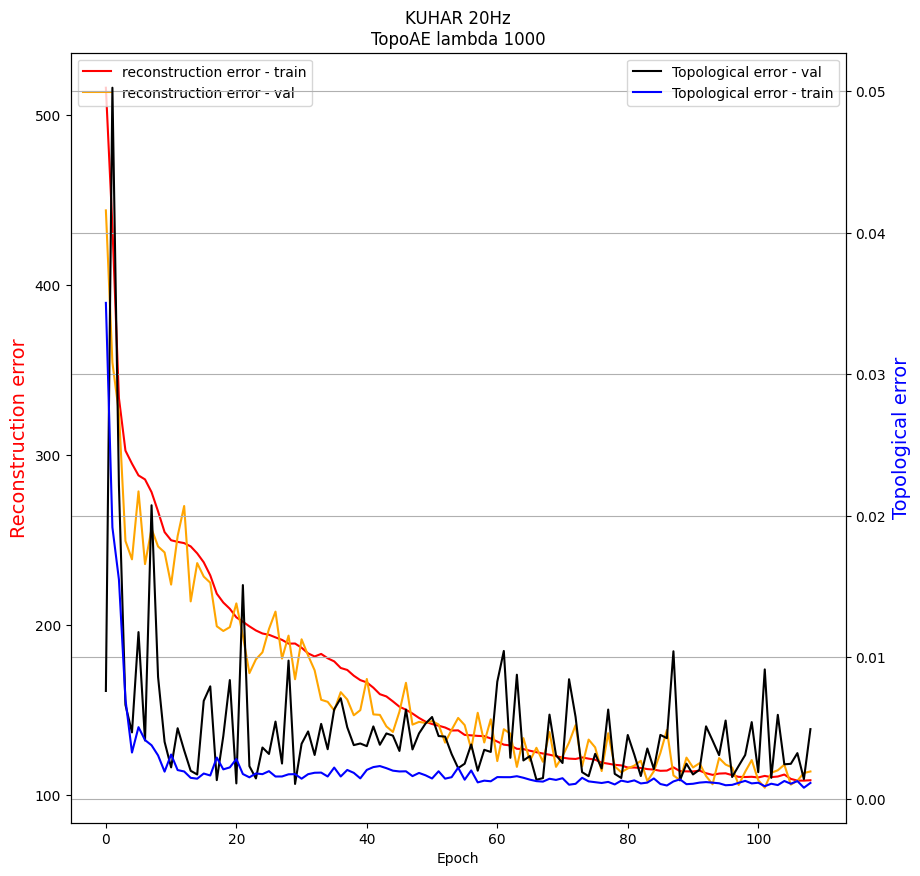

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:499.7359, Loss-ae:494.2215, Loss-topo:0.0055
Epoch:2, P:10, Loss:351.3122, Loss-ae:301.9041, Loss-topo:0.0494
Epoch:3, P:10, Loss:257.8753, Loss-ae:248.7447, Loss-topo:0.0091
Epoch:4, P:10, Loss:251.3691, Loss-ae:245.0739, Loss-topo:0.0063
Epoch:5, P:10, Loss:274.6280, Loss-ae:265.8577, Loss-topo:0.0088
Epoch:6, P:9, Loss:304.5141, Loss-ae:299.7330, Loss-topo:0.0048
Epoch:7, P:8, Loss:238.9204, Loss-ae:230.5036, Loss-topo:0.0084
Epoch:8, P:10, Loss:221.9791, Loss-ae:218.0056, Loss-topo:0.0040
Epoch:9, P:10, Loss:245.3863, Loss-ae:242.2705, Loss-topo:0.0031
Epoch:10, P:9, Loss:234.8811, Loss-ae:228.7513, Loss-topo:0.0061
Epoch:11, P:8, Loss:283.8096, Loss-ae:271.8698, Loss-topo:0.0119
Epoch:12, P:7, Loss:214.5463, Loss-ae:212.3073, Loss-topo:0.0022
Epoch:13, P:10, Loss:226.5531, Loss-ae:224.9100, Loss-topo:0.0016
Epoch:14, P:9, Loss:216.58

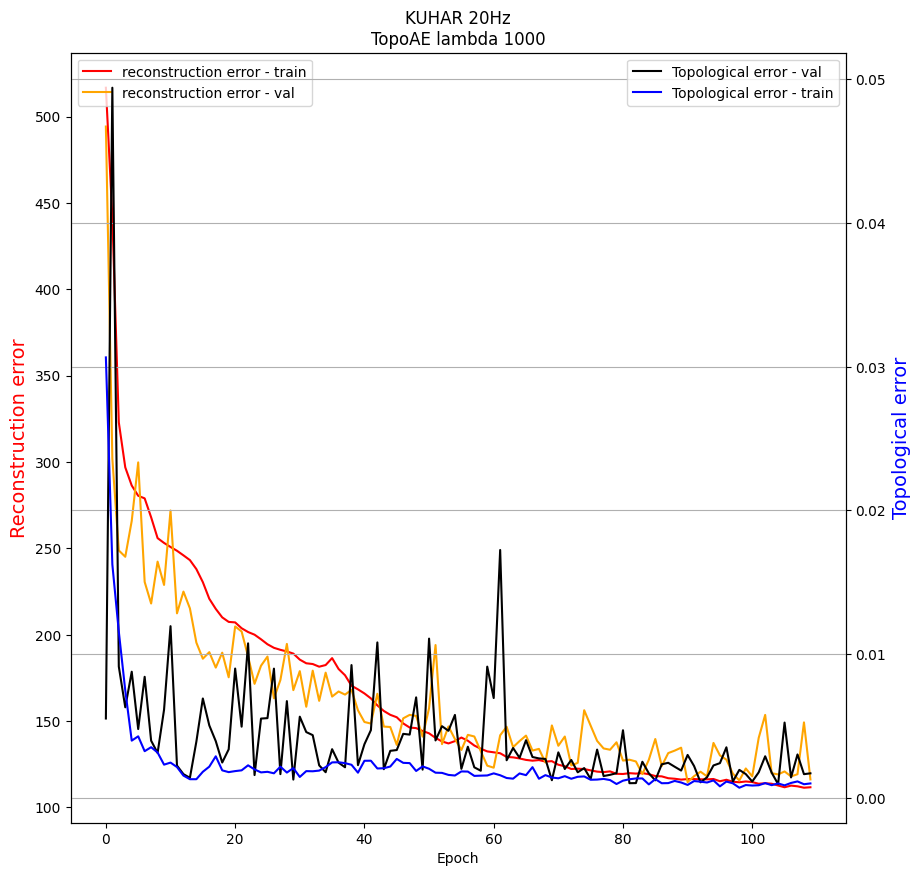

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:430.4483, Loss-ae:425.6955, Loss-topo:0.0048
Epoch:2, P:10, Loss:327.8915, Loss-ae:303.8842, Loss-topo:0.0240
Epoch:3, P:10, Loss:254.3439, Loss-ae:242.4315, Loss-topo:0.0119
Epoch:4, P:10, Loss:285.8667, Loss-ae:276.6921, Loss-topo:0.0092
Epoch:5, P:9, Loss:259.2488, Loss-ae:236.5978, Loss-topo:0.0227
Epoch:6, P:8, Loss:235.5039, Loss-ae:225.2590, Loss-topo:0.0102
Epoch:7, P:10, Loss:274.6894, Loss-ae:251.8259, Loss-topo:0.0229
Epoch:8, P:9, Loss:251.1246, Loss-ae:242.3235, Loss-topo:0.0088
Epoch:9, P:8, Loss:262.2144, Loss-ae:258.5076, Loss-topo:0.0037
Epoch:10, P:7, Loss:230.0131, Loss-ae:228.6523, Loss-topo:0.0014
Epoch:11, P:10, Loss:216.5142, Loss-ae:213.5188, Loss-topo:0.0030
Epoch:12, P:10, Loss:250.8197, Loss-ae:242.6626, Loss-topo:0.0082
Epoch:13, P:9, Loss:211.2058, Loss-ae:208.5543, Loss-topo:0.0027
Epoch:14, P:10, Loss:243.84

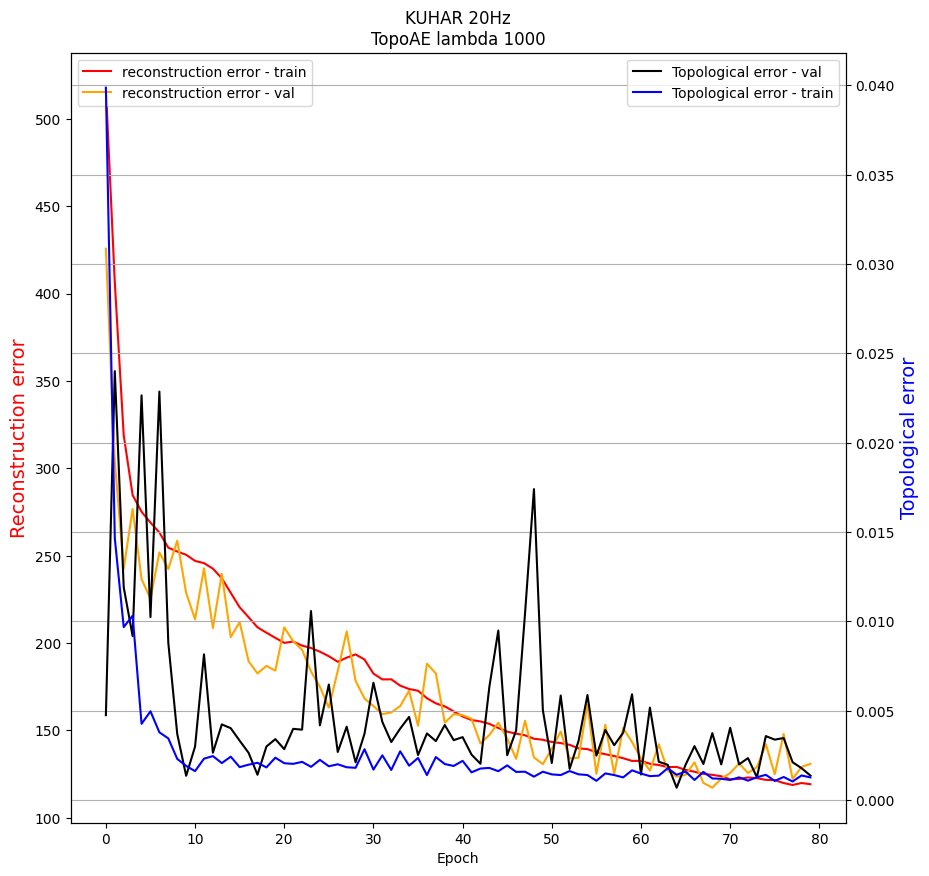

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:464.6058, Loss-ae:445.9850, Loss-topo:0.0186
Epoch:2, P:10, Loss:329.9259, Loss-ae:301.4294, Loss-topo:0.0285
Epoch:3, P:10, Loss:266.9341, Loss-ae:258.0492, Loss-topo:0.0089
Epoch:4, P:10, Loss:300.1030, Loss-ae:271.3162, Loss-topo:0.0288
Epoch:5, P:9, Loss:317.3254, Loss-ae:307.8519, Loss-topo:0.0095
Epoch:6, P:8, Loss:247.7652, Loss-ae:239.2640, Loss-topo:0.0085
Epoch:7, P:10, Loss:239.8277, Loss-ae:237.3628, Loss-topo:0.0025
Epoch:8, P:10, Loss:224.1813, Loss-ae:221.8370, Loss-topo:0.0023
Epoch:9, P:10, Loss:219.3600, Loss-ae:216.8649, Loss-topo:0.0025
Epoch:10, P:10, Loss:236.2674, Loss-ae:233.5905, Loss-topo:0.0027
Epoch:11, P:9, Loss:240.5543, Loss-ae:230.3556, Loss-topo:0.0102
Epoch:12, P:8, Loss:230.4436, Loss-ae:228.5983, Loss-topo:0.0018
Epoch:13, P:7, Loss:246.0283, Loss-ae:229.2231, Loss-topo:0.0168
Epoch:14, P:6, Loss:230.06

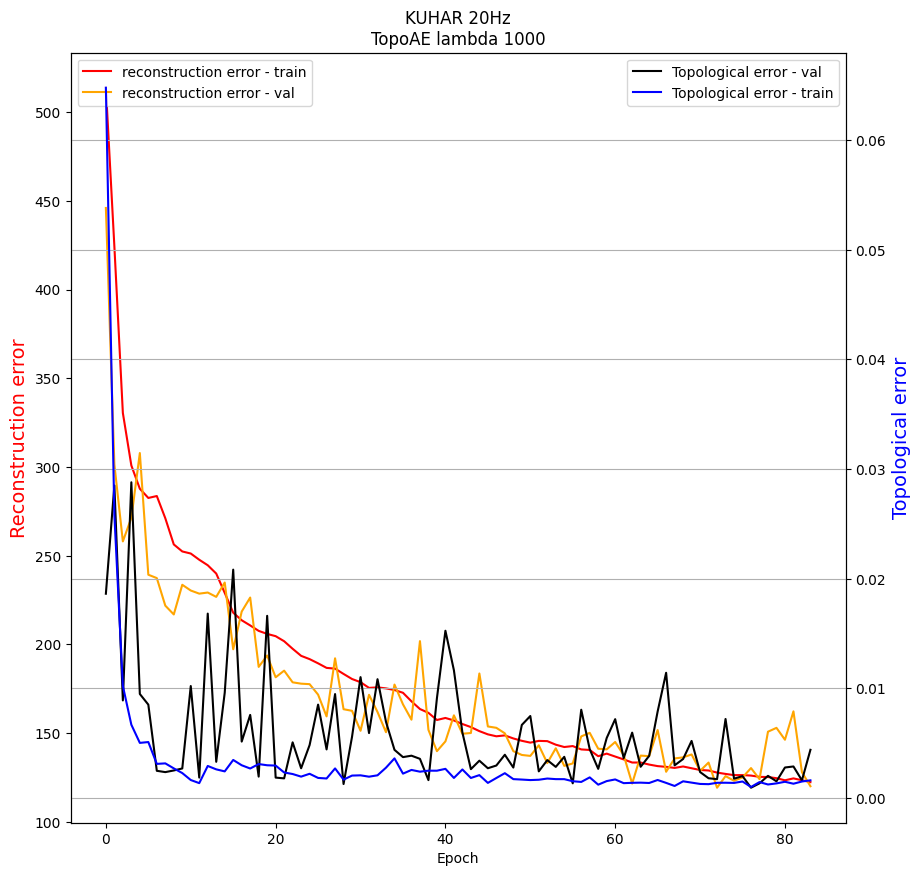

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:532.6511, Loss-ae:517.2157, Loss-topo:0.0154
Epoch:2, P:10, Loss:390.1411, Loss-ae:361.0342, Loss-topo:0.0291
Epoch:3, P:10, Loss:303.1024, Loss-ae:280.1749, Loss-topo:0.0229
Epoch:4, P:10, Loss:273.0436, Loss-ae:265.5394, Loss-topo:0.0075
Epoch:5, P:10, Loss:297.5888, Loss-ae:284.8952, Loss-topo:0.0127
Epoch:6, P:9, Loss:292.2512, Loss-ae:286.5487, Loss-topo:0.0057
Epoch:7, P:8, Loss:308.8385, Loss-ae:269.3460, Loss-topo:0.0395
Epoch:8, P:7, Loss:277.0447, Loss-ae:273.1318, Loss-topo:0.0039
Epoch:9, P:6, Loss:252.1322, Loss-ae:243.7003, Loss-topo:0.0084
Epoch:10, P:10, Loss:226.0543, Loss-ae:224.4812, Loss-topo:0.0016
Epoch:11, P:10, Loss:228.7669, Loss-ae:225.6050, Loss-topo:0.0032
Epoch:12, P:9, Loss:227.8387, Loss-ae:226.4341, Loss-topo:0.0014
Epoch:13, P:8, Loss:243.0914, Loss-ae:233.8908, Loss-topo:0.0092
Epoch:14, P:7, Loss:242.057

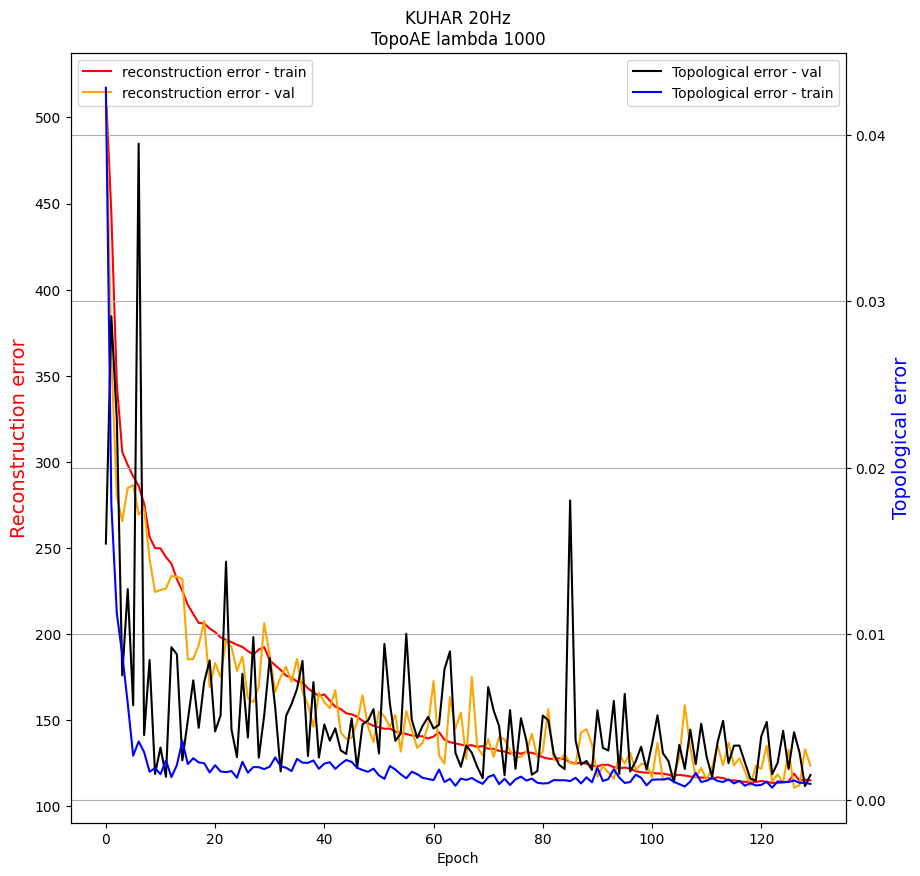

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:514.0902, Loss-ae:499.3708, Loss-topo:0.0147
Epoch:2, P:10, Loss:332.7603, Loss-ae:305.1582, Loss-topo:0.0276
Epoch:3, P:10, Loss:327.5155, Loss-ae:287.2446, Loss-topo:0.0403
Epoch:4, P:10, Loss:371.1260, Loss-ae:255.3705, Loss-topo:0.1158
Epoch:5, P:9, Loss:309.4649, Loss-ae:296.4805, Loss-topo:0.0130
Epoch:6, P:10, Loss:253.7609, Loss-ae:248.9033, Loss-topo:0.0049
Epoch:7, P:10, Loss:246.4081, Loss-ae:243.0404, Loss-topo:0.0034
Epoch:8, P:10, Loss:274.1433, Loss-ae:258.0980, Loss-topo:0.0160
Epoch:9, P:9, Loss:251.0069, Loss-ae:227.7725, Loss-topo:0.0232
Epoch:10, P:8, Loss:243.1908, Loss-ae:242.1391, Loss-topo:0.0011
Epoch:11, P:10, Loss:218.5420, Loss-ae:213.3486, Loss-topo:0.0052
Epoch:12, P:10, Loss:219.6166, Loss-ae:216.8685, Loss-topo:0.0027
Epoch:13, P:9, Loss:209.7770, Loss-ae:207.6010, Loss-topo:0.0022
Epoch:14, P:10, Loss:227.

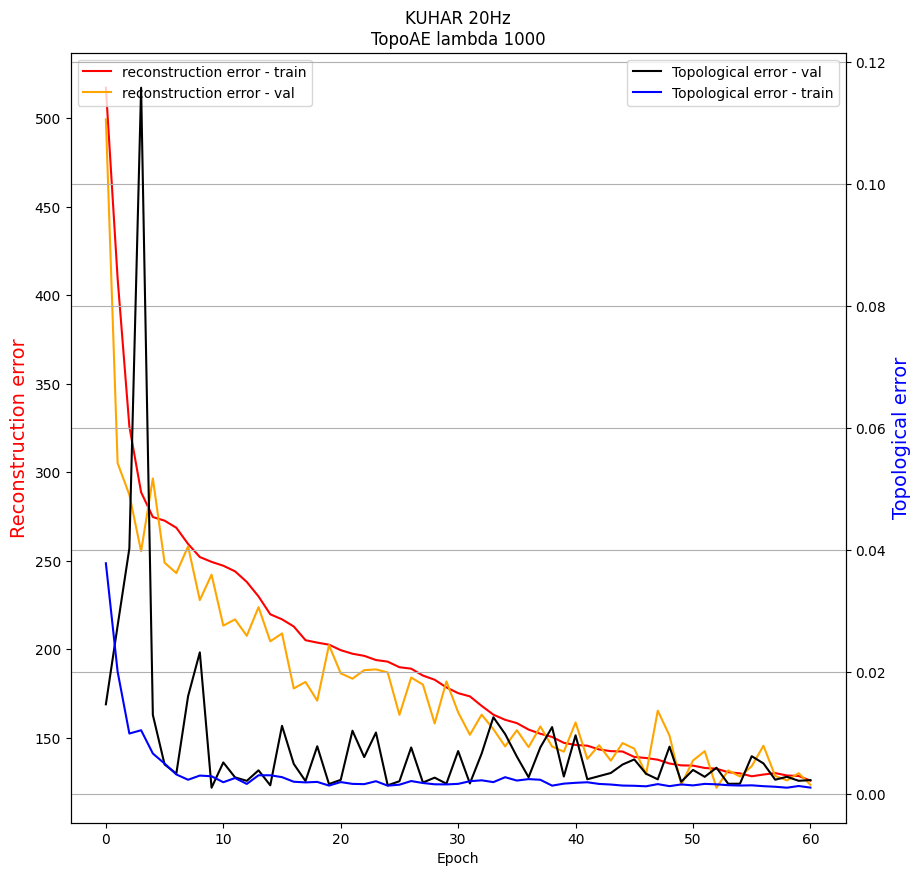

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:472.6992, Loss-ae:456.2097, Loss-topo:0.0165
Epoch:2, P:10, Loss:418.6472, Loss-ae:367.1105, Loss-topo:0.0515
Epoch:3, P:10, Loss:325.7891, Loss-ae:312.6462, Loss-topo:0.0131
Epoch:4, P:10, Loss:342.7936, Loss-ae:322.9620, Loss-topo:0.0198
Epoch:5, P:9, Loss:276.0243, Loss-ae:264.4732, Loss-topo:0.0116
Epoch:6, P:10, Loss:303.7857, Loss-ae:291.0086, Loss-topo:0.0128
Epoch:7, P:9, Loss:237.4345, Loss-ae:232.6979, Loss-topo:0.0047
Epoch:8, P:10, Loss:236.6025, Loss-ae:223.5595, Loss-topo:0.0130
Epoch:9, P:10, Loss:226.5533, Loss-ae:216.1073, Loss-topo:0.0104
Epoch:10, P:10, Loss:236.9212, Loss-ae:234.7458, Loss-topo:0.0022
Epoch:11, P:9, Loss:247.7705, Loss-ae:228.3737, Loss-topo:0.0194
Epoch:12, P:8, Loss:269.5819, Loss-ae:263.3341, Loss-topo:0.0062
Epoch:13, P:7, Loss:223.5292, Loss-ae:221.3921, Loss-topo:0.0021
Epoch:14, P:10, Loss:226.1

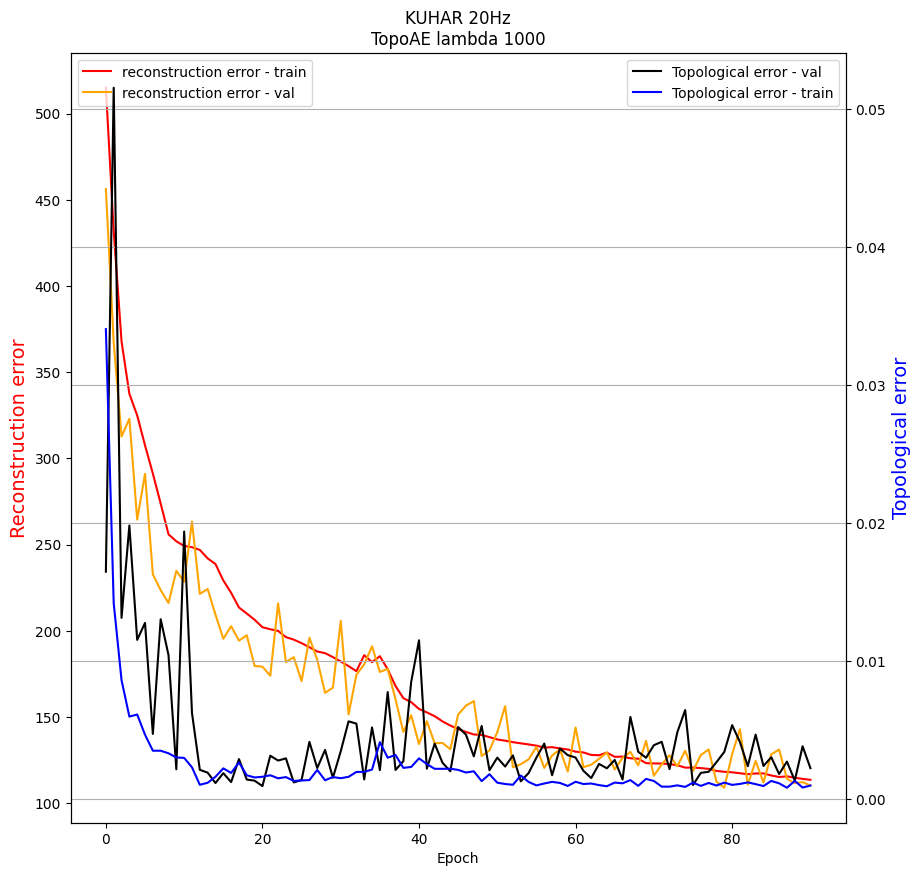

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 3
Epoch:1, P:10, Loss:462.9724, Loss-ae:451.1663, Loss-topo:0.0118
Epoch:2, P:10, Loss:450.2114, Loss-ae:383.5780, Loss-topo:0.0666
Epoch:3, P:10, Loss:315.2809, Loss-ae:297.4143, Loss-topo:0.0179
Epoch:4, P:10, Loss:298.7252, Loss-ae:286.8807, Loss-topo:0.0118
Epoch:5, P:10, Loss:262.6221, Loss-ae:256.7404, Loss-topo:0.0059
Epoch:6, P:10, Loss:299.6270, Loss-ae:263.6802, Loss-topo:0.0359
Epoch:7, P:9, Loss:248.8102, Loss-ae:240.5835, Loss-topo:0.0082
Epoch:8, P:10, Loss:286.3399, Loss-ae:276.8535, Loss-topo:0.0095
Epoch:9, P:9, Loss:239.3414, Loss-ae:229.8100, Loss-topo:0.0095
Epoch:10, P:10, Loss:214.2301, Loss-ae:210.8306, Loss-topo:0.0034
Epoch:11, P:10, Loss:230.9212, Loss-ae:224.0595, Loss-topo:0.0069
Epoch:12, P:9, Loss:217.5160, Loss-ae:210.0598, Loss-topo:0.0075
Epoch:13, P:8, Loss:221.0532, Loss-ae:216.6822, Loss-topo:0.0044
Epoch:14, P:7, Loss:247.7

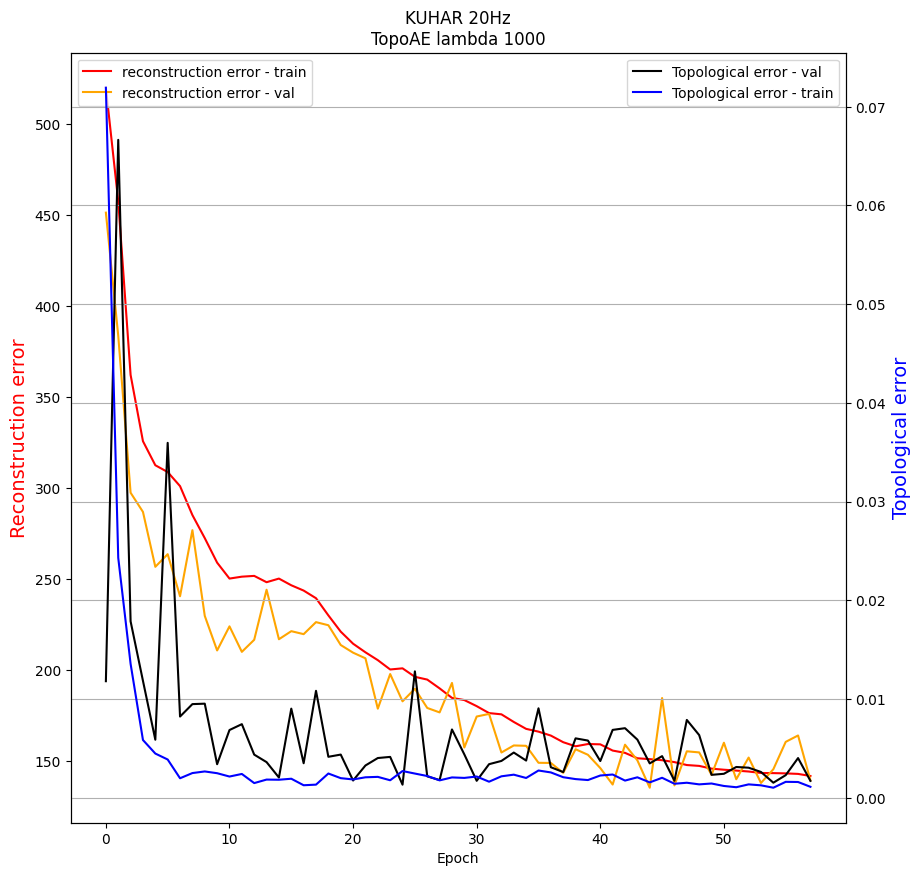

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:529.4491, Loss-ae:501.0751, Loss-topo:0.0284
Epoch:2, P:10, Loss:482.2466, Loss-ae:434.1641, Loss-topo:0.0481
Epoch:3, P:10, Loss:359.0805, Loss-ae:329.1706, Loss-topo:0.0299
Epoch:4, P:10, Loss:326.5540, Loss-ae:309.9706, Loss-topo:0.0166
Epoch:5, P:10, Loss:260.9620, Loss-ae:253.5083, Loss-topo:0.0075
Epoch:6, P:10, Loss:251.4547, Loss-ae:247.0497, Loss-topo:0.0044
Epoch:7, P:10, Loss:261.7012, Loss-ae:249.3548, Loss-topo:0.0123
Epoch:8, P:9, Loss:236.2535, Loss-ae:230.8669, Loss-topo:0.0054
Epoch:9, P:10, Loss:231.8752, Loss-ae:222.9653, Loss-topo:0.0089
Epoch:10, P:10, Loss:231.5640, Loss-ae:228.5936, Loss-topo:0.0030
Epoch:11, P:10, Loss:272.9131, Loss-ae:271.5730, Loss-topo:0.0013
Epoch:12, P:9, Loss:208.4419, Loss-ae:203.7823, Loss-topo:0.0047
Epoch:13, P:10, Loss:217.7060, Loss-ae:216.6250, Loss-topo:0.0011
Epoch:14, P:9, Loss:216

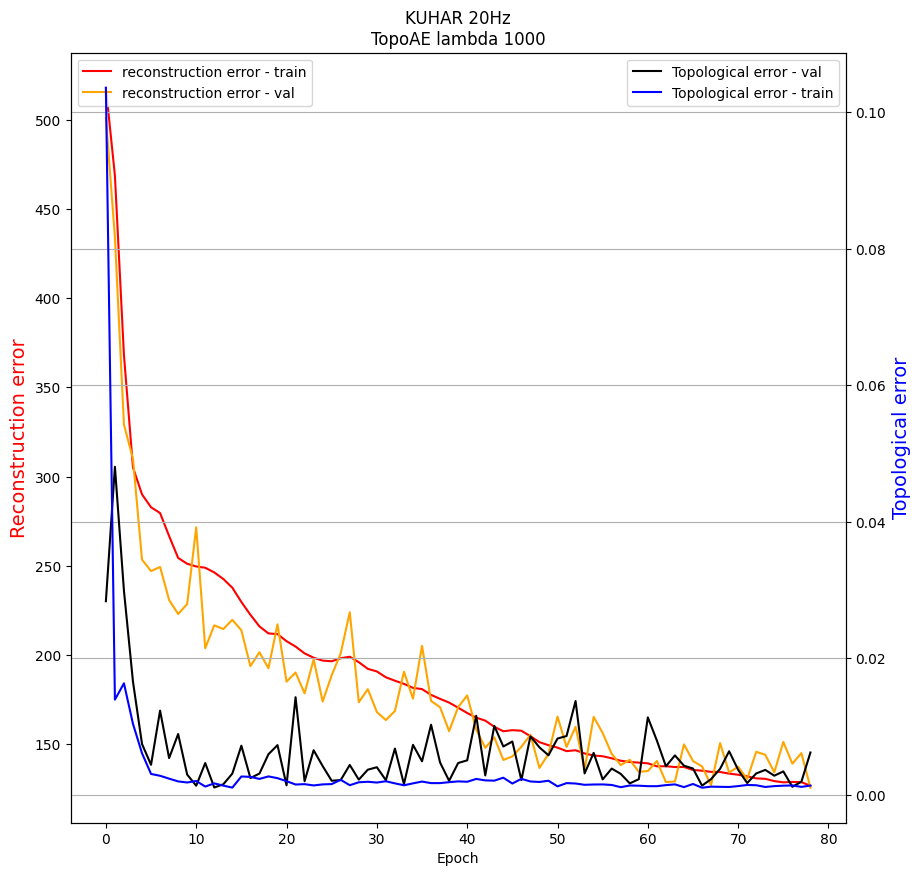

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:532.1201, Loss-ae:529.2507, Loss-topo:0.0029
Epoch:2, P:10, Loss:390.1619, Loss-ae:360.5984, Loss-topo:0.0296
Epoch:3, P:10, Loss:271.0321, Loss-ae:256.4161, Loss-topo:0.0146
Epoch:4, P:10, Loss:317.9451, Loss-ae:285.3783, Loss-topo:0.0326
Epoch:5, P:9, Loss:266.6475, Loss-ae:263.5223, Loss-topo:0.0031
Epoch:6, P:10, Loss:254.2299, Loss-ae:252.3241, Loss-topo:0.0019
Epoch:7, P:10, Loss:247.5724, Loss-ae:246.4888, Loss-topo:0.0011
Epoch:8, P:10, Loss:267.7217, Loss-ae:263.1411, Loss-topo:0.0046
Epoch:9, P:9, Loss:253.5398, Loss-ae:244.9088, Loss-topo:0.0086
Epoch:10, P:8, Loss:243.8630, Loss-ae:240.8166, Loss-topo:0.0030
Epoch:11, P:10, Loss:247.8210, Loss-ae:242.2155, Loss-topo:0.0056
Epoch:12, P:9, Loss:210.3818, Loss-ae:206.6680, Loss-topo:0.0037
Epoch:13, P:10, Loss:239.7446, Loss-ae:235.0508, Loss-topo:0.0047
Epoch:14, P:9, Loss:242.7

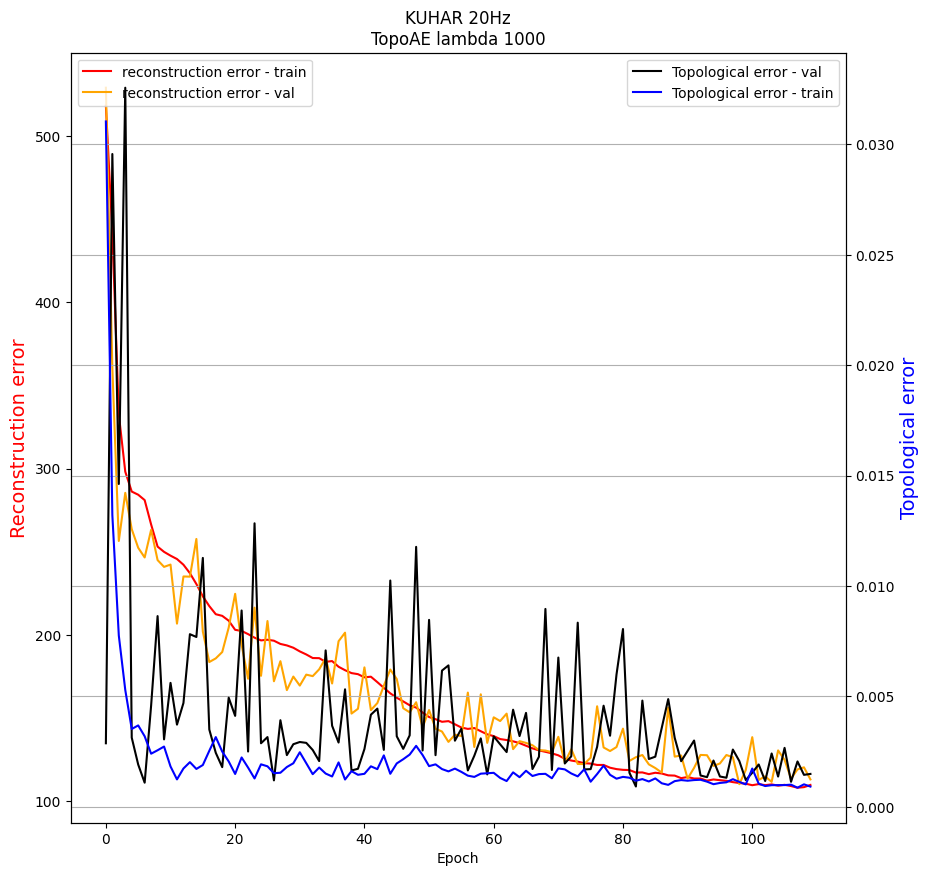

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:427.0262, Loss-ae:420.3532, Loss-topo:0.0067
Epoch:2, P:10, Loss:451.4162, Loss-ae:348.1979, Loss-topo:0.1032
Epoch:3, P:9, Loss:301.7233, Loss-ae:289.8997, Loss-topo:0.0118
Epoch:4, P:10, Loss:323.8279, Loss-ae:296.6598, Loss-topo:0.0272
Epoch:5, P:9, Loss:261.9977, Loss-ae:256.0141, Loss-topo:0.0060
Epoch:6, P:10, Loss:248.4155, Loss-ae:244.8316, Loss-topo:0.0036
Epoch:7, P:10, Loss:276.5813, Loss-ae:245.7798, Loss-topo:0.0308
Epoch:8, P:9, Loss:236.7306, Loss-ae:230.9343, Loss-topo:0.0058
Epoch:9, P:10, Loss:227.0484, Loss-ae:224.3695, Loss-topo:0.0027
Epoch:10, P:10, Loss:243.9956, Loss-ae:241.6912, Loss-topo:0.0023
Epoch:11, P:9, Loss:218.6044, Loss-ae:216.7293, Loss-topo:0.0019
Epoch:12, P:10, Loss:218.8739, Loss-ae:212.9136, Loss-topo:0.0060
Epoch:13, P:9, Loss:233.5632, Loss-ae:230.2419, Loss-topo:0.0033
Epoch:14, P:8, Loss:233.09

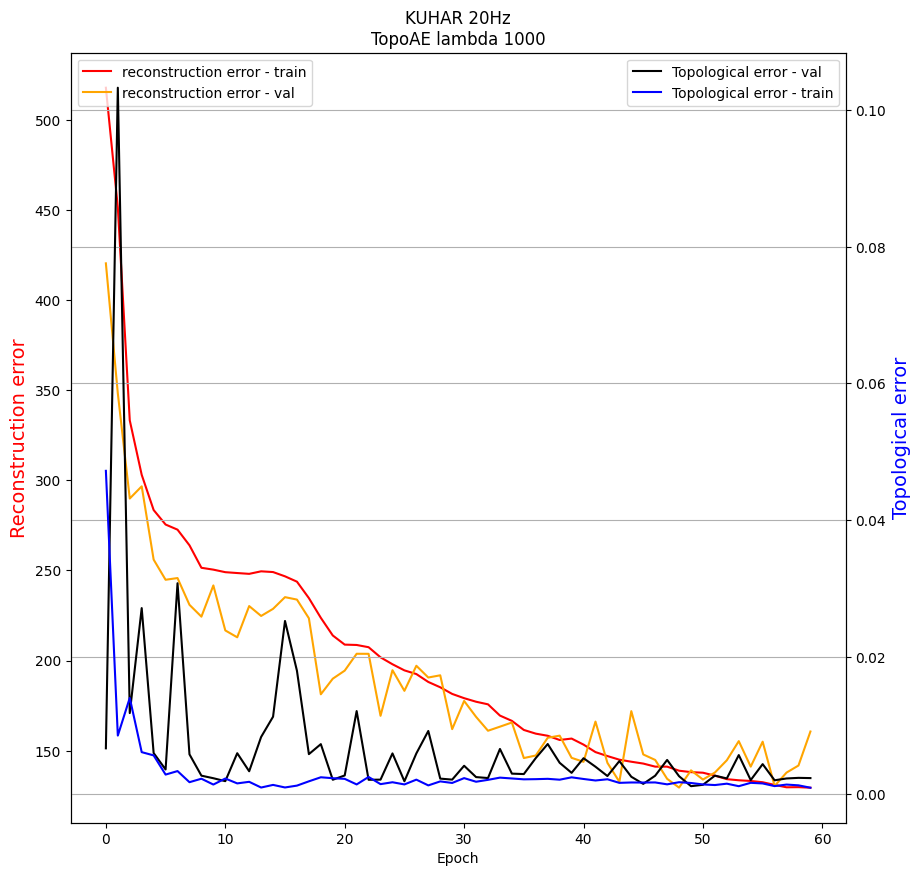

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:509.6448, Loss-ae:482.0195, Loss-topo:0.0276
Epoch:2, P:10, Loss:314.5542, Loss-ae:303.6540, Loss-topo:0.0109
Epoch:3, P:10, Loss:358.0661, Loss-ae:324.2073, Loss-topo:0.0339
Epoch:4, P:9, Loss:253.5384, Loss-ae:251.3342, Loss-topo:0.0022
Epoch:5, P:10, Loss:281.4664, Loss-ae:259.7892, Loss-topo:0.0217
Epoch:6, P:9, Loss:242.7503, Loss-ae:237.2556, Loss-topo:0.0055
Epoch:7, P:10, Loss:264.9903, Loss-ae:252.5642, Loss-topo:0.0124
Epoch:8, P:9, Loss:255.2803, Loss-ae:225.0236, Loss-topo:0.0303
Epoch:9, P:8, Loss:234.8152, Loss-ae:230.3040, Loss-topo:0.0045
Epoch:10, P:10, Loss:280.6284, Loss-ae:250.7586, Loss-topo:0.0299
Epoch:11, P:9, Loss:228.2610, Loss-ae:225.9048, Loss-topo:0.0024
Epoch:12, P:10, Loss:218.4759, Loss-ae:217.0671, Loss-topo:0.0014
Epoch:13, P:10, Loss:231.8239, Loss-ae:228.6013, Loss-topo:0.0032
Epoch:14, P:9, Loss:244.71

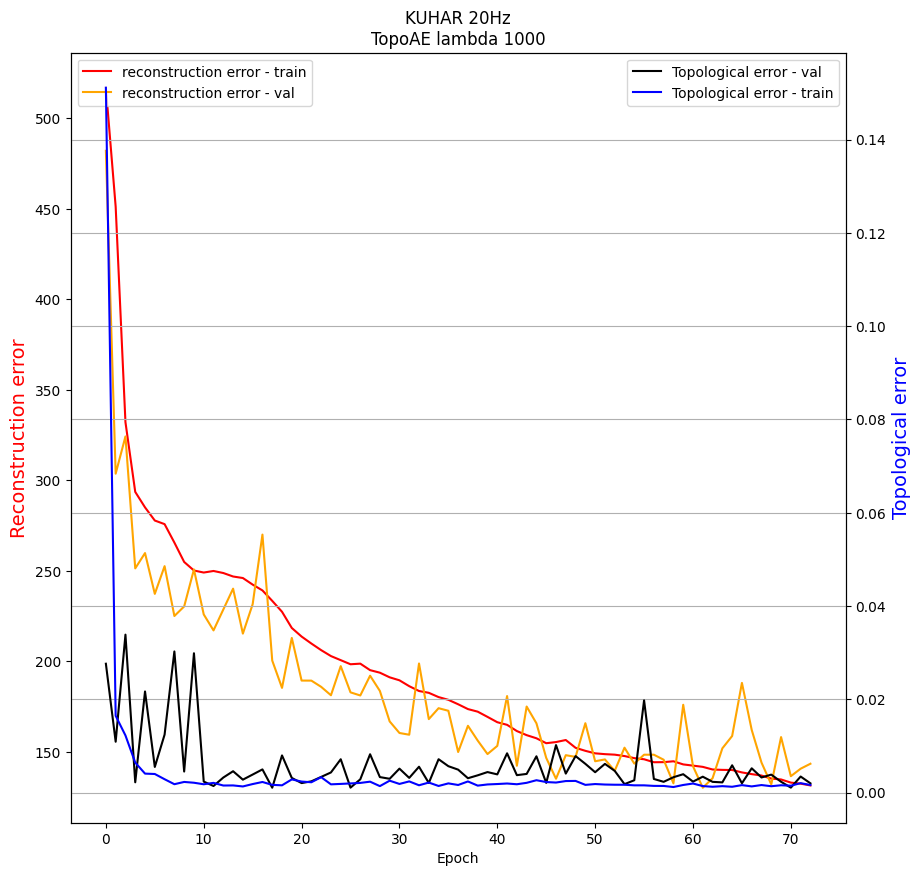

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:468.3161, Loss-ae:453.5107, Loss-topo:0.0148
Epoch:2, P:10, Loss:328.3741, Loss-ae:317.9770, Loss-topo:0.0104
Epoch:3, P:10, Loss:325.2603, Loss-ae:270.6438, Loss-topo:0.0546
Epoch:4, P:10, Loss:256.8345, Loss-ae:253.7987, Loss-topo:0.0030
Epoch:5, P:10, Loss:324.2454, Loss-ae:270.5748, Loss-topo:0.0537
Epoch:6, P:9, Loss:296.2504, Loss-ae:265.0668, Loss-topo:0.0312
Epoch:7, P:8, Loss:293.5460, Loss-ae:264.6314, Loss-topo:0.0289
Epoch:8, P:7, Loss:272.1163, Loss-ae:260.2301, Loss-topo:0.0119
Epoch:9, P:6, Loss:216.4138, Loss-ae:212.7462, Loss-topo:0.0037
Epoch:10, P:10, Loss:275.2402, Loss-ae:264.7140, Loss-topo:0.0105
Epoch:11, P:9, Loss:218.8629, Loss-ae:217.5392, Loss-topo:0.0013
Epoch:12, P:8, Loss:241.1566, Loss-ae:239.8426, Loss-topo:0.0013
Epoch:13, P:7, Loss:252.4724, Loss-ae:249.0452, Loss-topo:0.0034
Epoch:14, P:6, Loss:266.2040

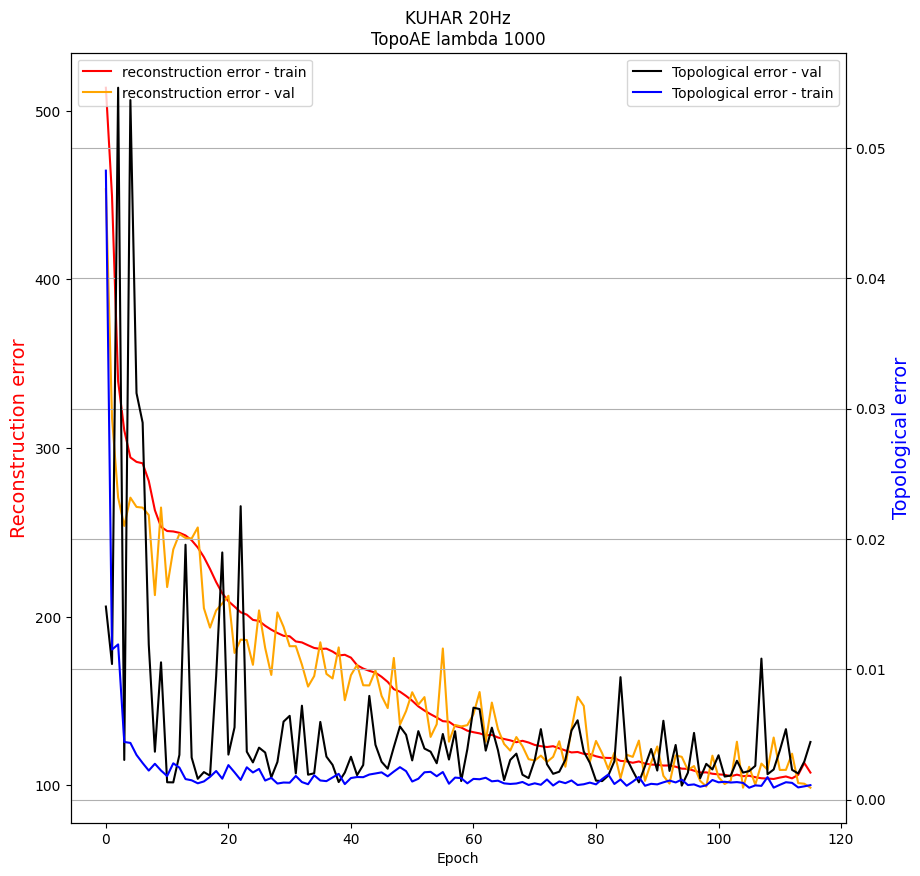

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:467.6381, Loss-ae:464.7087, Loss-topo:0.0029
Epoch:2, P:10, Loss:400.6413, Loss-ae:378.0307, Loss-topo:0.0226
Epoch:3, P:10, Loss:314.3896, Loss-ae:268.9555, Loss-topo:0.0454
Epoch:4, P:10, Loss:271.1908, Loss-ae:255.9282, Loss-topo:0.0153
Epoch:5, P:10, Loss:294.9551, Loss-ae:266.7643, Loss-topo:0.0282
Epoch:6, P:9, Loss:252.6178, Loss-ae:247.8168, Loss-topo:0.0048
Epoch:7, P:10, Loss:283.1196, Loss-ae:260.5684, Loss-topo:0.0226
Epoch:8, P:9, Loss:264.7175, Loss-ae:246.2630, Loss-topo:0.0185
Epoch:9, P:8, Loss:242.3709, Loss-ae:239.7524, Loss-topo:0.0026
Epoch:10, P:10, Loss:214.0975, Loss-ae:211.6994, Loss-topo:0.0024
Epoch:11, P:10, Loss:222.8456, Loss-ae:219.8392, Loss-topo:0.0030
Epoch:12, P:9, Loss:251.1576, Loss-ae:240.0051, Loss-topo:0.0112
Epoch:13, P:8, Loss:213.3313, Loss-ae:209.7031, Loss-topo:0.0036
Epoch:14, P:10, Loss:218.1

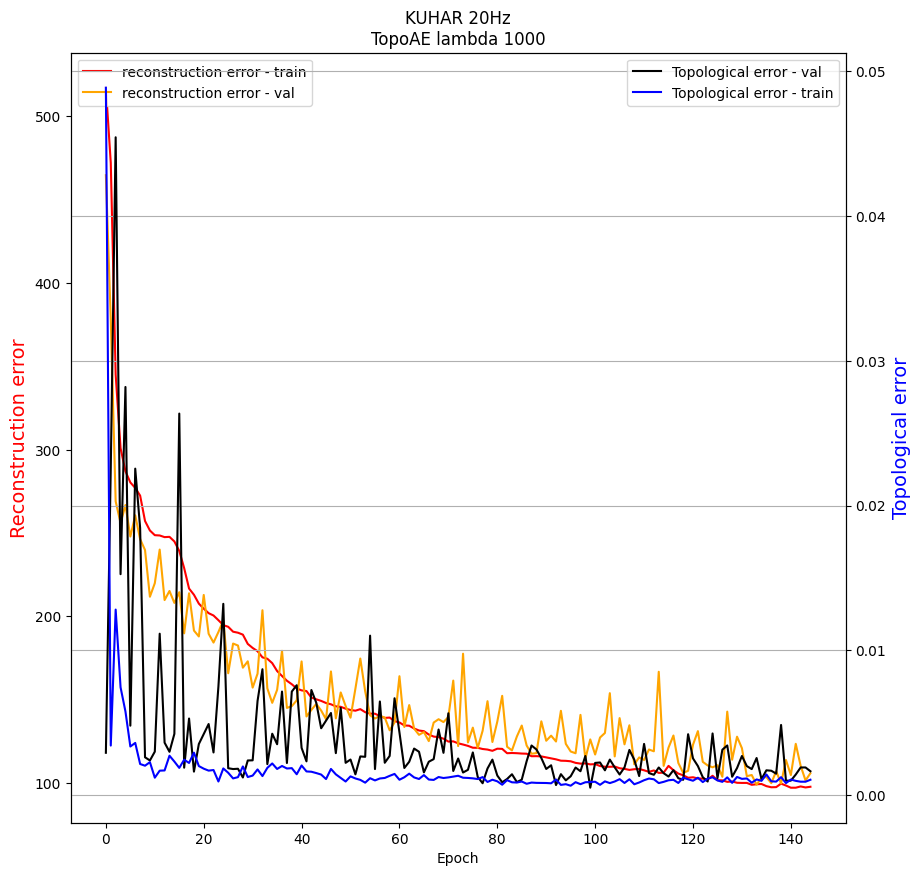

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:535.6763, Loss-ae:515.0689, Loss-topo:0.0206
Epoch:2, P:10, Loss:428.9725, Loss-ae:320.4577, Loss-topo:0.1085
Epoch:3, P:10, Loss:375.2484, Loss-ae:269.2423, Loss-topo:0.1060
Epoch:4, P:10, Loss:336.5808, Loss-ae:285.7861, Loss-topo:0.0508
Epoch:5, P:10, Loss:246.7425, Loss-ae:241.7606, Loss-topo:0.0050
Epoch:6, P:10, Loss:264.4559, Loss-ae:254.4758, Loss-topo:0.0100
Epoch:7, P:9, Loss:237.3040, Loss-ae:234.3040, Loss-topo:0.0030
Epoch:8, P:10, Loss:266.1471, Loss-ae:255.8942, Loss-topo:0.0103
Epoch:9, P:9, Loss:219.7091, Loss-ae:215.4745, Loss-topo:0.0042
Epoch:10, P:10, Loss:238.8419, Loss-ae:233.5005, Loss-topo:0.0053
Epoch:11, P:9, Loss:216.6948, Loss-ae:211.5281, Loss-topo:0.0052
Epoch:12, P:10, Loss:214.6176, Loss-ae:212.4215, Loss-topo:0.0022
Epoch:13, P:10, Loss:216.5939, Loss-ae:213.7067, Loss-topo:0.0029
Epoch:14, P:9, Loss:259.

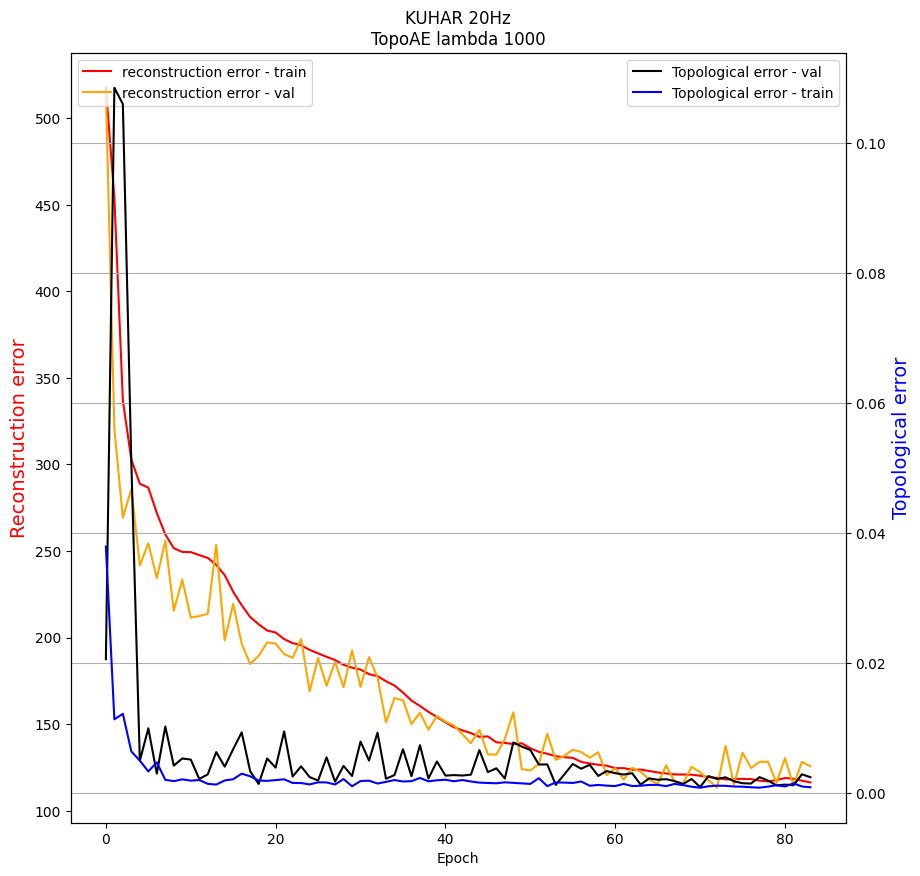

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:494.9252, Loss-ae:488.8935, Loss-topo:0.0060
Epoch:2, P:10, Loss:339.8705, Loss-ae:322.7869, Loss-topo:0.0171
Epoch:3, P:10, Loss:290.2024, Loss-ae:274.6033, Loss-topo:0.0156
Epoch:4, P:10, Loss:246.5498, Loss-ae:238.9115, Loss-topo:0.0076
Epoch:5, P:10, Loss:270.7336, Loss-ae:263.7215, Loss-topo:0.0070
Epoch:6, P:9, Loss:224.6694, Loss-ae:221.4788, Loss-topo:0.0032
Epoch:7, P:10, Loss:242.9764, Loss-ae:239.4856, Loss-topo:0.0035
Epoch:8, P:9, Loss:219.7884, Loss-ae:215.8364, Loss-topo:0.0040
Epoch:9, P:10, Loss:225.2689, Loss-ae:220.9721, Loss-topo:0.0043
Epoch:10, P:9, Loss:214.6710, Loss-ae:209.9929, Loss-topo:0.0047
Epoch:11, P:10, Loss:224.2596, Loss-ae:219.0892, Loss-topo:0.0052
Epoch:12, P:9, Loss:247.9374, Loss-ae:242.9151, Loss-topo:0.0050
Epoch:13, P:8, Loss:245.5223, Loss-ae:243.5075, Loss-topo:0.0020
Epoch:14, P:7, Loss:214.42

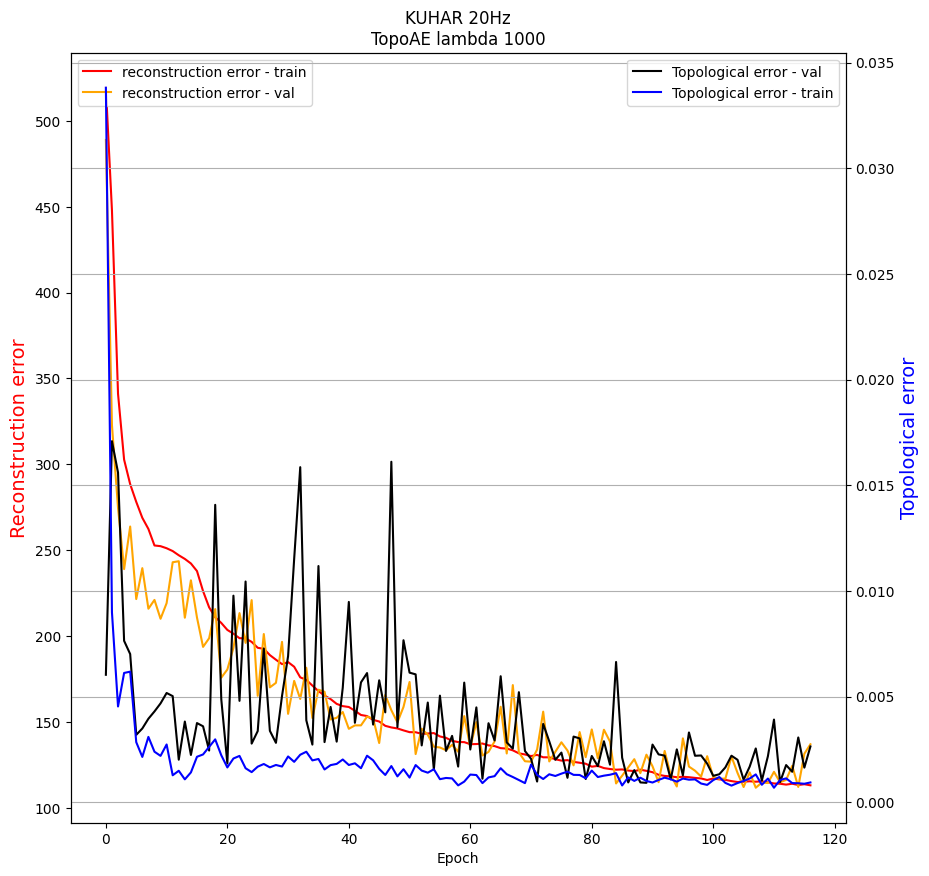

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:460.1099, Loss-ae:438.2767, Loss-topo:0.0218
Epoch:2, P:10, Loss:409.6698, Loss-ae:371.4722, Loss-topo:0.0382
Epoch:3, P:10, Loss:323.2557, Loss-ae:293.5543, Loss-topo:0.0297
Epoch:4, P:10, Loss:263.3082, Loss-ae:251.6153, Loss-topo:0.0117
Epoch:5, P:10, Loss:267.2042, Loss-ae:259.9962, Loss-topo:0.0072
Epoch:6, P:9, Loss:262.0920, Loss-ae:259.3769, Loss-topo:0.0027
Epoch:7, P:10, Loss:259.9872, Loss-ae:256.2505, Loss-topo:0.0037
Epoch:8, P:10, Loss:248.5206, Loss-ae:245.5689, Loss-topo:0.0030
Epoch:9, P:10, Loss:220.1853, Loss-ae:213.7982, Loss-topo:0.0064
Epoch:10, P:10, Loss:245.2429, Loss-ae:241.4972, Loss-topo:0.0037
Epoch:11, P:9, Loss:272.5862, Loss-ae:264.0837, Loss-topo:0.0085
Epoch:12, P:8, Loss:315.6920, Loss-ae:313.0891, Loss-topo:0.0026
Epoch:13, P:7, Loss:257.3650, Loss-ae:246.9613, Loss-topo:0.0104
Epoch:14, P:6, Loss:228.9

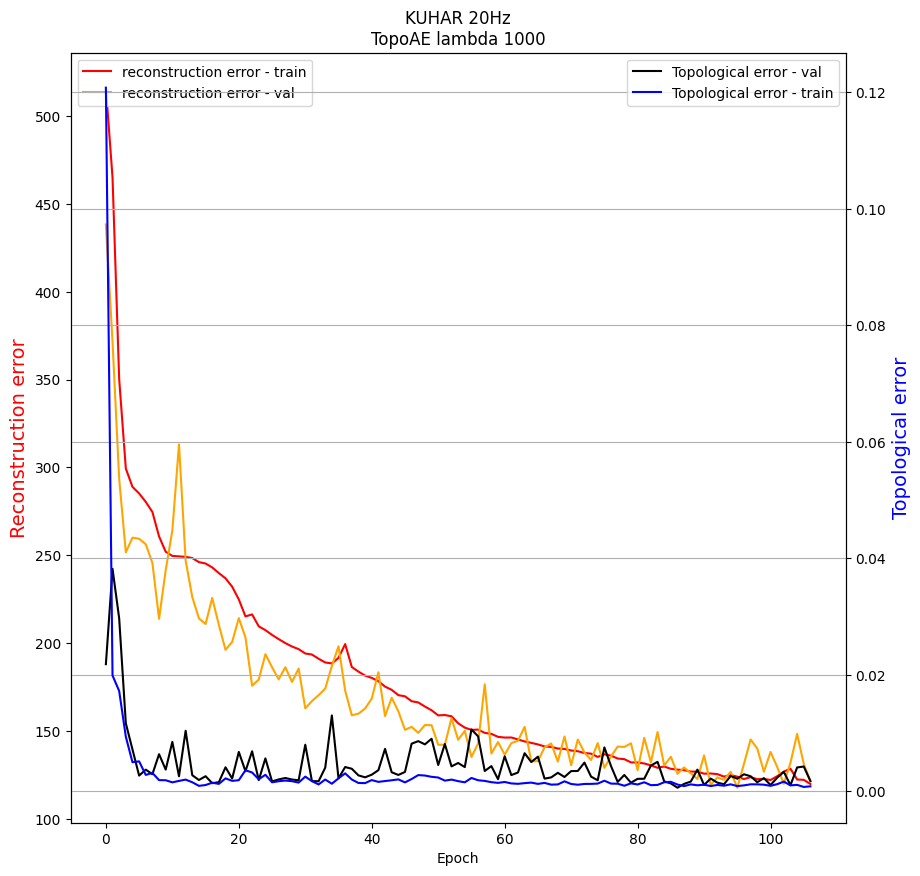

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 4
Epoch:1, P:10, Loss:419.3760, Loss-ae:413.4325, Loss-topo:0.0059
Epoch:2, P:10, Loss:436.9461, Loss-ae:396.3402, Loss-topo:0.0406
Epoch:3, P:9, Loss:336.4964, Loss-ae:305.8414, Loss-topo:0.0307
Epoch:4, P:10, Loss:335.8316, Loss-ae:302.5686, Loss-topo:0.0333
Epoch:5, P:10, Loss:258.4979, Loss-ae:256.9108, Loss-topo:0.0016
Epoch:6, P:10, Loss:294.9419, Loss-ae:264.4782, Loss-topo:0.0305
Epoch:7, P:9, Loss:288.4378, Loss-ae:284.1720, Loss-topo:0.0043
Epoch:8, P:8, Loss:243.5183, Loss-ae:239.8532, Loss-topo:0.0037
Epoch:9, P:10, Loss:242.9789, Loss-ae:233.3757, Loss-topo:0.0096
Epoch:10, P:10, Loss:220.9162, Loss-ae:207.5540, Loss-topo:0.0134
Epoch:11, P:10, Loss:227.0682, Loss-ae:225.8535, Loss-topo:0.0012
Epoch:12, P:9, Loss:257.9313, Loss-ae:256.4260, Loss-topo:0.0015
Epoch:13, P:8, Loss:221.4779, Loss-ae:216.1249, Loss-topo:0.0054
Epoch:14, P:7, Loss:244.01

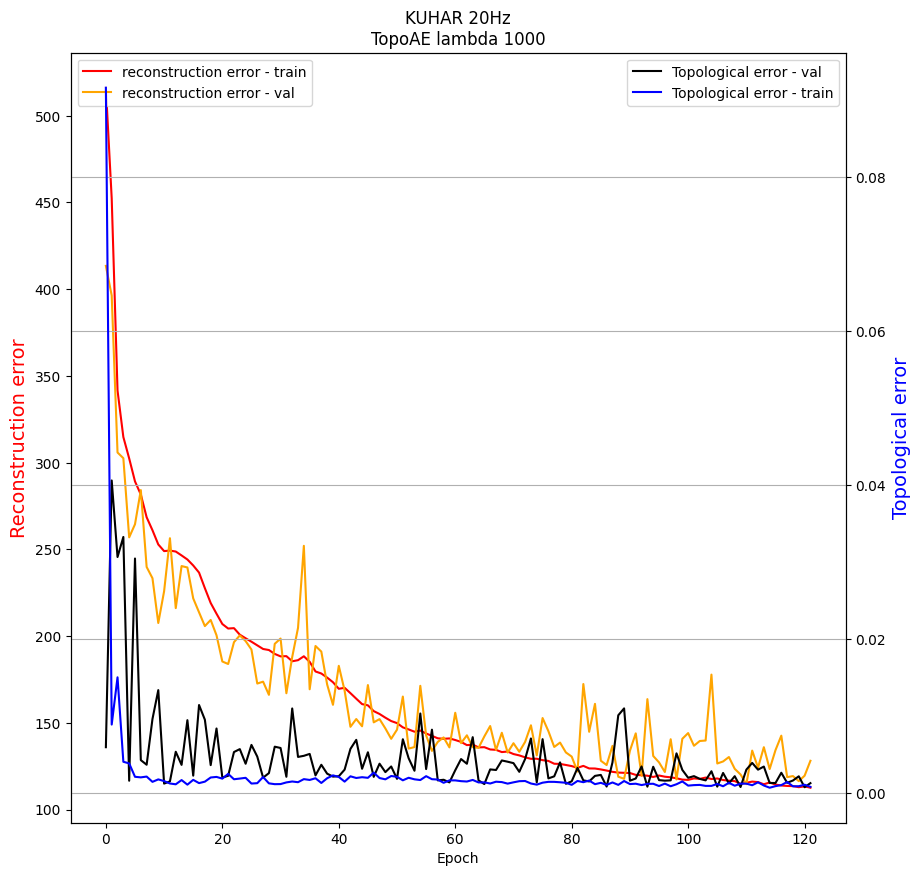

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:436.1778, Loss-ae:432.7802, Loss-topo:0.0034
Epoch:2, P:10, Loss:367.3976, Loss-ae:336.6878, Loss-topo:0.0307
Epoch:3, P:10, Loss:302.6979, Loss-ae:266.0685, Loss-topo:0.0366
Epoch:4, P:10, Loss:234.8677, Loss-ae:230.2052, Loss-topo:0.0047
Epoch:5, P:10, Loss:288.0002, Loss-ae:250.1475, Loss-topo:0.0379
Epoch:6, P:9, Loss:314.7080, Loss-ae:286.7398, Loss-topo:0.0280
Epoch:7, P:8, Loss:268.9200, Loss-ae:248.0222, Loss-topo:0.0209
Epoch:8, P:7, Loss:266.6208, Loss-ae:254.6123, Loss-topo:0.0120
Epoch:9, P:6, Loss:265.2712, Loss-ae:224.9868, Loss-topo:0.0403
Epoch:10, P:5, Loss:260.4058, Loss-ae:246.6295, Loss-topo:0.0138
Epoch:11, P:4, Loss:213.6627, Loss-ae:210.8248, Loss-topo:0.0028
Epoch:12, P:10, Loss:242.0611, Loss-ae:231.1966, Loss-topo:0.0109
Epoch:13, P:9, Loss:213.0845, Loss-ae:209.2842, Loss-topo:0.0038
Epoch:14, P:10, Loss:242.709

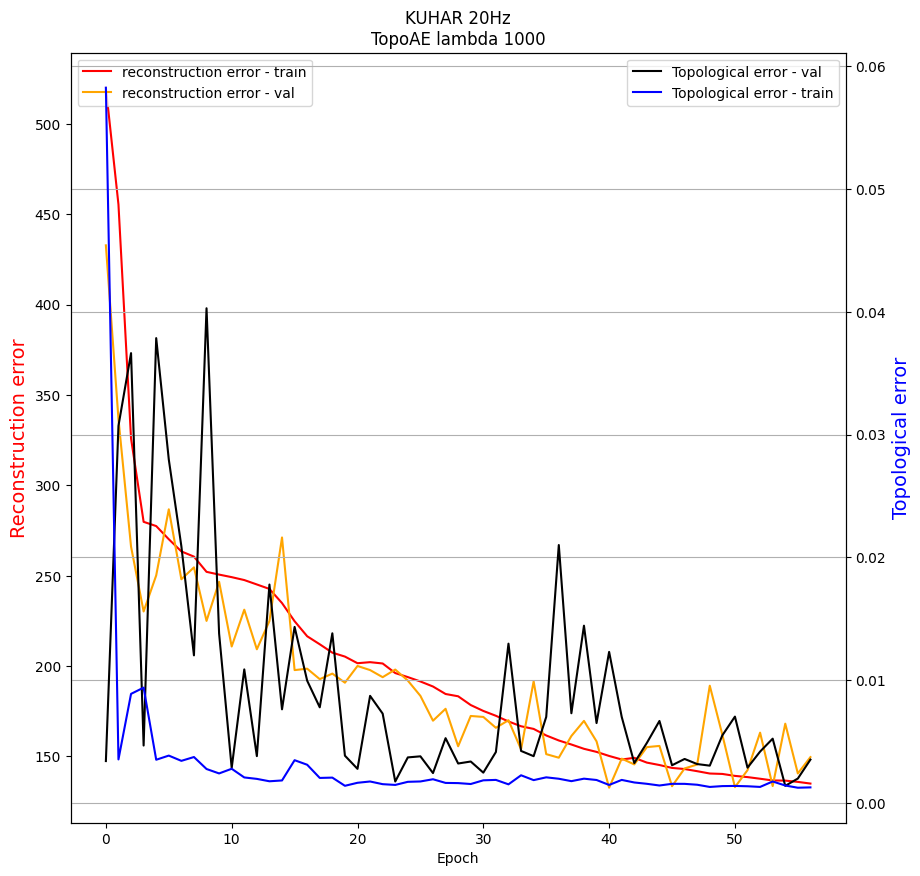

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:430.4476, Loss-ae:420.5262, Loss-topo:0.0099
Epoch:2, P:10, Loss:374.0563, Loss-ae:366.5868, Loss-topo:0.0075
Epoch:3, P:10, Loss:335.6068, Loss-ae:307.6307, Loss-topo:0.0280
Epoch:4, P:10, Loss:259.9214, Loss-ae:255.8365, Loss-topo:0.0041
Epoch:5, P:10, Loss:291.4793, Loss-ae:265.5905, Loss-topo:0.0259
Epoch:6, P:9, Loss:245.7314, Loss-ae:239.5964, Loss-topo:0.0061
Epoch:7, P:10, Loss:245.6439, Loss-ae:241.6185, Loss-topo:0.0040
Epoch:8, P:10, Loss:257.8451, Loss-ae:255.8520, Loss-topo:0.0020
Epoch:9, P:9, Loss:262.1769, Loss-ae:254.4008, Loss-topo:0.0078
Epoch:10, P:8, Loss:213.4860, Loss-ae:209.8616, Loss-topo:0.0036
Epoch:11, P:10, Loss:228.1935, Loss-ae:226.5677, Loss-topo:0.0016
Epoch:12, P:9, Loss:233.9073, Loss-ae:231.1020, Loss-topo:0.0028
Epoch:13, P:8, Loss:216.6961, Loss-ae:207.8219, Loss-topo:0.0089
Epoch:14, P:7, Loss:243.49

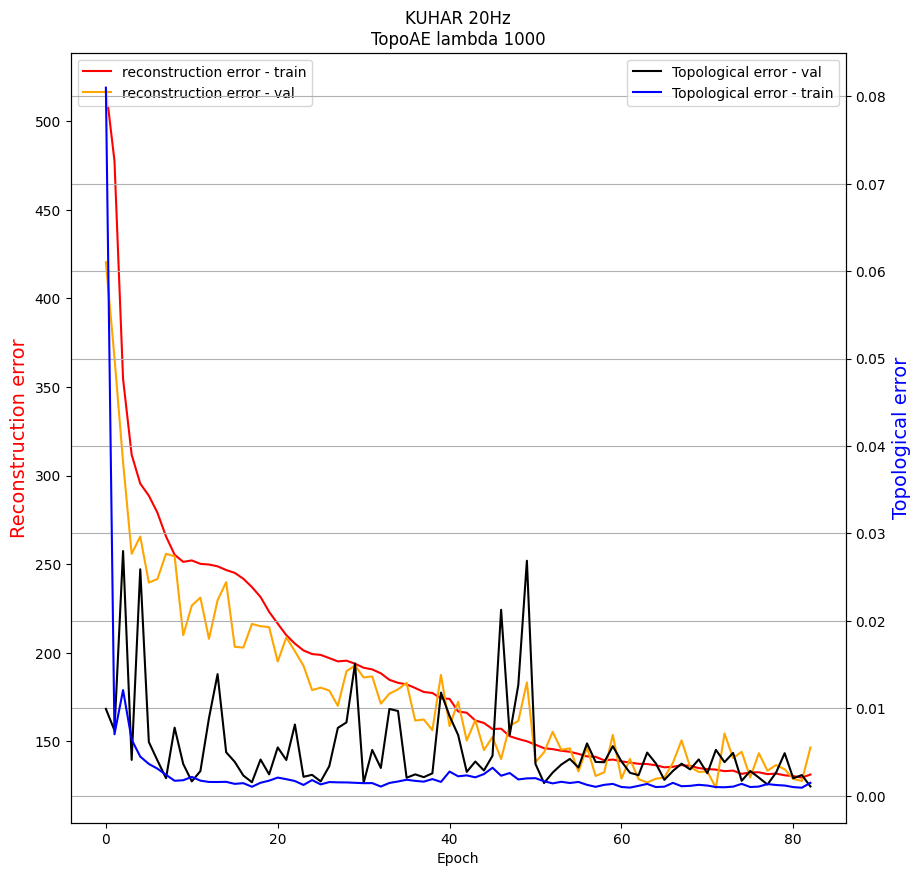

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:448.9093, Loss-ae:437.8086, Loss-topo:0.0111
Epoch:2, P:10, Loss:351.6706, Loss-ae:327.0824, Loss-topo:0.0246
Epoch:3, P:10, Loss:252.6654, Loss-ae:247.2107, Loss-topo:0.0055
Epoch:4, P:10, Loss:253.6567, Loss-ae:238.7007, Loss-topo:0.0150
Epoch:5, P:9, Loss:268.1076, Loss-ae:235.1488, Loss-topo:0.0330
Epoch:6, P:8, Loss:324.9306, Loss-ae:312.2681, Loss-topo:0.0127
Epoch:7, P:7, Loss:303.1966, Loss-ae:291.9948, Loss-topo:0.0112
Epoch:8, P:6, Loss:224.3239, Loss-ae:218.9700, Loss-topo:0.0054
Epoch:9, P:10, Loss:231.4806, Loss-ae:221.5267, Loss-topo:0.0100
Epoch:10, P:9, Loss:243.8880, Loss-ae:242.1377, Loss-topo:0.0018
Epoch:11, P:8, Loss:255.4857, Loss-ae:251.0267, Loss-topo:0.0045
Epoch:12, P:7, Loss:263.0095, Loss-ae:257.6711, Loss-topo:0.0053
Epoch:13, P:6, Loss:211.7703, Loss-ae:206.6557, Loss-topo:0.0051
Epoch:14, P:10, Loss:263.4584

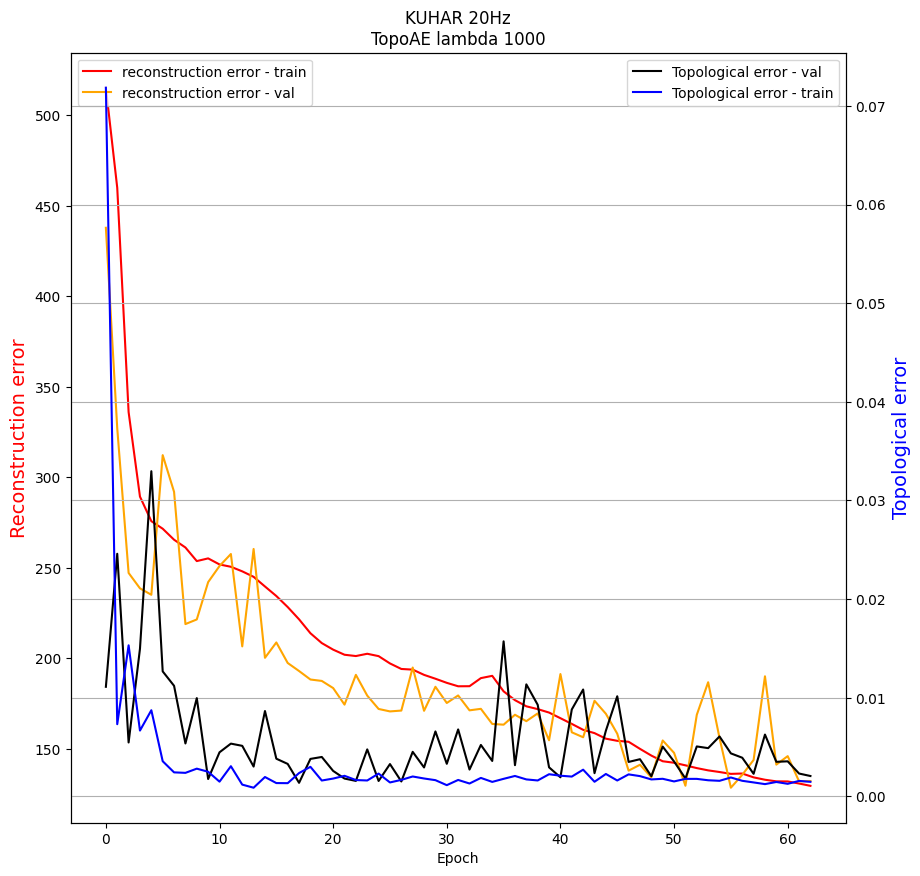

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:468.6391, Loss-ae:459.5428, Loss-topo:0.0091
Epoch:2, P:10, Loss:410.4357, Loss-ae:400.0778, Loss-topo:0.0104
Epoch:3, P:10, Loss:388.3586, Loss-ae:339.5478, Loss-topo:0.0488
Epoch:4, P:10, Loss:290.8140, Loss-ae:276.8983, Loss-topo:0.0139
Epoch:5, P:10, Loss:313.8827, Loss-ae:285.3544, Loss-topo:0.0285
Epoch:6, P:9, Loss:306.4151, Loss-ae:280.7221, Loss-topo:0.0257
Epoch:7, P:8, Loss:264.9415, Loss-ae:255.5779, Loss-topo:0.0094
Epoch:8, P:10, Loss:268.1426, Loss-ae:261.2931, Loss-topo:0.0068
Epoch:9, P:9, Loss:230.4708, Loss-ae:228.8121, Loss-topo:0.0017
Epoch:10, P:10, Loss:213.6862, Loss-ae:212.0155, Loss-topo:0.0017
Epoch:11, P:10, Loss:208.2013, Loss-ae:206.1526, Loss-topo:0.0020
Epoch:12, P:10, Loss:219.3940, Loss-ae:217.7620, Loss-topo:0.0016
Epoch:13, P:9, Loss:215.6187, Loss-ae:212.8869, Loss-topo:0.0027
Epoch:14, P:8, Loss:232.5

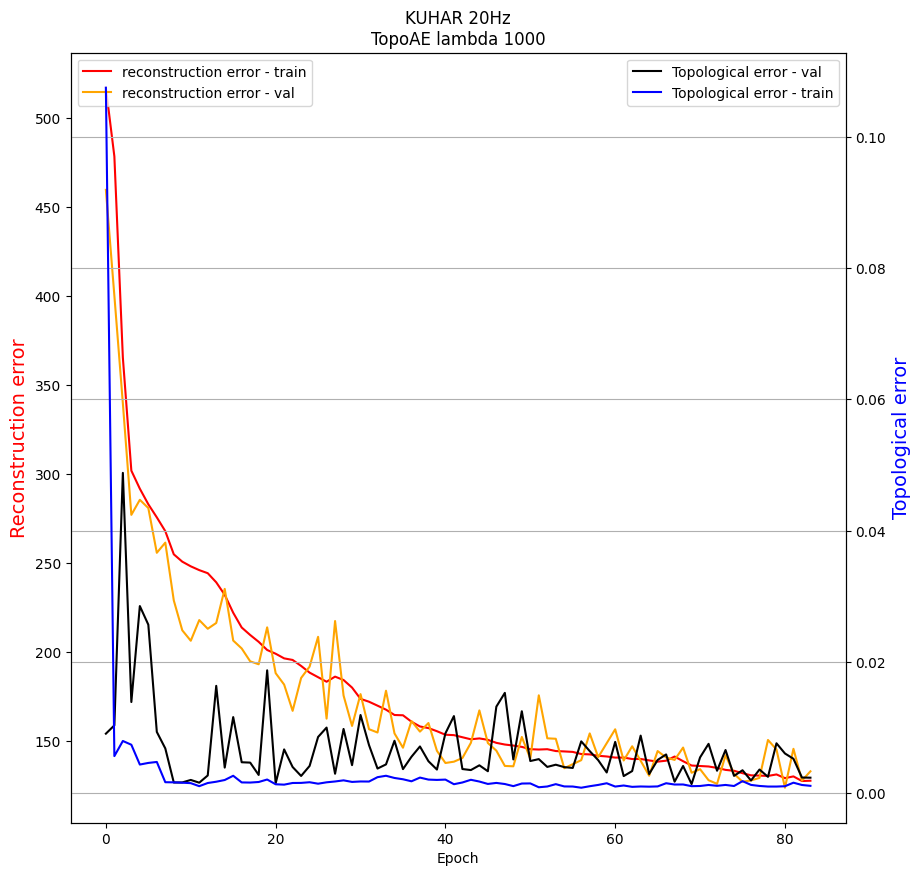

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:508.1596, Loss-ae:498.2922, Loss-topo:0.0099
Epoch:2, P:10, Loss:321.8463, Loss-ae:308.9525, Loss-topo:0.0129
Epoch:3, P:10, Loss:319.2201, Loss-ae:291.5014, Loss-topo:0.0277
Epoch:4, P:10, Loss:286.7784, Loss-ae:271.3980, Loss-topo:0.0154
Epoch:5, P:10, Loss:269.1840, Loss-ae:256.2758, Loss-topo:0.0129
Epoch:6, P:10, Loss:275.8656, Loss-ae:270.0879, Loss-topo:0.0058
Epoch:7, P:9, Loss:234.9967, Loss-ae:230.4720, Loss-topo:0.0045
Epoch:8, P:10, Loss:257.2384, Loss-ae:244.9996, Loss-topo:0.0122
Epoch:9, P:9, Loss:248.2382, Loss-ae:245.1572, Loss-topo:0.0031
Epoch:10, P:8, Loss:219.4662, Loss-ae:217.6973, Loss-topo:0.0018
Epoch:11, P:10, Loss:223.4974, Loss-ae:219.5401, Loss-topo:0.0040
Epoch:12, P:9, Loss:212.6937, Loss-ae:210.2256, Loss-topo:0.0025
Epoch:13, P:10, Loss:247.1536, Loss-ae:240.2770, Loss-topo:0.0069
Epoch:14, P:9, Loss:212.4

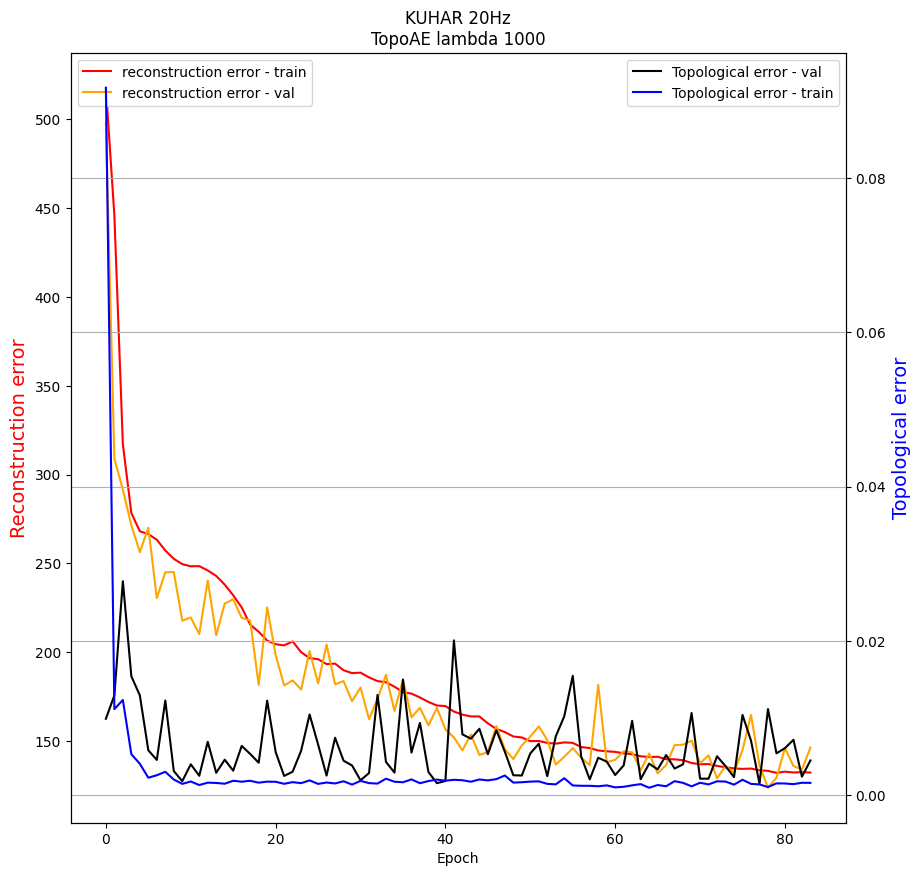

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:452.9173, Loss-ae:448.4546, Loss-topo:0.0045
Epoch:2, P:10, Loss:397.8242, Loss-ae:371.2960, Loss-topo:0.0265
Epoch:3, P:10, Loss:341.4921, Loss-ae:315.9470, Loss-topo:0.0255
Epoch:4, P:10, Loss:254.1585, Loss-ae:249.7060, Loss-topo:0.0045
Epoch:5, P:10, Loss:271.5852, Loss-ae:256.0151, Loss-topo:0.0156
Epoch:6, P:9, Loss:242.7707, Loss-ae:240.6899, Loss-topo:0.0021
Epoch:7, P:10, Loss:238.5811, Loss-ae:223.8085, Loss-topo:0.0148
Epoch:8, P:10, Loss:246.5848, Loss-ae:244.5723, Loss-topo:0.0020
Epoch:9, P:9, Loss:256.1798, Loss-ae:245.7463, Loss-topo:0.0104
Epoch:10, P:8, Loss:250.9396, Loss-ae:244.9007, Loss-topo:0.0060
Epoch:11, P:7, Loss:247.2919, Loss-ae:231.9313, Loss-topo:0.0154
Epoch:12, P:6, Loss:232.7100, Loss-ae:229.5303, Loss-topo:0.0032
Epoch:13, P:10, Loss:264.7275, Loss-ae:255.2961, Loss-topo:0.0094
Epoch:14, P:9, Loss:251.35

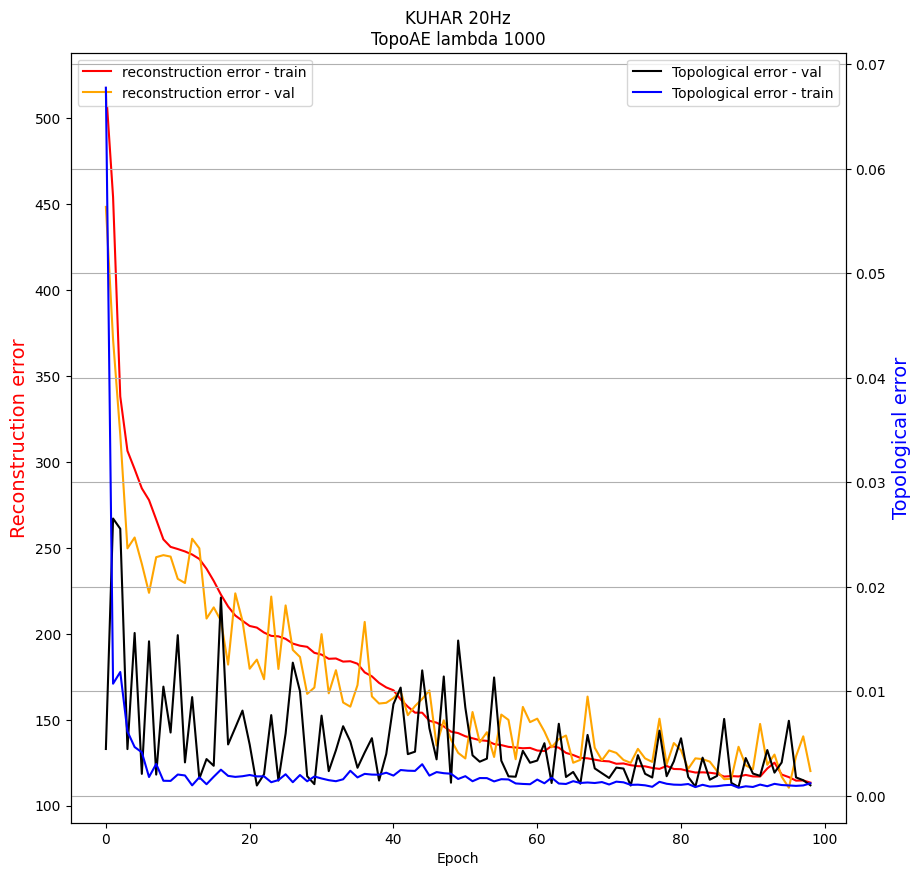

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:465.5658, Loss-ae:447.8345, Loss-topo:0.0177
Epoch:2, P:10, Loss:354.1571, Loss-ae:323.2372, Loss-topo:0.0309
Epoch:3, P:10, Loss:332.3159, Loss-ae:309.2662, Loss-topo:0.0230
Epoch:4, P:10, Loss:271.6091, Loss-ae:258.3935, Loss-topo:0.0132
Epoch:5, P:10, Loss:290.3497, Loss-ae:277.4721, Loss-topo:0.0129
Epoch:6, P:9, Loss:296.7753, Loss-ae:249.5540, Loss-topo:0.0472
Epoch:7, P:8, Loss:246.3345, Loss-ae:235.7781, Loss-topo:0.0106
Epoch:8, P:10, Loss:243.9946, Loss-ae:236.2759, Loss-topo:0.0077
Epoch:9, P:10, Loss:251.3985, Loss-ae:248.4896, Loss-topo:0.0029
Epoch:10, P:9, Loss:226.5723, Loss-ae:224.1676, Loss-topo:0.0024
Epoch:11, P:10, Loss:256.4351, Loss-ae:233.5738, Loss-topo:0.0229
Epoch:12, P:9, Loss:262.5438, Loss-ae:260.9720, Loss-topo:0.0016
Epoch:13, P:8, Loss:224.1064, Loss-ae:218.4150, Loss-topo:0.0057
Epoch:14, P:10, Loss:259.5

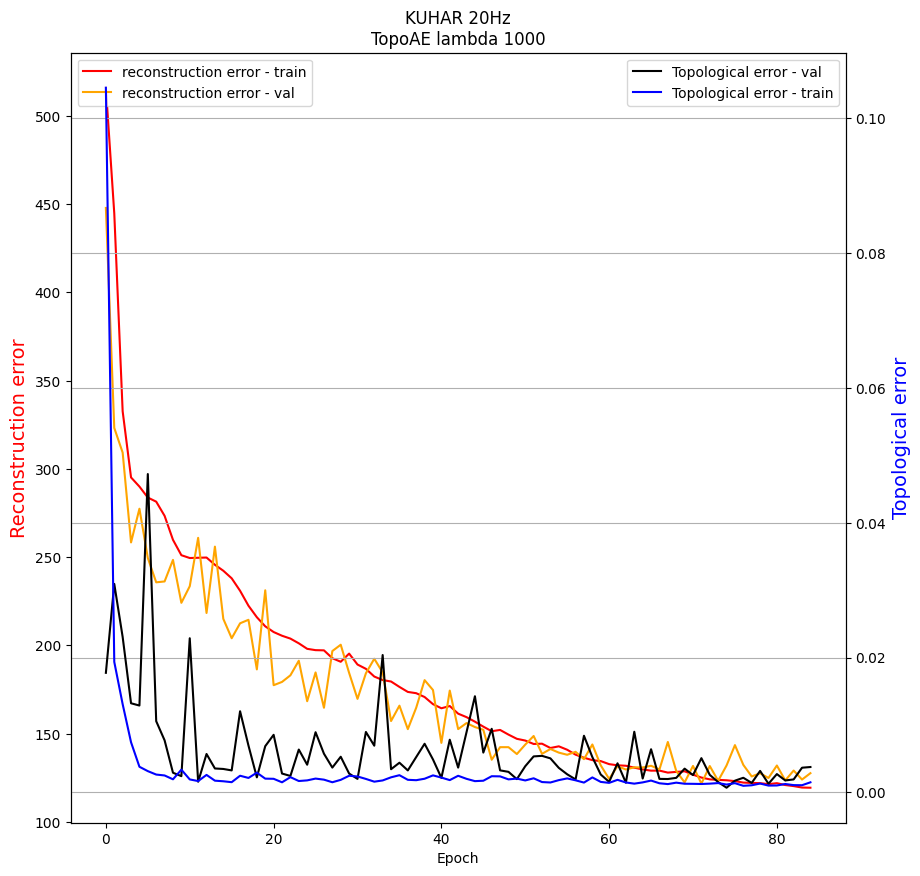

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:438.3642, Loss-ae:423.2720, Loss-topo:0.0151
Epoch:2, P:10, Loss:411.7533, Loss-ae:352.9730, Loss-topo:0.0588
Epoch:3, P:10, Loss:269.6267, Loss-ae:262.0407, Loss-topo:0.0076
Epoch:4, P:10, Loss:310.1327, Loss-ae:297.9897, Loss-topo:0.0121
Epoch:5, P:9, Loss:273.4452, Loss-ae:267.5213, Loss-topo:0.0059
Epoch:6, P:8, Loss:257.1730, Loss-ae:255.6214, Loss-topo:0.0016
Epoch:7, P:10, Loss:255.7714, Loss-ae:252.7605, Loss-topo:0.0030
Epoch:8, P:10, Loss:236.8495, Loss-ae:229.8615, Loss-topo:0.0070
Epoch:9, P:10, Loss:230.0293, Loss-ae:227.2770, Loss-topo:0.0028
Epoch:10, P:10, Loss:217.1216, Loss-ae:214.5316, Loss-topo:0.0026
Epoch:11, P:10, Loss:269.2796, Loss-ae:266.8758, Loss-topo:0.0024
Epoch:12, P:9, Loss:234.5644, Loss-ae:233.1583, Loss-topo:0.0014
Epoch:13, P:8, Loss:232.5090, Loss-ae:228.3426, Loss-topo:0.0042
Epoch:14, P:7, Loss:263.9

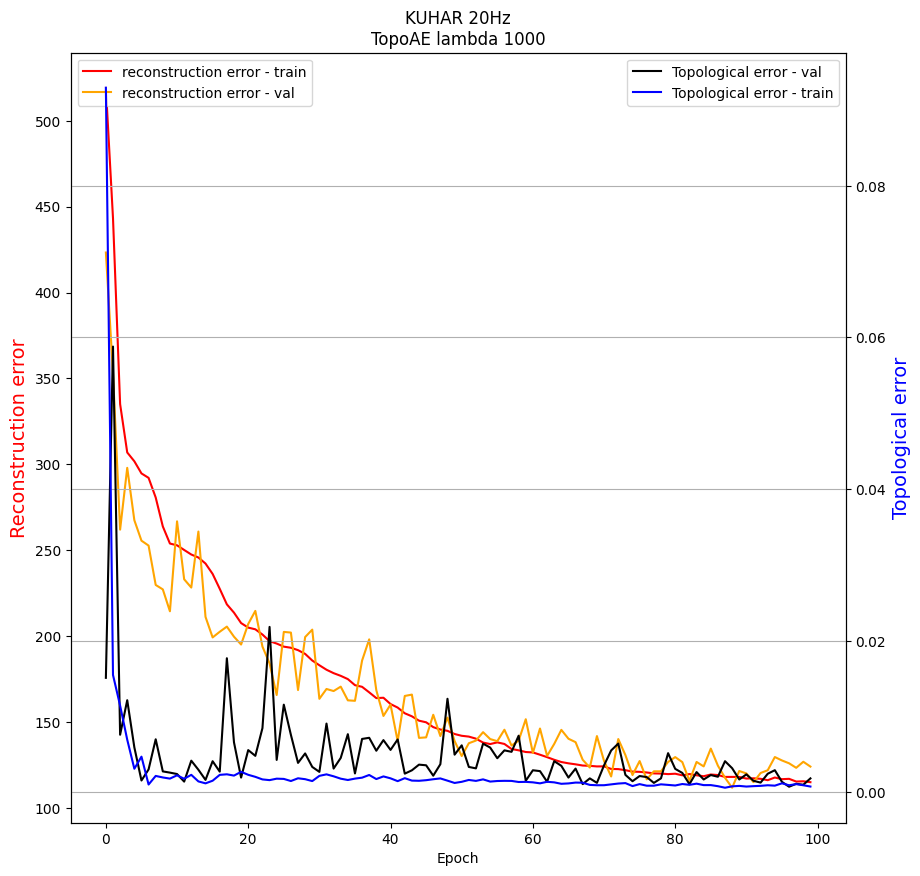

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:473.1818, Loss-ae:449.1556, Loss-topo:0.0240
Epoch:2, P:10, Loss:455.3407, Loss-ae:389.0638, Loss-topo:0.0663
Epoch:3, P:10, Loss:304.9822, Loss-ae:254.4771, Loss-topo:0.0505
Epoch:4, P:10, Loss:286.3845, Loss-ae:264.1261, Loss-topo:0.0223
Epoch:5, P:10, Loss:257.7463, Loss-ae:253.9073, Loss-topo:0.0038
Epoch:6, P:10, Loss:246.8932, Loss-ae:232.7343, Loss-topo:0.0142
Epoch:7, P:10, Loss:233.7890, Loss-ae:231.7999, Loss-topo:0.0020
Epoch:8, P:10, Loss:241.6845, Loss-ae:237.3845, Loss-topo:0.0043
Epoch:9, P:9, Loss:223.6312, Loss-ae:220.1128, Loss-topo:0.0035
Epoch:10, P:10, Loss:214.6157, Loss-ae:210.8171, Loss-topo:0.0038
Epoch:11, P:10, Loss:233.2330, Loss-ae:231.4236, Loss-topo:0.0018
Epoch:12, P:9, Loss:267.8962, Loss-ae:263.1100, Loss-topo:0.0048
Epoch:13, P:8, Loss:235.4909, Loss-ae:233.1539, Loss-topo:0.0023
Epoch:14, P:7, Loss:234.

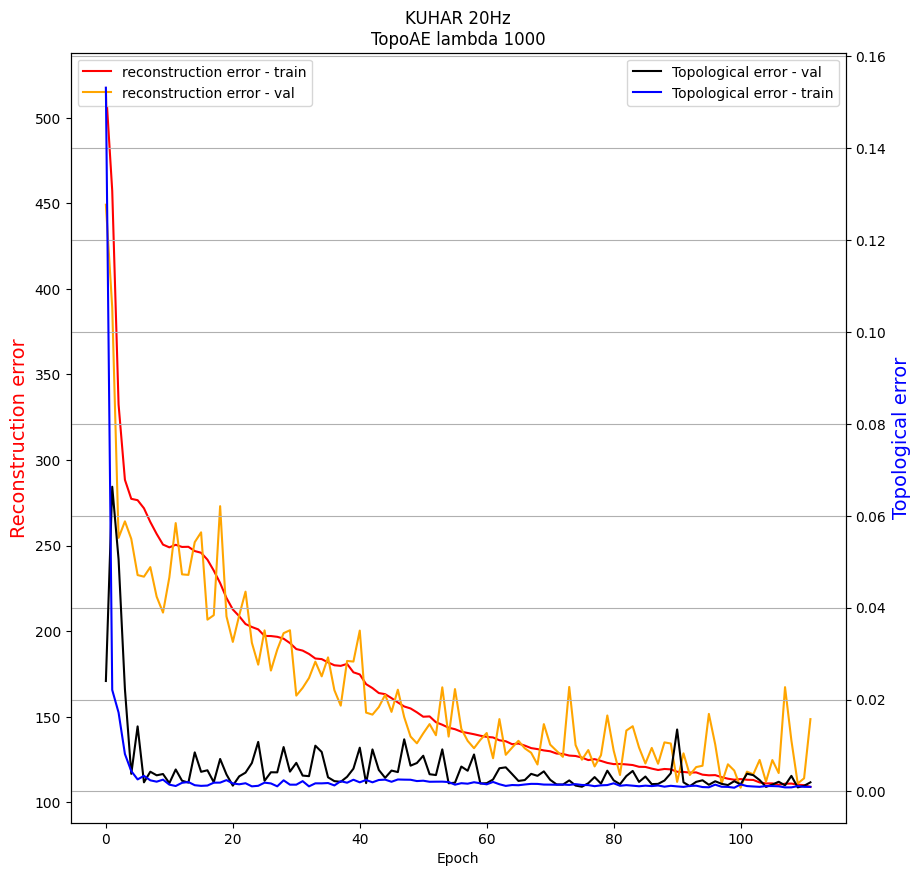

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 5
Epoch:1, P:10, Loss:500.4924, Loss-ae:465.3884, Loss-topo:0.0351
Epoch:2, P:10, Loss:345.4210, Loss-ae:324.0733, Loss-topo:0.0213
Epoch:3, P:10, Loss:359.9533, Loss-ae:342.5246, Loss-topo:0.0174
Epoch:4, P:9, Loss:273.1171, Loss-ae:264.0826, Loss-topo:0.0090
Epoch:5, P:10, Loss:287.6502, Loss-ae:278.3364, Loss-topo:0.0093
Epoch:6, P:9, Loss:286.0764, Loss-ae:275.9069, Loss-topo:0.0102
Epoch:7, P:8, Loss:243.2746, Loss-ae:238.7426, Loss-topo:0.0045
Epoch:8, P:10, Loss:227.5137, Loss-ae:223.5677, Loss-topo:0.0039
Epoch:9, P:10, Loss:240.7561, Loss-ae:236.3943, Loss-topo:0.0044
Epoch:10, P:9, Loss:251.2171, Loss-ae:240.4485, Loss-topo:0.0108
Epoch:11, P:8, Loss:272.8334, Loss-ae:262.2429, Loss-topo:0.0106
Epoch:12, P:7, Loss:214.8832, Loss-ae:211.5089, Loss-topo:0.0034
Epoch:13, P:10, Loss:209.3411, Loss-ae:207.0548, Loss-topo:0.0023
Epoch:14, P:10, Loss:282.37

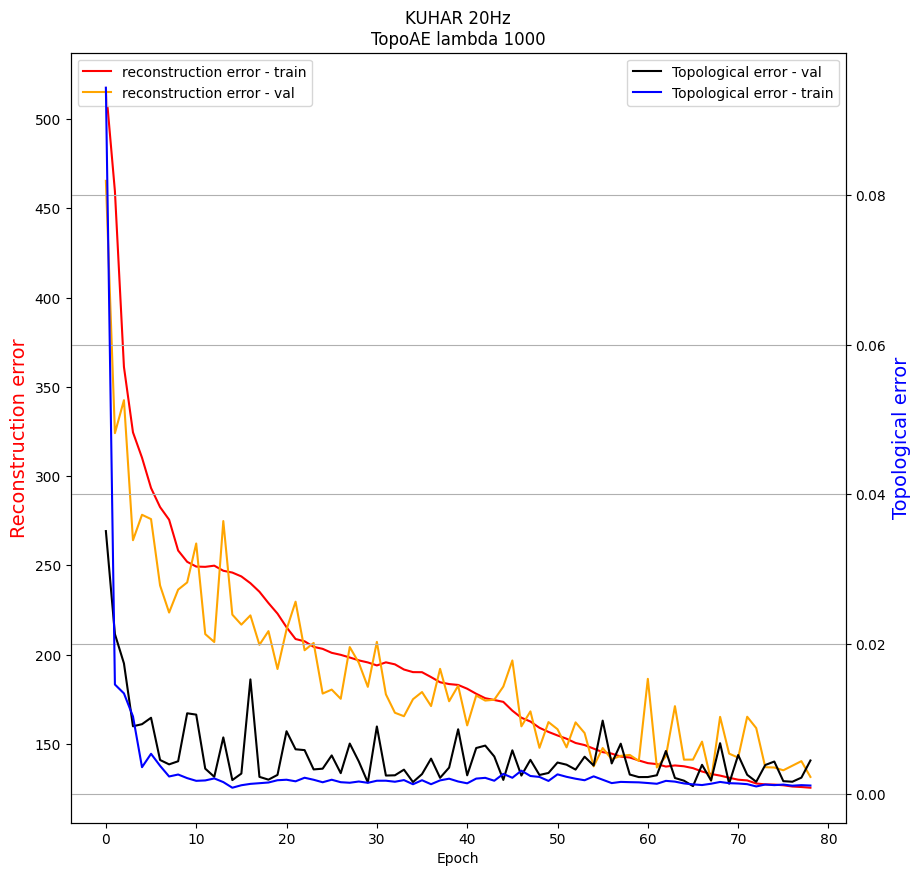

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:500.5631, Loss-ae:477.1235, Loss-topo:0.0234
Epoch:2, P:10, Loss:379.8025, Loss-ae:366.9609, Loss-topo:0.0128
Epoch:3, P:10, Loss:292.3819, Loss-ae:286.1943, Loss-topo:0.0062
Epoch:4, P:10, Loss:330.9901, Loss-ae:303.2339, Loss-topo:0.0278
Epoch:5, P:9, Loss:299.8429, Loss-ae:291.2057, Loss-topo:0.0086
Epoch:6, P:8, Loss:281.1403, Loss-ae:276.4324, Loss-topo:0.0047
Epoch:7, P:10, Loss:239.0653, Loss-ae:234.9280, Loss-topo:0.0041
Epoch:8, P:10, Loss:275.9029, Loss-ae:257.6122, Loss-topo:0.0183
Epoch:9, P:9, Loss:222.0067, Loss-ae:218.7951, Loss-topo:0.0032
Epoch:10, P:10, Loss:279.1674, Loss-ae:251.3873, Loss-topo:0.0278
Epoch:11, P:9, Loss:234.2708, Loss-ae:231.3078, Loss-topo:0.0030
Epoch:12, P:8, Loss:229.7814, Loss-ae:219.8505, Loss-topo:0.0099
Epoch:13, P:7, Loss:255.8952, Loss-ae:253.6490, Loss-topo:0.0022
Epoch:14, P:6, Loss:264.602

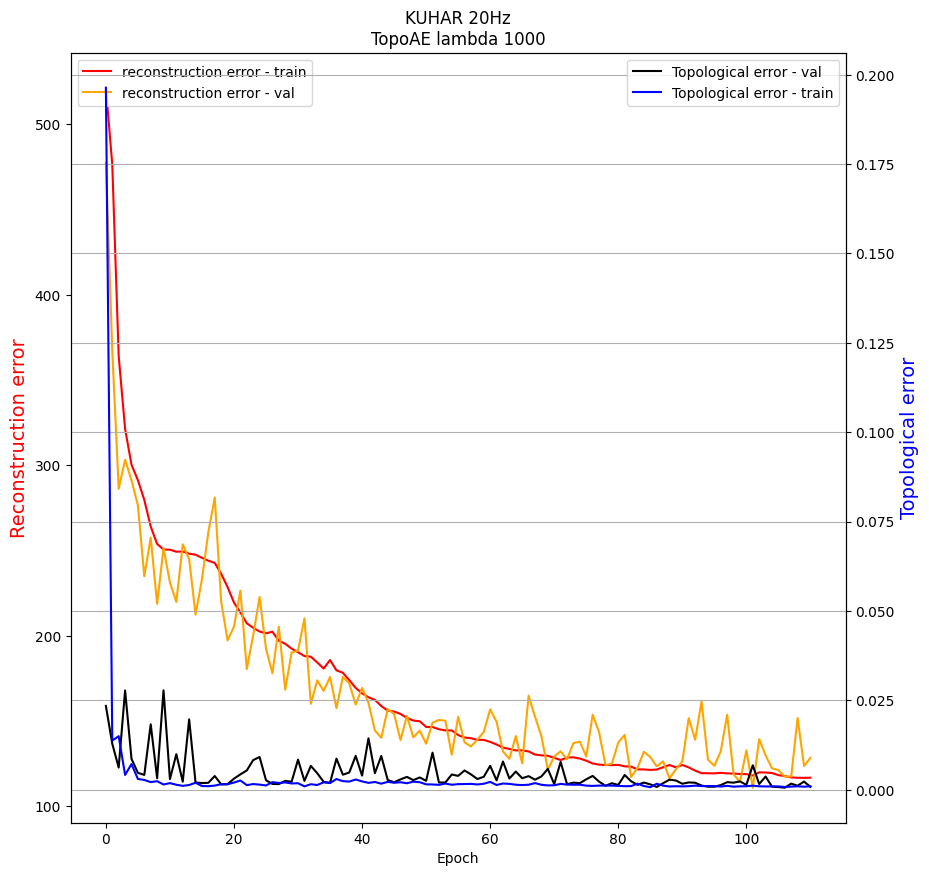

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:421.3294, Loss-ae:418.8034, Loss-topo:0.0025
Epoch:2, P:10, Loss:306.9249, Loss-ae:293.5935, Loss-topo:0.0133
Epoch:3, P:10, Loss:309.6229, Loss-ae:264.5706, Loss-topo:0.0451
Epoch:4, P:9, Loss:236.0696, Loss-ae:231.0550, Loss-topo:0.0050
Epoch:5, P:10, Loss:227.1244, Loss-ae:221.1803, Loss-topo:0.0059
Epoch:6, P:10, Loss:233.8594, Loss-ae:219.1782, Loss-topo:0.0147
Epoch:7, P:9, Loss:258.6119, Loss-ae:252.3368, Loss-topo:0.0063
Epoch:8, P:8, Loss:298.4175, Loss-ae:292.3819, Loss-topo:0.0060
Epoch:9, P:7, Loss:236.9611, Loss-ae:227.1875, Loss-topo:0.0098
Epoch:10, P:6, Loss:287.7796, Loss-ae:276.8651, Loss-topo:0.0109
Epoch:11, P:5, Loss:233.8965, Loss-ae:227.7996, Loss-topo:0.0061
Epoch:12, P:4, Loss:216.3224, Loss-ae:214.8098, Loss-topo:0.0015
Epoch:13, P:10, Loss:222.2231, Loss-ae:219.4024, Loss-topo:0.0028
Epoch:14, P:9, Loss:238.7042

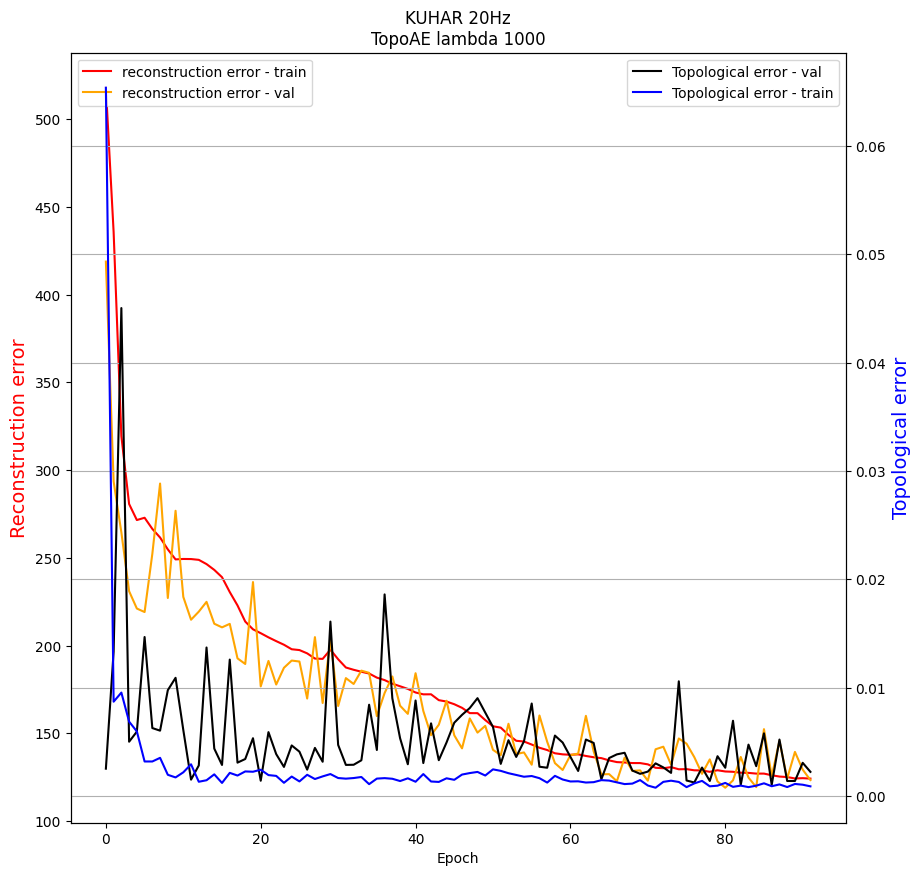

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:461.8728, Loss-ae:454.1564, Loss-topo:0.0077
Epoch:2, P:10, Loss:338.7665, Loss-ae:325.0461, Loss-topo:0.0137
Epoch:3, P:10, Loss:279.7015, Loss-ae:270.9516, Loss-topo:0.0087
Epoch:4, P:10, Loss:253.9768, Loss-ae:243.8531, Loss-topo:0.0101
Epoch:5, P:10, Loss:286.7436, Loss-ae:273.7577, Loss-topo:0.0130
Epoch:6, P:9, Loss:295.6868, Loss-ae:289.0123, Loss-topo:0.0067
Epoch:7, P:8, Loss:281.1908, Loss-ae:273.3444, Loss-topo:0.0078
Epoch:8, P:7, Loss:332.3471, Loss-ae:315.8243, Loss-topo:0.0165
Epoch:9, P:6, Loss:233.2766, Loss-ae:229.2597, Loss-topo:0.0040
Epoch:10, P:10, Loss:230.4167, Loss-ae:224.8952, Loss-topo:0.0055
Epoch:11, P:10, Loss:253.0809, Loss-ae:246.5044, Loss-topo:0.0066
Epoch:12, P:9, Loss:253.0076, Loss-ae:247.2226, Loss-topo:0.0058
Epoch:13, P:8, Loss:258.1105, Loss-ae:247.4447, Loss-topo:0.0107
Epoch:14, P:7, Loss:243.771

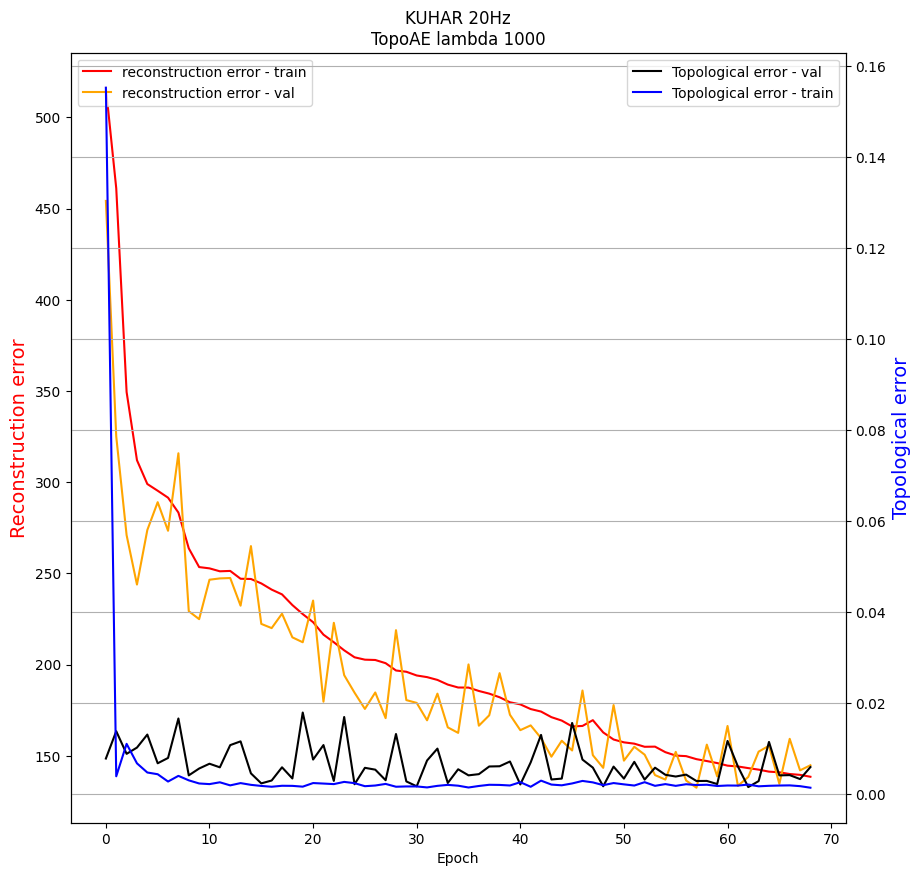

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:462.7835, Loss-ae:447.0315, Loss-topo:0.0158
Epoch:2, P:10, Loss:385.6519, Loss-ae:372.6810, Loss-topo:0.0130
Epoch:3, P:10, Loss:274.1610, Loss-ae:258.7740, Loss-topo:0.0154
Epoch:4, P:10, Loss:252.4539, Loss-ae:243.8835, Loss-topo:0.0086
Epoch:5, P:10, Loss:254.3667, Loss-ae:248.3041, Loss-topo:0.0061
Epoch:6, P:9, Loss:241.9001, Loss-ae:236.2077, Loss-topo:0.0057
Epoch:7, P:10, Loss:279.1143, Loss-ae:276.5237, Loss-topo:0.0026
Epoch:8, P:9, Loss:306.1473, Loss-ae:293.1963, Loss-topo:0.0130
Epoch:9, P:8, Loss:253.7874, Loss-ae:248.8304, Loss-topo:0.0050
Epoch:10, P:7, Loss:249.4033, Loss-ae:239.1533, Loss-topo:0.0103
Epoch:11, P:6, Loss:219.3167, Loss-ae:218.0665, Loss-topo:0.0013
Epoch:12, P:10, Loss:218.9480, Loss-ae:217.5030, Loss-topo:0.0014
Epoch:13, P:10, Loss:227.2722, Loss-ae:226.1148, Loss-topo:0.0012
Epoch:14, P:9, Loss:223.56

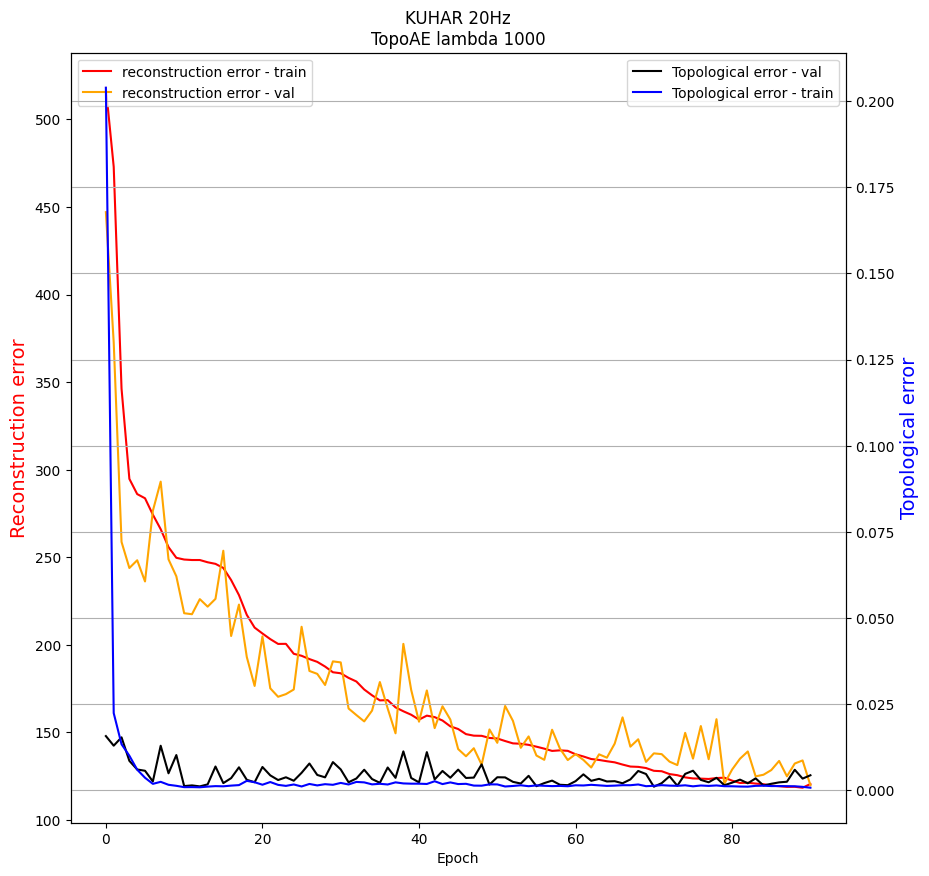

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:572.1452, Loss-ae:530.2813, Loss-topo:0.0419
Epoch:2, P:10, Loss:379.9872, Loss-ae:372.7136, Loss-topo:0.0073
Epoch:3, P:10, Loss:348.8303, Loss-ae:322.1937, Loss-topo:0.0266
Epoch:4, P:10, Loss:254.8053, Loss-ae:247.2963, Loss-topo:0.0075
Epoch:5, P:10, Loss:258.9144, Loss-ae:253.4170, Loss-topo:0.0055
Epoch:6, P:9, Loss:233.8940, Loss-ae:228.8882, Loss-topo:0.0050
Epoch:7, P:10, Loss:229.3568, Loss-ae:226.5436, Loss-topo:0.0028
Epoch:8, P:10, Loss:225.6526, Loss-ae:222.6353, Loss-topo:0.0030
Epoch:9, P:10, Loss:218.5094, Loss-ae:207.2620, Loss-topo:0.0112
Epoch:10, P:10, Loss:230.4043, Loss-ae:227.7455, Loss-topo:0.0027
Epoch:11, P:9, Loss:220.3010, Loss-ae:217.2549, Loss-topo:0.0030
Epoch:12, P:8, Loss:215.6101, Loss-ae:214.1583, Loss-topo:0.0015
Epoch:13, P:10, Loss:267.4352, Loss-ae:261.1055, Loss-topo:0.0063
Epoch:14, P:9, Loss:250.

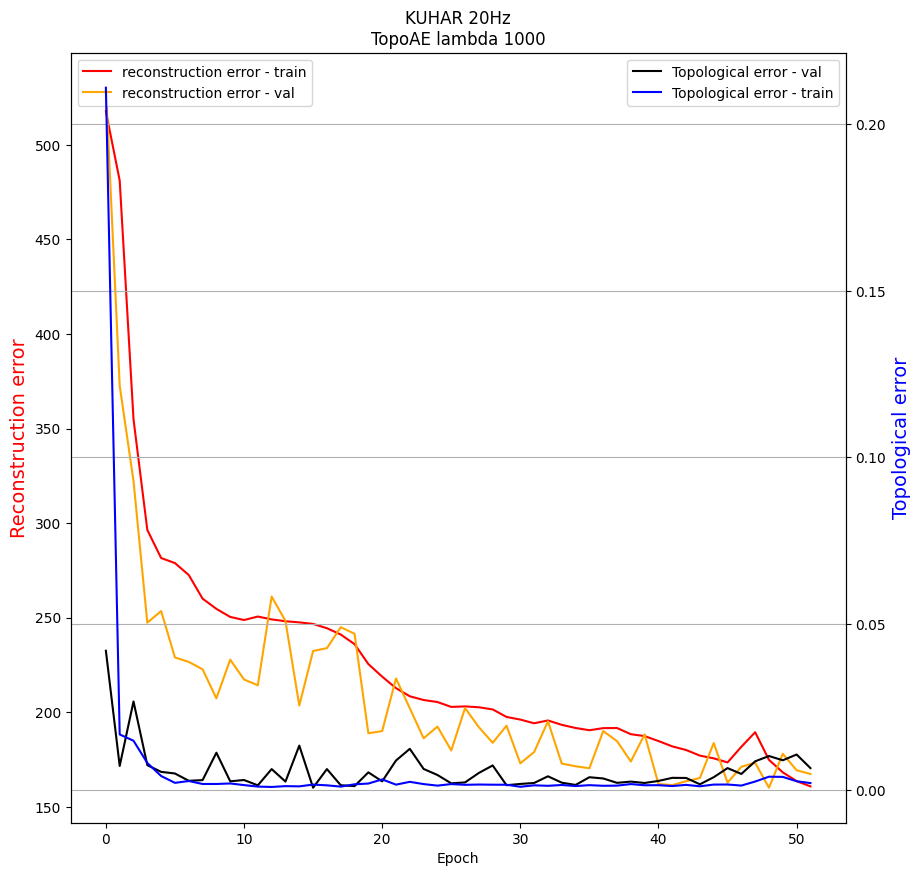

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:478.0593, Loss-ae:447.6338, Loss-topo:0.0304
Epoch:2, P:10, Loss:455.5361, Loss-ae:372.5421, Loss-topo:0.0830
Epoch:3, P:10, Loss:323.0376, Loss-ae:294.2773, Loss-topo:0.0288
Epoch:4, P:10, Loss:302.0448, Loss-ae:292.1756, Loss-topo:0.0099
Epoch:5, P:10, Loss:368.9207, Loss-ae:300.8707, Loss-topo:0.0680
Epoch:6, P:9, Loss:262.2094, Loss-ae:254.9517, Loss-topo:0.0073
Epoch:7, P:10, Loss:259.2858, Loss-ae:252.0809, Loss-topo:0.0072
Epoch:8, P:10, Loss:262.0710, Loss-ae:257.8398, Loss-topo:0.0042
Epoch:9, P:9, Loss:256.5270, Loss-ae:241.6387, Loss-topo:0.0149
Epoch:10, P:10, Loss:236.9793, Loss-ae:234.0642, Loss-topo:0.0029
Epoch:11, P:10, Loss:214.8673, Loss-ae:212.5449, Loss-topo:0.0023
Epoch:12, P:10, Loss:221.8235, Loss-ae:217.2280, Loss-topo:0.0046
Epoch:13, P:9, Loss:233.6548, Loss-ae:231.9518, Loss-topo:0.0017
Epoch:14, P:8, Loss:240.

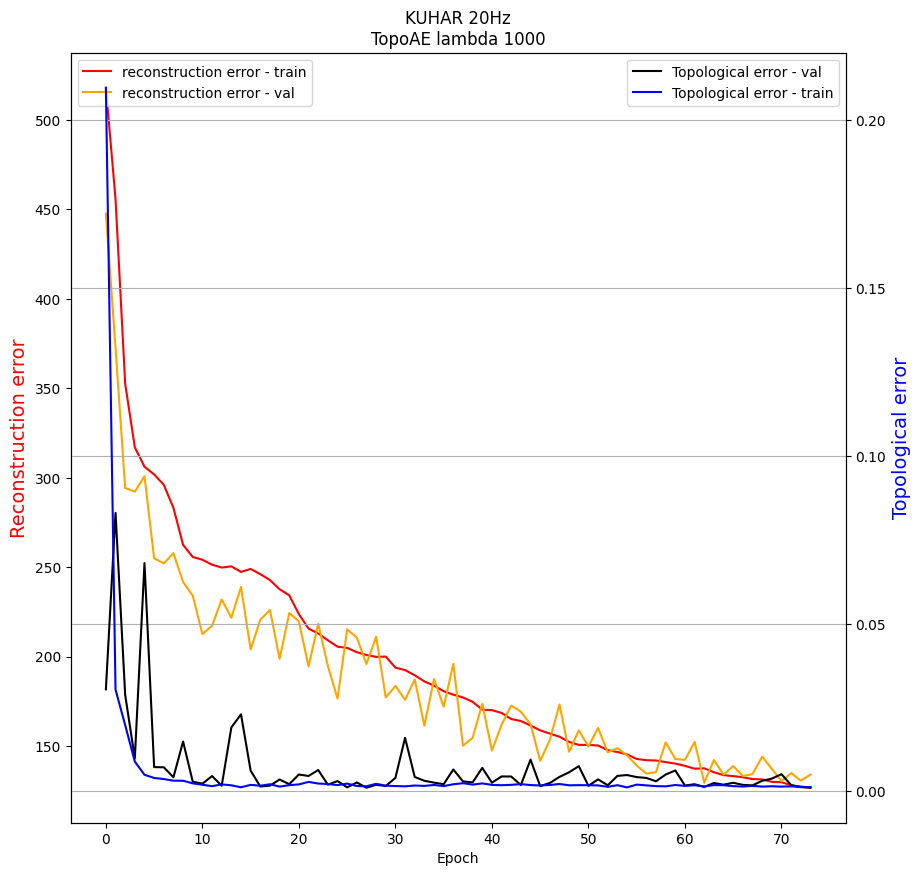

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:433.2644, Loss-ae:417.8408, Loss-topo:0.0154
Epoch:2, P:10, Loss:365.7490, Loss-ae:342.9446, Loss-topo:0.0228
Epoch:3, P:10, Loss:364.8722, Loss-ae:346.3306, Loss-topo:0.0185
Epoch:4, P:10, Loss:269.0651, Loss-ae:263.0474, Loss-topo:0.0060
Epoch:5, P:10, Loss:297.2595, Loss-ae:292.4222, Loss-topo:0.0048
Epoch:6, P:9, Loss:276.4580, Loss-ae:263.6687, Loss-topo:0.0128
Epoch:7, P:8, Loss:270.0952, Loss-ae:268.0770, Loss-topo:0.0020
Epoch:8, P:7, Loss:281.2792, Loss-ae:263.5987, Loss-topo:0.0177
Epoch:9, P:6, Loss:218.1160, Loss-ae:211.4664, Loss-topo:0.0066
Epoch:10, P:10, Loss:264.6293, Loss-ae:257.3365, Loss-topo:0.0073
Epoch:11, P:9, Loss:221.2237, Loss-ae:219.0927, Loss-topo:0.0021
Epoch:12, P:8, Loss:220.3889, Loss-ae:215.6972, Loss-topo:0.0047
Epoch:13, P:7, Loss:234.1186, Loss-ae:231.8489, Loss-topo:0.0023
Epoch:14, P:6, Loss:216.8451

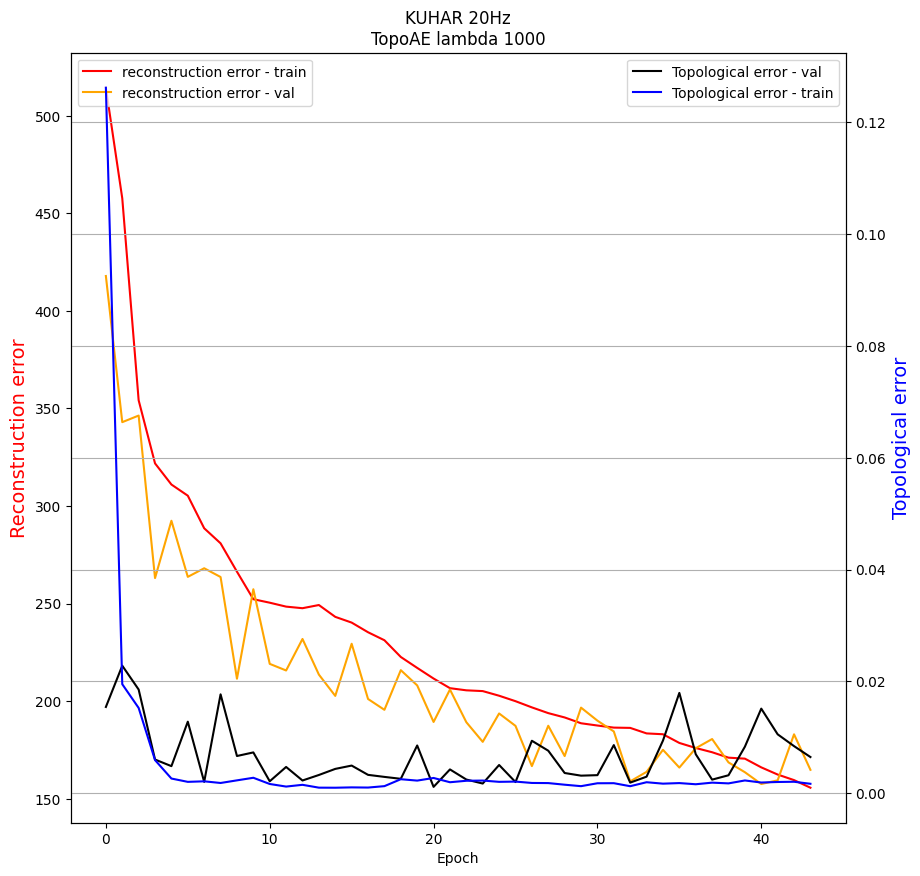

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:474.7304, Loss-ae:465.9968, Loss-topo:0.0087
Epoch:2, P:10, Loss:334.5308, Loss-ae:326.5760, Loss-topo:0.0080
Epoch:3, P:10, Loss:289.1784, Loss-ae:267.8724, Loss-topo:0.0213
Epoch:4, P:10, Loss:288.0532, Loss-ae:272.6385, Loss-topo:0.0154
Epoch:5, P:10, Loss:276.4204, Loss-ae:261.2009, Loss-topo:0.0152
Epoch:6, P:10, Loss:295.7765, Loss-ae:277.7577, Loss-topo:0.0180
Epoch:7, P:9, Loss:240.6168, Loss-ae:235.6632, Loss-topo:0.0050
Epoch:8, P:10, Loss:265.5000, Loss-ae:256.9857, Loss-topo:0.0085
Epoch:9, P:9, Loss:220.9777, Loss-ae:217.2195, Loss-topo:0.0038
Epoch:10, P:10, Loss:218.8901, Loss-ae:216.8082, Loss-topo:0.0021
Epoch:11, P:10, Loss:239.7995, Loss-ae:237.3069, Loss-topo:0.0025
Epoch:12, P:9, Loss:246.3578, Loss-ae:244.3987, Loss-topo:0.0020
Epoch:13, P:8, Loss:230.9363, Loss-ae:229.5421, Loss-topo:0.0014
Epoch:14, P:7, Loss:235.9

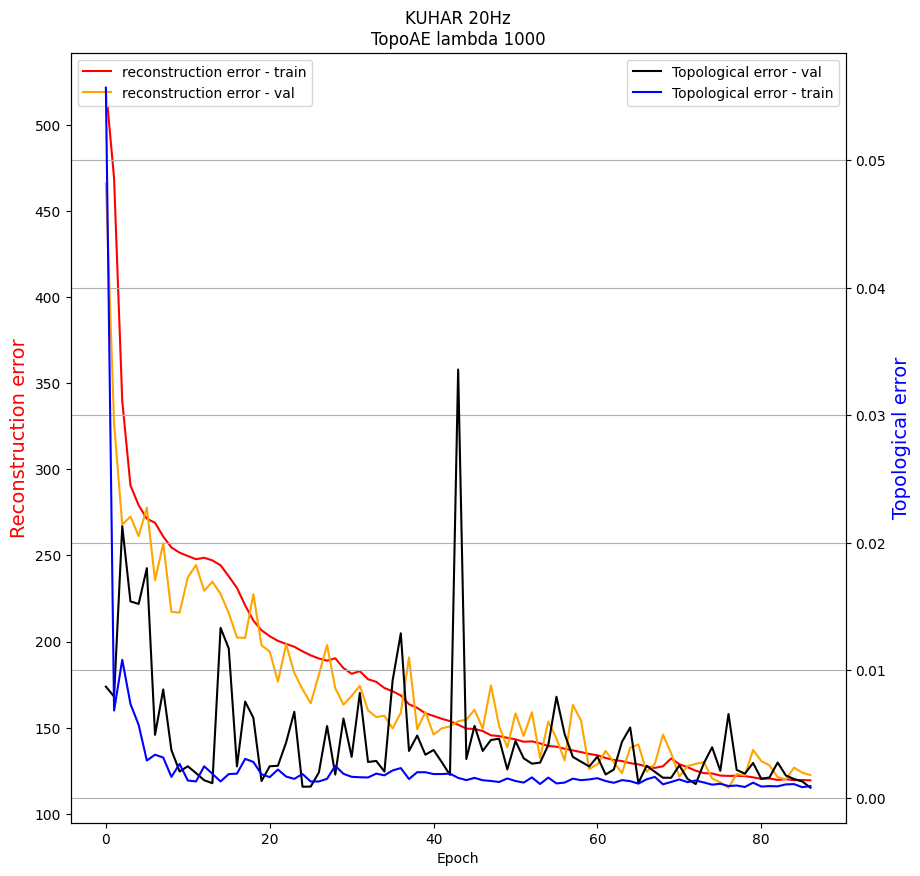

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:567.6276, Loss-ae:501.5161, Loss-topo:0.0661
Epoch:2, P:10, Loss:489.7153, Loss-ae:334.0798, Loss-topo:0.1556
Epoch:3, P:10, Loss:303.3706, Loss-ae:277.5690, Loss-topo:0.0258
Epoch:4, P:10, Loss:260.1364, Loss-ae:250.5353, Loss-topo:0.0096
Epoch:5, P:10, Loss:234.8519, Loss-ae:230.9949, Loss-topo:0.0039
Epoch:6, P:10, Loss:230.2132, Loss-ae:227.5073, Loss-topo:0.0027
Epoch:7, P:10, Loss:229.4567, Loss-ae:225.5004, Loss-topo:0.0040
Epoch:8, P:10, Loss:237.1212, Loss-ae:231.0275, Loss-topo:0.0061
Epoch:9, P:9, Loss:260.2993, Loss-ae:254.9428, Loss-topo:0.0054
Epoch:10, P:8, Loss:268.4436, Loss-ae:253.5412, Loss-topo:0.0149
Epoch:11, P:7, Loss:222.2618, Loss-ae:220.0313, Loss-topo:0.0022
Epoch:12, P:10, Loss:256.5920, Loss-ae:249.8676, Loss-topo:0.0067
Epoch:13, P:9, Loss:246.4940, Loss-ae:244.3249, Loss-topo:0.0022
Epoch:14, P:8, Loss:232.1

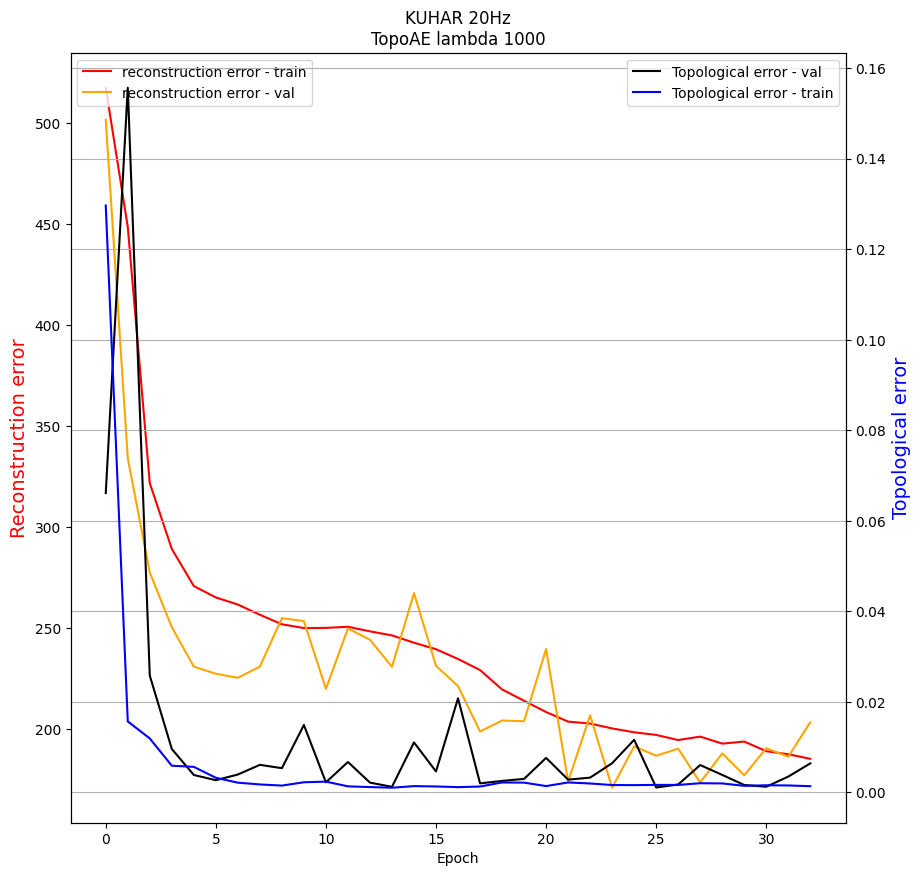

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 6
Epoch:1, P:10, Loss:491.7206, Loss-ae:477.1850, Loss-topo:0.0145
Epoch:2, P:10, Loss:353.4597, Loss-ae:346.0324, Loss-topo:0.0074
Epoch:3, P:10, Loss:282.2008, Loss-ae:270.9351, Loss-topo:0.0113
Epoch:4, P:10, Loss:257.8955, Loss-ae:244.7496, Loss-topo:0.0131
Epoch:5, P:10, Loss:288.6434, Loss-ae:261.6962, Loss-topo:0.0269
Epoch:6, P:9, Loss:270.4664, Loss-ae:261.2325, Loss-topo:0.0092
Epoch:7, P:8, Loss:222.5023, Loss-ae:220.9550, Loss-topo:0.0015
Epoch:8, P:10, Loss:255.7179, Loss-ae:242.4061, Loss-topo:0.0133
Epoch:9, P:9, Loss:227.3762, Loss-ae:223.7431, Loss-topo:0.0036
Epoch:10, P:8, Loss:217.4403, Loss-ae:213.5927, Loss-topo:0.0038
Epoch:11, P:10, Loss:240.2447, Loss-ae:229.7668, Loss-topo:0.0105
Epoch:12, P:9, Loss:255.0963, Loss-ae:250.3517, Loss-topo:0.0047
Epoch:13, P:8, Loss:253.0111, Loss-ae:246.6603, Loss-topo:0.0064
Epoch:14, P:7, Loss:225.204

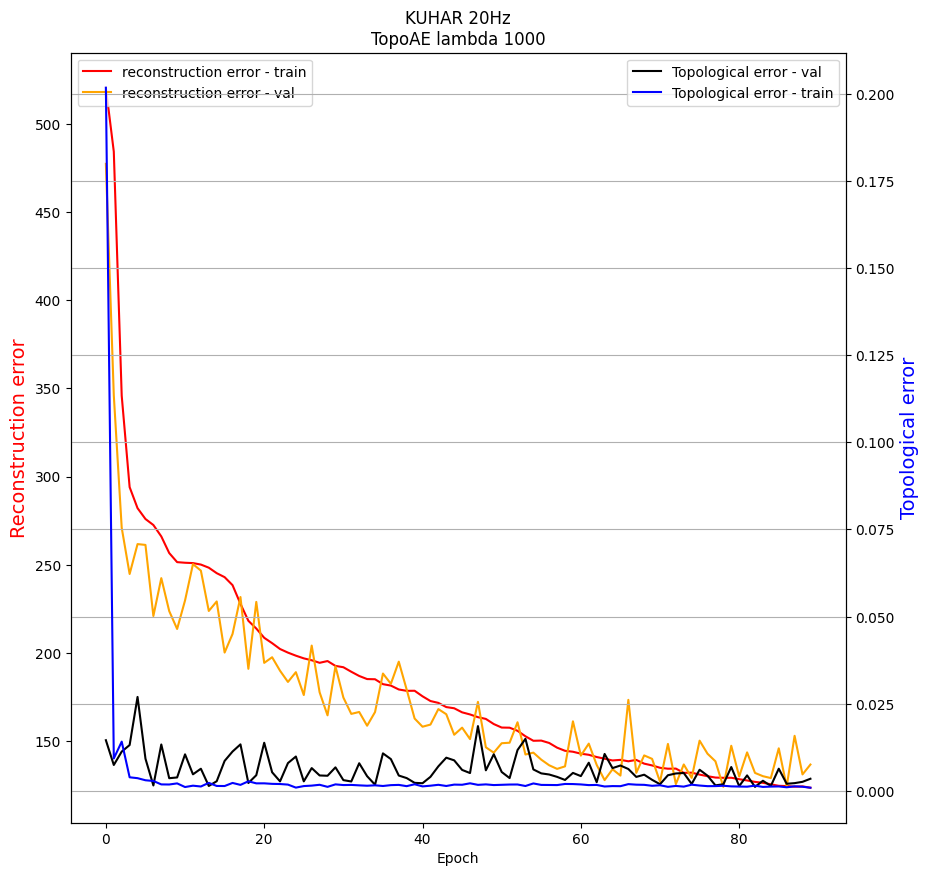

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:466.1311, Loss-ae:452.7421, Loss-topo:0.0134
Epoch:2, P:10, Loss:427.0818, Loss-ae:421.5316, Loss-topo:0.0056
Epoch:3, P:10, Loss:318.3387, Loss-ae:290.9342, Loss-topo:0.0274
Epoch:4, P:10, Loss:342.0957, Loss-ae:302.5552, Loss-topo:0.0395
Epoch:5, P:9, Loss:369.3195, Loss-ae:359.2604, Loss-topo:0.0101
Epoch:6, P:8, Loss:266.7367, Loss-ae:264.3388, Loss-topo:0.0024
Epoch:7, P:10, Loss:250.1656, Loss-ae:243.8519, Loss-topo:0.0063
Epoch:8, P:10, Loss:245.5169, Loss-ae:234.4755, Loss-topo:0.0110
Epoch:9, P:10, Loss:219.8758, Loss-ae:217.8469, Loss-topo:0.0020
Epoch:10, P:10, Loss:234.2246, Loss-ae:232.7087, Loss-topo:0.0015
Epoch:11, P:9, Loss:222.2858, Loss-ae:220.0925, Loss-topo:0.0022
Epoch:12, P:8, Loss:222.7709, Loss-ae:221.3457, Loss-topo:0.0014
Epoch:13, P:7, Loss:216.1146, Loss-ae:213.4748, Loss-topo:0.0026
Epoch:14, P:10, Loss:215.6

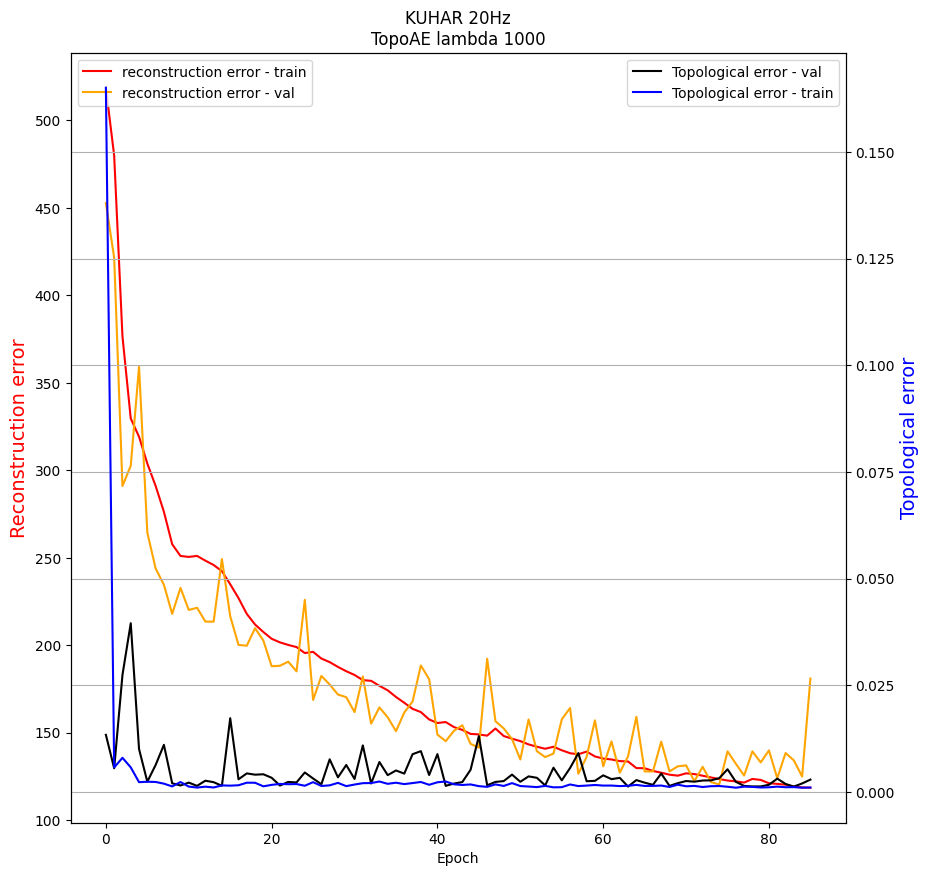

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:431.8841, Loss-ae:417.5352, Loss-topo:0.0143
Epoch:2, P:10, Loss:322.1213, Loss-ae:300.8518, Loss-topo:0.0213
Epoch:3, P:10, Loss:458.9517, Loss-ae:278.1956, Loss-topo:0.1808
Epoch:4, P:9, Loss:229.4839, Loss-ae:223.7524, Loss-topo:0.0057
Epoch:5, P:10, Loss:246.4453, Loss-ae:231.9973, Loss-topo:0.0144
Epoch:6, P:9, Loss:245.6061, Loss-ae:241.4353, Loss-topo:0.0042
Epoch:7, P:8, Loss:256.3104, Loss-ae:249.7647, Loss-topo:0.0065
Epoch:8, P:7, Loss:267.4435, Loss-ae:264.8963, Loss-topo:0.0025
Epoch:9, P:6, Loss:221.4420, Loss-ae:217.6878, Loss-topo:0.0038
Epoch:10, P:10, Loss:221.7921, Loss-ae:216.5662, Loss-topo:0.0052
Epoch:11, P:9, Loss:245.8471, Loss-ae:231.5999, Loss-topo:0.0142
Epoch:12, P:8, Loss:220.0945, Loss-ae:214.0781, Loss-topo:0.0060
Epoch:13, P:10, Loss:235.3031, Loss-ae:233.2709, Loss-topo:0.0020
Epoch:14, P:9, Loss:248.6457

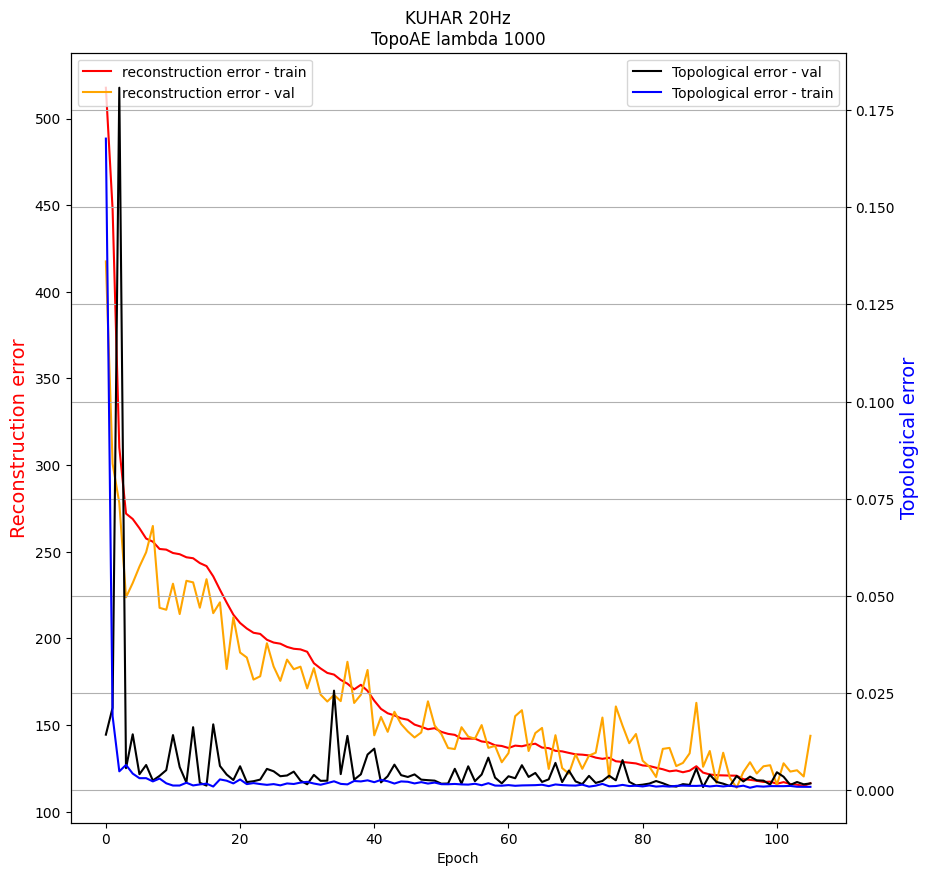

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:464.1130, Loss-ae:458.6582, Loss-topo:0.0055
Epoch:2, P:10, Loss:405.2565, Loss-ae:384.2352, Loss-topo:0.0210
Epoch:3, P:10, Loss:368.4794, Loss-ae:287.0020, Loss-topo:0.0815
Epoch:4, P:10, Loss:314.4414, Loss-ae:302.5727, Loss-topo:0.0119
Epoch:5, P:10, Loss:254.0003, Loss-ae:252.4736, Loss-topo:0.0015
Epoch:6, P:10, Loss:278.7828, Loss-ae:263.1158, Loss-topo:0.0157
Epoch:7, P:9, Loss:276.0111, Loss-ae:270.6752, Loss-topo:0.0053
Epoch:8, P:8, Loss:234.9608, Loss-ae:233.1144, Loss-topo:0.0018
Epoch:9, P:10, Loss:211.7827, Loss-ae:205.7402, Loss-topo:0.0060
Epoch:10, P:10, Loss:247.0323, Loss-ae:238.2173, Loss-topo:0.0088
Epoch:11, P:9, Loss:216.7593, Loss-ae:212.9584, Loss-topo:0.0038
Epoch:12, P:8, Loss:239.7480, Loss-ae:234.1256, Loss-topo:0.0056
Epoch:13, P:7, Loss:207.1692, Loss-ae:205.1174, Loss-topo:0.0021
Epoch:14, P:10, Loss:239.8

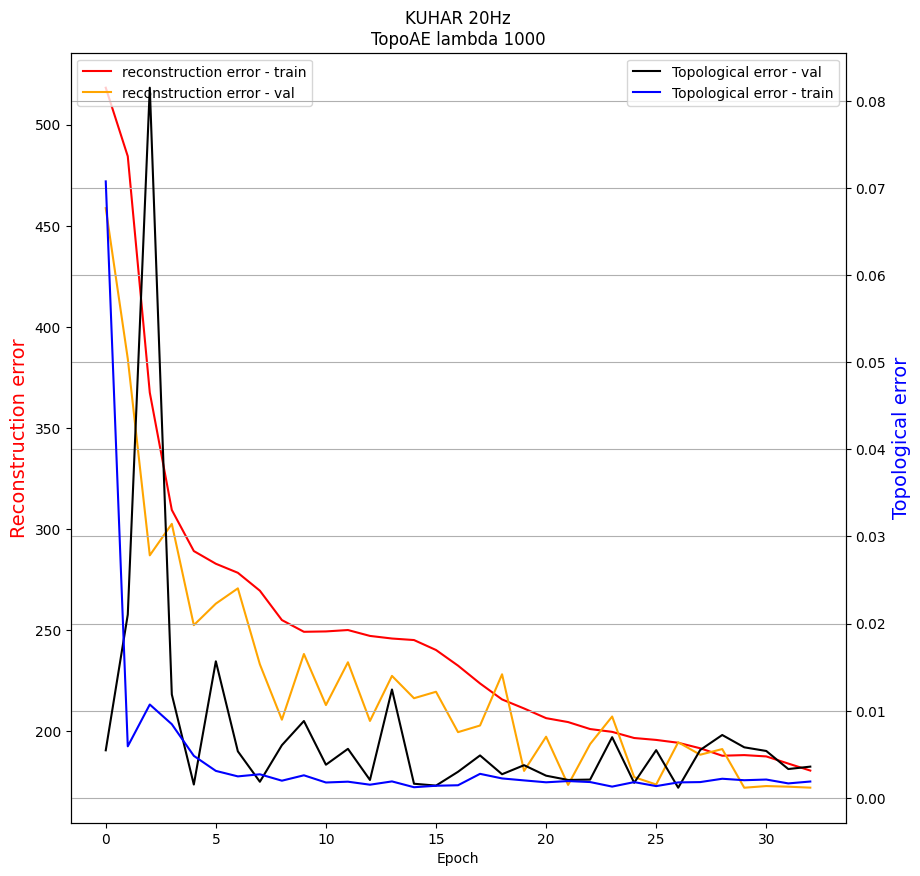

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:565.6655, Loss-ae:522.8432, Loss-topo:0.0428
Epoch:2, P:10, Loss:376.9975, Loss-ae:360.1015, Loss-topo:0.0169
Epoch:3, P:10, Loss:287.6850, Loss-ae:265.7739, Loss-topo:0.0219
Epoch:4, P:10, Loss:235.2291, Loss-ae:224.0231, Loss-topo:0.0112
Epoch:5, P:10, Loss:277.9287, Loss-ae:263.9196, Loss-topo:0.0140
Epoch:6, P:9, Loss:243.8002, Loss-ae:235.4386, Loss-topo:0.0084
Epoch:7, P:8, Loss:271.0121, Loss-ae:265.4178, Loss-topo:0.0056
Epoch:8, P:7, Loss:246.5760, Loss-ae:240.1731, Loss-topo:0.0064
Epoch:9, P:6, Loss:226.2384, Loss-ae:224.4475, Loss-topo:0.0018
Epoch:10, P:10, Loss:216.6591, Loss-ae:213.0543, Loss-topo:0.0036
Epoch:11, P:10, Loss:221.7071, Loss-ae:219.6794, Loss-topo:0.0020
Epoch:12, P:9, Loss:230.0666, Loss-ae:228.1545, Loss-topo:0.0019
Epoch:13, P:8, Loss:212.6735, Loss-ae:211.2156, Loss-topo:0.0015
Epoch:14, P:10, Loss:212.95

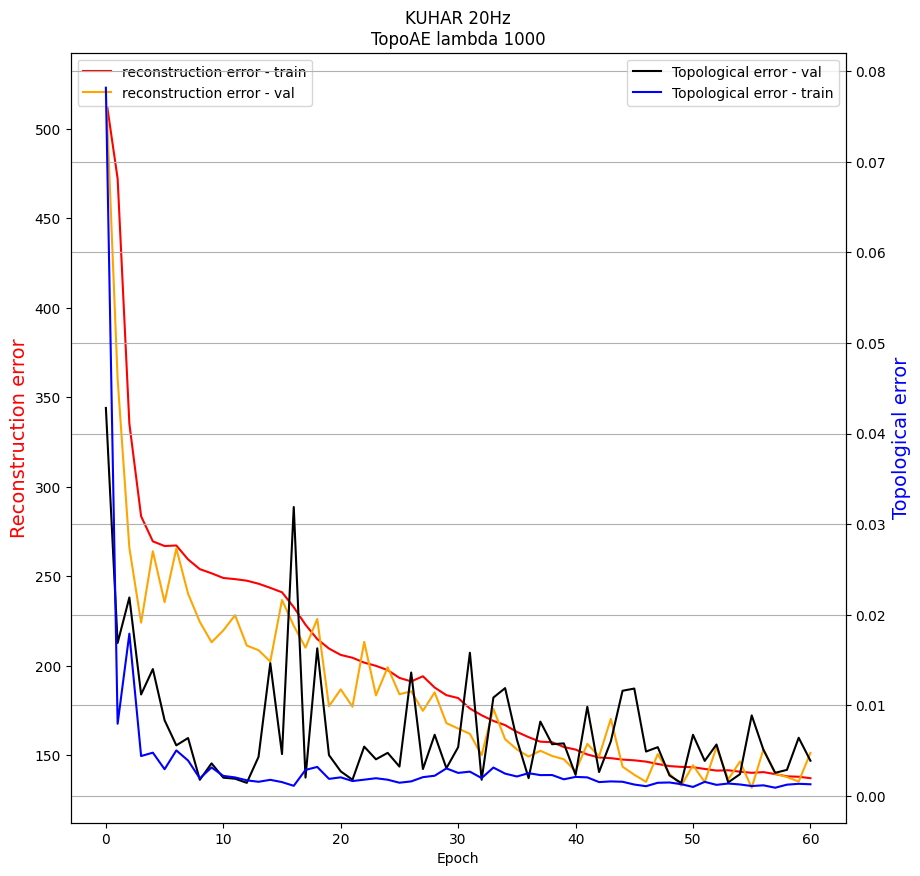

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:427.9566, Loss-ae:423.4519, Loss-topo:0.0045
Epoch:2, P:10, Loss:357.0787, Loss-ae:348.0783, Loss-topo:0.0090
Epoch:3, P:10, Loss:288.6673, Loss-ae:277.5899, Loss-topo:0.0111
Epoch:4, P:10, Loss:286.2455, Loss-ae:280.8344, Loss-topo:0.0054
Epoch:5, P:10, Loss:320.6828, Loss-ae:286.6214, Loss-topo:0.0341
Epoch:6, P:9, Loss:308.1472, Loss-ae:302.5897, Loss-topo:0.0056
Epoch:7, P:8, Loss:329.1248, Loss-ae:325.9457, Loss-topo:0.0032
Epoch:8, P:7, Loss:294.6942, Loss-ae:260.3734, Loss-topo:0.0343
Epoch:9, P:6, Loss:224.8018, Loss-ae:216.2515, Loss-topo:0.0086
Epoch:10, P:10, Loss:218.4492, Loss-ae:215.9355, Loss-topo:0.0025
Epoch:11, P:10, Loss:227.5977, Loss-ae:224.8185, Loss-topo:0.0028
Epoch:12, P:9, Loss:222.7194, Loss-ae:220.9281, Loss-topo:0.0018
Epoch:13, P:8, Loss:273.0537, Loss-ae:249.1957, Loss-topo:0.0239
Epoch:14, P:7, Loss:219.527

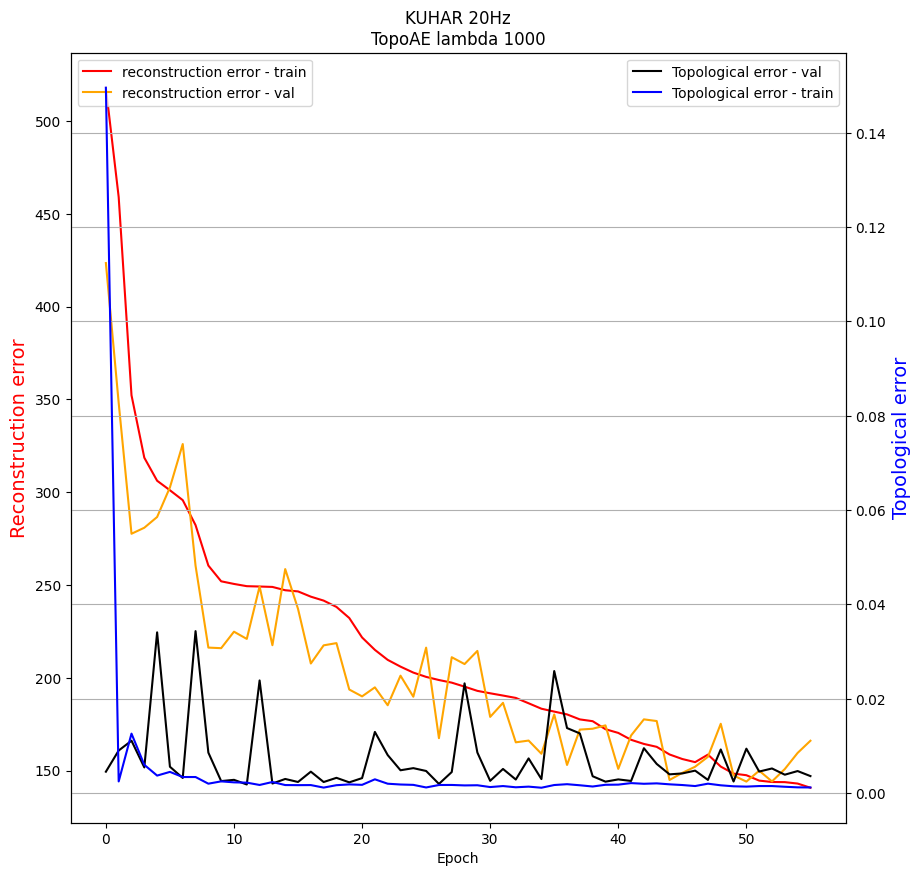

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:463.8004, Loss-ae:455.9416, Loss-topo:0.0079
Epoch:2, P:10, Loss:406.0882, Loss-ae:398.5749, Loss-topo:0.0075
Epoch:3, P:10, Loss:335.2946, Loss-ae:284.0315, Loss-topo:0.0513
Epoch:4, P:10, Loss:281.7501, Loss-ae:260.1663, Loss-topo:0.0216
Epoch:5, P:10, Loss:240.5901, Loss-ae:237.2210, Loss-topo:0.0034
Epoch:6, P:10, Loss:227.7994, Loss-ae:224.3736, Loss-topo:0.0034
Epoch:7, P:10, Loss:248.3312, Loss-ae:243.4421, Loss-topo:0.0049
Epoch:8, P:9, Loss:279.7836, Loss-ae:255.0524, Loss-topo:0.0247
Epoch:9, P:8, Loss:223.9291, Loss-ae:217.5831, Loss-topo:0.0063
Epoch:10, P:10, Loss:217.2365, Loss-ae:212.5617, Loss-topo:0.0047
Epoch:11, P:10, Loss:259.4926, Loss-ae:253.6567, Loss-topo:0.0058
Epoch:12, P:9, Loss:211.7882, Loss-ae:206.8984, Loss-topo:0.0049
Epoch:13, P:10, Loss:229.0733, Loss-ae:227.2933, Loss-topo:0.0018
Epoch:14, P:9, Loss:233.

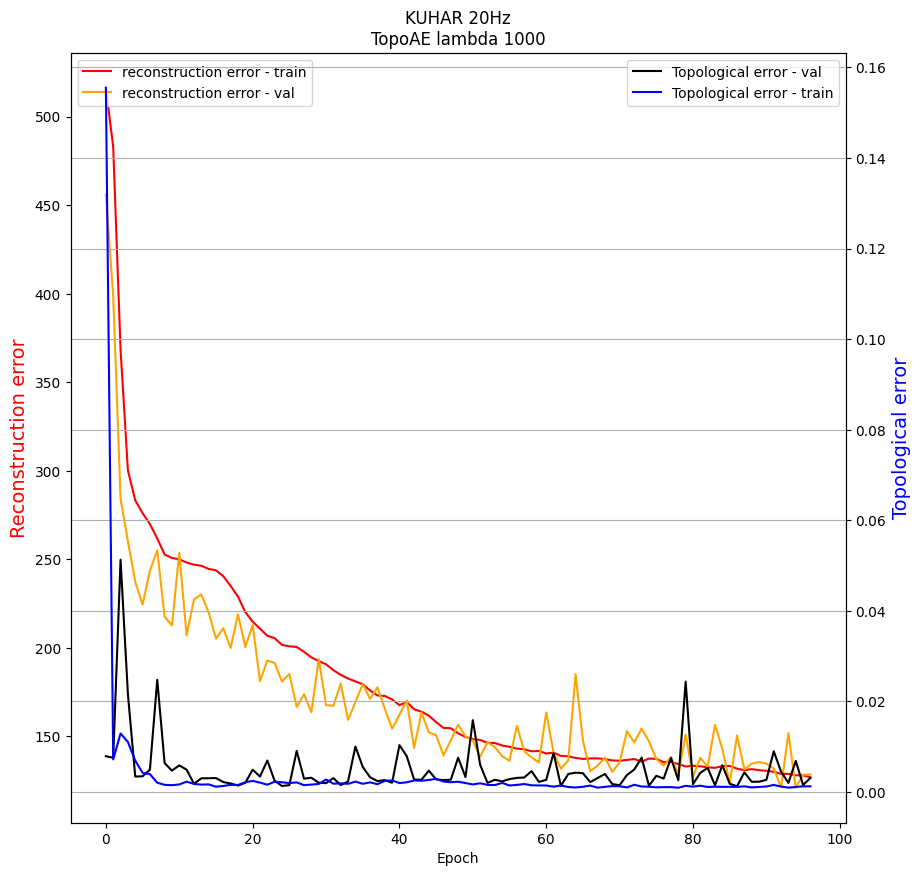

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:466.5712, Loss-ae:450.4387, Loss-topo:0.0161
Epoch:2, P:10, Loss:368.4546, Loss-ae:351.1675, Loss-topo:0.0173
Epoch:3, P:10, Loss:274.7869, Loss-ae:270.6102, Loss-topo:0.0042
Epoch:4, P:10, Loss:272.0073, Loss-ae:262.3171, Loss-topo:0.0097
Epoch:5, P:10, Loss:243.5680, Loss-ae:239.5504, Loss-topo:0.0040
Epoch:6, P:10, Loss:248.5275, Loss-ae:247.0104, Loss-topo:0.0015
Epoch:7, P:9, Loss:241.3554, Loss-ae:237.9660, Loss-topo:0.0034
Epoch:8, P:10, Loss:290.0376, Loss-ae:281.7873, Loss-topo:0.0083
Epoch:9, P:9, Loss:343.8712, Loss-ae:339.2995, Loss-topo:0.0046
Epoch:10, P:8, Loss:281.7371, Loss-ae:278.7095, Loss-topo:0.0030
Epoch:11, P:7, Loss:219.4708, Loss-ae:218.4091, Loss-topo:0.0011
Epoch:12, P:10, Loss:211.4593, Loss-ae:206.5735, Loss-topo:0.0049
Epoch:13, P:10, Loss:228.3479, Loss-ae:225.0041, Loss-topo:0.0033
Epoch:14, P:9, Loss:231.0

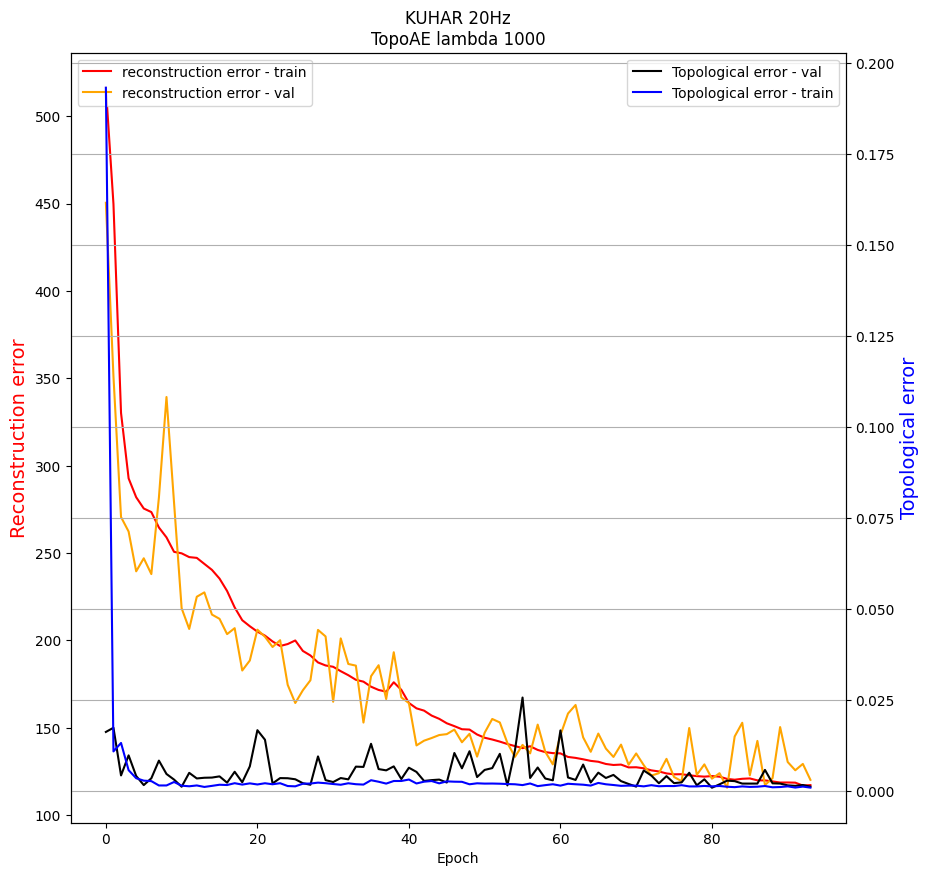

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:486.8081, Loss-ae:456.1032, Loss-topo:0.0307
Epoch:2, P:10, Loss:402.5987, Loss-ae:398.8566, Loss-topo:0.0037
Epoch:3, P:10, Loss:396.2442, Loss-ae:376.5066, Loss-topo:0.0197
Epoch:4, P:10, Loss:335.5269, Loss-ae:291.0047, Loss-topo:0.0445
Epoch:5, P:10, Loss:256.0086, Loss-ae:239.2349, Loss-topo:0.0168
Epoch:6, P:10, Loss:235.3332, Loss-ae:231.6752, Loss-topo:0.0037
Epoch:7, P:10, Loss:299.6406, Loss-ae:293.8380, Loss-topo:0.0058
Epoch:8, P:9, Loss:300.3261, Loss-ae:291.5699, Loss-topo:0.0088
Epoch:9, P:8, Loss:275.2481, Loss-ae:232.6269, Loss-topo:0.0426
Epoch:10, P:7, Loss:254.8005, Loss-ae:239.1952, Loss-topo:0.0156
Epoch:11, P:6, Loss:236.7197, Loss-ae:233.3848, Loss-topo:0.0033
Epoch:12, P:5, Loss:224.8303, Loss-ae:222.3723, Loss-topo:0.0025
Epoch:13, P:10, Loss:227.4256, Loss-ae:222.4037, Loss-topo:0.0050
Epoch:14, P:9, Loss:223.01

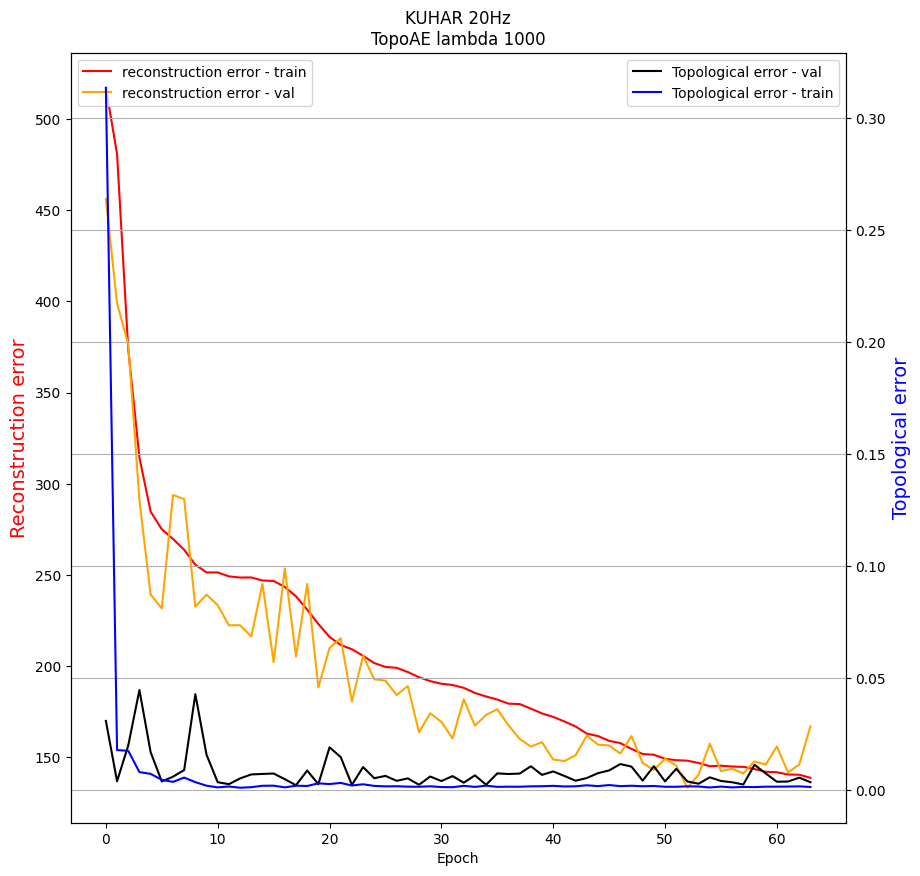

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:546.2847, Loss-ae:515.5360, Loss-topo:0.0307
Epoch:2, P:10, Loss:343.0421, Loss-ae:330.3516, Loss-topo:0.0127
Epoch:3, P:10, Loss:262.0892, Loss-ae:256.7683, Loss-topo:0.0053
Epoch:4, P:10, Loss:289.1184, Loss-ae:264.6624, Loss-topo:0.0245
Epoch:5, P:9, Loss:253.3784, Loss-ae:247.1112, Loss-topo:0.0063
Epoch:6, P:10, Loss:238.2566, Loss-ae:234.6835, Loss-topo:0.0036
Epoch:7, P:10, Loss:295.6498, Loss-ae:288.3561, Loss-topo:0.0073
Epoch:8, P:9, Loss:296.7140, Loss-ae:285.6570, Loss-topo:0.0111
Epoch:9, P:8, Loss:256.1119, Loss-ae:248.0457, Loss-topo:0.0081
Epoch:10, P:7, Loss:229.5172, Loss-ae:227.2969, Loss-topo:0.0022
Epoch:11, P:10, Loss:250.5062, Loss-ae:248.3573, Loss-topo:0.0021
Epoch:12, P:9, Loss:236.0266, Loss-ae:232.1066, Loss-topo:0.0039
Epoch:13, P:8, Loss:259.1134, Loss-ae:256.0413, Loss-topo:0.0031
Epoch:14, P:7, Loss:206.388

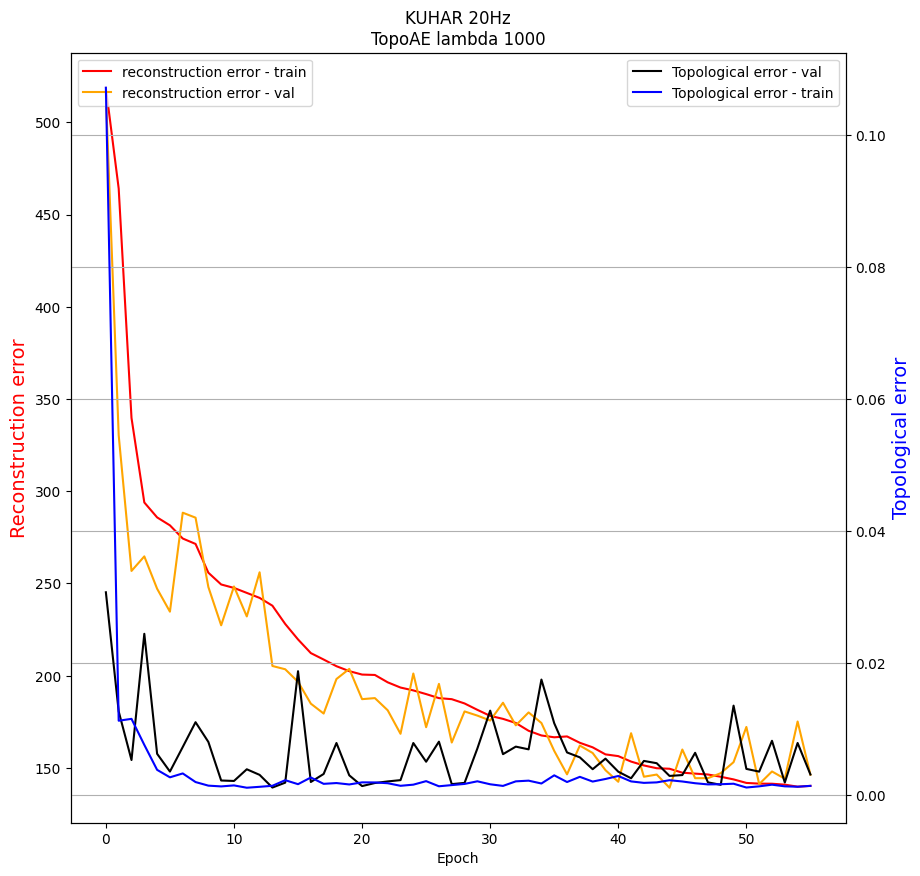

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 7
Epoch:1, P:10, Loss:431.6111, Loss-ae:424.7373, Loss-topo:0.0069
Epoch:2, P:10, Loss:384.4774, Loss-ae:371.6206, Loss-topo:0.0129
Epoch:3, P:10, Loss:328.5076, Loss-ae:313.7431, Loss-topo:0.0148
Epoch:4, P:10, Loss:308.1988, Loss-ae:281.2224, Loss-topo:0.0270
Epoch:5, P:10, Loss:288.5251, Loss-ae:281.2313, Loss-topo:0.0073
Epoch:6, P:10, Loss:322.7497, Loss-ae:292.2710, Loss-topo:0.0305
Epoch:7, P:9, Loss:280.6611, Loss-ae:276.6490, Loss-topo:0.0040
Epoch:8, P:10, Loss:256.9465, Loss-ae:253.8762, Loss-topo:0.0031
Epoch:9, P:10, Loss:237.1387, Loss-ae:232.6406, Loss-topo:0.0045
Epoch:10, P:10, Loss:229.4308, Loss-ae:227.4089, Loss-topo:0.0020
Epoch:11, P:10, Loss:251.7718, Loss-ae:244.9529, Loss-topo:0.0068
Epoch:12, P:9, Loss:229.2548, Loss-ae:226.0496, Loss-topo:0.0032
Epoch:13, P:10, Loss:262.9318, Loss-ae:257.1615, Loss-topo:0.0058
Epoch:14, P:9, Loss:211

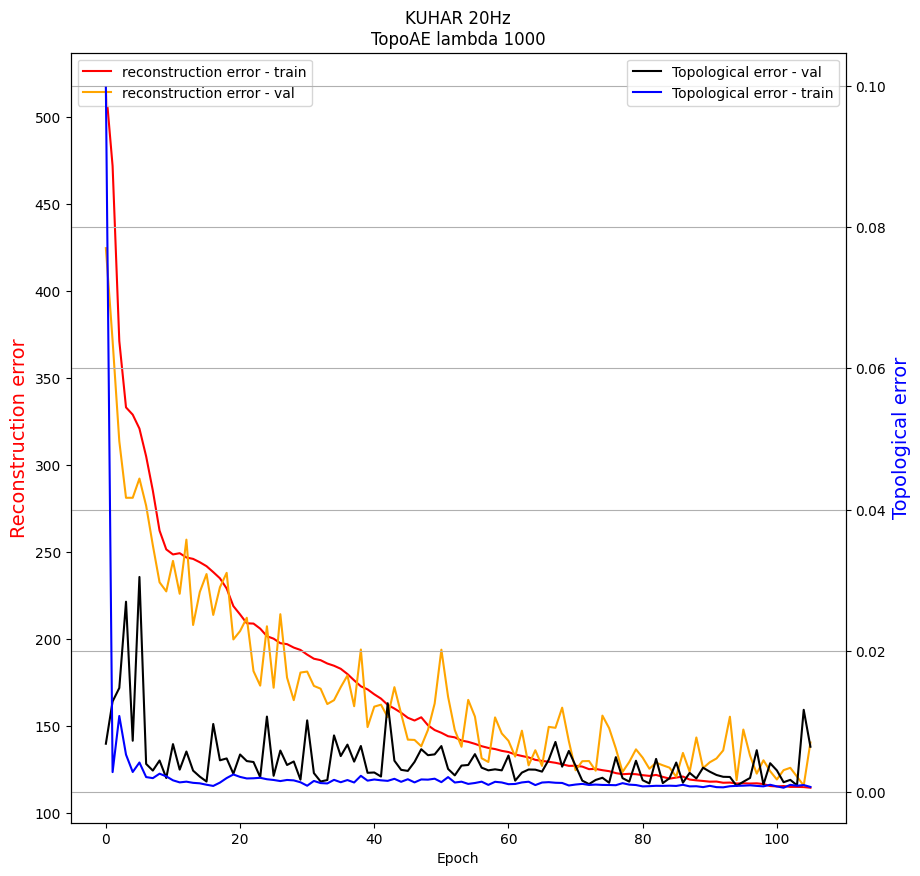

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:464.5125, Loss-ae:459.0150, Loss-topo:0.0055
Epoch:2, P:10, Loss:471.0737, Loss-ae:459.8619, Loss-topo:0.0112
Epoch:3, P:9, Loss:320.4671, Loss-ae:301.1976, Loss-topo:0.0193
Epoch:4, P:10, Loss:244.9981, Loss-ae:241.7039, Loss-topo:0.0033
Epoch:5, P:10, Loss:245.0362, Loss-ae:241.0819, Loss-topo:0.0040
Epoch:6, P:9, Loss:237.7894, Loss-ae:225.1474, Loss-topo:0.0126
Epoch:7, P:10, Loss:233.3068, Loss-ae:220.2142, Loss-topo:0.0131
Epoch:8, P:10, Loss:257.8139, Loss-ae:248.9618, Loss-topo:0.0089
Epoch:9, P:9, Loss:239.0218, Loss-ae:232.6036, Loss-topo:0.0064
Epoch:10, P:8, Loss:286.4670, Loss-ae:279.0137, Loss-topo:0.0075
Epoch:11, P:7, Loss:220.2467, Loss-ae:216.4769, Loss-topo:0.0038
Epoch:12, P:10, Loss:216.3044, Loss-ae:213.4171, Loss-topo:0.0029
Epoch:13, P:10, Loss:264.4283, Loss-ae:251.9080, Loss-topo:0.0125
Epoch:14, P:9, Loss:274.94

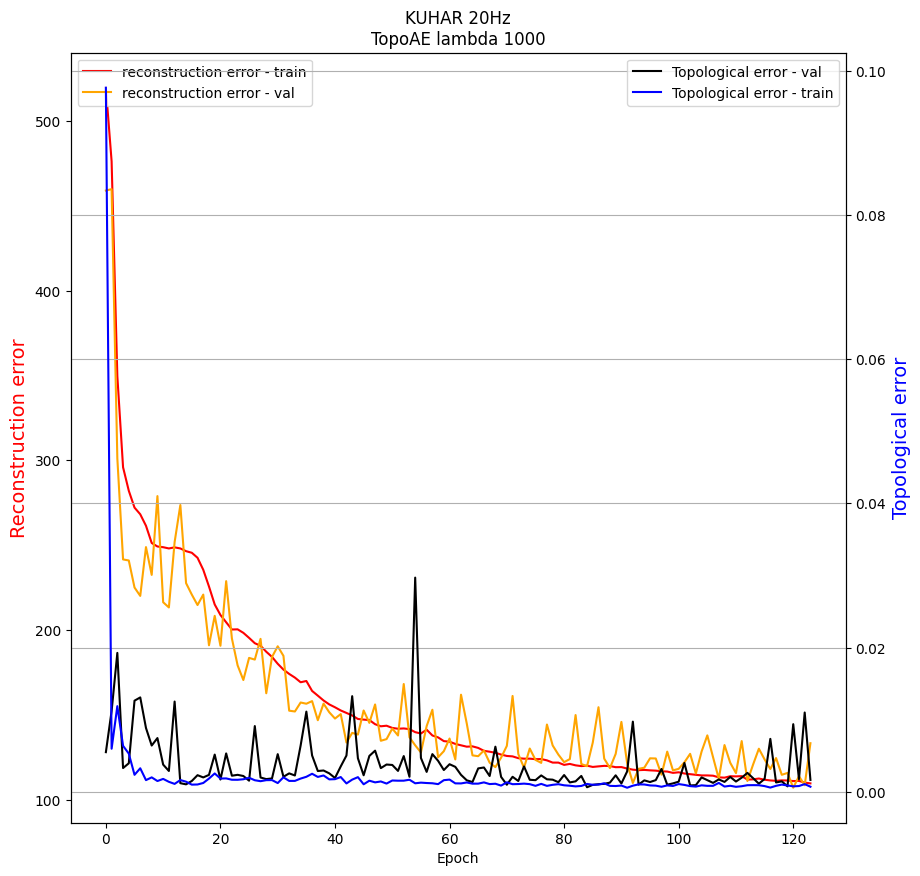

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:442.5253, Loss-ae:433.2558, Loss-topo:0.0093
Epoch:2, P:10, Loss:461.7694, Loss-ae:382.0030, Loss-topo:0.0798
Epoch:3, P:9, Loss:352.8448, Loss-ae:341.0434, Loss-topo:0.0118
Epoch:4, P:10, Loss:252.1024, Loss-ae:247.8034, Loss-topo:0.0043
Epoch:5, P:10, Loss:295.5565, Loss-ae:292.7139, Loss-topo:0.0028
Epoch:6, P:9, Loss:265.9404, Loss-ae:260.2814, Loss-topo:0.0057
Epoch:7, P:8, Loss:248.4894, Loss-ae:246.4004, Loss-topo:0.0021
Epoch:8, P:10, Loss:278.2225, Loss-ae:273.9710, Loss-topo:0.0043
Epoch:9, P:9, Loss:230.0293, Loss-ae:224.8044, Loss-topo:0.0052
Epoch:10, P:10, Loss:229.1307, Loss-ae:227.7463, Loss-topo:0.0014
Epoch:11, P:10, Loss:219.8777, Loss-ae:218.8823, Loss-topo:0.0010
Epoch:12, P:10, Loss:246.7372, Loss-ae:245.0593, Loss-topo:0.0017
Epoch:13, P:9, Loss:261.9738, Loss-ae:249.2307, Loss-topo:0.0127
Epoch:14, P:8, Loss:254.08

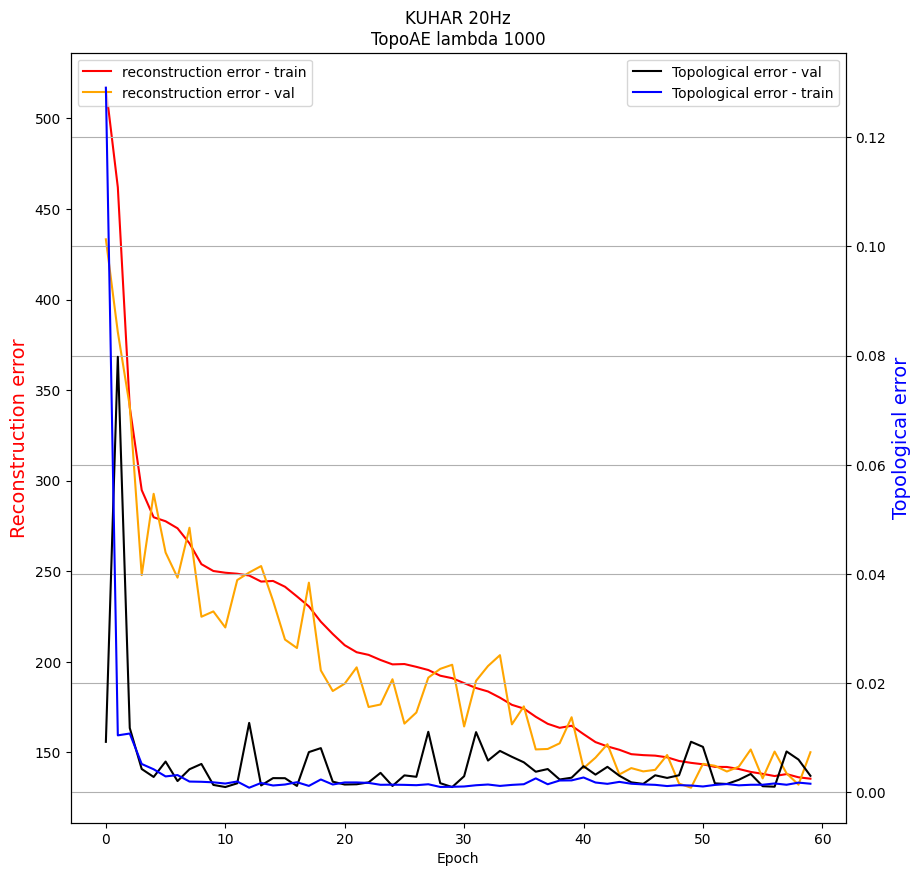

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:517.7508, Loss-ae:476.1043, Loss-topo:0.0416
Epoch:2, P:10, Loss:389.9628, Loss-ae:380.4490, Loss-topo:0.0095
Epoch:3, P:10, Loss:347.0806, Loss-ae:326.9580, Loss-topo:0.0201
Epoch:4, P:10, Loss:237.5167, Loss-ae:225.8496, Loss-topo:0.0117
Epoch:5, P:10, Loss:290.5799, Loss-ae:269.8664, Loss-topo:0.0207
Epoch:6, P:9, Loss:250.3129, Loss-ae:248.0236, Loss-topo:0.0023
Epoch:7, P:8, Loss:246.7695, Loss-ae:243.9863, Loss-topo:0.0028
Epoch:8, P:7, Loss:236.9544, Loss-ae:233.1029, Loss-topo:0.0039
Epoch:9, P:10, Loss:282.2437, Loss-ae:276.6134, Loss-topo:0.0056
Epoch:10, P:9, Loss:248.5694, Loss-ae:240.2954, Loss-topo:0.0083
Epoch:11, P:8, Loss:216.8569, Loss-ae:212.5223, Loss-topo:0.0043
Epoch:12, P:10, Loss:252.2783, Loss-ae:244.8008, Loss-topo:0.0075
Epoch:13, P:9, Loss:234.8916, Loss-ae:229.9505, Loss-topo:0.0049
Epoch:14, P:8, Loss:224.786

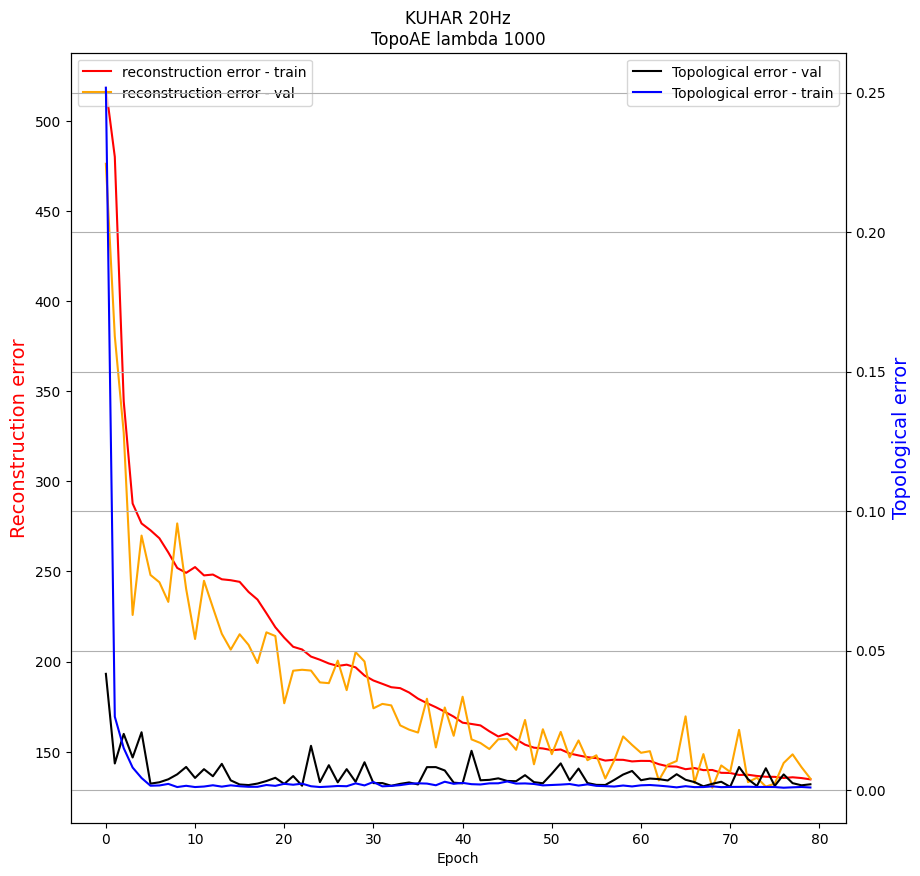

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:483.4773, Loss-ae:463.6422, Loss-topo:0.0198
Epoch:2, P:10, Loss:349.6659, Loss-ae:336.8937, Loss-topo:0.0128
Epoch:3, P:10, Loss:387.4272, Loss-ae:275.9604, Loss-topo:0.1115
Epoch:4, P:9, Loss:266.2589, Loss-ae:261.5573, Loss-topo:0.0047
Epoch:5, P:10, Loss:236.4510, Loss-ae:232.7958, Loss-topo:0.0037
Epoch:6, P:10, Loss:278.5784, Loss-ae:275.3670, Loss-topo:0.0032
Epoch:7, P:9, Loss:266.0360, Loss-ae:264.8349, Loss-topo:0.0012
Epoch:8, P:8, Loss:240.7410, Loss-ae:239.6798, Loss-topo:0.0011
Epoch:9, P:7, Loss:222.9785, Loss-ae:222.1531, Loss-topo:0.0008
Epoch:10, P:10, Loss:229.3666, Loss-ae:226.9686, Loss-topo:0.0024
Epoch:11, P:9, Loss:278.8773, Loss-ae:276.4313, Loss-topo:0.0024
Epoch:12, P:8, Loss:216.6352, Loss-ae:213.6138, Loss-topo:0.0030
Epoch:13, P:10, Loss:250.8178, Loss-ae:245.0695, Loss-topo:0.0057
Epoch:14, P:9, Loss:222.317

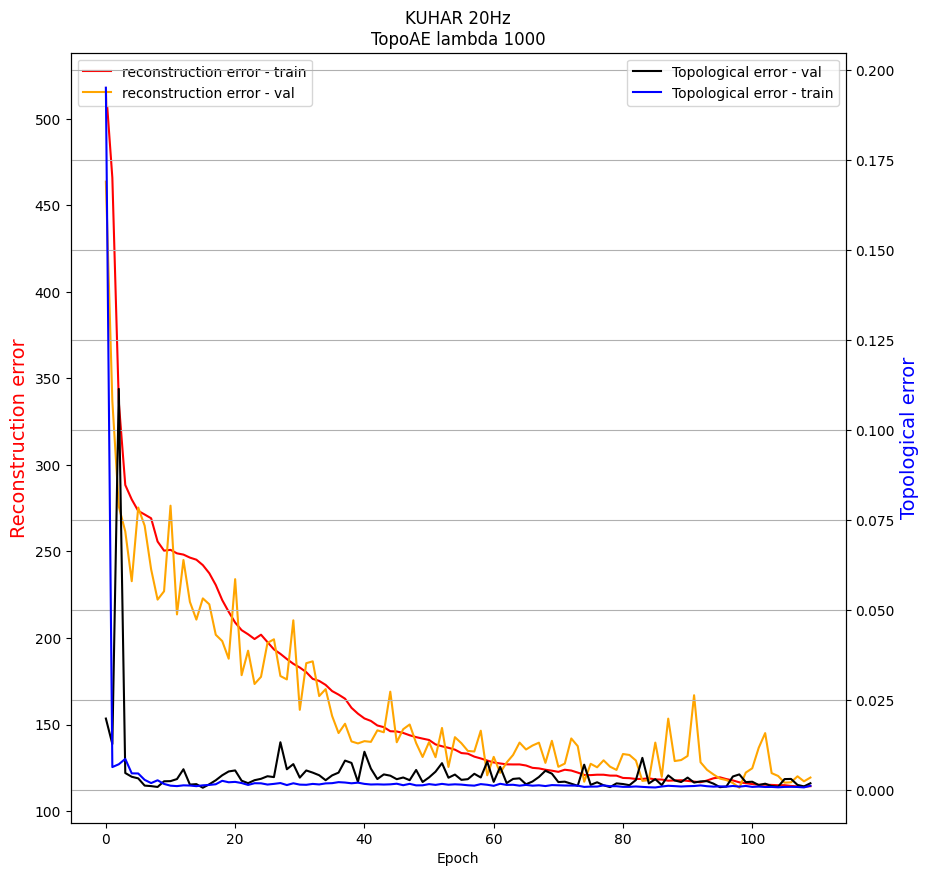

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:438.9470, Loss-ae:418.1157, Loss-topo:0.0208
Epoch:2, P:10, Loss:371.9503, Loss-ae:368.8711, Loss-topo:0.0031
Epoch:3, P:10, Loss:263.8700, Loss-ae:254.8605, Loss-topo:0.0090
Epoch:4, P:10, Loss:329.2340, Loss-ae:286.5087, Loss-topo:0.0427
Epoch:5, P:9, Loss:243.4418, Loss-ae:239.1184, Loss-topo:0.0043
Epoch:6, P:10, Loss:248.5059, Loss-ae:244.5035, Loss-topo:0.0040
Epoch:7, P:9, Loss:232.6534, Loss-ae:225.4215, Loss-topo:0.0072
Epoch:8, P:10, Loss:242.6462, Loss-ae:237.3156, Loss-topo:0.0053
Epoch:9, P:9, Loss:221.1419, Loss-ae:219.8089, Loss-topo:0.0013
Epoch:10, P:10, Loss:228.3300, Loss-ae:227.0977, Loss-topo:0.0012
Epoch:11, P:9, Loss:227.4476, Loss-ae:226.2070, Loss-topo:0.0012
Epoch:12, P:8, Loss:249.8875, Loss-ae:241.5982, Loss-topo:0.0083
Epoch:13, P:7, Loss:222.2826, Loss-ae:216.5992, Loss-topo:0.0057
Epoch:14, P:6, Loss:250.508

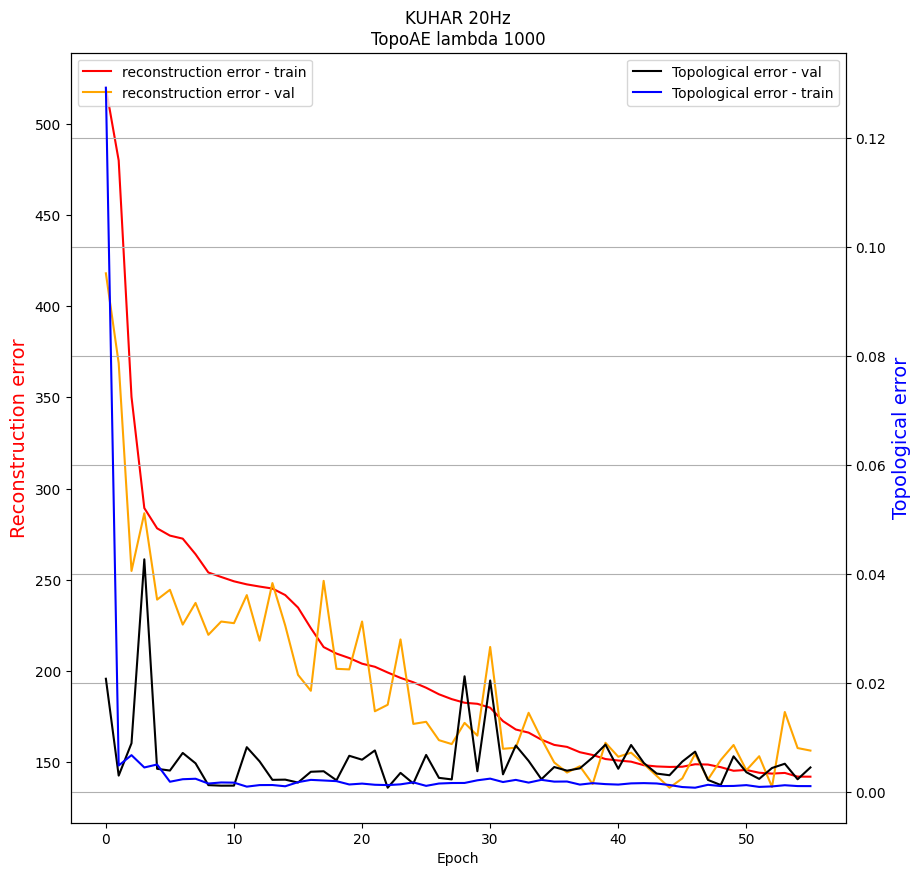

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:462.2110, Loss-ae:437.6068, Loss-topo:0.0246
Epoch:2, P:10, Loss:463.7370, Loss-ae:460.5171, Loss-topo:0.0032
Epoch:3, P:9, Loss:323.8777, Loss-ae:289.9334, Loss-topo:0.0339
Epoch:4, P:10, Loss:306.4245, Loss-ae:299.3355, Loss-topo:0.0071
Epoch:5, P:10, Loss:277.2770, Loss-ae:268.1974, Loss-topo:0.0091
Epoch:6, P:10, Loss:300.7891, Loss-ae:290.7563, Loss-topo:0.0100
Epoch:7, P:9, Loss:261.0481, Loss-ae:255.5691, Loss-topo:0.0055
Epoch:8, P:10, Loss:271.9817, Loss-ae:249.7933, Loss-topo:0.0222
Epoch:9, P:9, Loss:226.8344, Loss-ae:224.8583, Loss-topo:0.0020
Epoch:10, P:10, Loss:244.7697, Loss-ae:242.4290, Loss-topo:0.0023
Epoch:11, P:9, Loss:266.6558, Loss-ae:260.0297, Loss-topo:0.0066
Epoch:12, P:8, Loss:225.8075, Loss-ae:223.0917, Loss-topo:0.0027
Epoch:13, P:10, Loss:230.6479, Loss-ae:227.2374, Loss-topo:0.0034
Epoch:14, P:9, Loss:258.11

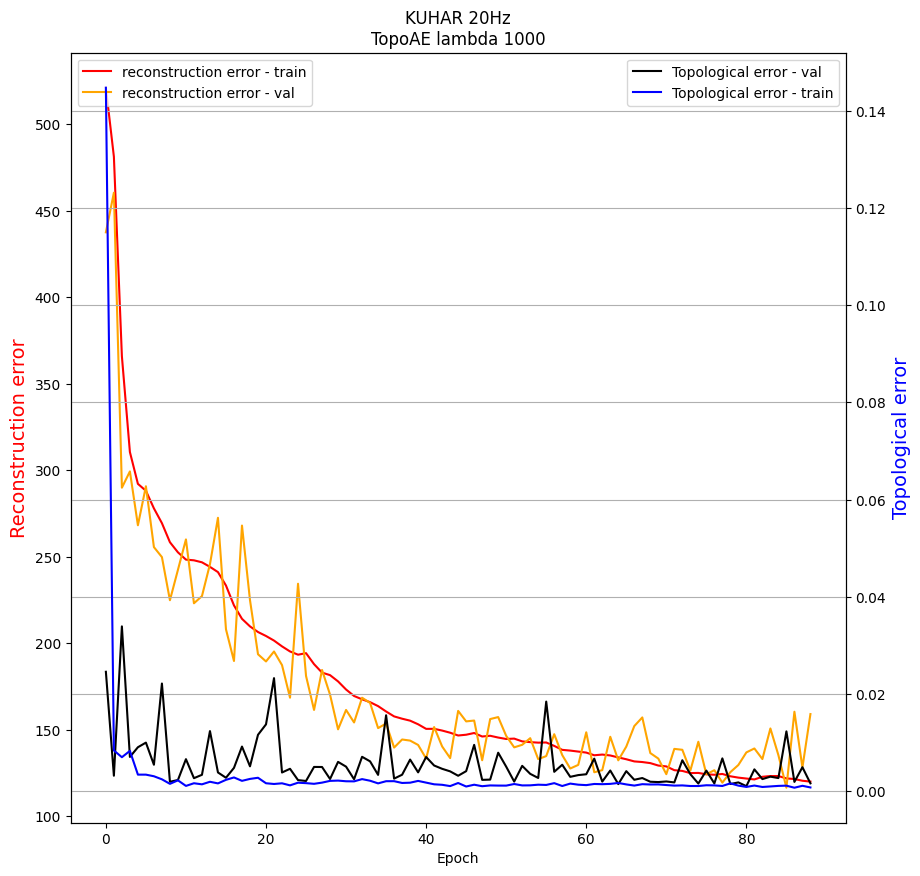

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:455.1333, Loss-ae:434.7890, Loss-topo:0.0203
Epoch:2, P:10, Loss:368.0907, Loss-ae:362.2019, Loss-topo:0.0059
Epoch:3, P:10, Loss:342.2566, Loss-ae:326.1445, Loss-topo:0.0161
Epoch:4, P:10, Loss:388.0551, Loss-ae:379.9852, Loss-topo:0.0081
Epoch:5, P:9, Loss:293.5722, Loss-ae:292.1325, Loss-topo:0.0014
Epoch:6, P:10, Loss:273.1481, Loss-ae:268.6322, Loss-topo:0.0045
Epoch:7, P:10, Loss:318.0481, Loss-ae:316.7355, Loss-topo:0.0013
Epoch:8, P:9, Loss:270.4818, Loss-ae:262.1122, Loss-topo:0.0084
Epoch:9, P:10, Loss:223.7535, Loss-ae:220.0041, Loss-topo:0.0037
Epoch:10, P:10, Loss:243.2931, Loss-ae:233.8216, Loss-topo:0.0095
Epoch:11, P:9, Loss:217.2869, Loss-ae:215.7678, Loss-topo:0.0015
Epoch:12, P:10, Loss:239.4261, Loss-ae:236.2194, Loss-topo:0.0032
Epoch:13, P:9, Loss:224.8570, Loss-ae:223.2387, Loss-topo:0.0016
Epoch:14, P:8, Loss:207.6

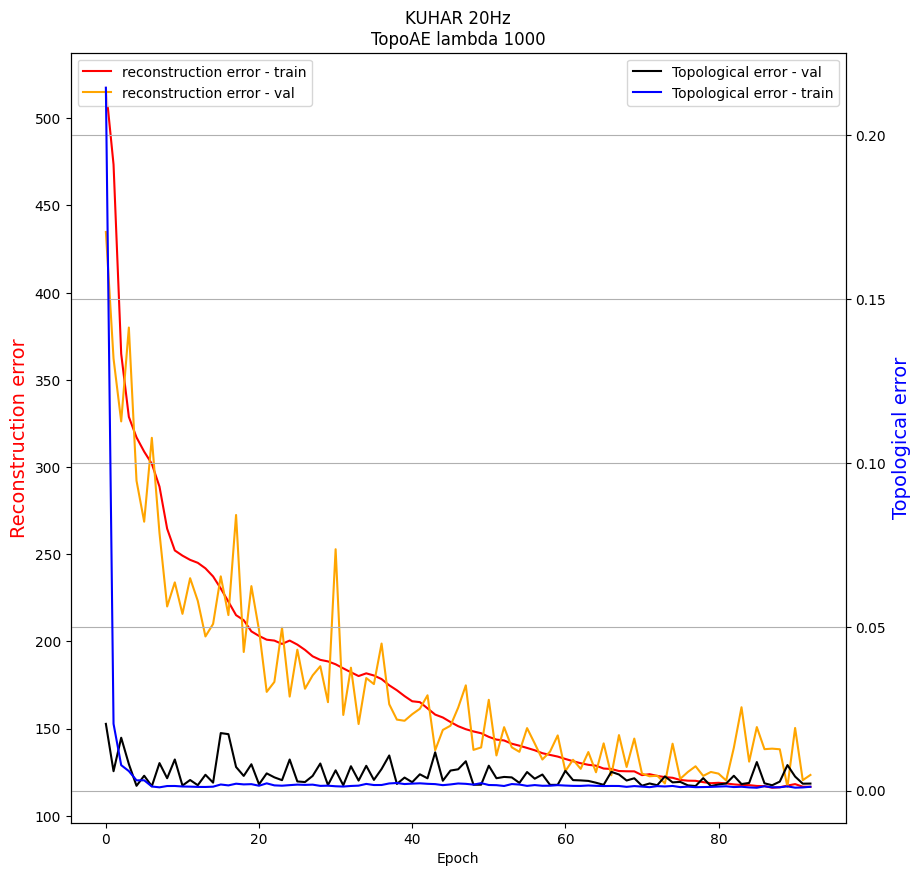

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:497.1056, Loss-ae:481.8749, Loss-topo:0.0152
Epoch:2, P:10, Loss:381.4926, Loss-ae:379.8213, Loss-topo:0.0017
Epoch:3, P:10, Loss:330.0746, Loss-ae:305.5003, Loss-topo:0.0246
Epoch:4, P:10, Loss:338.9453, Loss-ae:312.5650, Loss-topo:0.0264
Epoch:5, P:9, Loss:279.6496, Loss-ae:268.4042, Loss-topo:0.0112
Epoch:6, P:10, Loss:302.2587, Loss-ae:280.3163, Loss-topo:0.0219
Epoch:7, P:9, Loss:288.9233, Loss-ae:284.9817, Loss-topo:0.0039
Epoch:8, P:8, Loss:291.5402, Loss-ae:275.7541, Loss-topo:0.0158
Epoch:9, P:7, Loss:234.0582, Loss-ae:232.3627, Loss-topo:0.0017
Epoch:10, P:10, Loss:232.6286, Loss-ae:229.4571, Loss-topo:0.0032
Epoch:11, P:10, Loss:223.2455, Loss-ae:216.8638, Loss-topo:0.0064
Epoch:12, P:10, Loss:224.2886, Loss-ae:222.8128, Loss-topo:0.0015
Epoch:13, P:9, Loss:266.8158, Loss-ae:261.5538, Loss-topo:0.0053
Epoch:14, P:8, Loss:231.37

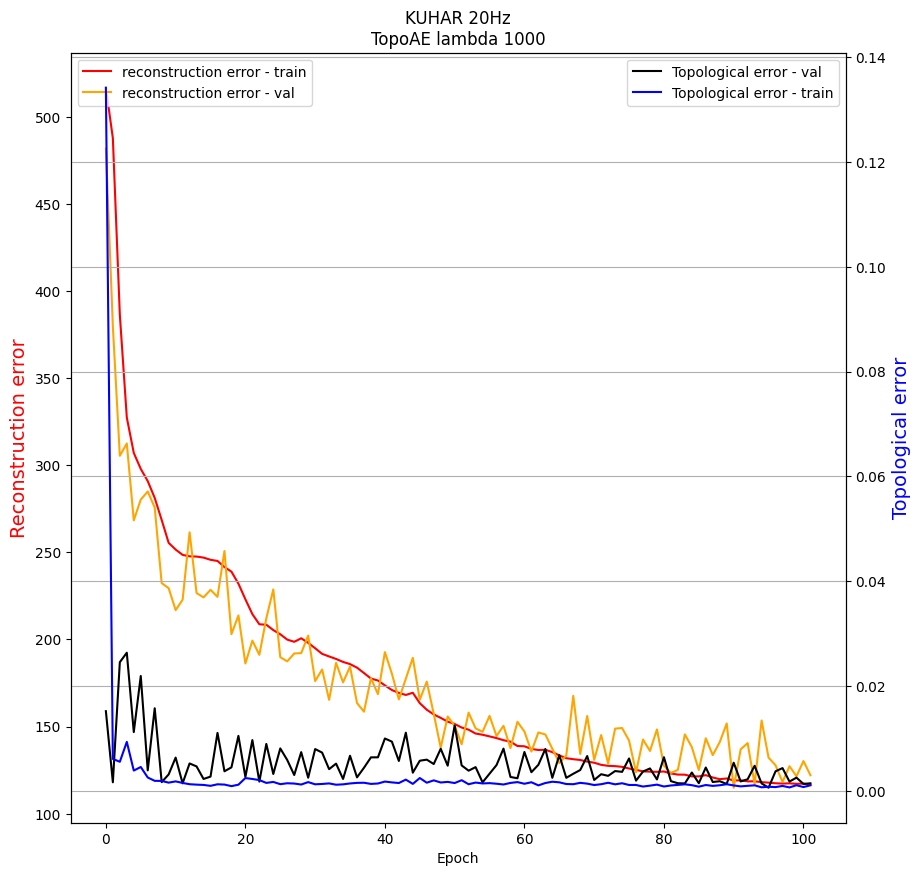

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:432.9631, Loss-ae:421.1557, Loss-topo:0.0118
Epoch:2, P:10, Loss:343.0972, Loss-ae:339.5727, Loss-topo:0.0035
Epoch:3, P:10, Loss:326.3292, Loss-ae:278.2958, Loss-topo:0.0480
Epoch:4, P:10, Loss:323.8325, Loss-ae:286.9096, Loss-topo:0.0369
Epoch:5, P:10, Loss:322.0706, Loss-ae:304.2791, Loss-topo:0.0178
Epoch:6, P:10, Loss:250.0643, Loss-ae:245.4998, Loss-topo:0.0046
Epoch:7, P:10, Loss:243.9095, Loss-ae:229.9901, Loss-topo:0.0139
Epoch:8, P:10, Loss:246.0074, Loss-ae:243.5459, Loss-topo:0.0025
Epoch:9, P:9, Loss:255.1426, Loss-ae:252.3957, Loss-topo:0.0027
Epoch:10, P:8, Loss:217.2475, Loss-ae:213.5467, Loss-topo:0.0037
Epoch:11, P:10, Loss:235.4257, Loss-ae:232.8581, Loss-topo:0.0026
Epoch:12, P:9, Loss:254.4391, Loss-ae:241.9080, Loss-topo:0.0125
Epoch:13, P:8, Loss:226.2848, Loss-ae:218.5455, Loss-topo:0.0077
Epoch:14, P:7, Loss:214.3

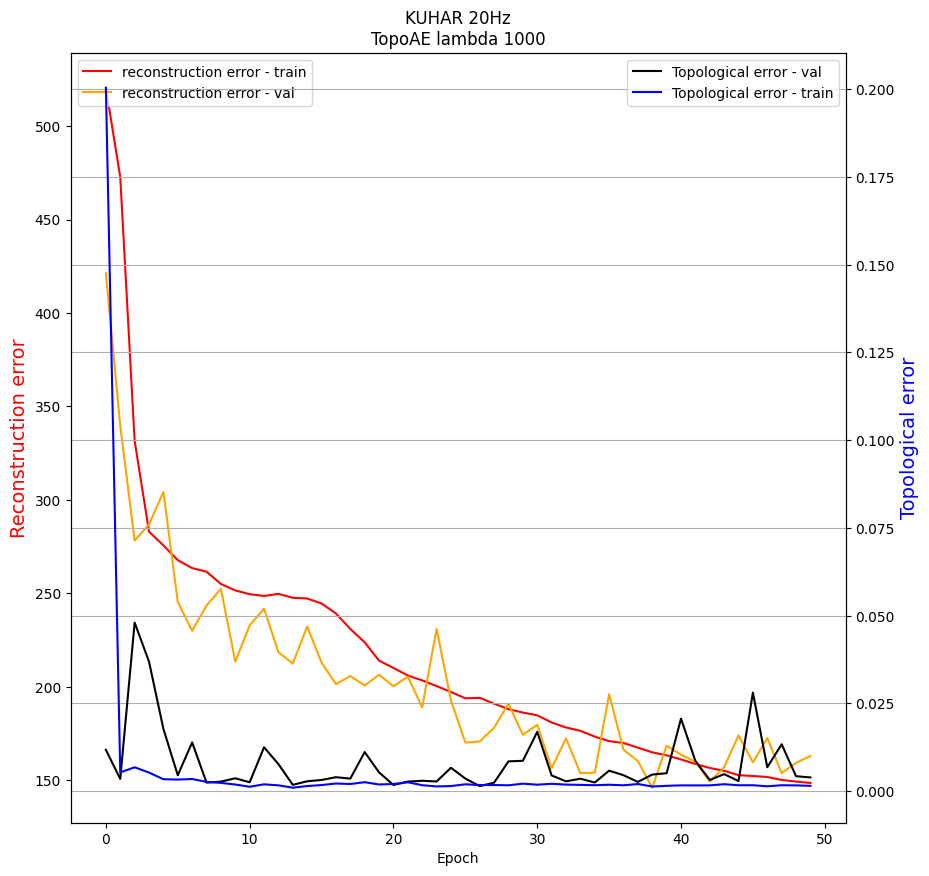

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 8
Epoch:1, P:10, Loss:503.6303, Loss-ae:485.8762, Loss-topo:0.0178
Epoch:2, P:10, Loss:373.0779, Loss-ae:343.2826, Loss-topo:0.0298
Epoch:3, P:10, Loss:279.2634, Loss-ae:258.1849, Loss-topo:0.0211
Epoch:4, P:10, Loss:284.2274, Loss-ae:268.1487, Loss-topo:0.0161
Epoch:5, P:9, Loss:242.1304, Loss-ae:231.9702, Loss-topo:0.0102
Epoch:6, P:10, Loss:281.0624, Loss-ae:254.8016, Loss-topo:0.0263
Epoch:7, P:9, Loss:260.9425, Loss-ae:246.0522, Loss-topo:0.0149
Epoch:8, P:8, Loss:268.7829, Loss-ae:249.0826, Loss-topo:0.0197
Epoch:9, P:7, Loss:235.1685, Loss-ae:231.9424, Loss-topo:0.0032
Epoch:10, P:10, Loss:233.3838, Loss-ae:231.4593, Loss-topo:0.0019
Epoch:11, P:10, Loss:235.0681, Loss-ae:233.1879, Loss-topo:0.0019
Epoch:12, P:9, Loss:217.7943, Loss-ae:216.7573, Loss-topo:0.0010
Epoch:13, P:10, Loss:215.1857, Loss-ae:210.5238, Loss-topo:0.0047
Epoch:14, P:10, Loss:297.7

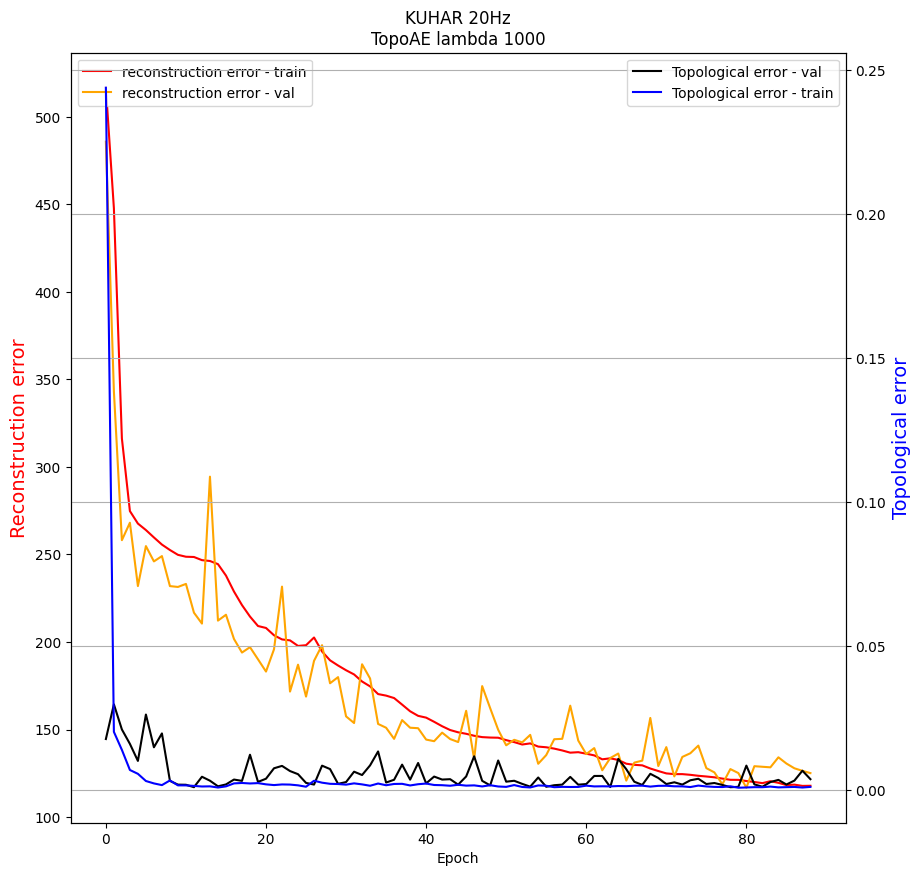

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:443.7734, Loss-ae:436.6667, Loss-topo:0.0071
Epoch:2, P:10, Loss:364.8394, Loss-ae:362.7275, Loss-topo:0.0021
Epoch:3, P:10, Loss:315.0742, Loss-ae:304.0025, Loss-topo:0.0111
Epoch:4, P:10, Loss:234.9737, Loss-ae:229.8459, Loss-topo:0.0051
Epoch:5, P:10, Loss:228.1419, Loss-ae:225.8478, Loss-topo:0.0023
Epoch:6, P:10, Loss:224.3789, Loss-ae:220.5490, Loss-topo:0.0038
Epoch:7, P:10, Loss:222.3987, Loss-ae:217.0163, Loss-topo:0.0054
Epoch:8, P:10, Loss:235.3327, Loss-ae:230.9453, Loss-topo:0.0044
Epoch:9, P:9, Loss:219.5156, Loss-ae:216.4079, Loss-topo:0.0031
Epoch:10, P:10, Loss:213.8716, Loss-ae:211.9596, Loss-topo:0.0019
Epoch:11, P:10, Loss:280.0319, Loss-ae:278.3540, Loss-topo:0.0017
Epoch:12, P:9, Loss:253.5166, Loss-ae:249.6868, Loss-topo:0.0038
Epoch:13, P:8, Loss:223.7838, Loss-ae:222.6195, Loss-topo:0.0012
Epoch:14, P:7, Loss:214.

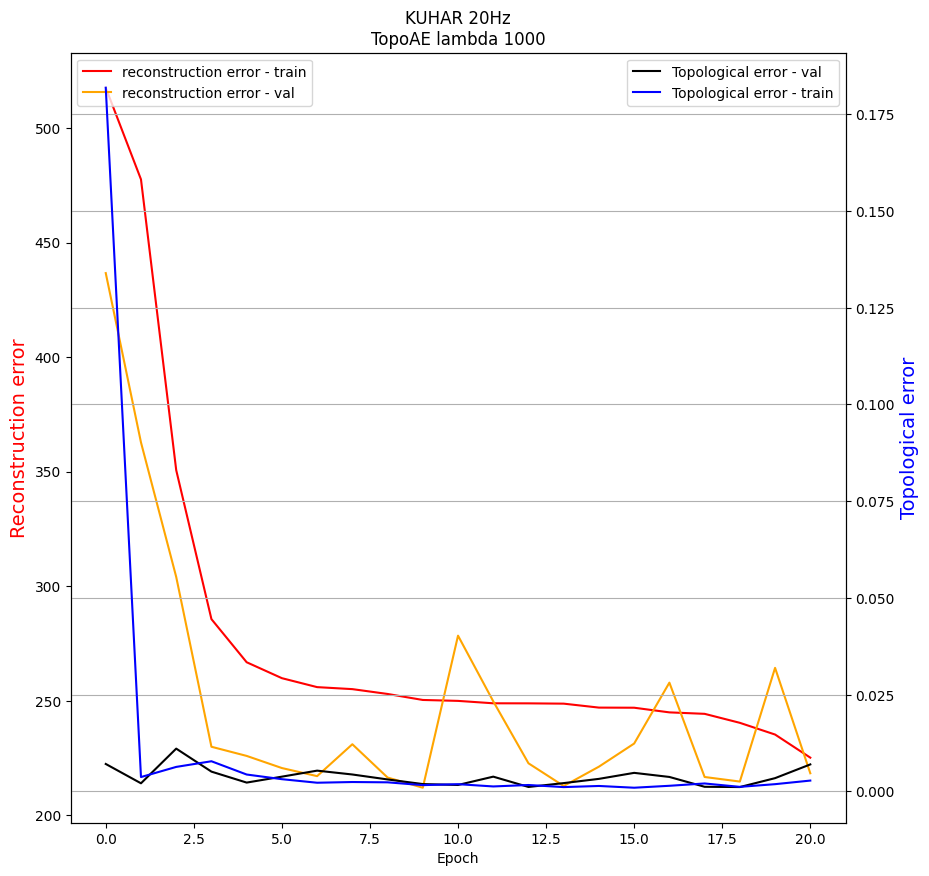

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:438.0052, Loss-ae:430.5085, Loss-topo:0.0075
Epoch:2, P:10, Loss:332.0947, Loss-ae:324.9584, Loss-topo:0.0071
Epoch:3, P:10, Loss:277.8336, Loss-ae:266.9347, Loss-topo:0.0109
Epoch:4, P:10, Loss:285.7562, Loss-ae:283.8053, Loss-topo:0.0020
Epoch:5, P:9, Loss:322.0212, Loss-ae:308.4300, Loss-topo:0.0136
Epoch:6, P:8, Loss:263.2509, Loss-ae:261.0796, Loss-topo:0.0022
Epoch:7, P:10, Loss:239.4328, Loss-ae:233.6117, Loss-topo:0.0058
Epoch:8, P:10, Loss:255.4510, Loss-ae:249.1647, Loss-topo:0.0063
Epoch:9, P:9, Loss:267.0001, Loss-ae:264.4615, Loss-topo:0.0025
Epoch:10, P:8, Loss:221.4222, Loss-ae:212.2859, Loss-topo:0.0091
Epoch:11, P:10, Loss:277.8515, Loss-ae:273.5929, Loss-topo:0.0043
Epoch:12, P:9, Loss:230.3323, Loss-ae:228.5617, Loss-topo:0.0018
Epoch:13, P:8, Loss:215.3501, Loss-ae:213.2055, Loss-topo:0.0021
Epoch:14, P:10, Loss:236.13

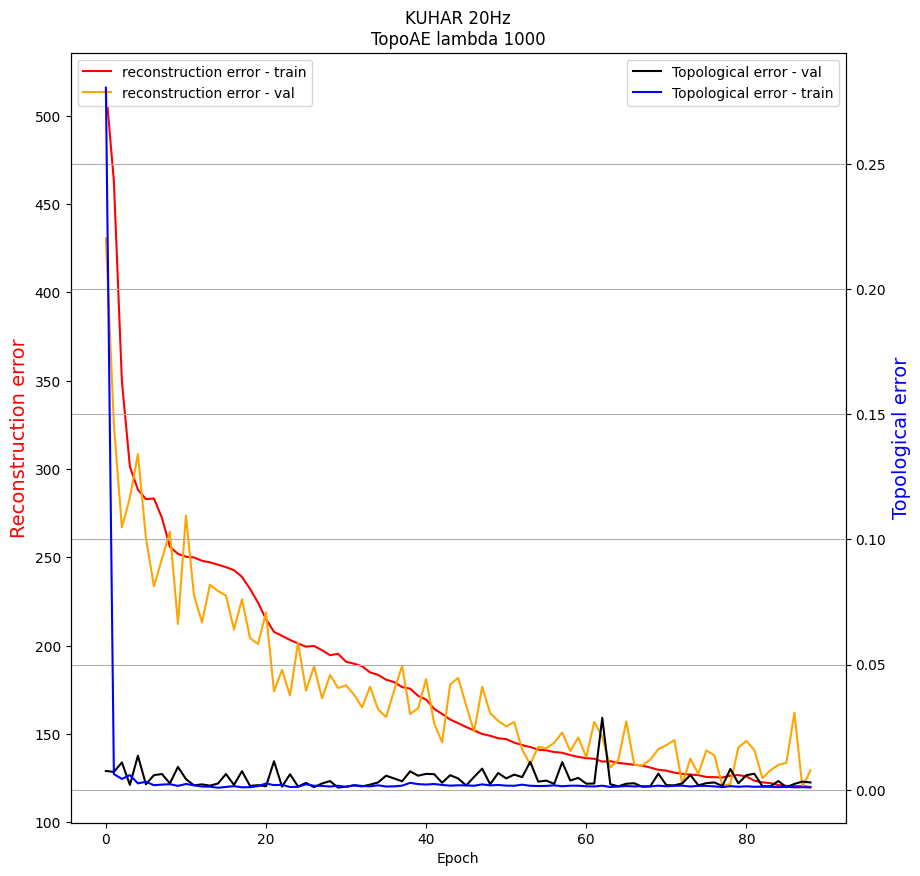

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:476.6088, Loss-ae:456.0555, Loss-topo:0.0206
Epoch:2, P:10, Loss:400.4733, Loss-ae:389.6685, Loss-topo:0.0108
Epoch:3, P:10, Loss:298.1704, Loss-ae:288.6747, Loss-topo:0.0095
Epoch:4, P:10, Loss:358.0094, Loss-ae:297.5195, Loss-topo:0.0605
Epoch:5, P:9, Loss:253.9933, Loss-ae:250.9834, Loss-topo:0.0030
Epoch:6, P:10, Loss:255.4777, Loss-ae:252.2019, Loss-topo:0.0033
Epoch:7, P:9, Loss:258.4385, Loss-ae:255.2811, Loss-topo:0.0032
Epoch:8, P:8, Loss:256.2542, Loss-ae:254.0040, Loss-topo:0.0023
Epoch:9, P:7, Loss:246.7133, Loss-ae:243.8669, Loss-topo:0.0028
Epoch:10, P:10, Loss:237.7030, Loss-ae:232.8511, Loss-topo:0.0049
Epoch:11, P:10, Loss:249.6291, Loss-ae:244.2459, Loss-topo:0.0054
Epoch:12, P:9, Loss:233.1615, Loss-ae:231.6191, Loss-topo:0.0015
Epoch:13, P:10, Loss:227.0985, Loss-ae:225.5909, Loss-topo:0.0015
Epoch:14, P:10, Loss:219.9

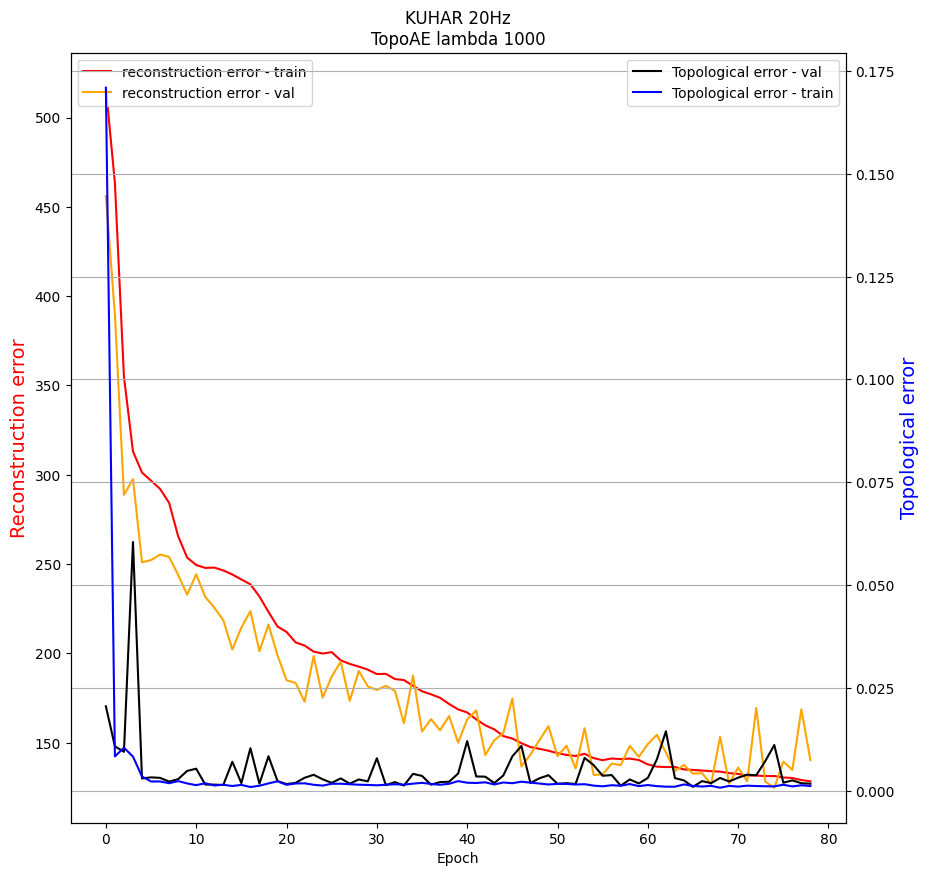

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:525.0380, Loss-ae:507.9107, Loss-topo:0.0171
Epoch:2, P:10, Loss:355.0400, Loss-ae:345.9896, Loss-topo:0.0091
Epoch:3, P:10, Loss:295.6439, Loss-ae:285.5700, Loss-topo:0.0101
Epoch:4, P:10, Loss:280.9782, Loss-ae:272.1133, Loss-topo:0.0089
Epoch:5, P:10, Loss:260.5125, Loss-ae:258.4705, Loss-topo:0.0020
Epoch:6, P:10, Loss:270.0852, Loss-ae:246.0638, Loss-topo:0.0240
Epoch:7, P:9, Loss:286.0100, Loss-ae:257.1481, Loss-topo:0.0289
Epoch:8, P:8, Loss:240.2197, Loss-ae:225.3120, Loss-topo:0.0149
Epoch:9, P:10, Loss:221.9696, Loss-ae:219.5035, Loss-topo:0.0025
Epoch:10, P:10, Loss:218.3731, Loss-ae:214.1274, Loss-topo:0.0042
Epoch:11, P:10, Loss:249.8716, Loss-ae:229.7984, Loss-topo:0.0201
Epoch:12, P:9, Loss:225.8181, Loss-ae:220.1419, Loss-topo:0.0057
Epoch:13, P:8, Loss:221.0971, Loss-ae:218.7809, Loss-topo:0.0023
Epoch:14, P:7, Loss:227.4

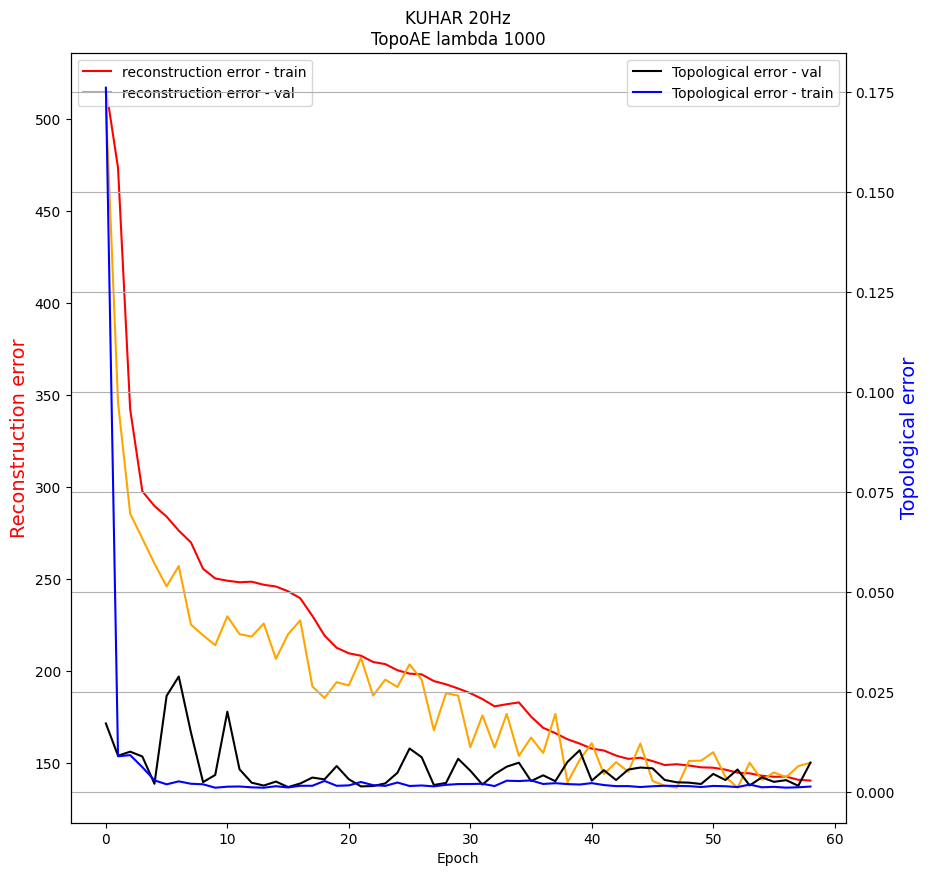

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:454.2655, Loss-ae:447.4128, Loss-topo:0.0069
Epoch:2, P:10, Loss:384.9899, Loss-ae:372.6271, Loss-topo:0.0124
Epoch:3, P:10, Loss:337.8795, Loss-ae:319.4545, Loss-topo:0.0184
Epoch:4, P:10, Loss:432.8203, Loss-ae:276.6317, Loss-topo:0.1562
Epoch:5, P:9, Loss:279.1845, Loss-ae:274.0603, Loss-topo:0.0051
Epoch:6, P:10, Loss:328.4305, Loss-ae:287.3255, Loss-topo:0.0411
Epoch:7, P:9, Loss:256.9094, Loss-ae:251.4553, Loss-topo:0.0055
Epoch:8, P:10, Loss:265.7719, Loss-ae:250.5684, Loss-topo:0.0152
Epoch:9, P:9, Loss:234.6943, Loss-ae:230.4811, Loss-topo:0.0042
Epoch:10, P:10, Loss:213.8904, Loss-ae:211.6884, Loss-topo:0.0022
Epoch:11, P:10, Loss:224.1879, Loss-ae:222.3348, Loss-topo:0.0019
Epoch:12, P:9, Loss:213.1732, Loss-ae:207.4617, Loss-topo:0.0057
Epoch:13, P:10, Loss:222.9273, Loss-ae:219.5755, Loss-topo:0.0034
Epoch:14, P:9, Loss:227.4

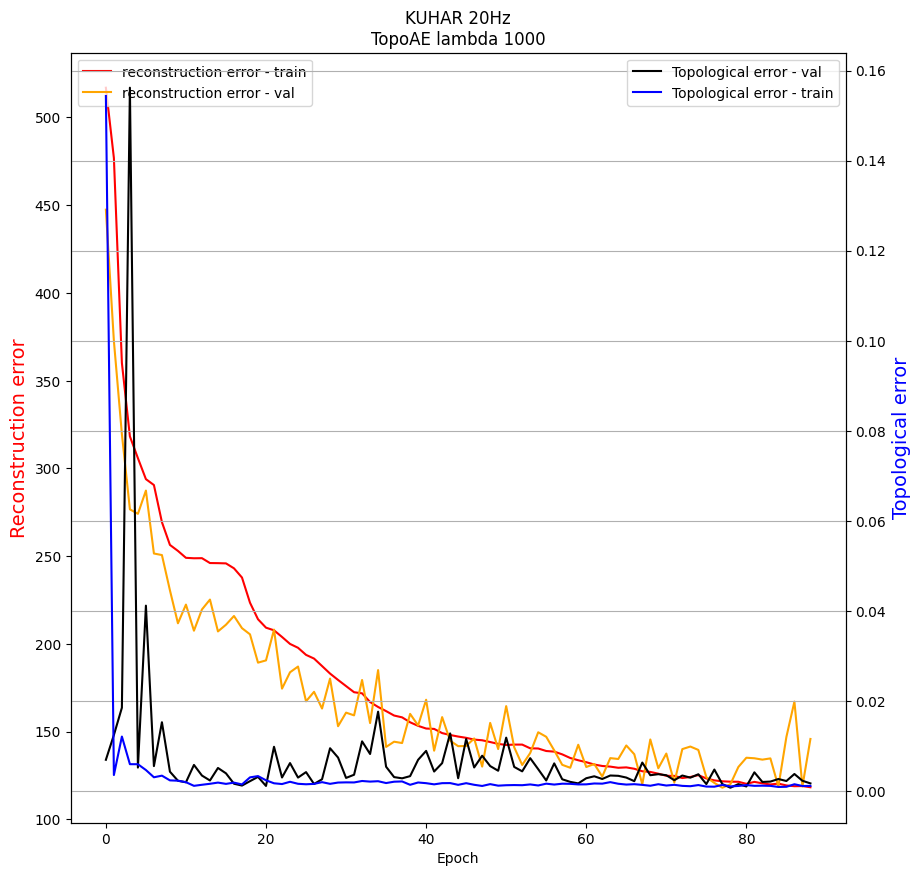

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:463.0070, Loss-ae:460.0965, Loss-topo:0.0029
Epoch:2, P:10, Loss:341.2649, Loss-ae:337.4853, Loss-topo:0.0038
Epoch:3, P:10, Loss:273.9739, Loss-ae:271.0122, Loss-topo:0.0030
Epoch:4, P:10, Loss:271.5581, Loss-ae:266.7407, Loss-topo:0.0048
Epoch:5, P:10, Loss:346.6694, Loss-ae:328.0125, Loss-topo:0.0187
Epoch:6, P:9, Loss:249.5366, Loss-ae:247.4277, Loss-topo:0.0021
Epoch:7, P:10, Loss:239.4958, Loss-ae:237.5079, Loss-topo:0.0020
Epoch:8, P:10, Loss:253.8907, Loss-ae:247.5297, Loss-topo:0.0064
Epoch:9, P:9, Loss:230.2131, Loss-ae:227.9488, Loss-topo:0.0023
Epoch:10, P:10, Loss:251.7503, Loss-ae:236.7236, Loss-topo:0.0150
Epoch:11, P:9, Loss:236.7082, Loss-ae:235.6886, Loss-topo:0.0010
Epoch:12, P:8, Loss:266.4152, Loss-ae:260.3001, Loss-topo:0.0061
Epoch:13, P:7, Loss:263.1338, Loss-ae:247.2182, Loss-topo:0.0159
Epoch:14, P:6, Loss:245.53

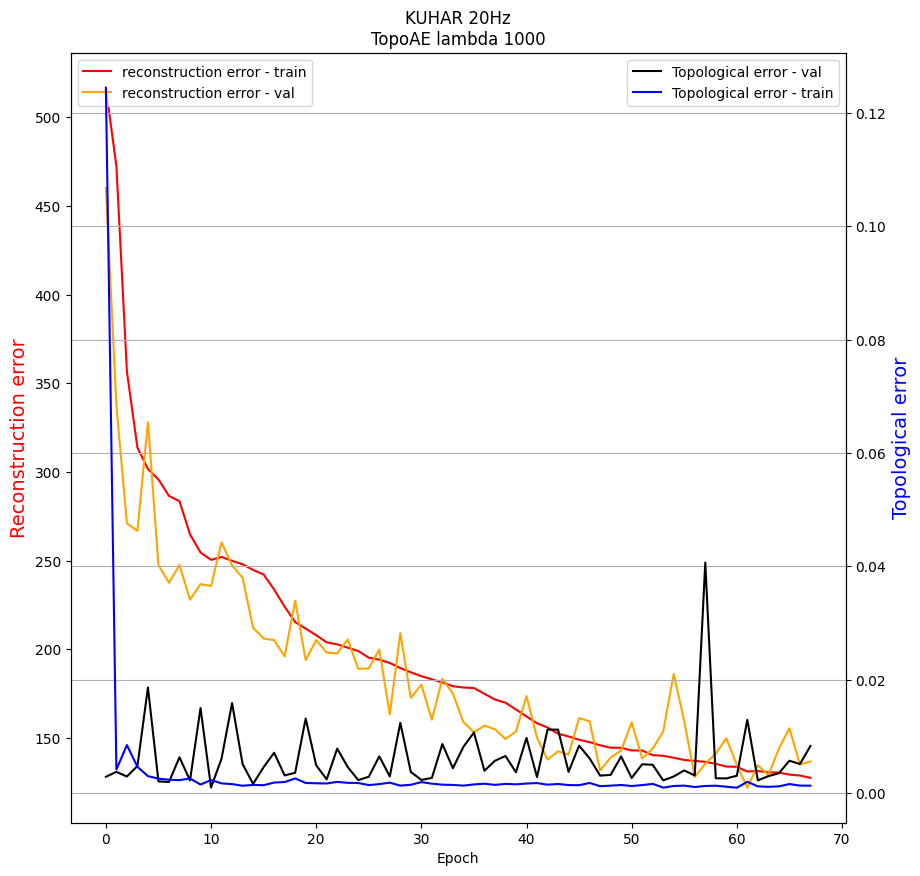

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:450.0693, Loss-ae:443.6986, Loss-topo:0.0064
Epoch:2, P:10, Loss:397.2018, Loss-ae:379.5689, Loss-topo:0.0176
Epoch:3, P:10, Loss:301.6370, Loss-ae:295.4327, Loss-topo:0.0062
Epoch:4, P:10, Loss:278.2633, Loss-ae:267.0938, Loss-topo:0.0112
Epoch:5, P:10, Loss:304.5728, Loss-ae:297.8007, Loss-topo:0.0068
Epoch:6, P:9, Loss:296.8122, Loss-ae:281.8187, Loss-topo:0.0150
Epoch:7, P:8, Loss:301.2095, Loss-ae:298.8338, Loss-topo:0.0024
Epoch:8, P:7, Loss:267.2000, Loss-ae:248.8755, Loss-topo:0.0183
Epoch:9, P:10, Loss:227.3169, Loss-ae:225.6969, Loss-topo:0.0016
Epoch:10, P:10, Loss:250.4372, Loss-ae:244.9561, Loss-topo:0.0055
Epoch:11, P:9, Loss:244.2810, Loss-ae:238.0492, Loss-topo:0.0062
Epoch:12, P:8, Loss:242.1562, Loss-ae:236.8813, Loss-topo:0.0053
Epoch:13, P:7, Loss:212.3553, Loss-ae:205.5978, Loss-topo:0.0068
Epoch:14, P:10, Loss:248.91

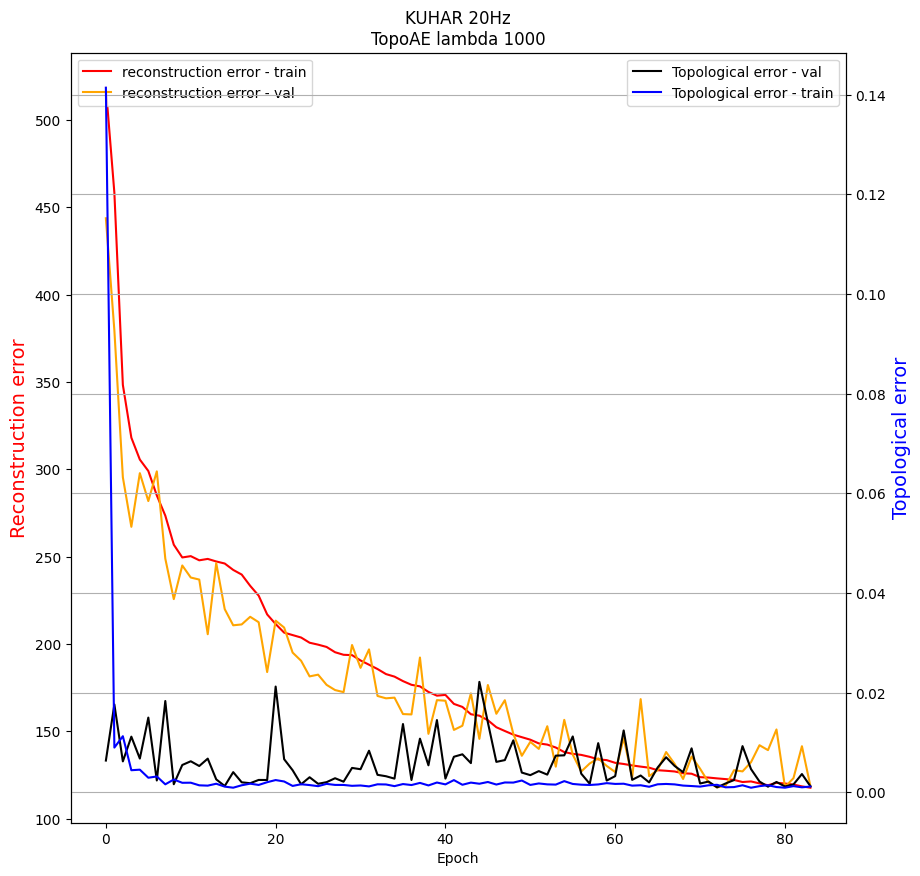

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:471.5841, Loss-ae:437.3858, Loss-topo:0.0342
Epoch:2, P:10, Loss:360.5293, Loss-ae:351.0826, Loss-topo:0.0094
Epoch:3, P:10, Loss:291.0010, Loss-ae:275.3390, Loss-topo:0.0157
Epoch:4, P:10, Loss:273.6072, Loss-ae:258.6443, Loss-topo:0.0150
Epoch:5, P:10, Loss:288.3777, Loss-ae:265.0121, Loss-topo:0.0234
Epoch:6, P:9, Loss:257.5044, Loss-ae:254.5390, Loss-topo:0.0030
Epoch:7, P:10, Loss:244.9390, Loss-ae:241.6099, Loss-topo:0.0033
Epoch:8, P:10, Loss:234.6328, Loss-ae:233.0205, Loss-topo:0.0016
Epoch:9, P:10, Loss:244.0645, Loss-ae:237.2943, Loss-topo:0.0068
Epoch:10, P:9, Loss:245.7212, Loss-ae:239.4995, Loss-topo:0.0062
Epoch:11, P:8, Loss:238.5540, Loss-ae:230.3822, Loss-topo:0.0082
Epoch:12, P:7, Loss:229.1811, Loss-ae:227.0825, Loss-topo:0.0021
Epoch:13, P:10, Loss:209.8136, Loss-ae:202.8450, Loss-topo:0.0070
Epoch:14, P:10, Loss:225.

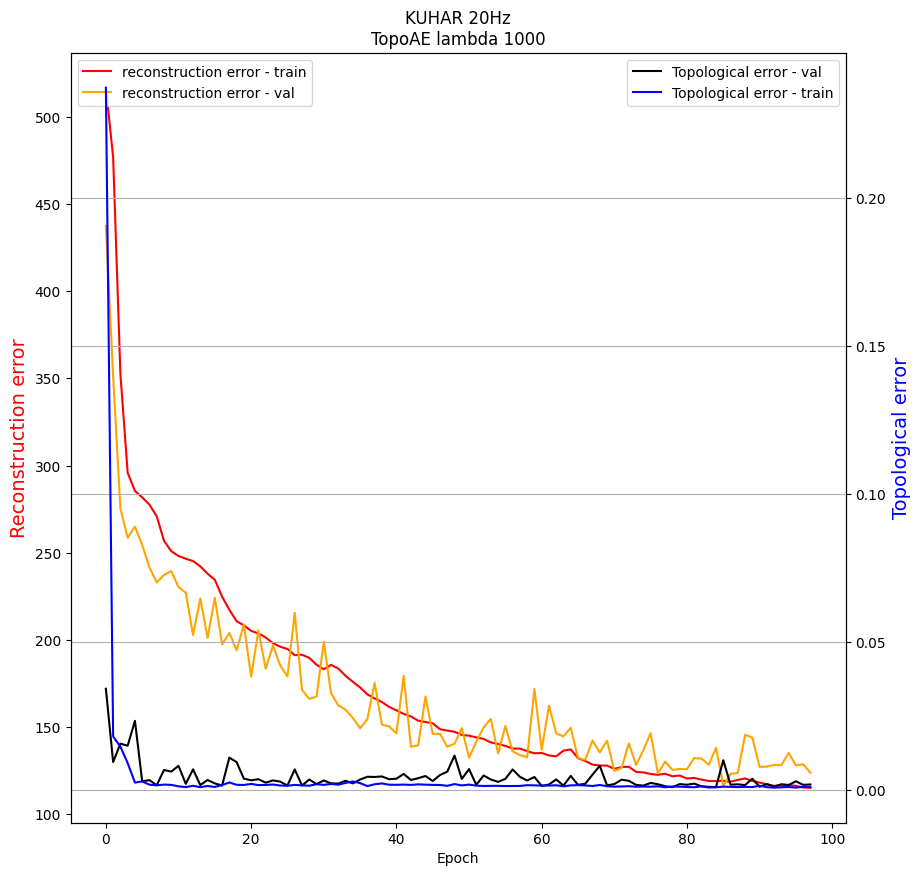

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:549.4660, Loss-ae:546.3869, Loss-topo:0.0031
Epoch:2, P:10, Loss:343.0220, Loss-ae:328.7933, Loss-topo:0.0142
Epoch:3, P:10, Loss:301.7800, Loss-ae:282.7063, Loss-topo:0.0191
Epoch:4, P:10, Loss:261.2273, Loss-ae:253.1146, Loss-topo:0.0081
Epoch:5, P:10, Loss:292.0396, Loss-ae:281.6892, Loss-topo:0.0104
Epoch:6, P:9, Loss:269.1290, Loss-ae:257.6446, Loss-topo:0.0115
Epoch:7, P:8, Loss:231.4613, Loss-ae:226.7074, Loss-topo:0.0048
Epoch:8, P:10, Loss:220.9770, Loss-ae:212.4739, Loss-topo:0.0085
Epoch:9, P:10, Loss:229.5599, Loss-ae:226.9926, Loss-topo:0.0026
Epoch:10, P:9, Loss:216.7261, Loss-ae:213.3654, Loss-topo:0.0034
Epoch:11, P:10, Loss:233.9213, Loss-ae:232.0916, Loss-topo:0.0018
Epoch:12, P:9, Loss:230.3949, Loss-ae:228.0608, Loss-topo:0.0023
Epoch:13, P:8, Loss:232.0156, Loss-ae:229.0455, Loss-topo:0.0030
Epoch:14, P:7, Loss:272.44

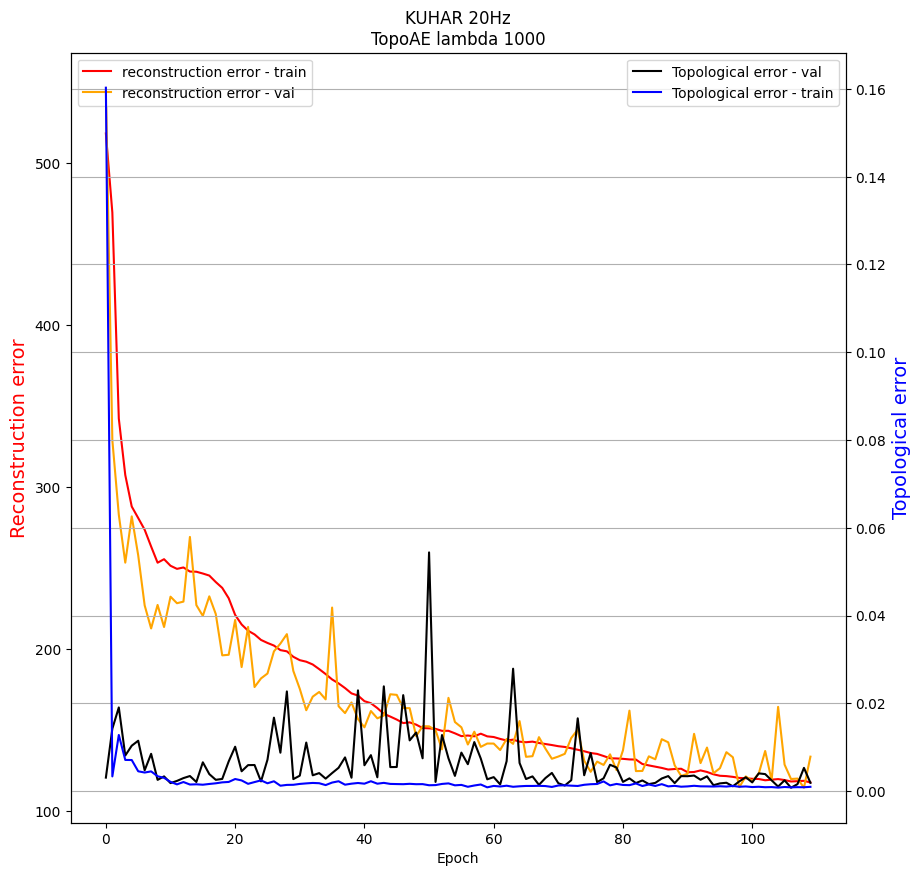

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 9
Epoch:1, P:10, Loss:522.2984, Loss-ae:511.6828, Loss-topo:0.0106
Epoch:2, P:10, Loss:382.4970, Loss-ae:379.6567, Loss-topo:0.0028
Epoch:3, P:10, Loss:400.0843, Loss-ae:356.4059, Loss-topo:0.0437
Epoch:4, P:9, Loss:265.4143, Loss-ae:262.5035, Loss-topo:0.0029
Epoch:5, P:10, Loss:288.6673, Loss-ae:281.1327, Loss-topo:0.0075
Epoch:6, P:9, Loss:250.4594, Loss-ae:244.4341, Loss-topo:0.0060
Epoch:7, P:10, Loss:277.2475, Loss-ae:272.2909, Loss-topo:0.0050
Epoch:8, P:9, Loss:237.5307, Loss-ae:217.9973, Loss-topo:0.0195
Epoch:9, P:10, Loss:212.8561, Loss-ae:209.6953, Loss-topo:0.0032
Epoch:10, P:10, Loss:219.3922, Loss-ae:215.1390, Loss-topo:0.0043
Epoch:11, P:9, Loss:254.0089, Loss-ae:249.6685, Loss-topo:0.0043
Epoch:12, P:8, Loss:216.2977, Loss-ae:212.6221, Loss-topo:0.0037
Epoch:13, P:7, Loss:225.9736, Loss-ae:221.3851, Loss-topo:0.0046
Epoch:14, P:6, Loss:225.620

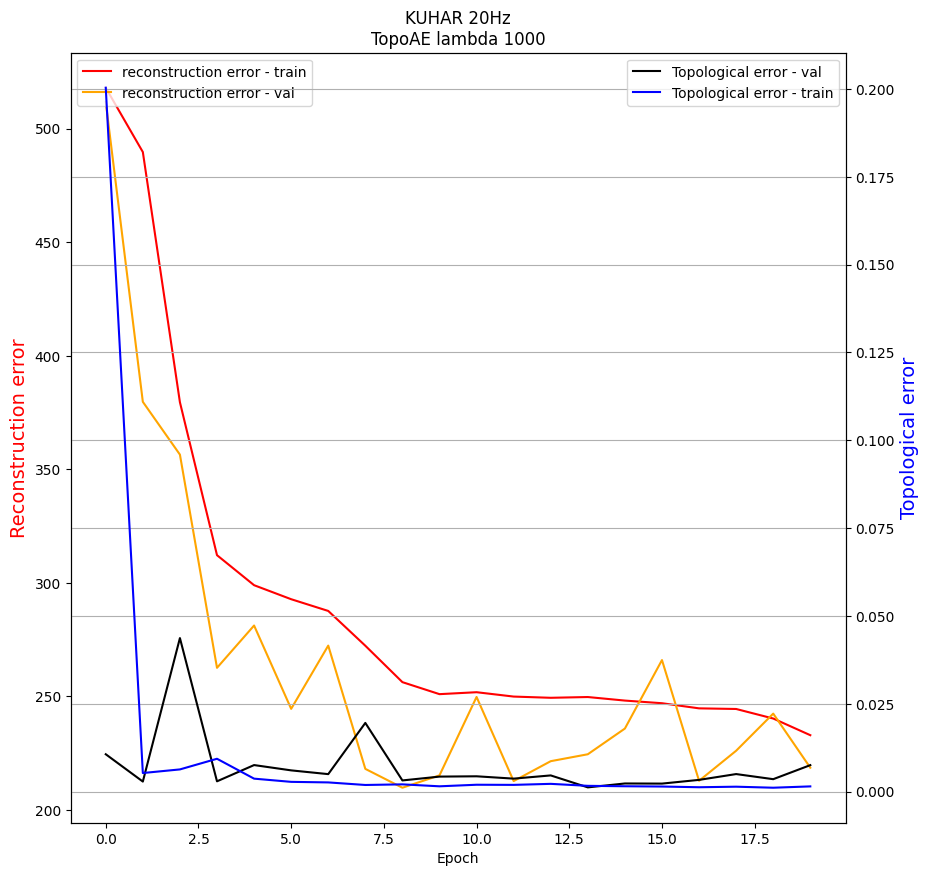

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:484.1893, Loss-ae:481.8725, Loss-topo:0.0023
Epoch:2, P:10, Loss:395.3552, Loss-ae:390.8423, Loss-topo:0.0045
Epoch:3, P:10, Loss:278.4641, Loss-ae:262.4455, Loss-topo:0.0160
Epoch:4, P:10, Loss:266.7416, Loss-ae:254.5999, Loss-topo:0.0121
Epoch:5, P:10, Loss:267.3395, Loss-ae:252.4696, Loss-topo:0.0149
Epoch:6, P:9, Loss:268.6029, Loss-ae:259.9547, Loss-topo:0.0086
Epoch:7, P:8, Loss:281.5620, Loss-ae:278.0333, Loss-topo:0.0035
Epoch:8, P:7, Loss:271.2968, Loss-ae:250.6745, Loss-topo:0.0206
Epoch:9, P:6, Loss:228.0302, Loss-ae:224.8252, Loss-topo:0.0032
Epoch:10, P:10, Loss:257.8268, Loss-ae:255.0077, Loss-topo:0.0028
Epoch:11, P:9, Loss:257.6261, Loss-ae:251.4222, Loss-topo:0.0062
Epoch:12, P:8, Loss:234.9658, Loss-ae:217.9104, Loss-topo:0.0171
Epoch:13, P:7, Loss:219.1996, Loss-ae:218.1039, Loss-topo:0.0011
Epoch:14, P:10, Loss:277.02

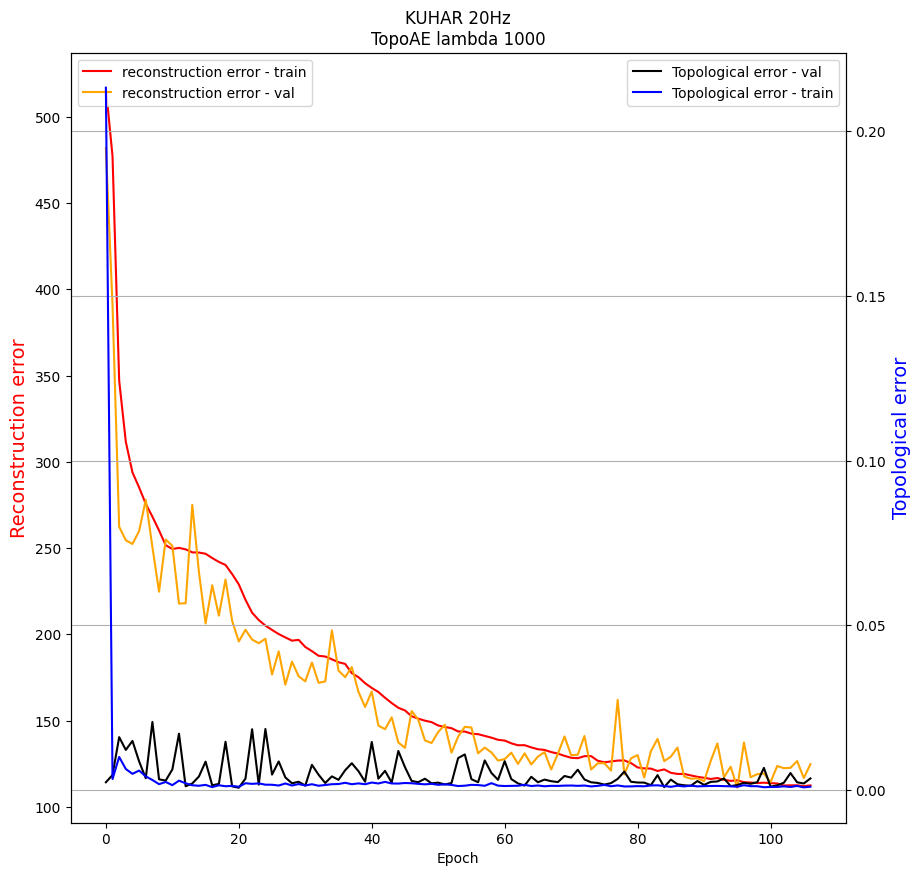

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:495.2214, Loss-ae:465.2482, Loss-topo:0.0300
Epoch:2, P:10, Loss:414.0202, Loss-ae:404.4015, Loss-topo:0.0096
Epoch:3, P:10, Loss:342.7991, Loss-ae:325.0621, Loss-topo:0.0177
Epoch:4, P:10, Loss:291.2112, Loss-ae:280.1704, Loss-topo:0.0110
Epoch:5, P:10, Loss:262.0867, Loss-ae:249.4276, Loss-topo:0.0127
Epoch:6, P:10, Loss:303.5837, Loss-ae:288.3164, Loss-topo:0.0153
Epoch:7, P:9, Loss:240.5490, Loss-ae:232.3697, Loss-topo:0.0082
Epoch:8, P:10, Loss:250.8883, Loss-ae:242.7901, Loss-topo:0.0081
Epoch:9, P:9, Loss:222.1539, Loss-ae:218.8749, Loss-topo:0.0033
Epoch:10, P:10, Loss:240.1845, Loss-ae:218.9226, Loss-topo:0.0213
Epoch:11, P:9, Loss:255.6337, Loss-ae:250.6379, Loss-topo:0.0050
Epoch:12, P:8, Loss:216.3964, Loss-ae:214.5078, Loss-topo:0.0019
Epoch:13, P:10, Loss:269.9170, Loss-ae:246.9467, Loss-topo:0.0230
Epoch:14, P:9, Loss:266.

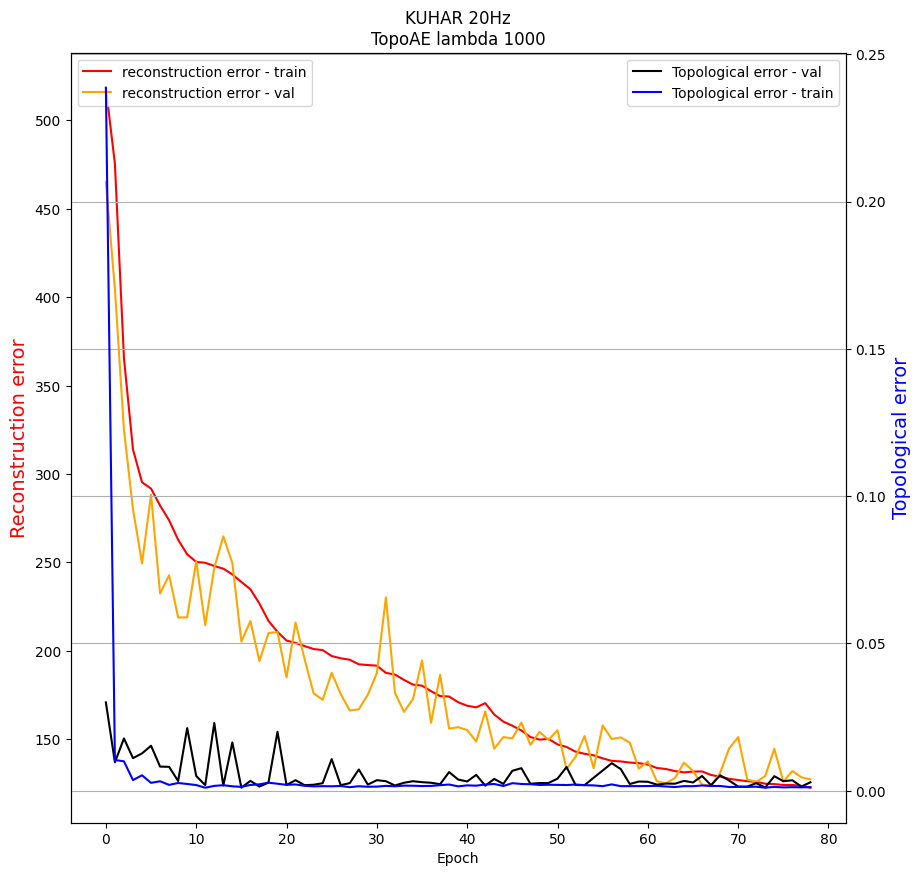

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:454.0059, Loss-ae:442.6936, Loss-topo:0.0113
Epoch:2, P:10, Loss:395.9322, Loss-ae:386.7380, Loss-topo:0.0092
Epoch:3, P:10, Loss:319.1388, Loss-ae:304.0343, Loss-topo:0.0151
Epoch:4, P:10, Loss:303.0968, Loss-ae:270.7911, Loss-topo:0.0323
Epoch:5, P:10, Loss:296.1371, Loss-ae:284.4880, Loss-topo:0.0116
Epoch:6, P:10, Loss:254.5253, Loss-ae:245.6628, Loss-topo:0.0089
Epoch:7, P:10, Loss:271.9821, Loss-ae:261.3426, Loss-topo:0.0106
Epoch:8, P:9, Loss:269.9501, Loss-ae:263.6909, Loss-topo:0.0063
Epoch:9, P:8, Loss:251.2858, Loss-ae:235.3168, Loss-topo:0.0160
Epoch:10, P:10, Loss:227.0628, Loss-ae:225.0214, Loss-topo:0.0020
Epoch:11, P:10, Loss:227.1415, Loss-ae:225.9505, Loss-topo:0.0012
Epoch:12, P:9, Loss:248.6065, Loss-ae:243.2114, Loss-topo:0.0054
Epoch:13, P:8, Loss:226.0503, Loss-ae:218.0928, Loss-topo:0.0080
Epoch:14, P:10, Loss:238

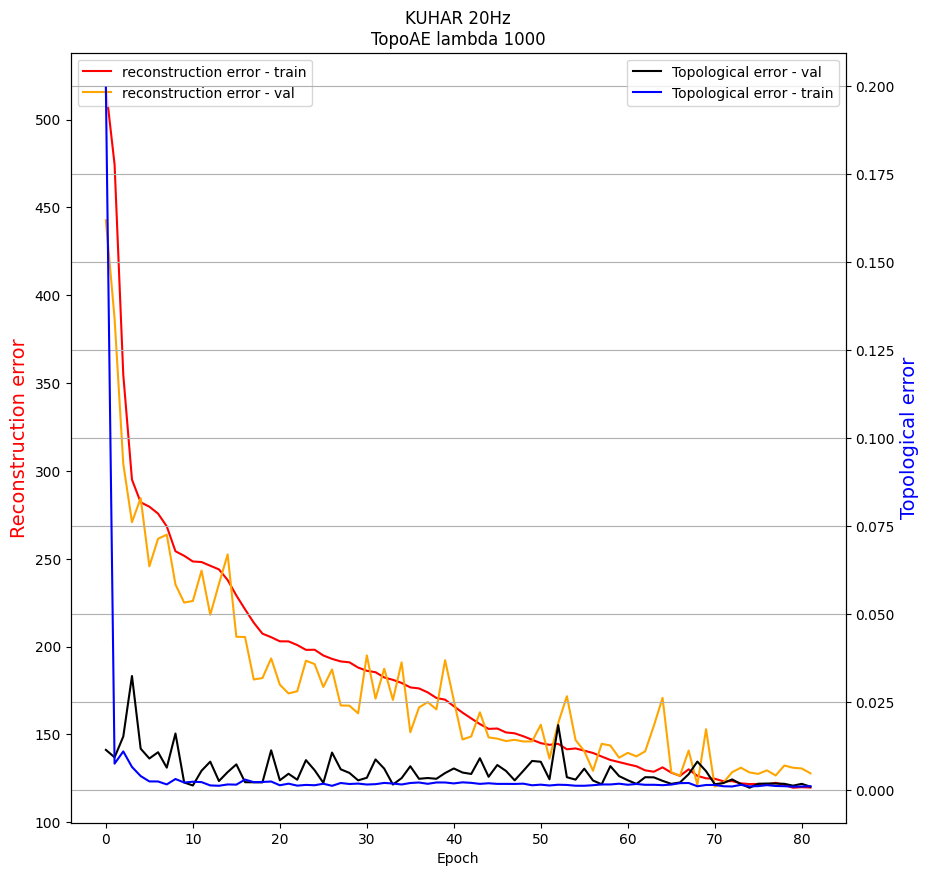

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:454.5888, Loss-ae:444.9869, Loss-topo:0.0096
Epoch:2, P:10, Loss:357.0217, Loss-ae:350.1108, Loss-topo:0.0069
Epoch:3, P:10, Loss:372.7931, Loss-ae:319.9719, Loss-topo:0.0528
Epoch:4, P:9, Loss:254.7154, Loss-ae:242.3488, Loss-topo:0.0124
Epoch:5, P:10, Loss:335.7512, Loss-ae:316.1411, Loss-topo:0.0196
Epoch:6, P:9, Loss:240.7742, Loss-ae:230.9438, Loss-topo:0.0098
Epoch:7, P:10, Loss:290.5019, Loss-ae:261.3134, Loss-topo:0.0292
Epoch:8, P:9, Loss:236.8994, Loss-ae:232.6017, Loss-topo:0.0043
Epoch:9, P:10, Loss:221.3996, Loss-ae:217.4916, Loss-topo:0.0039
Epoch:10, P:10, Loss:261.0977, Loss-ae:241.0223, Loss-topo:0.0201
Epoch:11, P:9, Loss:232.3031, Loss-ae:230.2704, Loss-topo:0.0020
Epoch:12, P:8, Loss:216.2485, Loss-ae:209.0238, Loss-topo:0.0072
Epoch:13, P:10, Loss:225.5053, Loss-ae:223.2144, Loss-topo:0.0023
Epoch:14, P:9, Loss:219.5

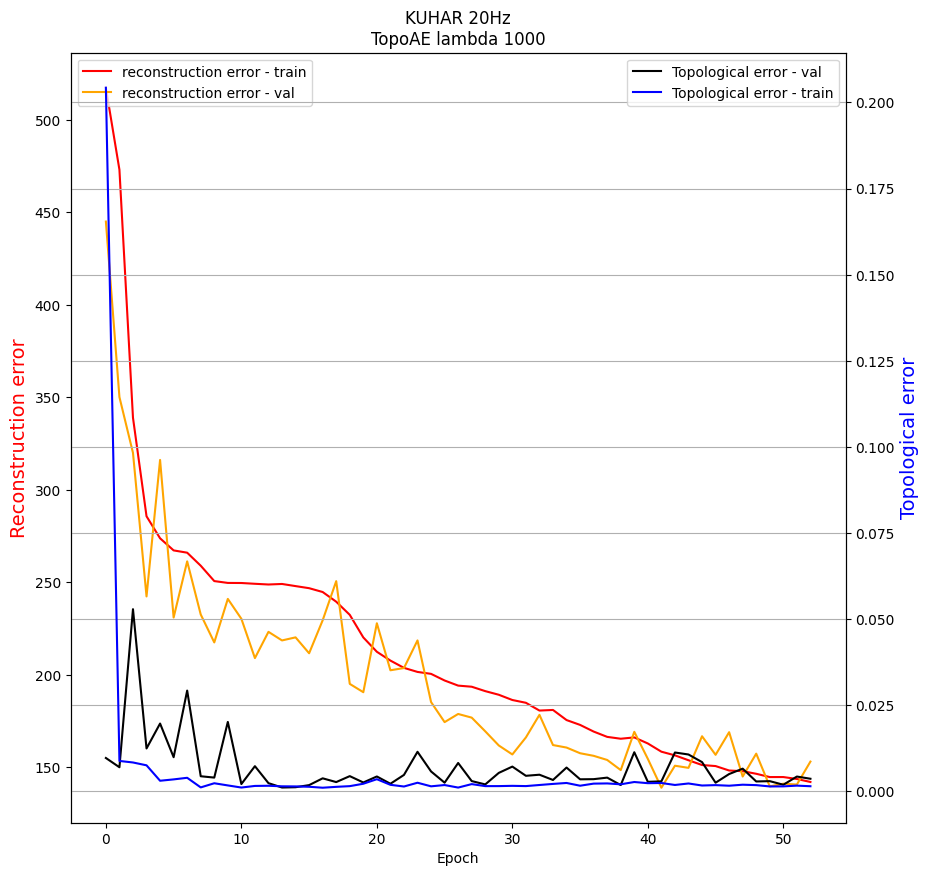

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:455.0150, Loss-ae:453.6055, Loss-topo:0.0014
Epoch:2, P:10, Loss:404.6311, Loss-ae:399.6916, Loss-topo:0.0049
Epoch:3, P:10, Loss:330.1609, Loss-ae:310.1533, Loss-topo:0.0200
Epoch:4, P:10, Loss:279.6740, Loss-ae:270.8550, Loss-topo:0.0088
Epoch:5, P:10, Loss:318.4447, Loss-ae:314.0958, Loss-topo:0.0043
Epoch:6, P:9, Loss:288.1934, Loss-ae:282.5693, Loss-topo:0.0056
Epoch:7, P:8, Loss:264.8948, Loss-ae:252.4407, Loss-topo:0.0125
Epoch:8, P:10, Loss:291.8298, Loss-ae:263.2502, Loss-topo:0.0286
Epoch:9, P:9, Loss:227.2219, Loss-ae:224.0563, Loss-topo:0.0032
Epoch:10, P:10, Loss:256.4039, Loss-ae:243.7123, Loss-topo:0.0127
Epoch:11, P:9, Loss:261.6088, Loss-ae:239.7094, Loss-topo:0.0219
Epoch:12, P:8, Loss:260.4467, Loss-ae:257.7578, Loss-topo:0.0027
Epoch:13, P:7, Loss:227.7631, Loss-ae:224.0233, Loss-topo:0.0037
Epoch:14, P:6, Loss:263.10

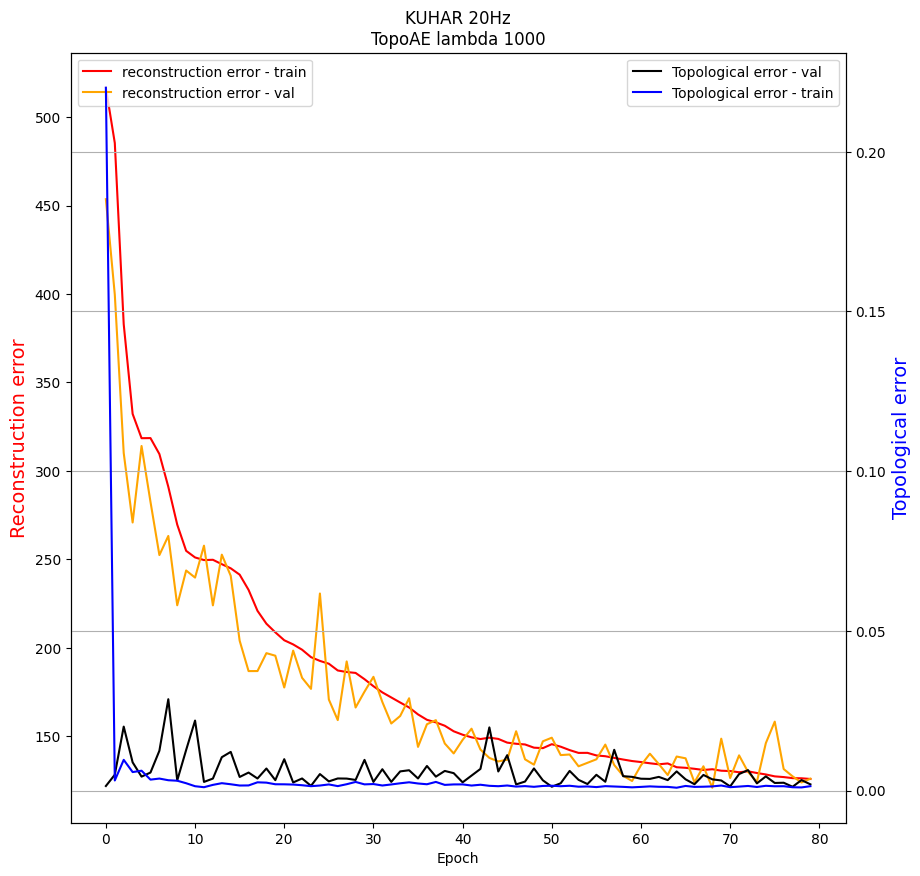

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:507.0092, Loss-ae:476.0894, Loss-topo:0.0309
Epoch:2, P:10, Loss:367.2132, Loss-ae:361.9510, Loss-topo:0.0053
Epoch:3, P:10, Loss:287.1114, Loss-ae:282.0892, Loss-topo:0.0050
Epoch:4, P:10, Loss:265.3314, Loss-ae:262.8257, Loss-topo:0.0025
Epoch:5, P:10, Loss:308.3249, Loss-ae:290.3283, Loss-topo:0.0180
Epoch:6, P:9, Loss:308.8760, Loss-ae:303.6392, Loss-topo:0.0052
Epoch:7, P:8, Loss:263.8519, Loss-ae:260.9910, Loss-topo:0.0029
Epoch:8, P:10, Loss:274.6271, Loss-ae:266.3567, Loss-topo:0.0083
Epoch:9, P:9, Loss:249.7301, Loss-ae:247.1247, Loss-topo:0.0026
Epoch:10, P:10, Loss:229.7534, Loss-ae:225.0651, Loss-topo:0.0047
Epoch:11, P:10, Loss:308.3574, Loss-ae:297.9551, Loss-topo:0.0104
Epoch:12, P:9, Loss:226.4644, Loss-ae:222.7539, Loss-topo:0.0037
Epoch:13, P:10, Loss:222.7499, Loss-ae:218.6697, Loss-topo:0.0041
Epoch:14, P:10, Loss:230

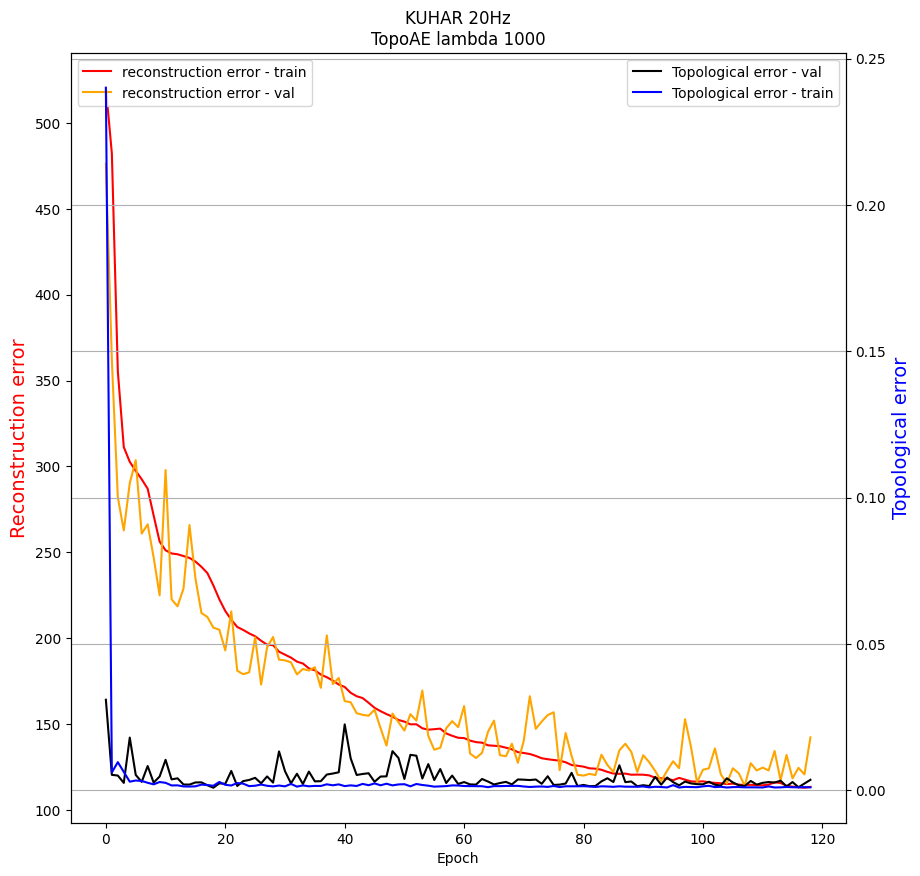

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:488.5520, Loss-ae:480.7813, Loss-topo:0.0078
Epoch:2, P:10, Loss:385.1298, Loss-ae:376.4614, Loss-topo:0.0087
Epoch:3, P:10, Loss:366.9545, Loss-ae:343.2582, Loss-topo:0.0237
Epoch:4, P:10, Loss:301.8962, Loss-ae:295.3937, Loss-topo:0.0065
Epoch:5, P:10, Loss:296.7509, Loss-ae:269.4372, Loss-topo:0.0273
Epoch:6, P:10, Loss:254.7645, Loss-ae:250.3651, Loss-topo:0.0044
Epoch:7, P:10, Loss:250.5652, Loss-ae:245.4754, Loss-topo:0.0051
Epoch:8, P:10, Loss:236.3152, Loss-ae:233.9083, Loss-topo:0.0024
Epoch:9, P:10, Loss:210.9008, Loss-ae:209.0434, Loss-topo:0.0019
Epoch:10, P:10, Loss:292.6513, Loss-ae:282.4434, Loss-topo:0.0102
Epoch:11, P:9, Loss:230.9606, Loss-ae:227.4112, Loss-topo:0.0035
Epoch:12, P:8, Loss:276.0602, Loss-ae:269.1597, Loss-topo:0.0069
Epoch:13, P:7, Loss:239.7109, Loss-ae:233.3666, Loss-topo:0.0063
Epoch:14, P:6, Loss:280

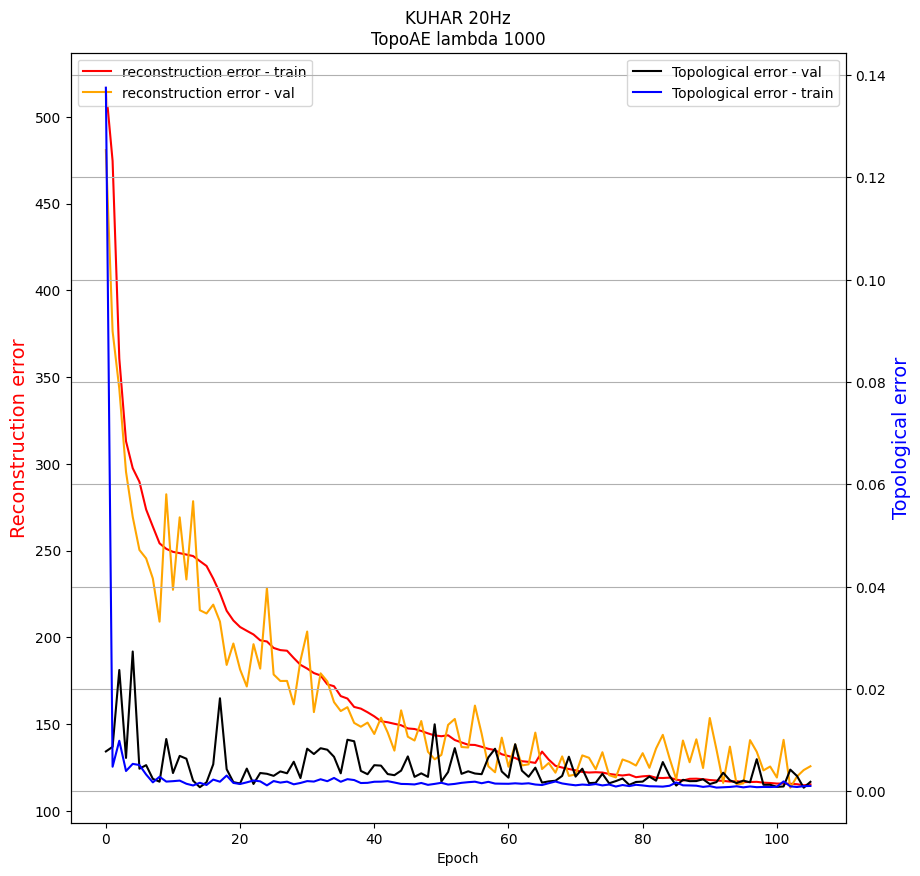

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:541.2903, Loss-ae:527.1837, Loss-topo:0.0141
Epoch:2, P:10, Loss:343.0584, Loss-ae:339.3754, Loss-topo:0.0037
Epoch:3, P:10, Loss:301.6415, Loss-ae:275.7587, Loss-topo:0.0259
Epoch:4, P:10, Loss:291.7052, Loss-ae:283.2566, Loss-topo:0.0084
Epoch:5, P:10, Loss:285.5759, Loss-ae:279.4295, Loss-topo:0.0061
Epoch:6, P:10, Loss:261.3594, Loss-ae:255.5046, Loss-topo:0.0059
Epoch:7, P:10, Loss:288.8594, Loss-ae:282.5243, Loss-topo:0.0063
Epoch:8, P:9, Loss:225.9808, Loss-ae:222.0349, Loss-topo:0.0039
Epoch:9, P:10, Loss:237.1064, Loss-ae:233.5252, Loss-topo:0.0036
Epoch:10, P:9, Loss:225.4527, Loss-ae:220.6168, Loss-topo:0.0048
Epoch:11, P:10, Loss:221.8886, Loss-ae:219.7423, Loss-topo:0.0021
Epoch:12, P:10, Loss:217.4799, Loss-ae:214.9245, Loss-topo:0.0026
Epoch:13, P:10, Loss:241.8008, Loss-ae:237.8961, Loss-topo:0.0039
Epoch:14, P:9, Loss:26

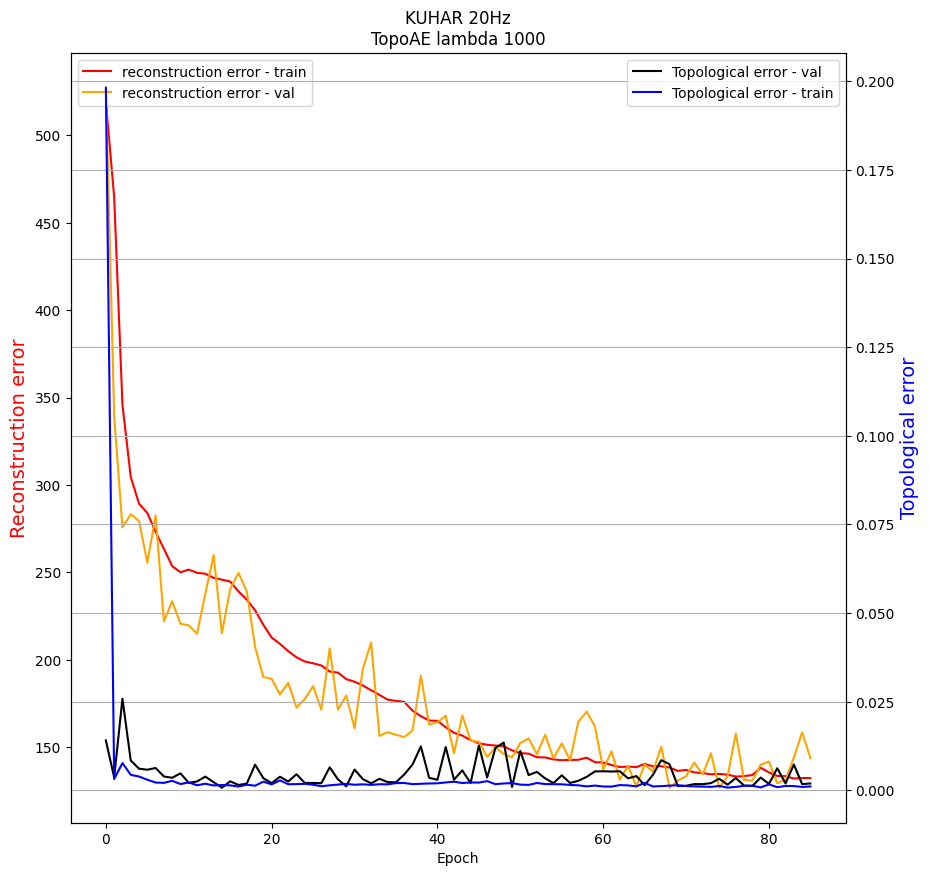

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:483.3657, Loss-ae:472.4807, Loss-topo:0.0109
Epoch:2, P:10, Loss:390.7911, Loss-ae:388.6540, Loss-topo:0.0021
Epoch:3, P:10, Loss:381.0758, Loss-ae:370.2419, Loss-topo:0.0108
Epoch:4, P:10, Loss:299.9110, Loss-ae:285.6751, Loss-topo:0.0142
Epoch:5, P:10, Loss:262.2394, Loss-ae:258.7134, Loss-topo:0.0035
Epoch:6, P:10, Loss:254.2050, Loss-ae:247.1968, Loss-topo:0.0070
Epoch:7, P:10, Loss:254.8561, Loss-ae:248.8296, Loss-topo:0.0060
Epoch:8, P:9, Loss:322.4637, Loss-ae:267.6854, Loss-topo:0.0548
Epoch:9, P:8, Loss:245.3150, Loss-ae:243.2157, Loss-topo:0.0021
Epoch:10, P:10, Loss:226.4018, Loss-ae:220.6537, Loss-topo:0.0057
Epoch:11, P:10, Loss:215.9460, Loss-ae:213.2146, Loss-topo:0.0027
Epoch:12, P:10, Loss:294.0252, Loss-ae:291.5004, Loss-topo:0.0025
Epoch:13, P:9, Loss:241.5001, Loss-ae:238.9359, Loss-topo:0.0026
Epoch:14, P:8, Loss:218

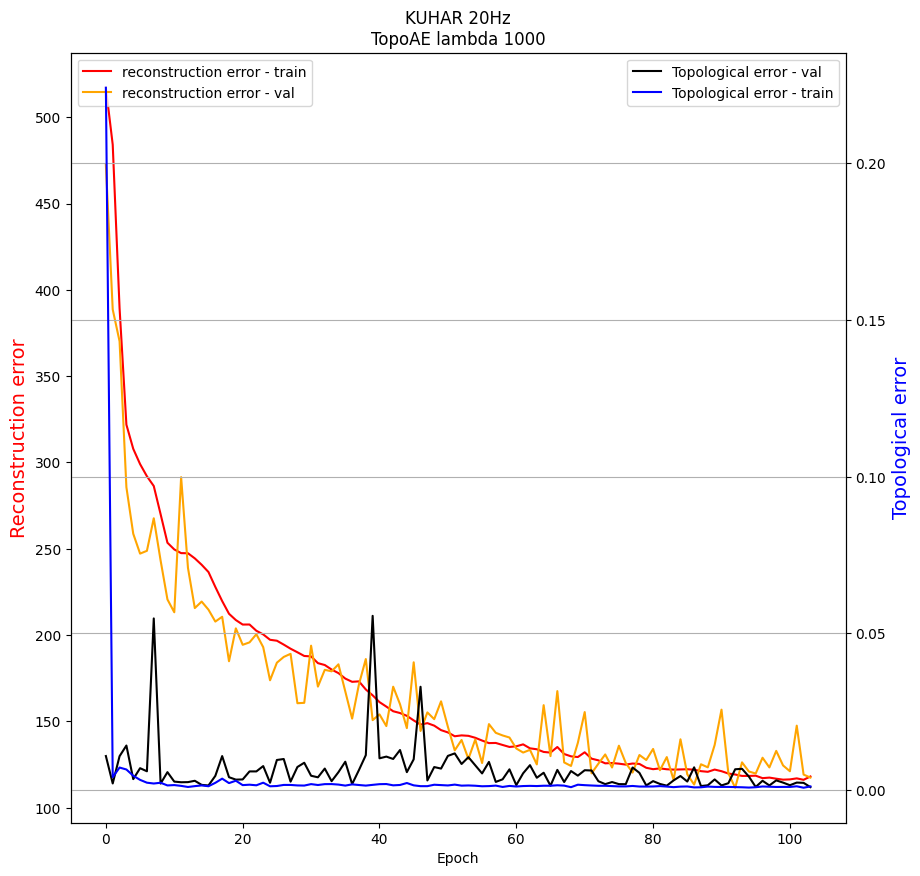

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 10
Epoch:1, P:10, Loss:515.5990, Loss-ae:505.9064, Loss-topo:0.0097
Epoch:2, P:10, Loss:381.9179, Loss-ae:379.7076, Loss-topo:0.0022
Epoch:3, P:10, Loss:309.4968, Loss-ae:305.7376, Loss-topo:0.0038
Epoch:4, P:10, Loss:274.5982, Loss-ae:271.3028, Loss-topo:0.0033
Epoch:5, P:10, Loss:294.9675, Loss-ae:285.9733, Loss-topo:0.0090
Epoch:6, P:9, Loss:252.4506, Loss-ae:247.4297, Loss-topo:0.0050
Epoch:7, P:10, Loss:243.6966, Loss-ae:242.1379, Loss-topo:0.0016
Epoch:8, P:10, Loss:300.0884, Loss-ae:278.0782, Loss-topo:0.0220
Epoch:9, P:9, Loss:246.0675, Loss-ae:243.7251, Loss-topo:0.0023
Epoch:10, P:8, Loss:235.1100, Loss-ae:233.5518, Loss-topo:0.0016
Epoch:11, P:10, Loss:257.2341, Loss-ae:242.0656, Loss-topo:0.0152
Epoch:12, P:9, Loss:270.6890, Loss-ae:264.7348, Loss-topo:0.0060
Epoch:13, P:8, Loss:212.4127, Loss-ae:210.0636, Loss-topo:0.0023
Epoch:14, P:10, Loss:242.

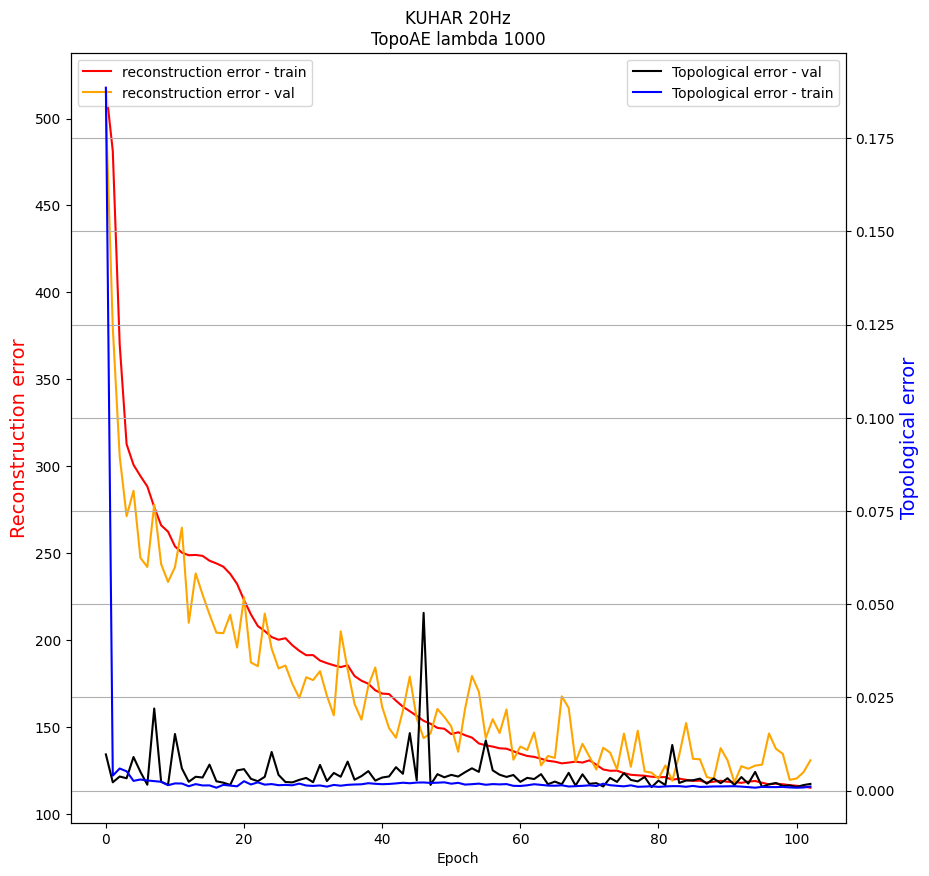

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:566.3347, Loss-ae:562.4291, Loss-topo:0.0039
Epoch:2, P:10, Loss:335.9060, Loss-ae:327.1743, Loss-topo:0.0087
Epoch:3, P:10, Loss:436.5969, Loss-ae:302.3647, Loss-topo:0.1342
Epoch:4, P:9, Loss:337.4471, Loss-ae:315.1983, Loss-topo:0.0222
Epoch:5, P:8, Loss:257.0969, Loss-ae:250.6415, Loss-topo:0.0065
Epoch:6, P:10, Loss:258.4802, Loss-ae:254.5859, Loss-topo:0.0039
Epoch:7, P:9, Loss:244.5495, Loss-ae:239.0697, Loss-topo:0.0055
Epoch:8, P:10, Loss:233.3782, Loss-ae:227.5771, Loss-topo:0.0058
Epoch:9, P:10, Loss:270.3294, Loss-ae:254.1230, Loss-topo:0.0162
Epoch:10, P:9, Loss:223.6367, Loss-ae:222.4743, Loss-topo:0.0012
Epoch:11, P:10, Loss:256.7160, Loss-ae:236.6043, Loss-topo:0.0201
Epoch:12, P:9, Loss:215.2773, Loss-ae:212.5482, Loss-topo:0.0027
Epoch:13, P:10, Loss:227.4225, Loss-ae:223.2454, Loss-topo:0.0042
Epoch:14, P:9, Loss:261.6

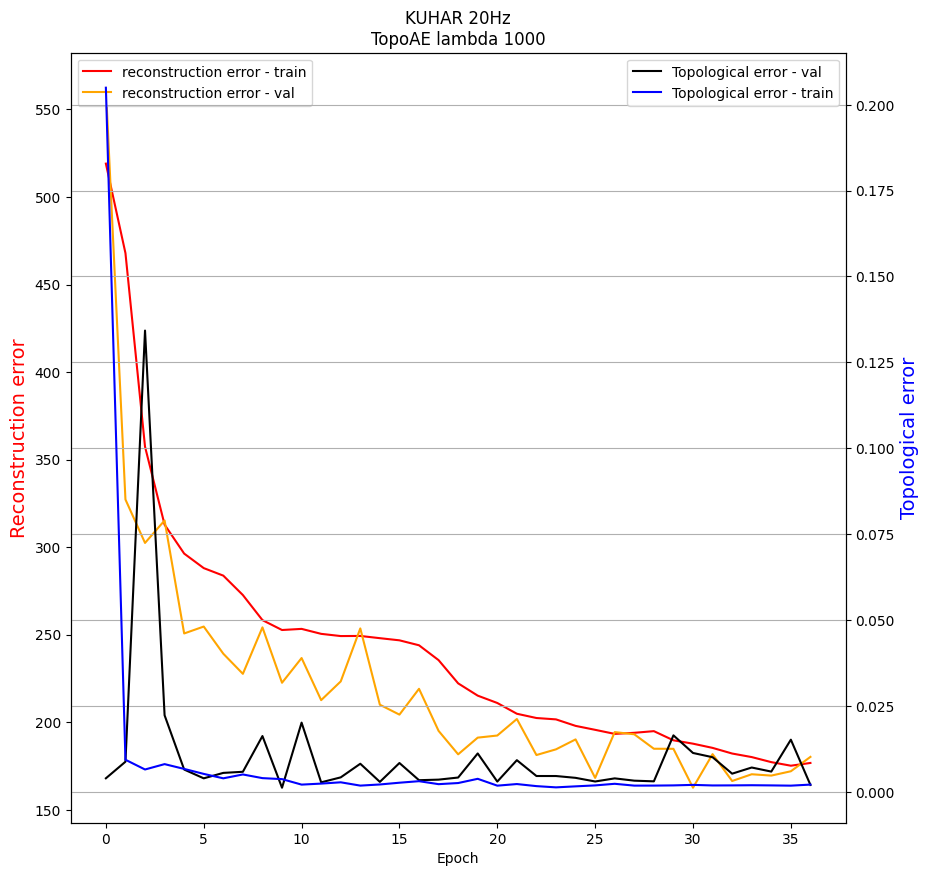

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:513.4203, Loss-ae:506.7184, Loss-topo:0.0067
Epoch:2, P:10, Loss:351.8684, Loss-ae:345.6311, Loss-topo:0.0062
Epoch:3, P:10, Loss:307.8286, Loss-ae:300.1804, Loss-topo:0.0076
Epoch:4, P:10, Loss:289.1909, Loss-ae:285.6106, Loss-topo:0.0036
Epoch:5, P:10, Loss:329.7514, Loss-ae:315.8567, Loss-topo:0.0139
Epoch:6, P:9, Loss:263.6827, Loss-ae:259.9741, Loss-topo:0.0037
Epoch:7, P:10, Loss:264.2459, Loss-ae:261.9074, Loss-topo:0.0023
Epoch:8, P:9, Loss:240.4946, Loss-ae:236.6440, Loss-topo:0.0039
Epoch:9, P:10, Loss:219.2328, Loss-ae:212.8265, Loss-topo:0.0064
Epoch:10, P:10, Loss:256.2644, Loss-ae:246.5604, Loss-topo:0.0097
Epoch:11, P:9, Loss:223.1152, Loss-ae:219.6045, Loss-topo:0.0035
Epoch:12, P:8, Loss:255.5511, Loss-ae:240.2324, Loss-topo:0.0153
Epoch:13, P:7, Loss:214.7003, Loss-ae:212.3008, Loss-topo:0.0024
Epoch:14, P:10, Loss:219.

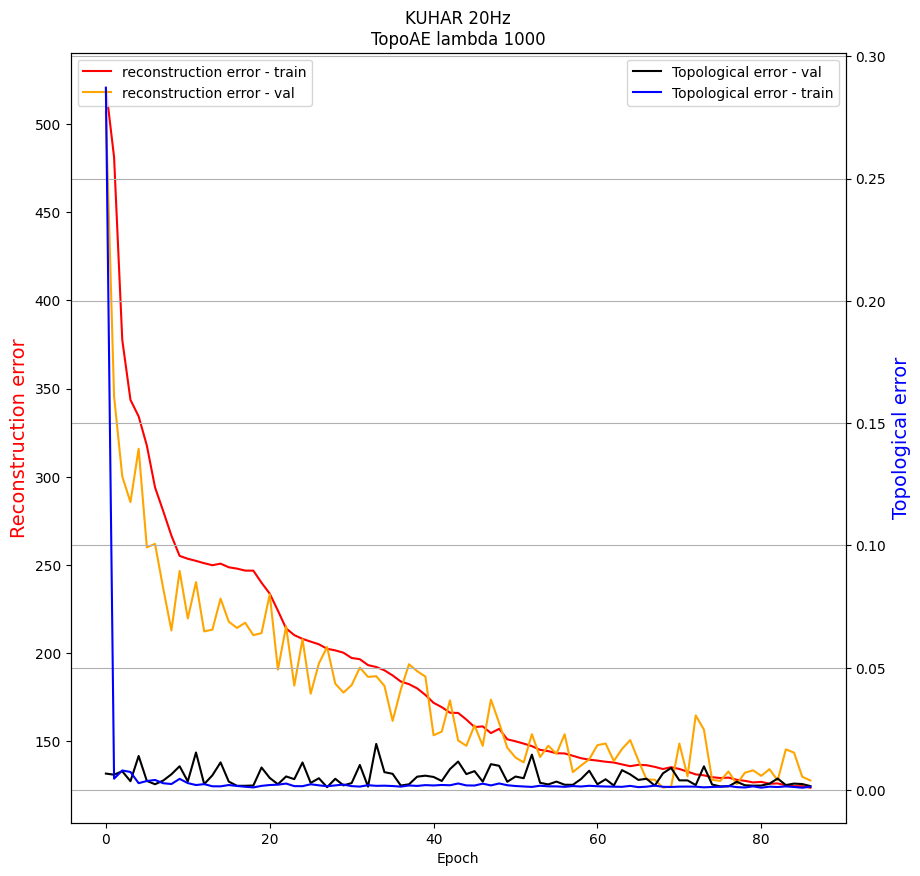

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:489.5123, Loss-ae:482.5076, Loss-topo:0.0070
Epoch:2, P:10, Loss:342.1254, Loss-ae:337.0019, Loss-topo:0.0051
Epoch:3, P:10, Loss:284.2628, Loss-ae:274.5462, Loss-topo:0.0097
Epoch:4, P:10, Loss:336.1950, Loss-ae:322.5641, Loss-topo:0.0136
Epoch:5, P:9, Loss:263.7768, Loss-ae:257.9274, Loss-topo:0.0058
Epoch:6, P:10, Loss:269.3486, Loss-ae:264.9258, Loss-topo:0.0044
Epoch:7, P:9, Loss:278.3656, Loss-ae:268.9581, Loss-topo:0.0094
Epoch:8, P:8, Loss:259.0393, Loss-ae:256.4256, Loss-topo:0.0026
Epoch:9, P:10, Loss:224.6200, Loss-ae:215.1182, Loss-topo:0.0095
Epoch:10, P:10, Loss:230.7082, Loss-ae:229.0943, Loss-topo:0.0016
Epoch:11, P:9, Loss:268.5410, Loss-ae:265.0777, Loss-topo:0.0035
Epoch:12, P:8, Loss:256.1221, Loss-ae:245.1971, Loss-topo:0.0109
Epoch:13, P:7, Loss:220.6657, Loss-ae:217.9193, Loss-topo:0.0027
Epoch:14, P:10, Loss:282.1

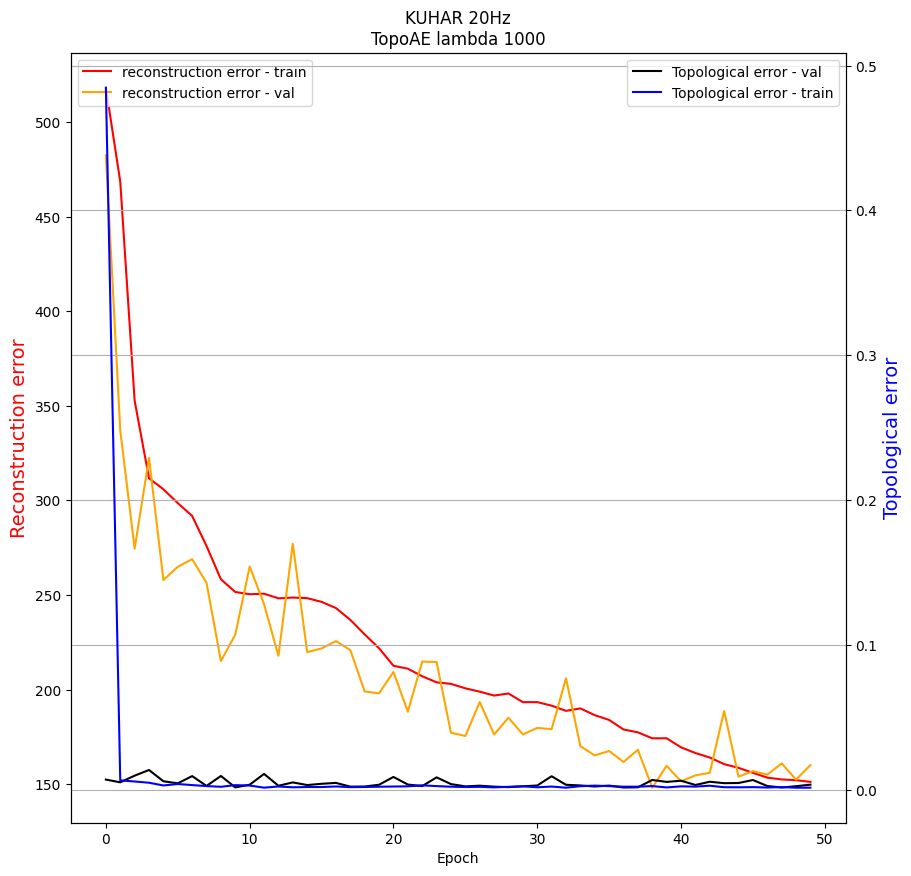

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:533.4729, Loss-ae:508.2364, Loss-topo:0.0252
Epoch:2, P:10, Loss:380.0497, Loss-ae:373.6521, Loss-topo:0.0064
Epoch:3, P:10, Loss:289.7266, Loss-ae:279.6548, Loss-topo:0.0101
Epoch:4, P:10, Loss:318.3369, Loss-ae:292.6227, Loss-topo:0.0257
Epoch:5, P:9, Loss:313.2751, Loss-ae:307.5091, Loss-topo:0.0058
Epoch:6, P:8, Loss:273.2099, Loss-ae:270.5397, Loss-topo:0.0027
Epoch:7, P:10, Loss:287.3710, Loss-ae:275.8409, Loss-topo:0.0115
Epoch:8, P:9, Loss:241.2909, Loss-ae:236.1819, Loss-topo:0.0051
Epoch:9, P:10, Loss:255.3729, Loss-ae:241.5457, Loss-topo:0.0138
Epoch:10, P:9, Loss:287.9190, Loss-ae:275.4341, Loss-topo:0.0125
Epoch:11, P:8, Loss:246.3835, Loss-ae:240.6684, Loss-topo:0.0057
Epoch:12, P:7, Loss:257.1181, Loss-ae:252.6866, Loss-topo:0.0044
Epoch:13, P:6, Loss:227.2736, Loss-ae:222.0815, Loss-topo:0.0052
Epoch:14, P:10, Loss:225.50

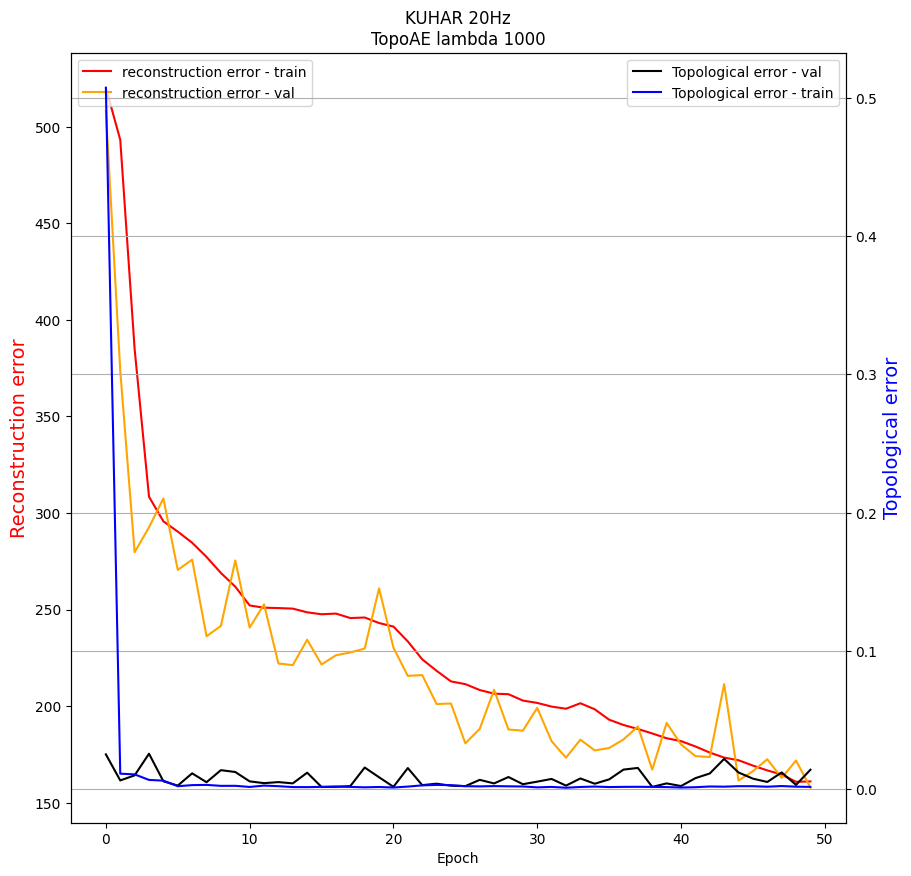

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:440.5844, Loss-ae:413.9172, Loss-topo:0.0267
Epoch:2, P:10, Loss:424.7343, Loss-ae:422.3260, Loss-topo:0.0024
Epoch:3, P:10, Loss:326.6616, Loss-ae:305.1117, Loss-topo:0.0215
Epoch:4, P:10, Loss:247.3598, Loss-ae:243.3777, Loss-topo:0.0040
Epoch:5, P:10, Loss:290.0915, Loss-ae:278.1154, Loss-topo:0.0120
Epoch:6, P:9, Loss:279.2192, Loss-ae:259.8732, Loss-topo:0.0193
Epoch:7, P:8, Loss:234.3569, Loss-ae:231.7902, Loss-topo:0.0026
Epoch:8, P:10, Loss:234.7176, Loss-ae:228.4499, Loss-topo:0.0063
Epoch:9, P:9, Loss:223.3767, Loss-ae:217.0092, Loss-topo:0.0064
Epoch:10, P:10, Loss:225.6625, Loss-ae:224.5509, Loss-topo:0.0011
Epoch:11, P:9, Loss:216.2217, Loss-ae:212.9687, Loss-topo:0.0033
Epoch:12, P:10, Loss:257.0602, Loss-ae:253.8056, Loss-topo:0.0033
Epoch:13, P:9, Loss:239.4955, Loss-ae:237.0972, Loss-topo:0.0024
Epoch:14, P:8, Loss:232.3

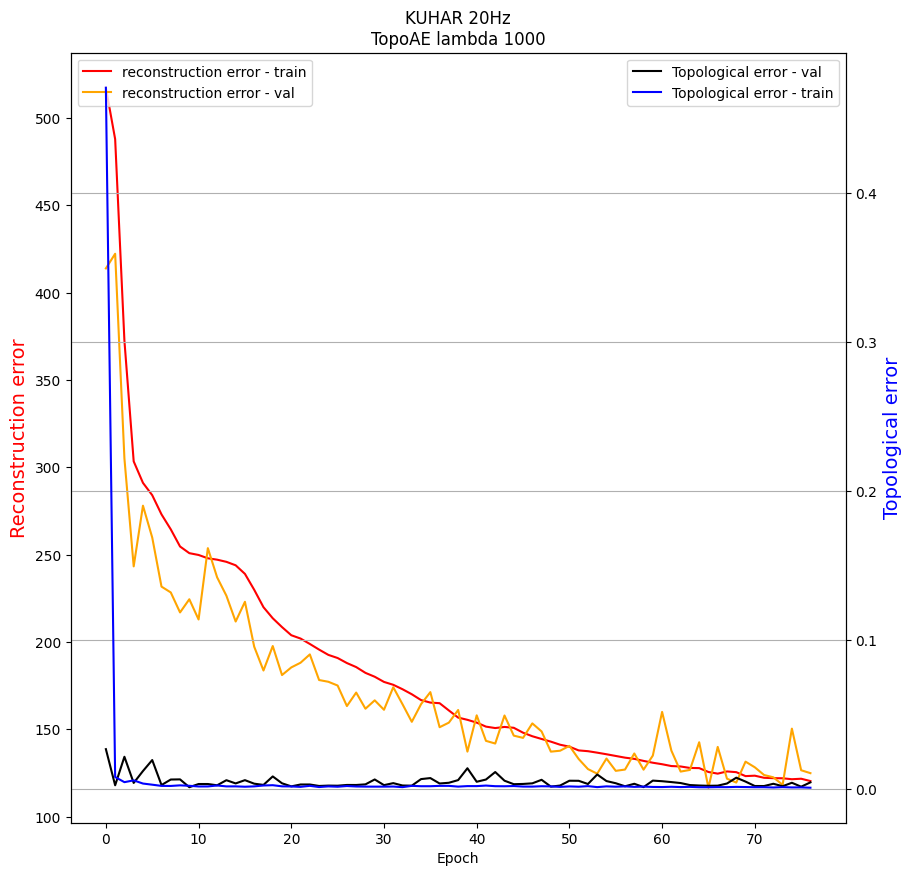

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:495.4854, Loss-ae:458.0838, Loss-topo:0.0374
Epoch:2, P:10, Loss:453.5406, Loss-ae:451.0516, Loss-topo:0.0025
Epoch:3, P:10, Loss:329.8197, Loss-ae:316.2355, Loss-topo:0.0136
Epoch:4, P:10, Loss:261.1901, Loss-ae:255.0313, Loss-topo:0.0062
Epoch:5, P:10, Loss:243.4034, Loss-ae:238.8284, Loss-topo:0.0046
Epoch:6, P:10, Loss:276.9004, Loss-ae:268.7851, Loss-topo:0.0081
Epoch:7, P:9, Loss:248.0974, Loss-ae:240.7342, Loss-topo:0.0074
Epoch:8, P:8, Loss:270.5705, Loss-ae:264.8639, Loss-topo:0.0057
Epoch:9, P:7, Loss:269.9930, Loss-ae:255.8473, Loss-topo:0.0141
Epoch:10, P:6, Loss:260.1019, Loss-ae:252.8474, Loss-topo:0.0073
Epoch:11, P:5, Loss:244.4605, Loss-ae:241.1029, Loss-topo:0.0034
Epoch:12, P:4, Loss:217.8841, Loss-ae:209.8994, Loss-topo:0.0080
Epoch:13, P:10, Loss:219.9531, Loss-ae:208.4971, Loss-topo:0.0115
Epoch:14, P:9, Loss:244.39

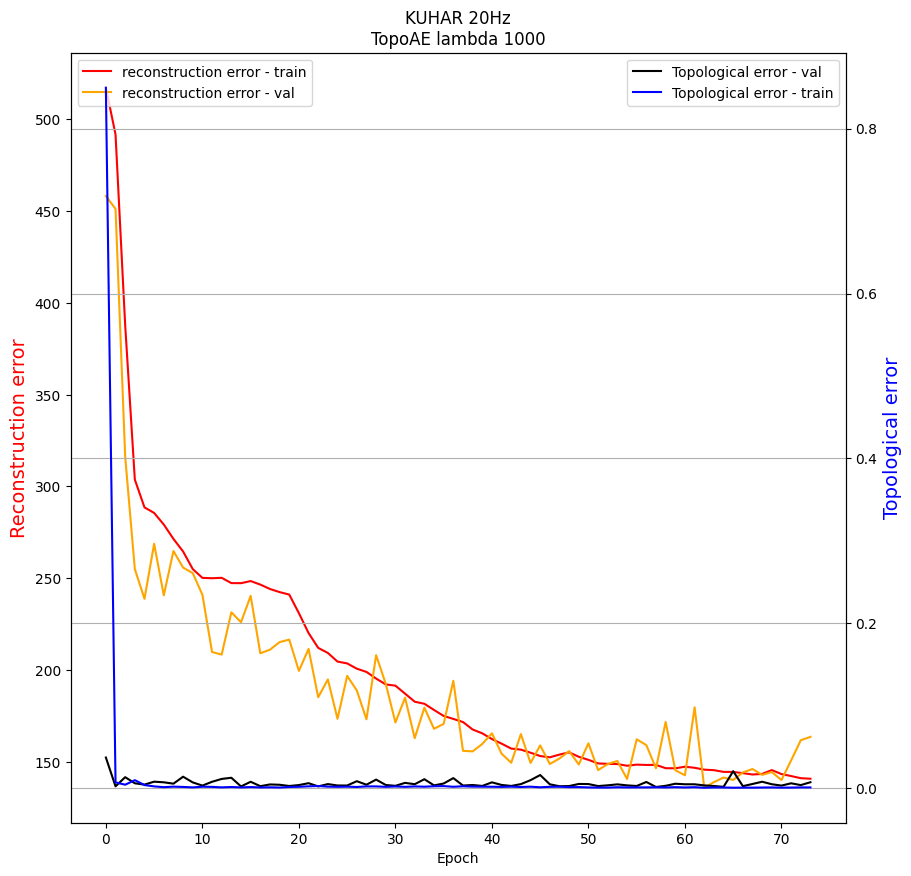

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:456.0670, Loss-ae:443.4593, Loss-topo:0.0126
Epoch:2, P:10, Loss:399.4897, Loss-ae:390.9036, Loss-topo:0.0086
Epoch:3, P:10, Loss:264.1784, Loss-ae:257.3605, Loss-topo:0.0068
Epoch:4, P:10, Loss:290.8595, Loss-ae:268.1207, Loss-topo:0.0227
Epoch:5, P:9, Loss:253.0605, Loss-ae:242.8515, Loss-topo:0.0102
Epoch:6, P:10, Loss:290.6044, Loss-ae:258.8982, Loss-topo:0.0317
Epoch:7, P:9, Loss:224.9434, Loss-ae:221.4966, Loss-topo:0.0034
Epoch:8, P:10, Loss:241.4009, Loss-ae:238.0546, Loss-topo:0.0033
Epoch:9, P:9, Loss:265.4453, Loss-ae:249.7077, Loss-topo:0.0157
Epoch:10, P:8, Loss:225.0664, Loss-ae:222.7130, Loss-topo:0.0024
Epoch:11, P:7, Loss:242.3448, Loss-ae:240.0400, Loss-topo:0.0023
Epoch:12, P:6, Loss:233.2876, Loss-ae:225.3376, Loss-topo:0.0080
Epoch:13, P:5, Loss:264.9123, Loss-ae:247.4805, Loss-topo:0.0174
Epoch:14, P:4, Loss:247.753

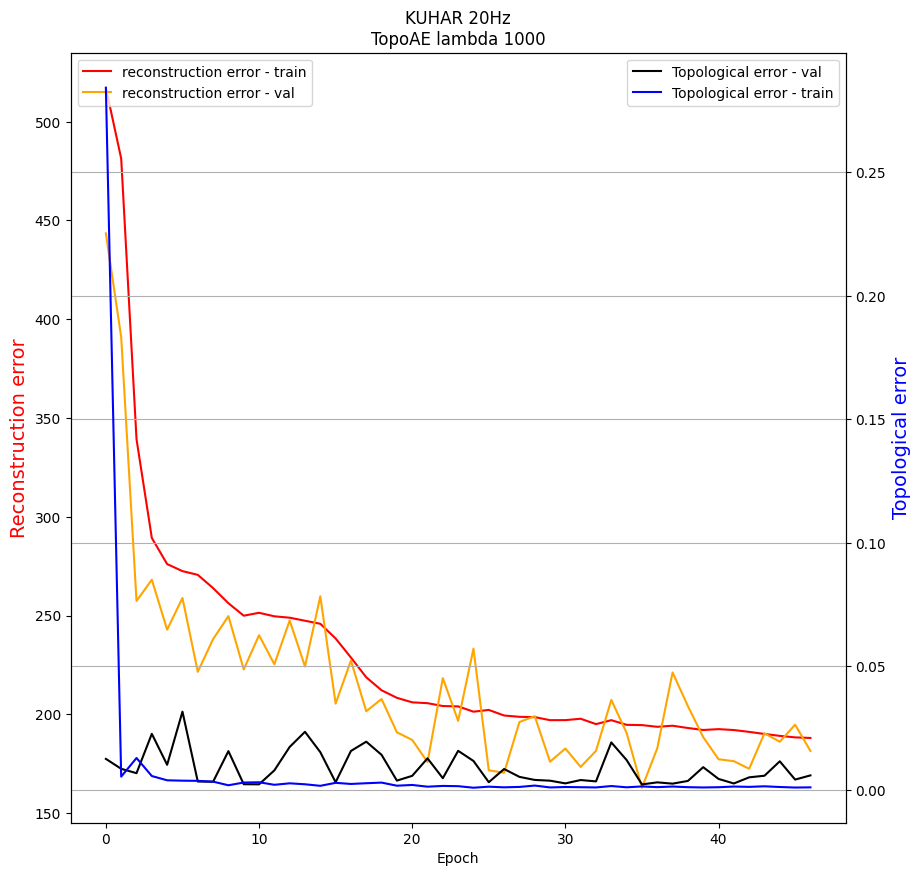

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:491.2206, Loss-ae:472.5191, Loss-topo:0.0187
Epoch:2, P:10, Loss:347.8739, Loss-ae:345.3934, Loss-topo:0.0025
Epoch:3, P:10, Loss:329.4405, Loss-ae:299.7391, Loss-topo:0.0297
Epoch:4, P:10, Loss:334.5581, Loss-ae:272.7641, Loss-topo:0.0618
Epoch:5, P:9, Loss:239.1214, Loss-ae:234.7988, Loss-topo:0.0043
Epoch:6, P:10, Loss:225.4937, Loss-ae:221.4871, Loss-topo:0.0040
Epoch:7, P:10, Loss:240.5669, Loss-ae:237.2411, Loss-topo:0.0033
Epoch:8, P:9, Loss:222.5551, Loss-ae:220.2416, Loss-topo:0.0023
Epoch:9, P:10, Loss:239.2553, Loss-ae:234.9899, Loss-topo:0.0043
Epoch:10, P:9, Loss:225.1106, Loss-ae:222.0206, Loss-topo:0.0031
Epoch:11, P:8, Loss:215.6778, Loss-ae:209.1779, Loss-topo:0.0065
Epoch:12, P:10, Loss:223.0593, Loss-ae:221.1114, Loss-topo:0.0019
Epoch:13, P:9, Loss:242.3083, Loss-ae:239.7522, Loss-topo:0.0026
Epoch:14, P:8, Loss:230.8

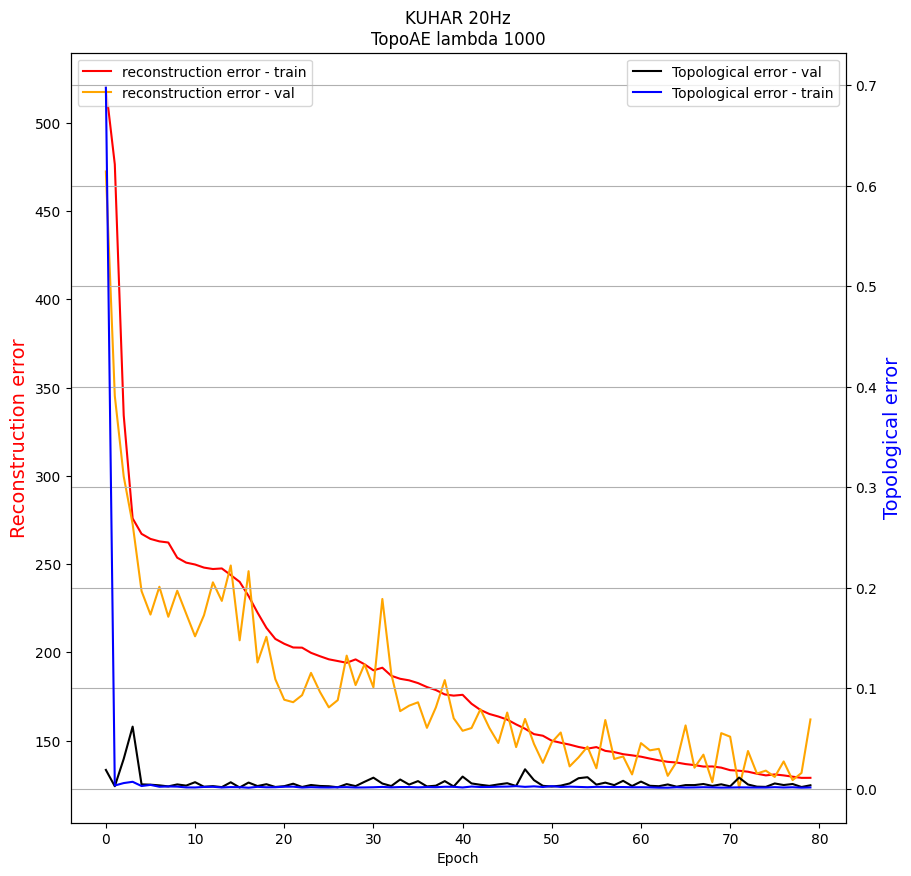

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:504.4045, Loss-ae:498.1453, Loss-topo:0.0063
Epoch:2, P:10, Loss:400.3397, Loss-ae:383.9285, Loss-topo:0.0164
Epoch:3, P:10, Loss:390.5868, Loss-ae:298.9299, Loss-topo:0.0917
Epoch:4, P:10, Loss:241.3172, Loss-ae:236.3740, Loss-topo:0.0049
Epoch:5, P:10, Loss:235.8329, Loss-ae:231.0394, Loss-topo:0.0048
Epoch:6, P:10, Loss:251.6748, Loss-ae:242.0387, Loss-topo:0.0096
Epoch:7, P:9, Loss:255.2812, Loss-ae:247.8978, Loss-topo:0.0074
Epoch:8, P:8, Loss:261.4022, Loss-ae:255.8163, Loss-topo:0.0056
Epoch:9, P:7, Loss:215.8076, Loss-ae:212.8075, Loss-topo:0.0030
Epoch:10, P:10, Loss:238.2936, Loss-ae:226.1999, Loss-topo:0.0121
Epoch:11, P:9, Loss:242.0032, Loss-ae:239.8625, Loss-topo:0.0021
Epoch:12, P:8, Loss:225.9705, Loss-ae:218.4563, Loss-topo:0.0075
Epoch:13, P:7, Loss:300.8914, Loss-ae:298.5769, Loss-topo:0.0023
Epoch:14, P:6, Loss:248.52

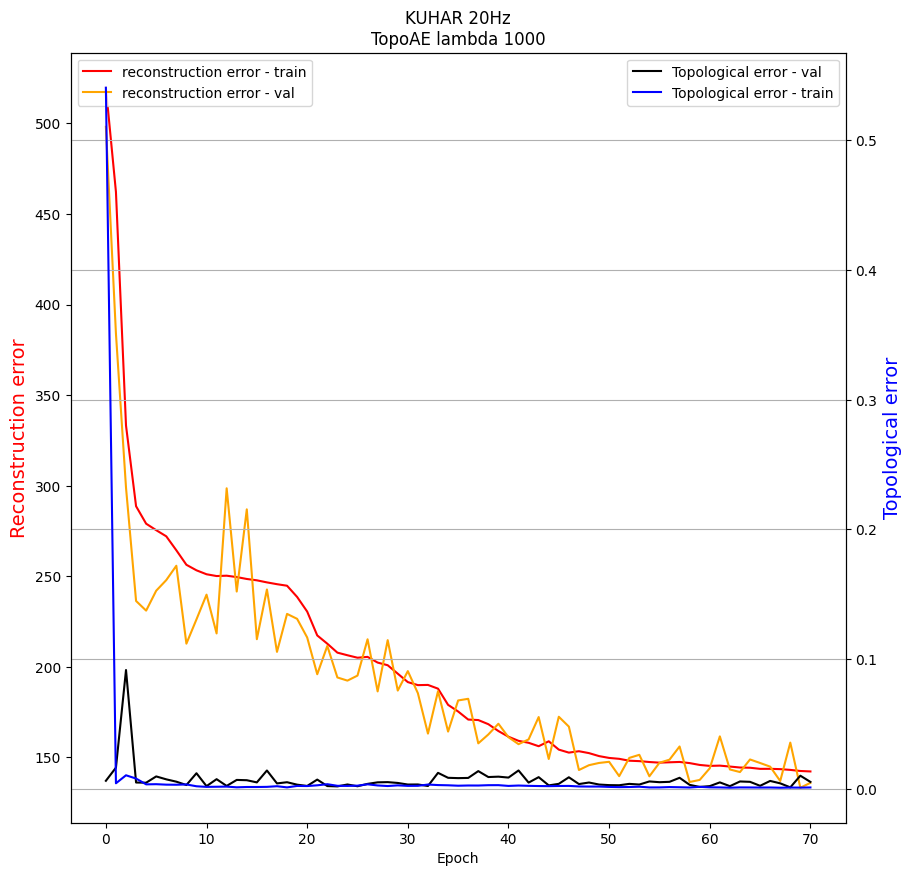

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 20
Epoch:1, P:10, Loss:573.4362, Loss-ae:481.6459, Loss-topo:0.0918
Epoch:2, P:10, Loss:397.8930, Loss-ae:369.1292, Loss-topo:0.0288
Epoch:3, P:10, Loss:266.6673, Loss-ae:253.5048, Loss-topo:0.0132
Epoch:4, P:10, Loss:245.5066, Loss-ae:228.8231, Loss-topo:0.0167
Epoch:5, P:10, Loss:242.6886, Loss-ae:239.9949, Loss-topo:0.0027
Epoch:6, P:10, Loss:252.2023, Loss-ae:250.2528, Loss-topo:0.0019
Epoch:7, P:9, Loss:223.9947, Loss-ae:221.8524, Loss-topo:0.0021
Epoch:8, P:10, Loss:250.6087, Loss-ae:246.9453, Loss-topo:0.0037
Epoch:9, P:9, Loss:222.6949, Loss-ae:218.9192, Loss-topo:0.0038
Epoch:10, P:10, Loss:231.9657, Loss-ae:229.7920, Loss-topo:0.0022
Epoch:11, P:9, Loss:239.5318, Loss-ae:231.2315, Loss-topo:0.0083
Epoch:12, P:8, Loss:266.6183, Loss-ae:261.2136, Loss-topo:0.0054
Epoch:13, P:7, Loss:213.4182, Loss-ae:210.4457, Loss-topo:0.0030
Epoch:14, P:10, Loss:234.

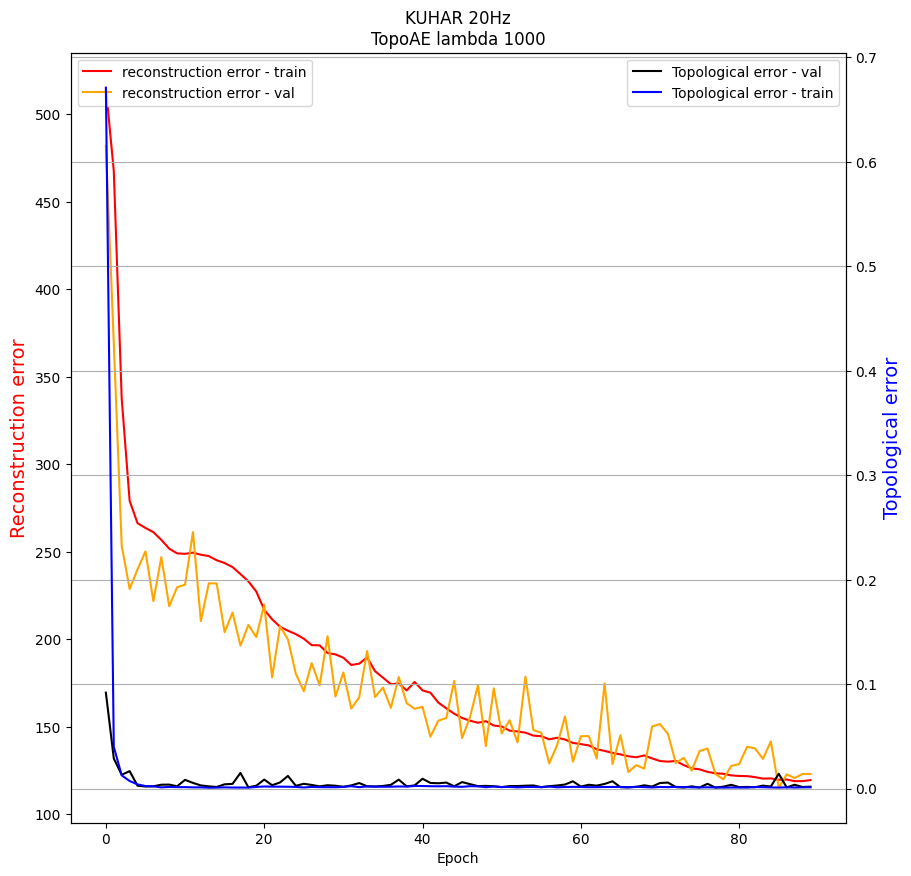

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:433.0533, Loss-ae:425.3652, Loss-topo:0.0077
Epoch:2, P:10, Loss:450.4751, Loss-ae:438.4030, Loss-topo:0.0121
Epoch:3, P:9, Loss:285.0725, Loss-ae:269.4261, Loss-topo:0.0156
Epoch:4, P:10, Loss:288.4248, Loss-ae:267.7700, Loss-topo:0.0207
Epoch:5, P:9, Loss:259.2178, Loss-ae:256.6120, Loss-topo:0.0026
Epoch:6, P:10, Loss:280.1392, Loss-ae:255.2096, Loss-topo:0.0249
Epoch:7, P:9, Loss:294.9628, Loss-ae:284.1232, Loss-topo:0.0108
Epoch:8, P:8, Loss:276.6080, Loss-ae:263.2047, Loss-topo:0.0134
Epoch:9, P:7, Loss:232.3237, Loss-ae:228.7652, Loss-topo:0.0036
Epoch:10, P:10, Loss:271.3451, Loss-ae:253.5411, Loss-topo:0.0178
Epoch:11, P:9, Loss:231.7427, Loss-ae:224.0766, Loss-topo:0.0077
Epoch:12, P:10, Loss:230.6237, Loss-ae:226.2100, Loss-topo:0.0044
Epoch:13, P:10, Loss:222.7225, Loss-ae:216.9631, Loss-topo:0.0058
Epoch:14, P:10, Loss:266.8

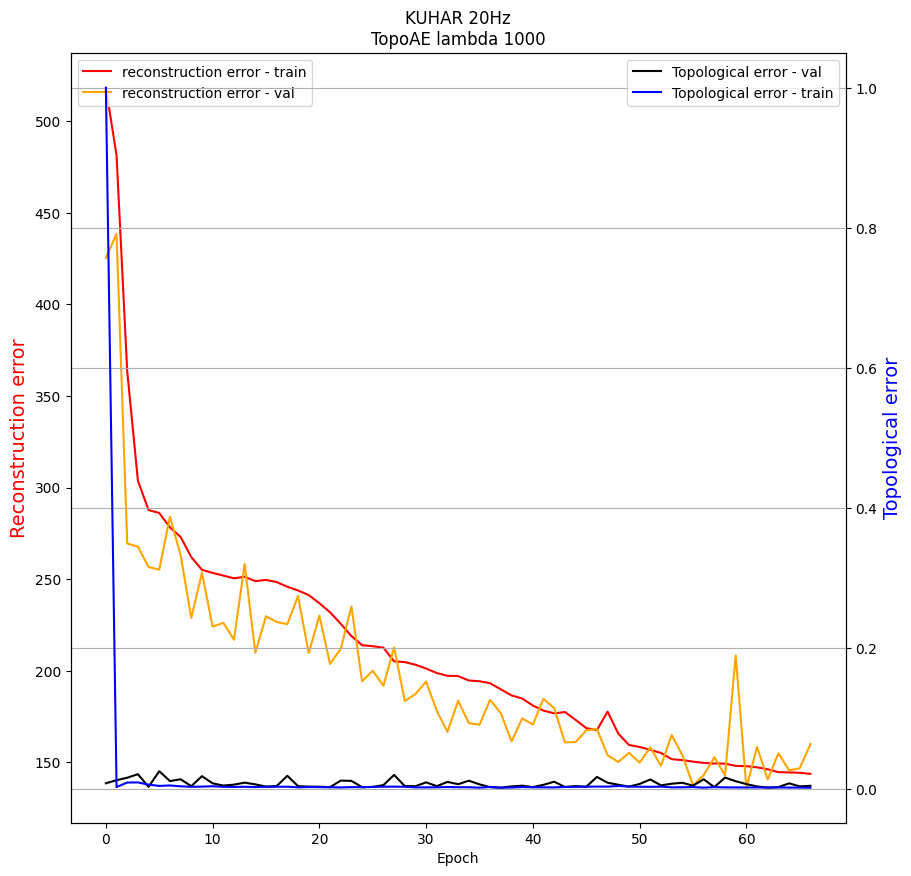

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:492.9592, Loss-ae:480.7501, Loss-topo:0.0122
Epoch:2, P:10, Loss:377.1507, Loss-ae:369.3399, Loss-topo:0.0078
Epoch:3, P:10, Loss:284.7715, Loss-ae:275.1090, Loss-topo:0.0097
Epoch:4, P:10, Loss:301.0799, Loss-ae:274.0060, Loss-topo:0.0271
Epoch:5, P:9, Loss:286.3916, Loss-ae:249.1741, Loss-topo:0.0372
Epoch:6, P:8, Loss:256.3055, Loss-ae:248.9554, Loss-topo:0.0074
Epoch:7, P:10, Loss:280.5038, Loss-ae:245.7443, Loss-topo:0.0348
Epoch:8, P:9, Loss:284.7628, Loss-ae:277.2968, Loss-topo:0.0075
Epoch:9, P:8, Loss:253.8967, Loss-ae:236.7525, Loss-topo:0.0171
Epoch:10, P:10, Loss:230.3629, Loss-ae:225.8303, Loss-topo:0.0045
Epoch:11, P:10, Loss:229.2742, Loss-ae:224.8828, Loss-topo:0.0044
Epoch:12, P:10, Loss:227.8988, Loss-ae:218.7588, Loss-topo:0.0091
Epoch:13, P:10, Loss:261.5981, Loss-ae:239.0565, Loss-topo:0.0225
Epoch:14, P:9, Loss:233.

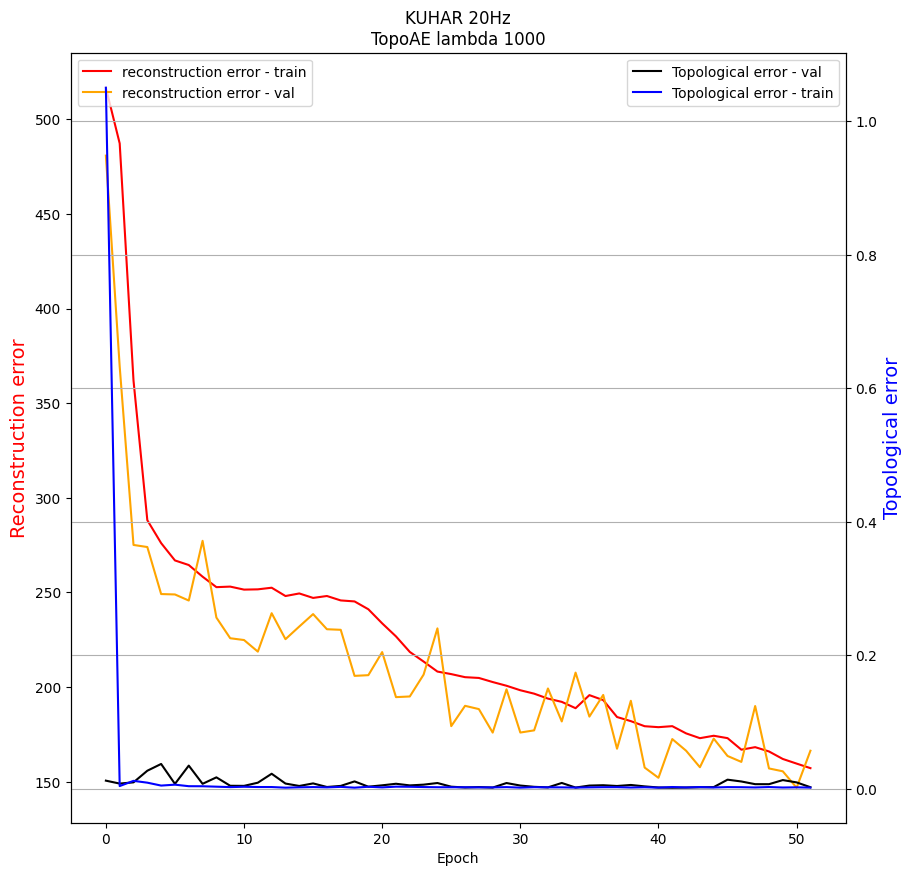

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:662.1437, Loss-ae:643.4097, Loss-topo:0.0187
Epoch:2, P:10, Loss:411.4962, Loss-ae:386.9185, Loss-topo:0.0246
Epoch:3, P:10, Loss:307.5468, Loss-ae:296.3877, Loss-topo:0.0112
Epoch:4, P:10, Loss:309.8232, Loss-ae:307.9973, Loss-topo:0.0018
Epoch:5, P:9, Loss:392.2966, Loss-ae:345.3281, Loss-topo:0.0470
Epoch:6, P:8, Loss:316.2746, Loss-ae:304.0757, Loss-topo:0.0122
Epoch:7, P:7, Loss:278.5125, Loss-ae:272.5516, Loss-topo:0.0060
Epoch:8, P:10, Loss:250.5349, Loss-ae:240.2146, Loss-topo:0.0103
Epoch:9, P:10, Loss:270.3457, Loss-ae:248.1800, Loss-topo:0.0222
Epoch:10, P:9, Loss:283.3443, Loss-ae:252.4469, Loss-topo:0.0309
Epoch:11, P:8, Loss:223.7461, Loss-ae:221.2178, Loss-topo:0.0025
Epoch:12, P:10, Loss:233.6522, Loss-ae:225.2497, Loss-topo:0.0084
Epoch:13, P:9, Loss:221.4223, Loss-ae:215.3901, Loss-topo:0.0060
Epoch:14, P:10, Loss:230.8

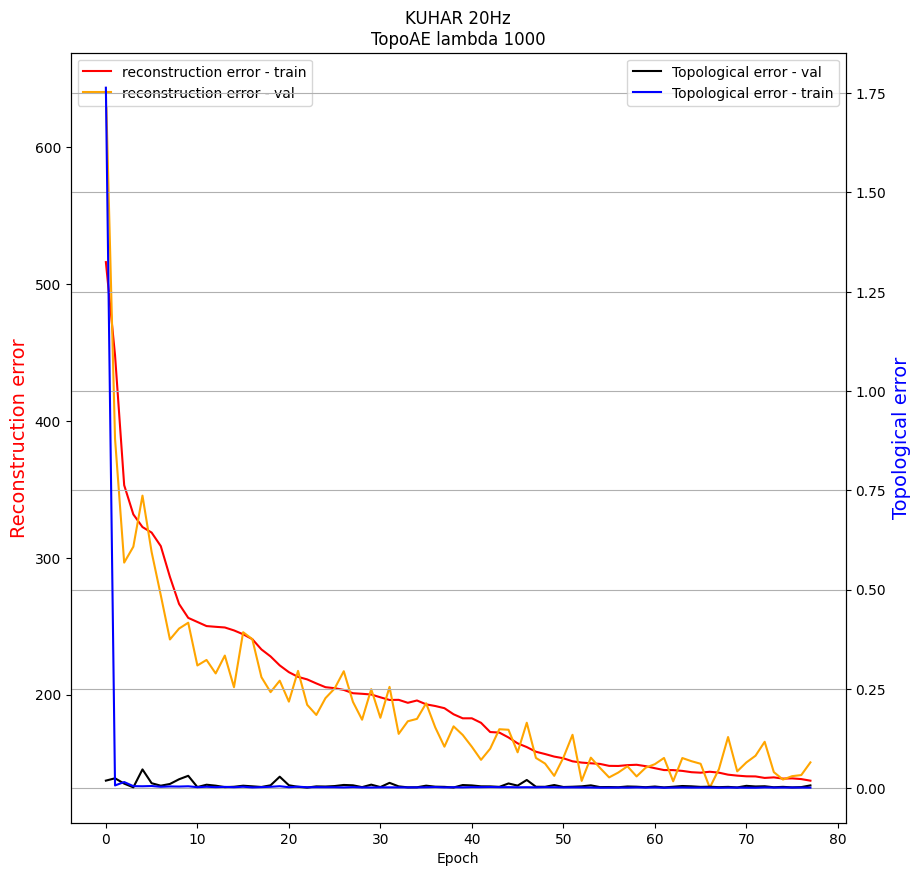

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:531.9023, Loss-ae:521.1989, Loss-topo:0.0107
Epoch:2, P:10, Loss:356.9119, Loss-ae:346.1853, Loss-topo:0.0107
Epoch:3, P:10, Loss:366.1811, Loss-ae:301.3768, Loss-topo:0.0648
Epoch:4, P:9, Loss:276.5063, Loss-ae:251.5750, Loss-topo:0.0249
Epoch:5, P:10, Loss:244.5325, Loss-ae:237.3090, Loss-topo:0.0072
Epoch:6, P:10, Loss:242.8961, Loss-ae:237.5709, Loss-topo:0.0053
Epoch:7, P:10, Loss:273.2863, Loss-ae:232.4580, Loss-topo:0.0408
Epoch:8, P:9, Loss:246.7844, Loss-ae:230.3863, Loss-topo:0.0164
Epoch:9, P:8, Loss:224.5992, Loss-ae:220.7484, Loss-topo:0.0039
Epoch:10, P:10, Loss:218.3536, Loss-ae:206.9220, Loss-topo:0.0114
Epoch:11, P:10, Loss:226.7577, Loss-ae:223.7143, Loss-topo:0.0030
Epoch:12, P:9, Loss:243.9405, Loss-ae:237.1258, Loss-topo:0.0068
Epoch:13, P:8, Loss:236.1416, Loss-ae:234.8533, Loss-topo:0.0013
Epoch:14, P:7, Loss:239.3

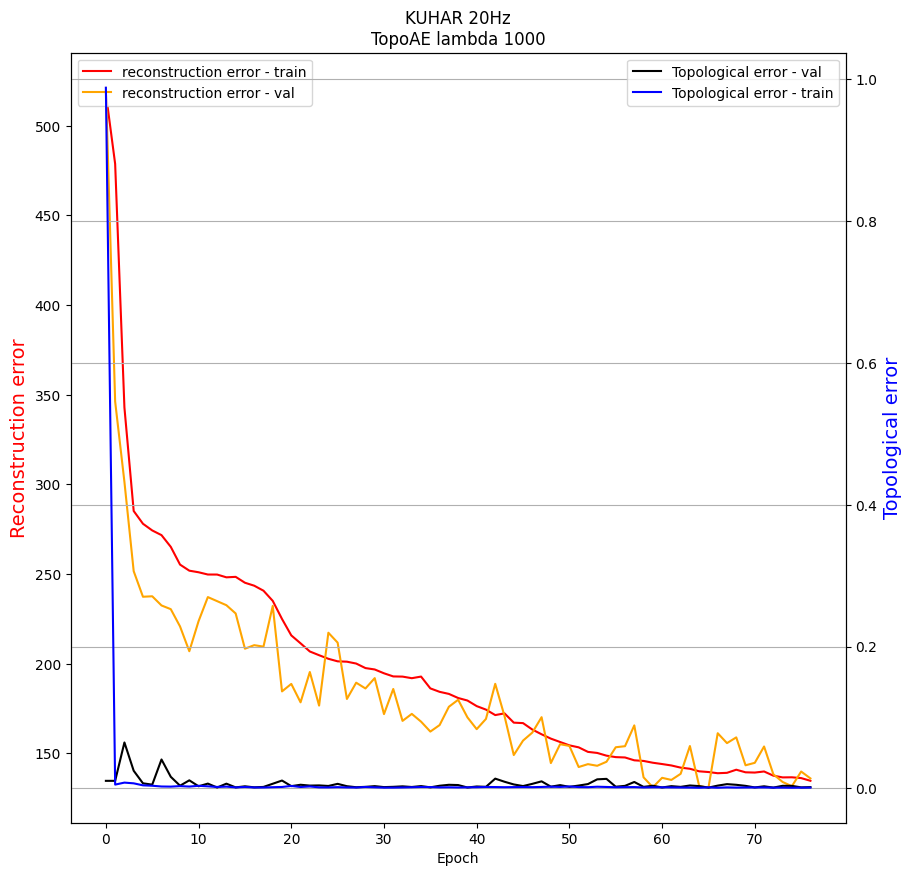

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:496.1561, Loss-ae:491.7036, Loss-topo:0.0045
Epoch:2, P:10, Loss:349.3107, Loss-ae:341.2184, Loss-topo:0.0081
Epoch:3, P:10, Loss:276.8600, Loss-ae:272.4422, Loss-topo:0.0044
Epoch:4, P:10, Loss:286.8840, Loss-ae:261.6691, Loss-topo:0.0252
Epoch:5, P:9, Loss:256.8930, Loss-ae:251.6438, Loss-topo:0.0052
Epoch:6, P:10, Loss:258.8842, Loss-ae:241.4256, Loss-topo:0.0175
Epoch:7, P:9, Loss:258.4690, Loss-ae:254.6511, Loss-topo:0.0038
Epoch:8, P:8, Loss:231.2660, Loss-ae:229.0545, Loss-topo:0.0022
Epoch:9, P:10, Loss:254.1345, Loss-ae:248.6451, Loss-topo:0.0055
Epoch:10, P:9, Loss:221.4647, Loss-ae:216.9477, Loss-topo:0.0045
Epoch:11, P:10, Loss:244.1768, Loss-ae:241.9379, Loss-topo:0.0022
Epoch:12, P:9, Loss:260.6213, Loss-ae:236.4547, Loss-topo:0.0242
Epoch:13, P:8, Loss:268.6094, Loss-ae:266.5237, Loss-topo:0.0021
Epoch:14, P:7, Loss:224.86

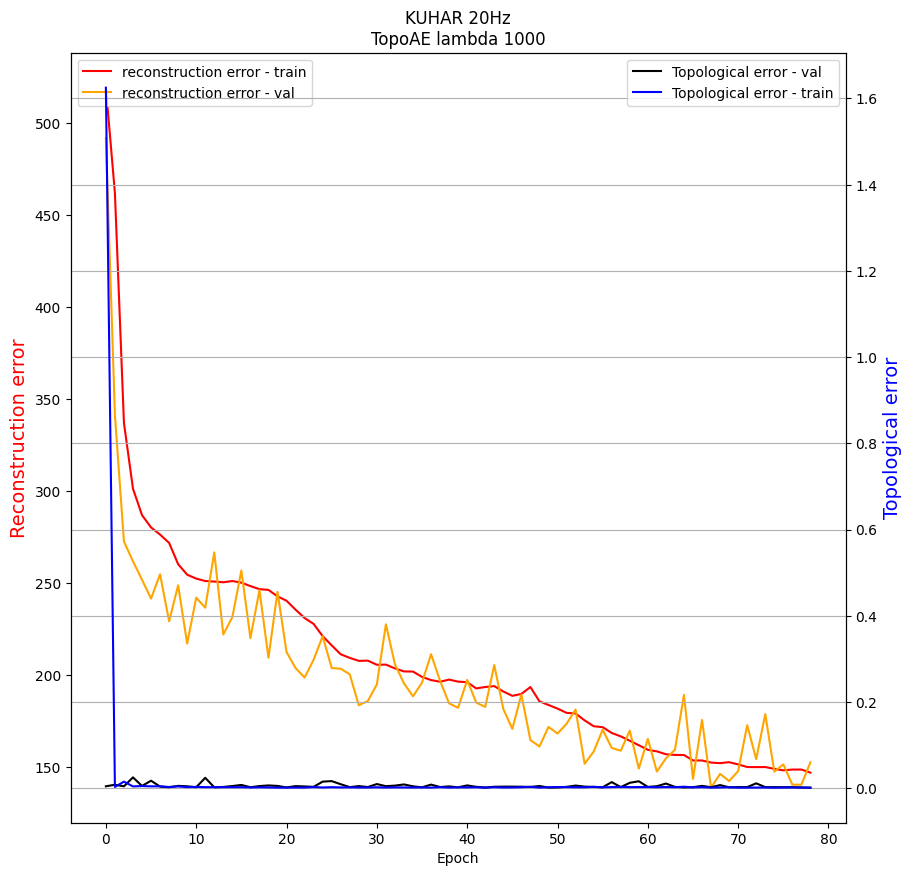

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:522.5359, Loss-ae:519.4327, Loss-topo:0.0031
Epoch:2, P:10, Loss:394.0056, Loss-ae:387.2060, Loss-topo:0.0068
Epoch:3, P:10, Loss:266.4168, Loss-ae:256.7066, Loss-topo:0.0097
Epoch:4, P:10, Loss:278.6707, Loss-ae:269.2641, Loss-topo:0.0094
Epoch:5, P:9, Loss:251.1601, Loss-ae:237.5856, Loss-topo:0.0136
Epoch:6, P:10, Loss:264.3273, Loss-ae:260.4747, Loss-topo:0.0039
Epoch:7, P:9, Loss:254.6707, Loss-ae:250.8750, Loss-topo:0.0038
Epoch:8, P:8, Loss:239.5441, Loss-ae:237.2260, Loss-topo:0.0023
Epoch:9, P:10, Loss:227.8355, Loss-ae:225.1800, Loss-topo:0.0027
Epoch:10, P:10, Loss:275.9817, Loss-ae:265.5108, Loss-topo:0.0105
Epoch:11, P:9, Loss:270.0402, Loss-ae:256.3978, Loss-topo:0.0136
Epoch:12, P:8, Loss:220.1343, Loss-ae:217.1764, Loss-topo:0.0030
Epoch:13, P:10, Loss:255.6969, Loss-ae:246.9597, Loss-topo:0.0087
Epoch:14, P:9, Loss:245.2

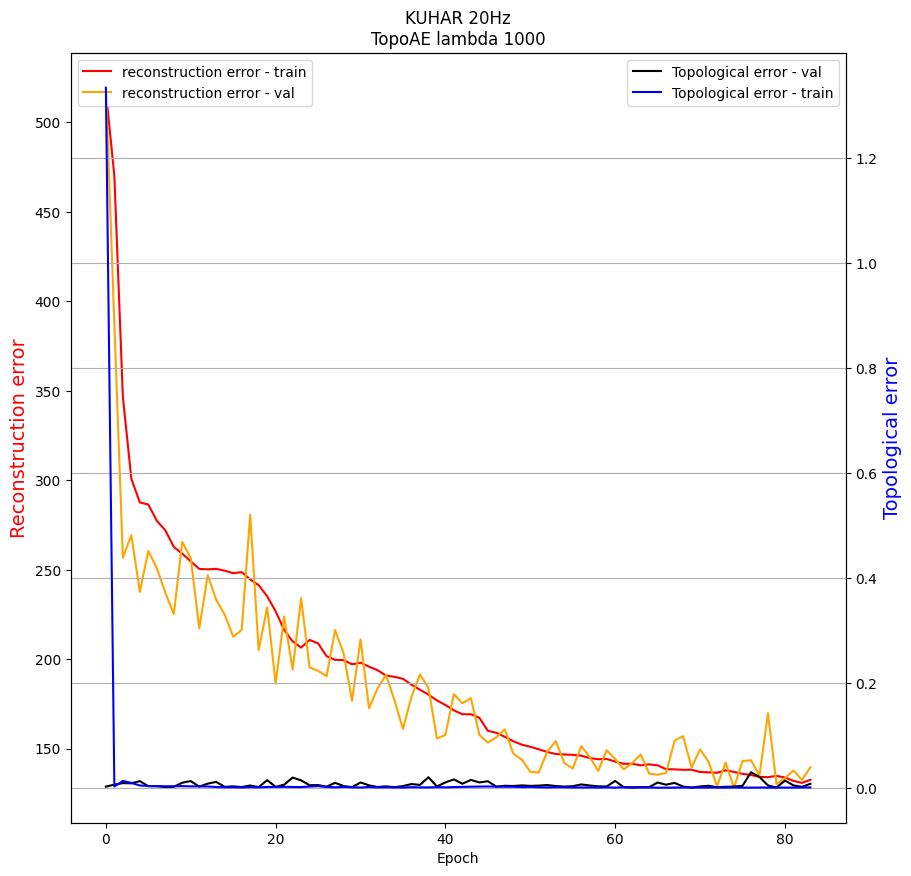

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:510.4225, Loss-ae:492.5202, Loss-topo:0.0179
Epoch:2, P:10, Loss:368.6054, Loss-ae:354.4967, Loss-topo:0.0141
Epoch:3, P:10, Loss:350.7331, Loss-ae:293.0478, Loss-topo:0.0577
Epoch:4, P:10, Loss:314.8381, Loss-ae:286.4658, Loss-topo:0.0284
Epoch:5, P:10, Loss:290.9990, Loss-ae:258.1360, Loss-topo:0.0329
Epoch:6, P:10, Loss:277.1737, Loss-ae:258.5833, Loss-topo:0.0186
Epoch:7, P:10, Loss:247.6283, Loss-ae:234.3246, Loss-topo:0.0133
Epoch:8, P:10, Loss:280.7470, Loss-ae:250.2217, Loss-topo:0.0305
Epoch:9, P:9, Loss:255.5765, Loss-ae:249.9923, Loss-topo:0.0056
Epoch:10, P:8, Loss:284.4590, Loss-ae:279.3632, Loss-topo:0.0051
Epoch:11, P:7, Loss:250.9879, Loss-ae:225.4633, Loss-topo:0.0255
Epoch:12, P:6, Loss:271.7374, Loss-ae:243.5954, Loss-topo:0.0281
Epoch:13, P:5, Loss:227.4830, Loss-ae:223.6154, Loss-topo:0.0039
Epoch:14, P:10, Loss:282.

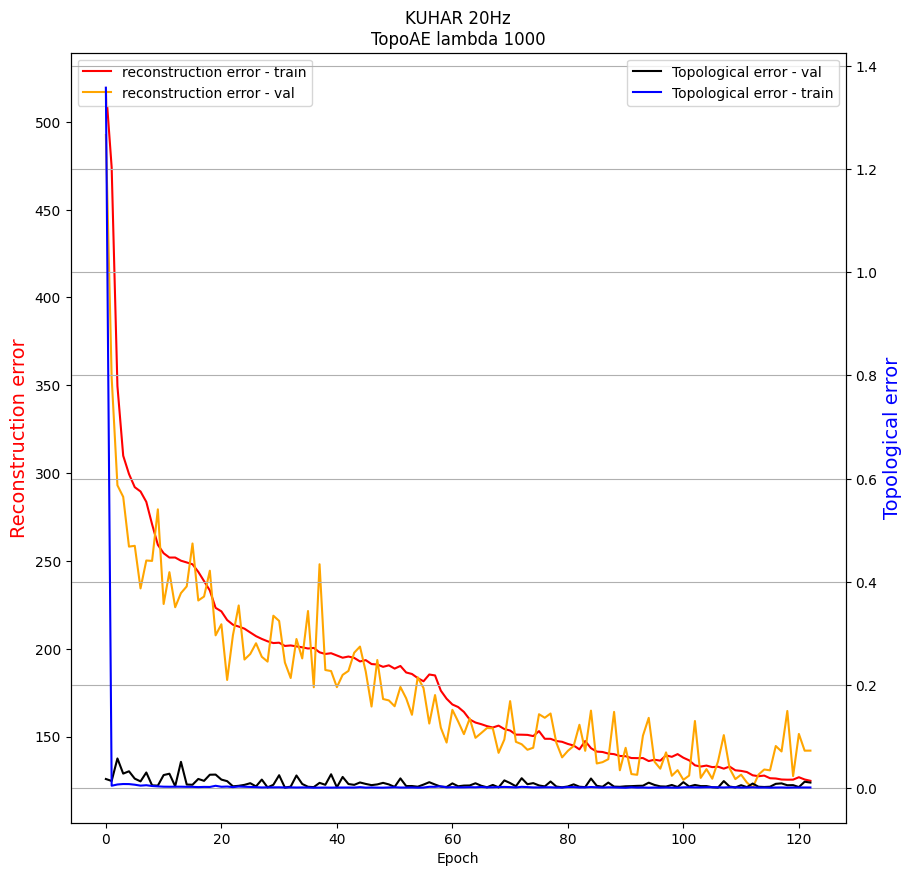

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:466.8143, Loss-ae:459.3499, Loss-topo:0.0075
Epoch:2, P:10, Loss:368.3684, Loss-ae:365.2330, Loss-topo:0.0031
Epoch:3, P:10, Loss:267.6471, Loss-ae:257.9499, Loss-topo:0.0097
Epoch:4, P:10, Loss:250.6102, Loss-ae:248.2015, Loss-topo:0.0024
Epoch:5, P:10, Loss:241.2229, Loss-ae:236.0055, Loss-topo:0.0052
Epoch:6, P:10, Loss:255.6799, Loss-ae:248.6029, Loss-topo:0.0071
Epoch:7, P:9, Loss:220.2790, Loss-ae:215.7713, Loss-topo:0.0045
Epoch:8, P:10, Loss:247.9109, Loss-ae:235.8669, Loss-topo:0.0120
Epoch:9, P:9, Loss:234.1607, Loss-ae:230.9733, Loss-topo:0.0032
Epoch:10, P:8, Loss:257.2060, Loss-ae:238.3411, Loss-topo:0.0189
Epoch:11, P:7, Loss:221.5099, Loss-ae:217.0651, Loss-topo:0.0044
Epoch:12, P:6, Loss:228.7023, Loss-ae:225.7019, Loss-topo:0.0030
Epoch:13, P:5, Loss:230.3449, Loss-ae:228.0693, Loss-topo:0.0023
Epoch:14, P:4, Loss:240.35

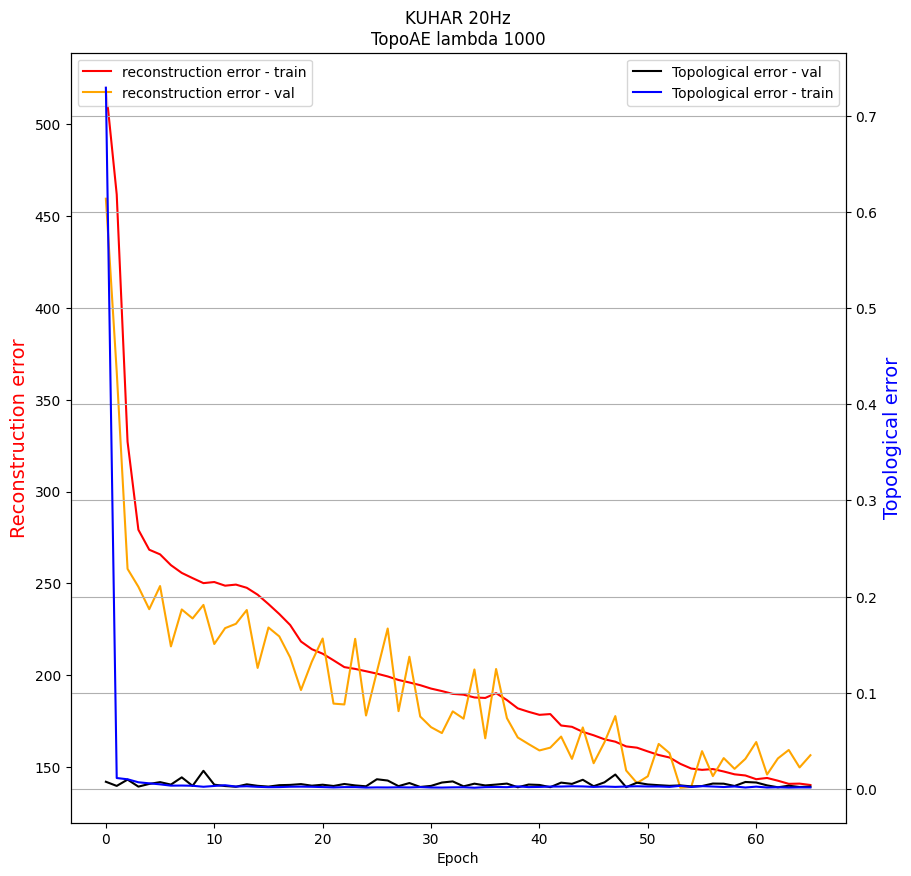

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:530.9316, Loss-ae:436.2887, Loss-topo:0.0946
Epoch:2, P:10, Loss:352.1830, Loss-ae:348.9123, Loss-topo:0.0033
Epoch:3, P:10, Loss:317.4591, Loss-ae:295.0494, Loss-topo:0.0224
Epoch:4, P:10, Loss:263.6094, Loss-ae:257.3060, Loss-topo:0.0063
Epoch:5, P:10, Loss:253.0681, Loss-ae:250.8615, Loss-topo:0.0022
Epoch:6, P:10, Loss:304.5913, Loss-ae:295.0685, Loss-topo:0.0095
Epoch:7, P:9, Loss:248.4585, Loss-ae:245.3486, Loss-topo:0.0031
Epoch:8, P:10, Loss:266.4535, Loss-ae:259.4349, Loss-topo:0.0070
Epoch:9, P:9, Loss:239.3469, Loss-ae:233.9548, Loss-topo:0.0054
Epoch:10, P:10, Loss:239.7506, Loss-ae:236.8769, Loss-topo:0.0029
Epoch:11, P:9, Loss:232.5600, Loss-ae:230.7874, Loss-topo:0.0018
Epoch:12, P:10, Loss:291.8553, Loss-ae:266.1217, Loss-topo:0.0257
Epoch:13, P:9, Loss:241.2165, Loss-ae:235.2562, Loss-topo:0.0060
Epoch:14, P:8, Loss:235.

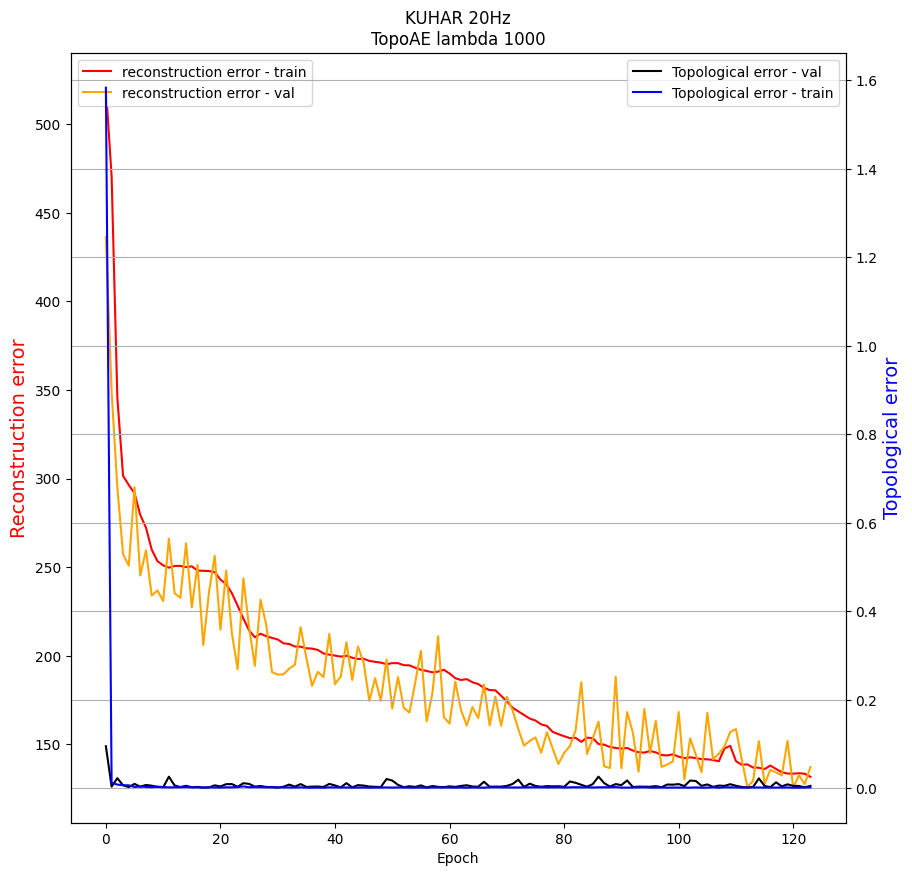

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 50
Epoch:1, P:10, Loss:464.1677, Loss-ae:452.1366, Loss-topo:0.0120
Epoch:2, P:10, Loss:388.2622, Loss-ae:381.8469, Loss-topo:0.0064
Epoch:3, P:10, Loss:312.9385, Loss-ae:302.9829, Loss-topo:0.0100
Epoch:4, P:10, Loss:265.2174, Loss-ae:259.5080, Loss-topo:0.0057
Epoch:5, P:10, Loss:277.2758, Loss-ae:268.1421, Loss-topo:0.0091
Epoch:6, P:9, Loss:281.0937, Loss-ae:260.7357, Loss-topo:0.0204
Epoch:7, P:8, Loss:305.6249, Loss-ae:280.0865, Loss-topo:0.0255
Epoch:8, P:7, Loss:231.5581, Loss-ae:223.7478, Loss-topo:0.0078
Epoch:9, P:10, Loss:231.5131, Loss-ae:226.6458, Loss-topo:0.0049
Epoch:10, P:10, Loss:233.2079, Loss-ae:227.6382, Loss-topo:0.0056
Epoch:11, P:9, Loss:271.1442, Loss-ae:242.0297, Loss-topo:0.0291
Epoch:12, P:8, Loss:221.4213, Loss-ae:207.2749, Loss-topo:0.0141
Epoch:13, P:10, Loss:272.3285, Loss-ae:266.6206, Loss-topo:0.0057
Epoch:14, P:9, Loss:217.0

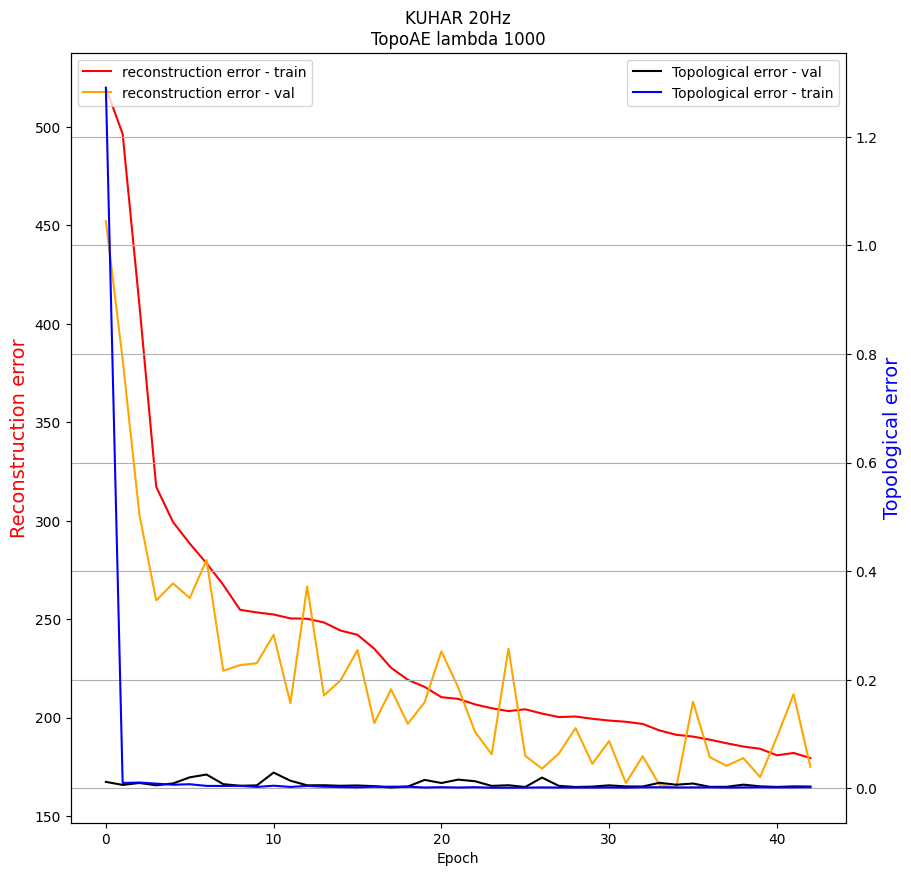

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:448.5017, Loss-ae:432.3447, Loss-topo:0.0162
Epoch:2, P:10, Loss:437.6564, Loss-ae:423.5539, Loss-topo:0.0141
Epoch:3, P:10, Loss:424.0840, Loss-ae:417.2671, Loss-topo:0.0068
Epoch:4, P:10, Loss:355.2079, Loss-ae:350.8995, Loss-topo:0.0043
Epoch:5, P:10, Loss:409.0520, Loss-ae:375.7316, Loss-topo:0.0333
Epoch:6, P:9, Loss:301.9963, Loss-ae:269.1272, Loss-topo:0.0329
Epoch:7, P:10, Loss:250.3557, Loss-ae:243.4160, Loss-topo:0.0069
Epoch:8, P:10, Loss:234.4359, Loss-ae:223.0136, Loss-topo:0.0114
Epoch:9, P:10, Loss:254.2653, Loss-ae:245.3378, Loss-topo:0.0089
Epoch:10, P:9, Loss:289.8237, Loss-ae:236.5317, Loss-topo:0.0533
Epoch:11, P:8, Loss:257.1717, Loss-ae:241.5583, Loss-topo:0.0156
Epoch:12, P:7, Loss:277.9899, Loss-ae:255.0982, Loss-topo:0.0229
Epoch:13, P:6, Loss:242.4357, Loss-ae:234.2359, Loss-topo:0.0082
Epoch:14, P:5, Loss:286.

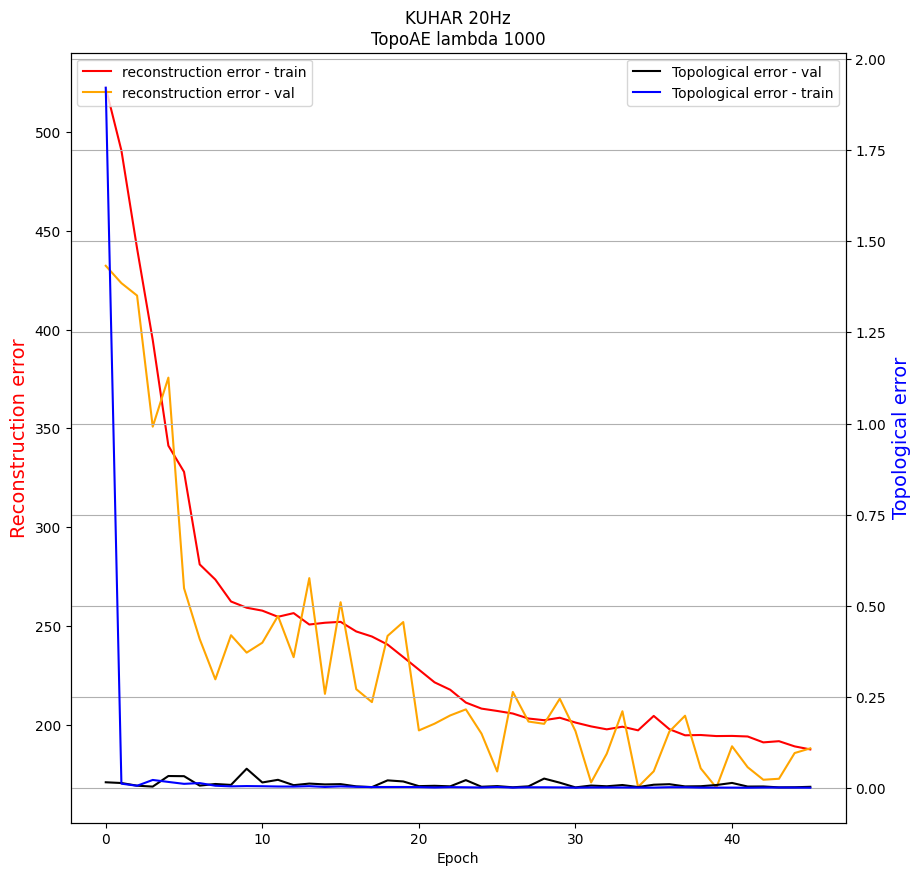

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:433.7085, Loss-ae:414.7825, Loss-topo:0.0189
Epoch:2, P:10, Loss:373.2719, Loss-ae:354.1354, Loss-topo:0.0191
Epoch:3, P:10, Loss:276.4217, Loss-ae:254.6637, Loss-topo:0.0218
Epoch:4, P:10, Loss:329.1447, Loss-ae:295.6262, Loss-topo:0.0335
Epoch:5, P:9, Loss:390.3281, Loss-ae:275.1350, Loss-topo:0.1152
Epoch:6, P:8, Loss:247.4463, Loss-ae:241.9337, Loss-topo:0.0055
Epoch:7, P:10, Loss:250.3883, Loss-ae:237.9420, Loss-topo:0.0124
Epoch:8, P:9, Loss:245.9306, Loss-ae:239.4839, Loss-topo:0.0064
Epoch:9, P:10, Loss:255.9429, Loss-ae:236.6760, Loss-topo:0.0193
Epoch:10, P:9, Loss:263.0367, Loss-ae:253.5406, Loss-topo:0.0095
Epoch:11, P:8, Loss:253.9152, Loss-ae:248.5456, Loss-topo:0.0054
Epoch:12, P:7, Loss:266.7499, Loss-ae:256.0891, Loss-topo:0.0107
Epoch:13, P:6, Loss:295.6172, Loss-ae:237.7998, Loss-topo:0.0578
Epoch:14, P:5, Loss:322.75

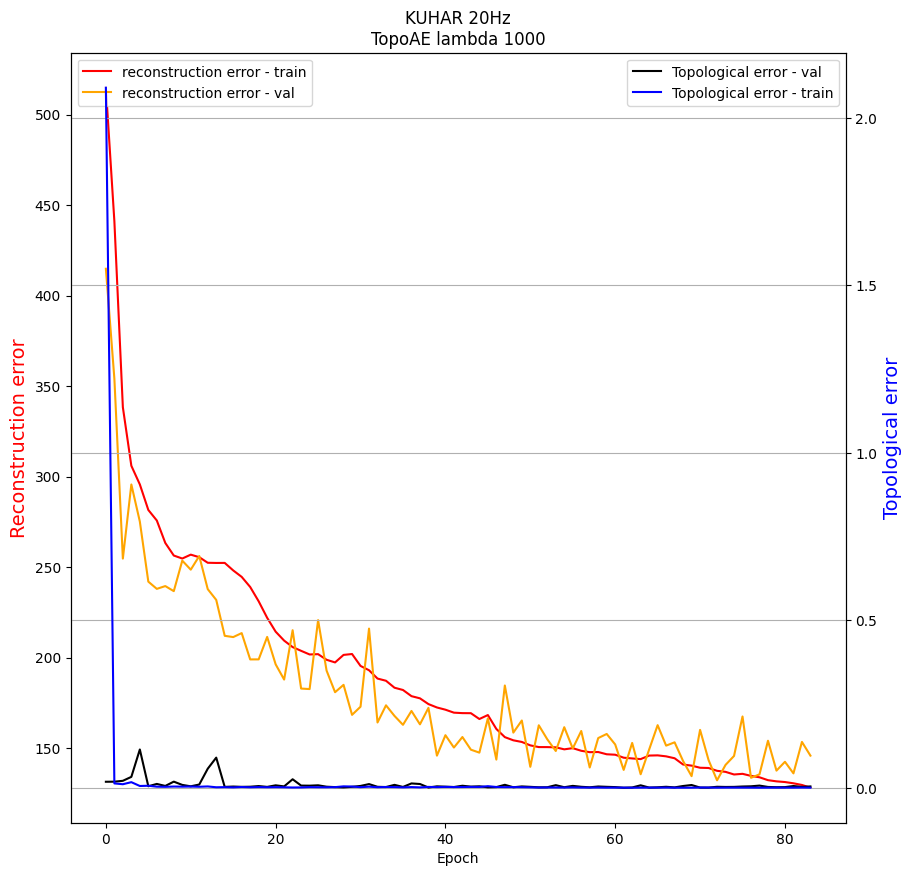

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:457.3902, Loss-ae:444.3284, Loss-topo:0.0131
Epoch:2, P:10, Loss:407.6589, Loss-ae:402.0641, Loss-topo:0.0056
Epoch:3, P:10, Loss:337.7106, Loss-ae:313.0479, Loss-topo:0.0247
Epoch:4, P:10, Loss:379.6106, Loss-ae:354.8779, Loss-topo:0.0247
Epoch:5, P:9, Loss:337.7389, Loss-ae:305.1781, Loss-topo:0.0326
Epoch:6, P:8, Loss:364.4661, Loss-ae:346.9121, Loss-topo:0.0176
Epoch:7, P:7, Loss:300.3065, Loss-ae:294.4161, Loss-topo:0.0059
Epoch:8, P:10, Loss:296.9548, Loss-ae:279.0920, Loss-topo:0.0179
Epoch:9, P:10, Loss:233.6254, Loss-ae:227.1637, Loss-topo:0.0065
Epoch:10, P:10, Loss:218.2081, Loss-ae:213.8859, Loss-topo:0.0043
Epoch:11, P:10, Loss:291.2265, Loss-ae:240.2765, Loss-topo:0.0509
Epoch:12, P:9, Loss:276.4202, Loss-ae:217.5634, Loss-topo:0.0589
Epoch:13, P:8, Loss:249.8283, Loss-ae:240.3849, Loss-topo:0.0094
Epoch:14, P:7, Loss:216.

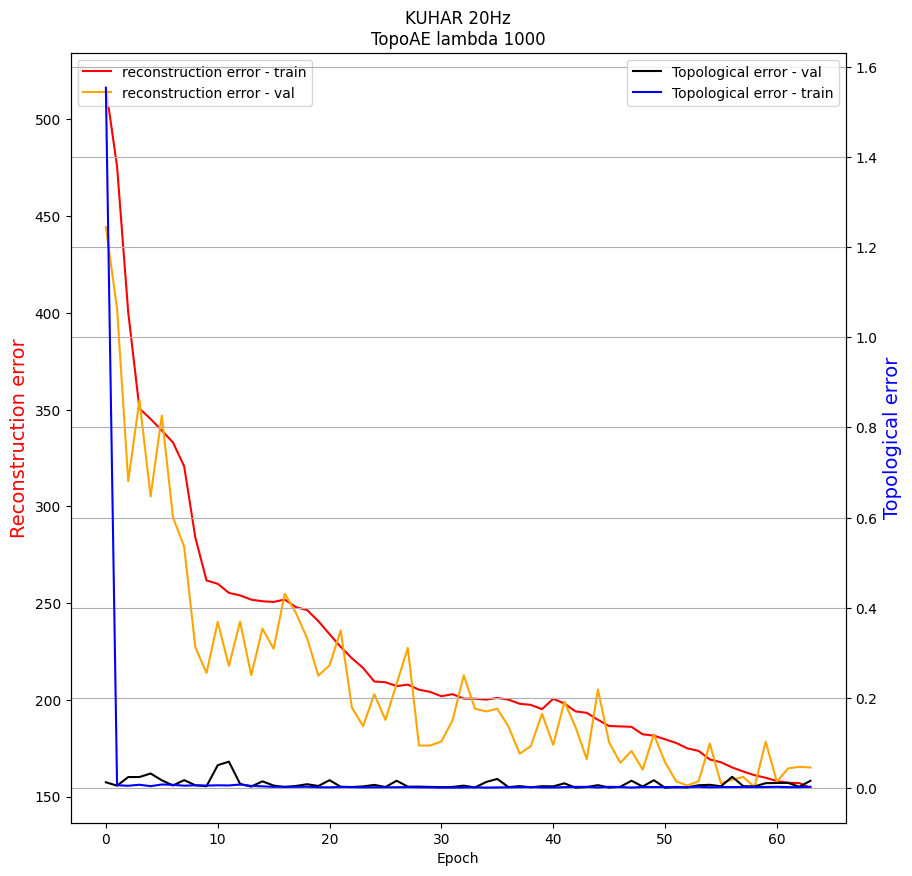

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:505.6454, Loss-ae:476.1062, Loss-topo:0.0295
Epoch:2, P:10, Loss:367.1640, Loss-ae:361.8683, Loss-topo:0.0053
Epoch:3, P:10, Loss:285.2456, Loss-ae:267.0702, Loss-topo:0.0182
Epoch:4, P:10, Loss:259.4687, Loss-ae:232.1625, Loss-topo:0.0273
Epoch:5, P:10, Loss:316.7826, Loss-ae:248.0675, Loss-topo:0.0687
Epoch:6, P:9, Loss:310.9564, Loss-ae:258.4104, Loss-topo:0.0525
Epoch:7, P:8, Loss:324.7339, Loss-ae:300.7307, Loss-topo:0.0240
Epoch:8, P:7, Loss:243.0766, Loss-ae:236.6534, Loss-topo:0.0064
Epoch:9, P:10, Loss:246.8717, Loss-ae:238.1879, Loss-topo:0.0087
Epoch:10, P:9, Loss:271.4912, Loss-ae:244.9974, Loss-topo:0.0265
Epoch:11, P:8, Loss:223.7230, Loss-ae:219.2240, Loss-topo:0.0045
Epoch:12, P:10, Loss:262.9877, Loss-ae:245.3315, Loss-topo:0.0177
Epoch:13, P:9, Loss:315.6665, Loss-ae:245.3714, Loss-topo:0.0703
Epoch:14, P:8, Loss:303.4

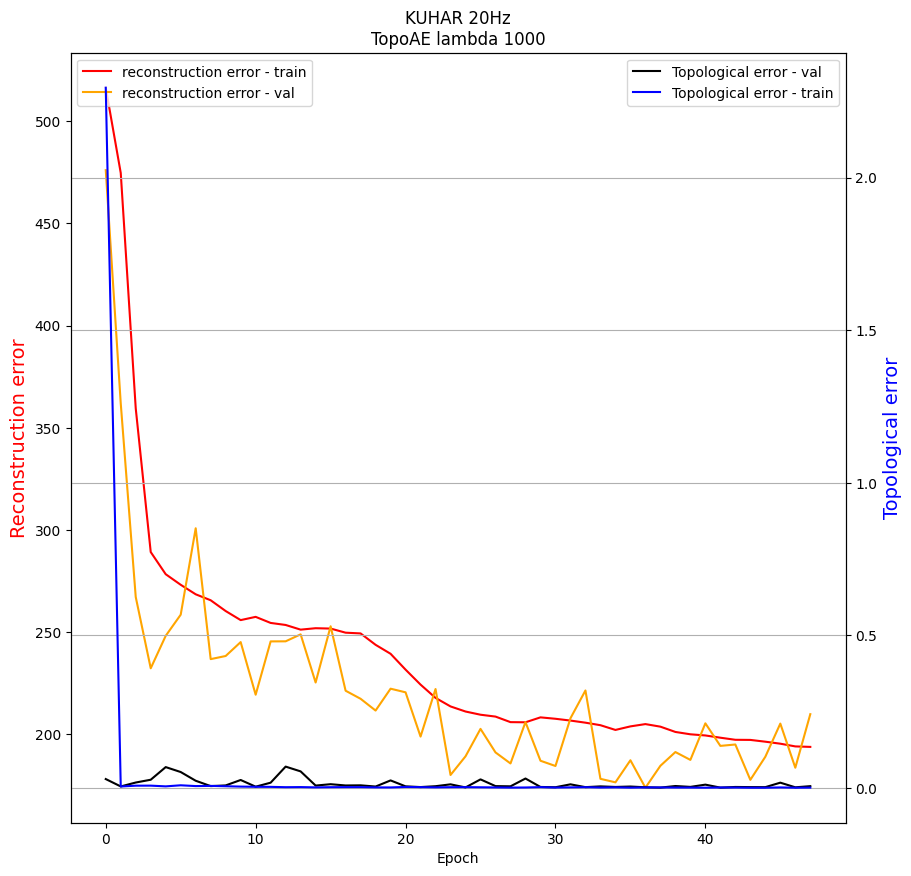

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:471.4411, Loss-ae:465.8716, Loss-topo:0.0056
Epoch:2, P:10, Loss:366.1634, Loss-ae:361.5440, Loss-topo:0.0046
Epoch:3, P:10, Loss:335.6615, Loss-ae:310.5886, Loss-topo:0.0251
Epoch:4, P:10, Loss:245.0024, Loss-ae:241.1179, Loss-topo:0.0039
Epoch:5, P:10, Loss:287.0917, Loss-ae:268.9124, Loss-topo:0.0182
Epoch:6, P:9, Loss:275.8528, Loss-ae:252.3783, Loss-topo:0.0235
Epoch:7, P:8, Loss:243.8949, Loss-ae:229.6485, Loss-topo:0.0142
Epoch:8, P:10, Loss:299.5598, Loss-ae:234.5641, Loss-topo:0.0650
Epoch:9, P:9, Loss:312.1156, Loss-ae:286.0662, Loss-topo:0.0260
Epoch:10, P:8, Loss:258.8720, Loss-ae:242.1990, Loss-topo:0.0167
Epoch:11, P:7, Loss:263.9071, Loss-ae:223.7475, Loss-topo:0.0402
Epoch:12, P:6, Loss:263.5006, Loss-ae:250.1354, Loss-topo:0.0134
Epoch:13, P:5, Loss:233.4235, Loss-ae:216.6946, Loss-topo:0.0167
Epoch:14, P:10, Loss:214.8

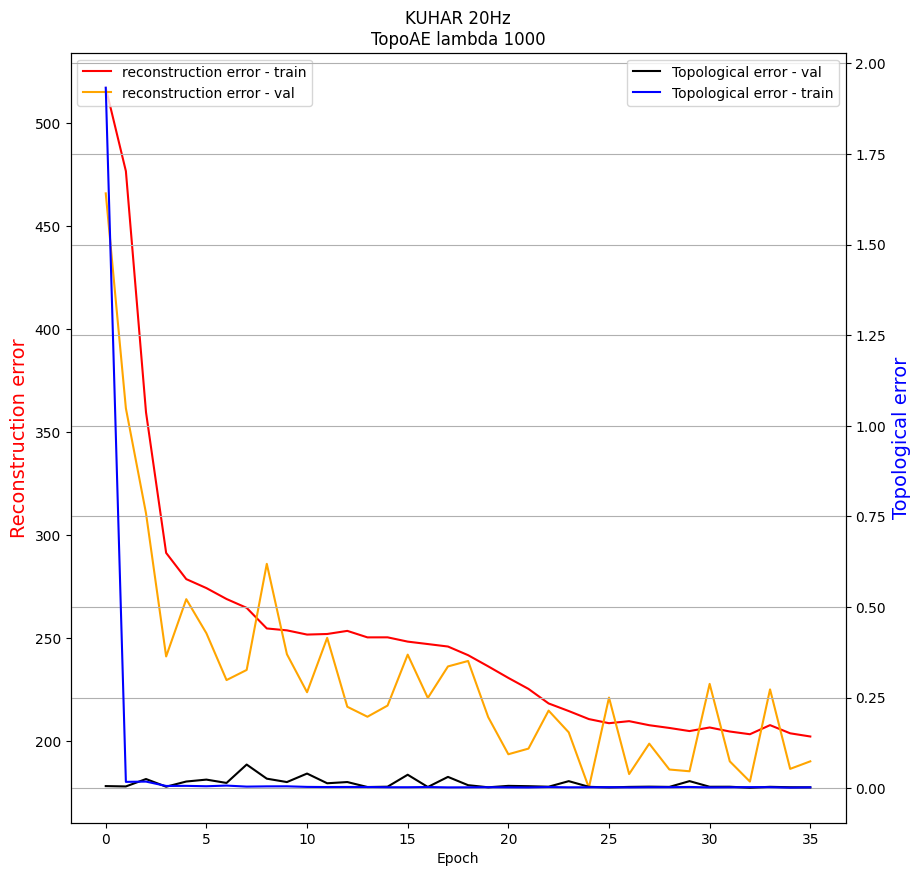

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:496.5397, Loss-ae:476.9292, Loss-topo:0.0196
Epoch:2, P:10, Loss:462.4924, Loss-ae:443.7754, Loss-topo:0.0187
Epoch:3, P:10, Loss:384.9442, Loss-ae:373.4509, Loss-topo:0.0115
Epoch:4, P:10, Loss:393.8709, Loss-ae:381.3968, Loss-topo:0.0125
Epoch:5, P:9, Loss:294.8879, Loss-ae:273.0556, Loss-topo:0.0218
Epoch:6, P:10, Loss:286.1951, Loss-ae:273.2265, Loss-topo:0.0130
Epoch:7, P:10, Loss:346.9740, Loss-ae:310.8190, Loss-topo:0.0362
Epoch:8, P:9, Loss:276.9362, Loss-ae:254.8259, Loss-topo:0.0221
Epoch:9, P:10, Loss:231.6923, Loss-ae:225.3237, Loss-topo:0.0064
Epoch:10, P:10, Loss:271.0602, Loss-ae:245.5470, Loss-topo:0.0255
Epoch:11, P:9, Loss:282.0875, Loss-ae:266.5375, Loss-topo:0.0155
Epoch:12, P:8, Loss:222.8424, Loss-ae:219.2365, Loss-topo:0.0036
Epoch:13, P:10, Loss:225.6920, Loss-ae:217.4204, Loss-topo:0.0083
Epoch:14, P:9, Loss:224

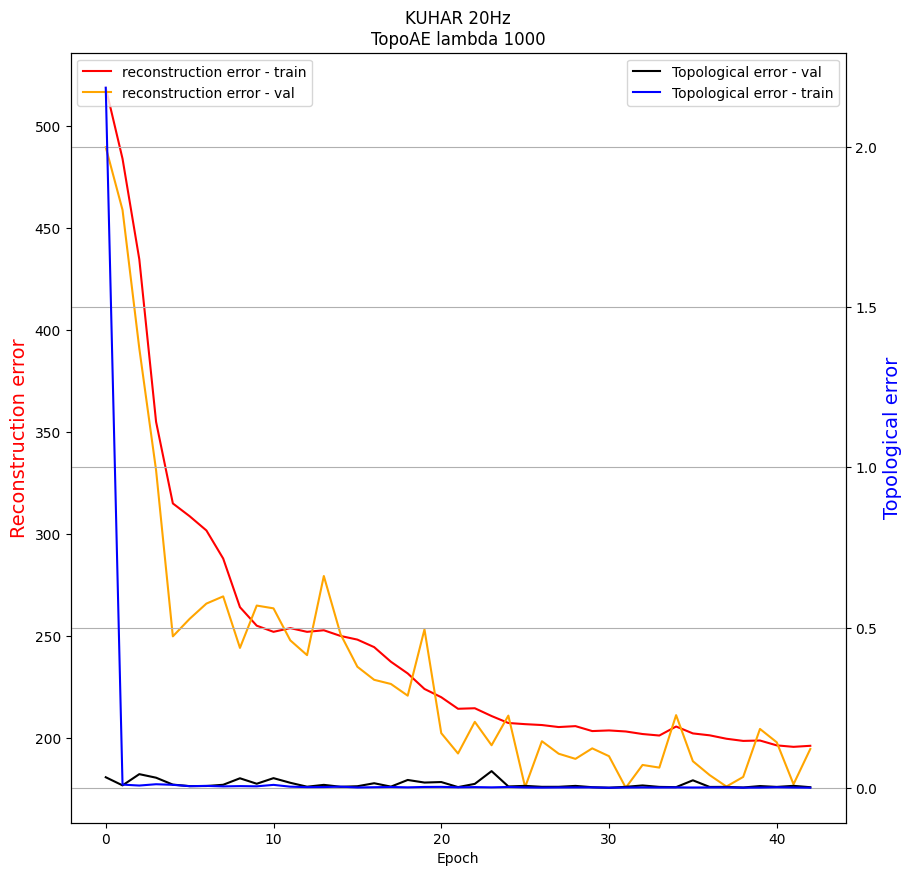

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:537.6539, Loss-ae:463.3627, Loss-topo:0.0743
Epoch:2, P:10, Loss:385.1409, Loss-ae:375.6340, Loss-topo:0.0095
Epoch:3, P:10, Loss:309.0473, Loss-ae:283.0449, Loss-topo:0.0260
Epoch:4, P:10, Loss:251.9299, Loss-ae:242.0241, Loss-topo:0.0099
Epoch:5, P:10, Loss:256.5432, Loss-ae:250.9875, Loss-topo:0.0056
Epoch:6, P:9, Loss:243.0507, Loss-ae:230.3732, Loss-topo:0.0127
Epoch:7, P:10, Loss:260.4096, Loss-ae:255.6472, Loss-topo:0.0048
Epoch:8, P:9, Loss:236.5599, Loss-ae:233.9555, Loss-topo:0.0026
Epoch:9, P:10, Loss:216.0605, Loss-ae:210.7550, Loss-topo:0.0053
Epoch:10, P:10, Loss:239.0982, Loss-ae:231.6640, Loss-topo:0.0074
Epoch:11, P:9, Loss:221.9055, Loss-ae:219.0661, Loss-topo:0.0028
Epoch:12, P:8, Loss:232.8781, Loss-ae:228.7238, Loss-topo:0.0042
Epoch:13, P:7, Loss:286.3571, Loss-ae:270.1977, Loss-topo:0.0162
Epoch:14, P:6, Loss:216.

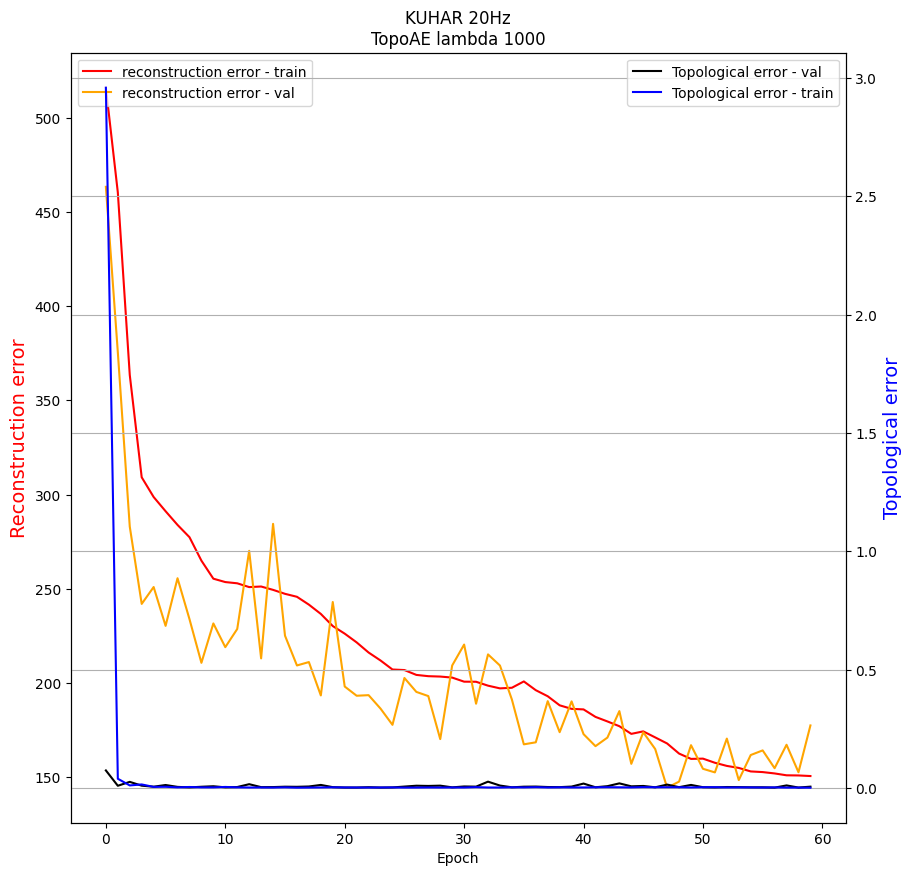

Topologically Regularized DeepAEforKuhar180ver2
Using python to compute signatures
DeepAEforKuhar180ver2, Input: 180 Inner dim: 100
Epoch:1, P:10, Loss:508.2747, Loss-ae:480.0783, Loss-topo:0.0282
Epoch:2, P:10, Loss:426.5913, Loss-ae:423.7356, Loss-topo:0.0029
Epoch:3, P:10, Loss:295.3093, Loss-ae:285.5700, Loss-topo:0.0097
Epoch:4, P:10, Loss:239.5413, Loss-ae:234.3530, Loss-topo:0.0052
Epoch:5, P:10, Loss:256.7458, Loss-ae:245.6791, Loss-topo:0.0111
Epoch:6, P:9, Loss:247.8364, Loss-ae:231.6128, Loss-topo:0.0162
Epoch:7, P:8, Loss:230.8577, Loss-ae:227.2696, Loss-topo:0.0036
Epoch:8, P:10, Loss:244.6241, Loss-ae:233.0852, Loss-topo:0.0115
Epoch:9, P:9, Loss:260.6569, Loss-ae:243.8659, Loss-topo:0.0168
Epoch:10, P:8, Loss:226.0905, Loss-ae:223.3910, Loss-topo:0.0027
Epoch:11, P:10, Loss:227.5306, Loss-ae:226.3852, Loss-topo:0.0011
Epoch:12, P:9, Loss:275.4228, Loss-ae:264.4915, Loss-topo:0.0109
Epoch:13, P:8, Loss:246.0713, Loss-ae:243.8134, Loss-topo:0.0023
Epoch:14, P:7, Loss:226.2

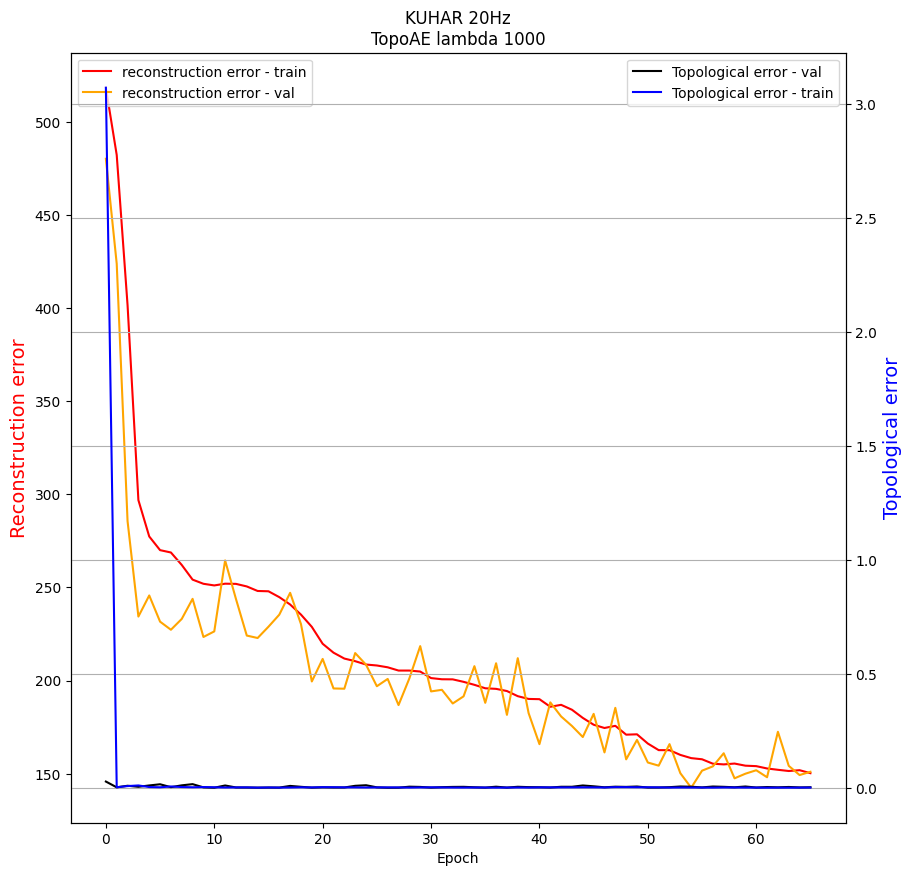

In [13]:
plot_object = {
    'RF-ACC': [],
    'RF-F1': [],
    'SVC-ACC': [],
    'SVC-F1': [],
    'KNN-ACC': [],
    'KNN-F1': [],
    'Trustworthiness': [],
    'Continuity': [],
    'Co-k-NNs': []   
}

for dimension in dimensions_to_explore:
    dimension_exploration = explore_dimension(
        train_HD, train_Y,
        test_HD, test_Y,
        dimension,
        times_to_execute=executions_per_model
    )
    # print(lambda_val, lambda_exploration)
    for obj_property in plot_object:
        plot_object[obj_property].append(dimension_exploration[obj_property])
    
# print(plot_object)

In [14]:
print(plot_object)

{'RF-ACC': [[0.5481481481481482, 0.4619047619047619, 0.5076719576719577, 0.4962962962962963, 0.5227513227513227, 0.5211640211640213, 0.46111111111111114, 0.5412698412698413, 0.44973544973544965, 0.48386243386243377], [0.5904761904761904, 0.5735449735449736, 0.6275132275132276, 0.5793650793650793, 0.5671957671957673, 0.5468253968253969, 0.623015873015873, 0.5910052910052911, 0.5211640211640212, 0.5457671957671958], [0.5087301587301587, 0.6478835978835978, 0.5129629629629628, 0.5526455026455026, 0.5674603174603174, 0.6148148148148148, 0.5539682539682541, 0.5986772486772487, 0.5314814814814814, 0.5589947089947092], [0.5634920634920635, 0.4780423280423281, 0.5164021164021164, 0.5312169312169313, 0.49338624338624343, 0.5761904761904763, 0.5666666666666667, 0.5912698412698413, 0.5809523809523809, 0.546031746031746], [0.5555555555555556, 0.5322751322751322, 0.517989417989418, 0.5645502645502646, 0.4698412698412698, 0.5690476190476191, 0.5126984126984127, 0.5677248677248677, 0.5296296296296296

In [15]:
assert 1 ==0 
plot_object_saved = {'RF-ACC': [(0.4306878306878307, 0.4735185185185185, 0.5404761904761906), (0.42777777777777776, 0.48283068783068783, 0.5354497354497355), (0.4354497354497354, 0.47603174603174603, 0.5044973544973546), (0.456084656084656, 0.48732804232804233, 0.5201058201058202), (0.40317460317460324, 0.4545767195767196, 0.5201058201058201), (0.40423280423280417, 0.43277777777777776, 0.5034391534391535)], 'RF-F1': [(0.43376415359244547, 0.4807483041024688, 0.5512075818472036), (0.4455190673351823, 0.49248504986374575, 0.5426349494578925), (0.4425252510146823, 0.4853125337615135, 0.5168073355093602), (0.46008895262409943, 0.4966477122471704, 0.5263263333810158), (0.4104215080131584, 0.4661805714780023, 0.5286584641917266), (0.41795378203052047, 0.44328729457454263, 0.5200551415929209)], 'SVC-ACC': [(0.3994708994708995, 0.4391534391534392, 0.5132275132275133), (0.3968253968253968, 0.4478835978835978, 0.5079365079365079), (0.4074074074074074, 0.4743386243386244, 0.5158730158730159), (0.4417989417989418, 0.4835978835978835, 0.5238095238095238), (0.37037037037037035, 0.46005291005291005, 0.5343915343915344), (0.373015873015873, 0.42354497354497356, 0.5211640211640212)], 'SVC-F1': [(0.4583998199190939, 0.48719316628917914, 0.5475990792040243), (0.44052313304995316, 0.4920103494539173, 0.5559996353687003), (0.4304518780984424, 0.5068989421902362, 0.5546738896772), (0.47266602774736116, 0.5127297328794109, 0.5416450610683861), (0.38422405109018276, 0.48996397241398426, 0.5601521121003017), (0.40397265929863047, 0.46464828279069315, 0.5504135859733523)], 'KNN-ACC': [(0.41534391534391535, 0.4523809523809524, 0.5026455026455027), (0.41798941798941797, 0.4568783068783069, 0.4947089947089947), (0.41534391534391535, 0.45634920634920634, 0.5052910052910053), (0.43915343915343913, 0.4560846560846561, 0.47354497354497355), (0.3783068783068783, 0.43386243386243384, 0.5026455026455027), (0.36772486772486773, 0.4060846560846561, 0.5)], 'KNN-F1': [(0.4183306134648575, 0.4590953119456989, 0.5101487276672801), (0.4370093422227406, 0.4656260523252338, 0.49744033164748885), (0.4299151712760825, 0.4622207640776814, 0.5122463600677284), (0.4460383359616493, 0.46086870006750685, 0.47311186088434587), (0.3817773786887912, 0.44058394466971623, 0.5045547335357312), (0.3794179610983289, 0.4137040104773321, 0.5041038017875252)], 'Trustworthiness': [(0.8523249961424573, 0.8874896213729914, 0.8978283871062551), (0.8589186389119525, 0.8871935090413455, 0.910846675532892), (0.8590242621071735, 0.8804995242363903, 0.9038094153434683), (0.8636872965605413, 0.8812976222841062, 0.902462489988758), (0.8440909792280505, 0.8738694644261079, 0.8895231893428951), (0.8478144264752345, 0.8706189335547441, 0.8905486527991066)], 'Continuity': [(0.9420271019934312, 0.957197945215545, 0.9627926221738907), (0.9440500157975562, 0.9544685500047759, 0.9638460987383998), (0.9354637684886515, 0.9470902646641732, 0.9618874773139746), (0.9315704056665467, 0.9422969003725286, 0.9561773955340677), (0.9298680352983534, 0.9416055735982424, 0.9541503486483904), (0.9314854478790863, 0.9405935196955113, 0.9494193479650543)], 'Co-k-NNs': [(0.3541114058355438, 0.42136936339522546, 0.4452917771883289), (0.3677055702917772, 0.4126657824933687, 0.4708222811671088), (0.35858753315649866, 0.3934018567639257, 0.4353448275862069), (0.3531167108753316, 0.38804708222811674, 0.425895225464191), (0.32161803713527853, 0.3817473474801061, 0.430868700265252), (0.319131299734748, 0.3693302387267904, 0.4046750663129973)]}
plot_object_saved

AssertionError: 

## Plot ALL means

In [ ]:
data_x = range(len(lambdas_to_explore))
plt.xticks(data_x, [str(val) for val in lambdas_to_explore])
for obj_property in plot_object:
    data_y = [val[1] for val in plot_object[obj_property]]
    plt.plot(data_x, data_y, label=obj_property)

ax = plt.subplot(111)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.title('Metrics values over lambdas\nKuHar20Hz TopoAE-2dim')
plt.xlabel('Lambda value')
plt.ylabel('Metric value')
plt.grid()
plt.ylim((0, 1))
plt.show()

## Plot Metrics

In [ ]:
def plot_properties(plot_object, lambdas_to_explore, properties_to_plot):
    fig, ax = plt.subplots()
    data_x = range(len(lambdas_to_explore))
    plt.xticks(data_x, [str(val) for val in lambdas_to_explore])
    for obj_property in properties_to_plot:
        mean_y = [val[1] for val in plot_object[obj_property]]
        min_y = [val[0] for val in plot_object[obj_property]]
        max_y = [val[2] for val in plot_object[obj_property]]
        ax.plot(data_x, mean_y, label=obj_property)
        ax.fill_between(data_x, min_y, max_y, alpha=0.2)

    ax = plt.subplot(111)
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    plt.title('Metrics values over lambdas\nKuHar20Hz TopoAE-2dim')
    plt.xlabel('Lambda value')
    plt.ylabel('Metric value')
    plt.grid()
    plt.ylim((0, 1))
    plt.show()

In [ ]:
properties_to_plot = [
    'RF-ACC', 'RF-F1',
    'SVC-ACC', 'SVC-F1',
    'KNN-ACC', 'KNN-F1',
    'Trustworthiness',
    'Continuity',
    'Co-k-NNs'
]
plot_properties(plot_object, lambdas_to_explore, properties_to_plot)

In [ ]:
properties_to_plot = [
    'RF-ACC',
    'SVC-ACC',
    'KNN-ACC'
]
plot_properties(plot_object, lambdas_to_explore, properties_to_plot)
properties_to_plot = [
    'Trustworthiness',
    'Continuity',
    'Co-k-NNs'
]
plot_properties(plot_object, lambdas_to_explore, properties_to_plot)

In [ ]:
assert 1 ==0
asda = {'asd': [2, 3], 'asdasd': [3,4,5]}
for i in asda:
    asda[i] = np.mean(asda[i])
print(asda)

In [ ]:
from librep.transforms.topo_ae import TopologicalDimensionalityReduction
from librep.estimators.ae.torch.models.topological_ae.topological_ae import TopologicallyRegularizedAutoencoder
kwargs = {'input_dims':180, 'custom_dim':2}
input_shape = (-1, 1, 180)
topoae_lambda = 10000
topo_reducer = TopologicalDimensionalityReduction(ae_model='DeepAEforKuhar180ver2', lam=topoae_lambda,
                                                      ae_kwargs=kwargs, input_shape=input_shape, patience=10)

In [ ]:
title_plot = "KUHAR 20Hz\nTopoAE lambda " + str(topoae_lambda)
topo_reducer.fit(train_HD, train_Y, title_plot=title_plot)

In [ ]:
train_LD = np.reshape(topo_reducer.transform(train_HD), (-1,2))
print('TRAIN LD RESHAPED', train_LD.shape)
test_LD = np.reshape(topo_reducer.transform(test_HD), (-1,2))
print('TEST LD RESHAPED', test_LD.shape)

## Obtain classification metrics (RF, SVC, KNN)

In [ ]:
experiments_result = run_experiments(train_HD, train_LD, train_Y, test_HD, test_LD, test_Y)
experiments_result

In [ ]:
table_info['Topo-AEv2 (L=10000)'][0] = experiments_result['RF-ACC']
table_info['Topo-AEv2 (L=10000)'][1] = experiments_result['RF-F1']
table_info['Topo-AEv2 (L=10000)'][2] = experiments_result['SVC-ACC']
table_info['Topo-AEv2 (L=10000)'][3] = experiments_result['SVC-F1']
table_info['Topo-AEv2 (L=10000)'][4] = experiments_result['KNN-ACC']
table_info['Topo-AEv2 (L=10000)'][5] = experiments_result['KNN-F1']

print_table(table_info)

## Obtain quality metrics

In [ ]:
metrics_reporter = DimensionalityReductionQualityReport()
metrics_report = metrics_reporter.evaluate([test_HD, test_LD])

In [ ]:
metrics_report

In [ ]:
table_info['Topo-AEv2 (L=10000)'][6] = metrics_report['trustworthiness']
table_info['Topo-AEv2 (L=10000)'][7] = metrics_report['continuity']
table_info['Topo-AEv2 (L=10000)'][8] = metrics_report['co k nearest neighbor size']
print_table(table_info)

## Visualization

In [ ]:
filter_to_use = [0,1,2,3,4,5]
visualize(test_LD, test_Y)
# visualize(test_LD, test_Y, filtered=filter_to_use, xlim=(-1,0), ylim=(-0.5,1.75))
visualize(test_LD, test_Y, filtered=filter_to_use)
# for f in filter_to_use:
    # visualize(test_LD, test_Y, filtered=[f], xlim=(-1,0), ylim=(-0.5,1.75))
    # visualize(test_LD, test_Y, filtered=[f])
# 0 sit
# 1 stand
# 2 walk
# 3 stair up
# 4 stair down
# 5 run

# **SECTION:** UMAP

In [ ]:
umap_reducer = UMAP()
umap_reducer.fit(train_HD, train_Y)

In [ ]:
train_LD = np.reshape(umap_reducer.transform(train_HD), (-1,2))
print('TRAIN LD RESHAPED', train_LD.shape)
test_LD = np.reshape(umap_reducer.transform(test_HD), (-1,2))
print('TEST LD RESHAPED', test_LD.shape)

## Obtain classification metrics (RF, SVC, KNN)

In [ ]:
experiments_result = run_experiments(train_HD, train_LD, train_Y, test_HD, test_LD, test_Y)
experiments_result

In [ ]:
table_info['UMAP'][0] = experiments_result['RF-ACC']
table_info['UMAP'][1] = experiments_result['RF-F1']
table_info['UMAP'][2] = experiments_result['SVC-ACC']
table_info['UMAP'][3] = experiments_result['SVC-F1']
table_info['UMAP'][4] = experiments_result['KNN-ACC']
table_info['UMAP'][5] = experiments_result['KNN-F1']

print_table(table_info)

## Obtain quality metrics

In [ ]:
metrics_reporter = DimensionalityReductionQualityReport()
metrics_report = metrics_reporter.evaluate([test_HD, test_LD])

In [ ]:
metrics_report

In [ ]:
table_info['UMAP'][6] = metrics_report['trustworthiness']
table_info['UMAP'][7] = metrics_report['continuity']
table_info['UMAP'][8] = metrics_report['co k nearest neighbor size']
print_table(table_info)

## Visualization

In [ ]:
filter_to_use = [0,1,2,3,4,5]
visualize(test_LD, test_Y)
# visualize(test_LD, test_Y, filtered=filter_to_use, xlim=(-1,0), ylim=(-0.5,1.75))
visualize(test_LD, test_Y, filtered=filter_to_use)
# for f in filter_to_use:
    # visualize(test_LD, test_Y, filtered=[f], xlim=(-1,0), ylim=(-0.5,1.75))
    # visualize(test_LD, test_Y, filtered=[f])
# 0 sit
# 1 stand
# 2 walk
# 3 stair up
# 4 stair down
# 5 run

# **SECTION:** Metrics AE (metric=coknns, lambda=1000)

In [ ]:
from librep.transforms.adapted_ae import AdaptedAEDimensionalityReduction
from librep.estimators.ae.torch.models.topological_ae.topological_ae import MetricsRegularizedAutoencoder
kwargs = {'input_dims':180, 'custom_dim':2}
input_shape = (-1, 1, 180)
mae_lambda = 1000
mae_reducer = AdaptedAEDimensionalityReduction(
    ae_model='DeepAEforKuhar180ver2',
    lam=mae_lambda,
    metric='coknns',
    ae_kwargs=kwargs,
    input_shape=input_shape,
    patience=10
)

In [ ]:
title_plot = "KUHAR 20Hz\nAdaptedAE lambda " + str(mae_lambda)
mae_reducer.fit(train_HD, train_Y, title_plot=title_plot)

In [ ]:
train_LD = np.reshape(mae_reducer.transform(train_HD), (-1,2))
print('TRAIN LD RESHAPED', train_LD.shape)
test_LD = np.reshape(mae_reducer.transform(test_HD), (-1,2))
print('TEST LD RESHAPED', test_LD.shape)

## Obtain classification metrics (RF, SVC, KNN)

In [ ]:
experiments_result = run_experiments(train_HD, train_LD, train_Y, test_HD, test_LD, test_Y)
experiments_result

In [ ]:
table_info['M-AE (L=1000)'][0] = experiments_result['RF-ACC']
table_info['M-AE (L=1000)'][1] = experiments_result['RF-F1']
table_info['M-AE (L=1000)'][2] = experiments_result['SVC-ACC']
table_info['M-AE (L=1000)'][3] = experiments_result['SVC-F1']
table_info['M-AE (L=1000)'][4] = experiments_result['KNN-ACC']
table_info['M-AE (L=1000)'][5] = experiments_result['KNN-F1']

print_table(table_info)

## Obtain quality metrics

In [ ]:
metrics_reporter = DimensionalityReductionQualityReport()
metrics_report = metrics_reporter.evaluate([test_HD, test_LD])

In [ ]:
metrics_report

In [ ]:
table_info['M-AE (L=1000)'][6] = metrics_report['trustworthiness']
table_info['M-AE (L=1000)'][7] = metrics_report['continuity']
table_info['M-AE (L=1000)'][8] = metrics_report['co k nearest neighbor size']
print_table(table_info)

## Visualization

In [ ]:
filter_to_use = [0,1,2,3,4,5]
visualize(test_LD, test_Y)
# visualize(test_LD, test_Y, filtered=filter_to_use, xlim=(-1,0), ylim=(-0.5,1.75))
visualize(test_LD, test_Y, filtered=filter_to_use)
# for f in filter_to_use:
    # visualize(test_LD, test_Y, filtered=[f], xlim=(-1,0), ylim=(-0.5,1.75))
    # visualize(test_LD, test_Y, filtered=[f])
# 0 sit
# 1 stand
# 2 walk
# 3 stair up
# 4 stair down
# 5 run

# **SECTION:** Metrics AE (metric=coknns, lambda=10000)

In [ ]:
from librep.transforms.adapted_ae import AdaptedAEDimensionalityReduction
from librep.estimators.ae.torch.models.topological_ae.topological_ae import MetricsRegularizedAutoencoder
kwargs = {'input_dims':180, 'custom_dim':2}
input_shape = (-1, 1, 180)
mae_lambda = 10000
mae_reducer = AdaptedAEDimensionalityReduction(
    ae_model='DeepAEforKuhar180ver2',
    lam=mae_lambda,
    metric='coknns',
    ae_kwargs=kwargs,
    input_shape=input_shape,
    patience=10
)

In [ ]:
title_plot = "KUHAR 20Hz\nAdaptedAE lambda " + str(mae_lambda)
mae_reducer.fit(train_HD, train_Y, title_plot=title_plot)

In [ ]:
train_LD = np.reshape(mae_reducer.transform(train_HD), (-1,2))
print('TRAIN LD RESHAPED', train_LD.shape)
test_LD = np.reshape(mae_reducer.transform(test_HD), (-1,2))
print('TEST LD RESHAPED', test_LD.shape)

## Obtain classification metrics (RF, SVC, KNN)

In [ ]:
experiments_result = run_experiments(train_HD, train_LD, train_Y, test_HD, test_LD, test_Y)
experiments_result

In [ ]:
table_info['M-AE (L=10000)'][0] = experiments_result['RF-ACC']
table_info['M-AE (L=10000)'][1] = experiments_result['RF-F1']
table_info['M-AE (L=10000)'][2] = experiments_result['SVC-ACC']
table_info['M-AE (L=10000)'][3] = experiments_result['SVC-F1']
table_info['M-AE (L=10000)'][4] = experiments_result['KNN-ACC']
table_info['M-AE (L=10000)'][5] = experiments_result['KNN-F1']

print_table(table_info)

## Obtain quality metrics

In [ ]:
metrics_reporter = DimensionalityReductionQualityReport()
metrics_report = metrics_reporter.evaluate([test_HD, test_LD])

In [ ]:
metrics_report

In [ ]:
table_info['M-AE (L=10000)'][6] = metrics_report['trustworthiness']
table_info['M-AE (L=10000)'][7] = metrics_report['continuity']
table_info['M-AE (L=10000)'][8] = metrics_report['co k nearest neighbor size']
print_table(table_info)

## Visualization

In [ ]:
filter_to_use = [0,1,2,3,4,5]
visualize(test_LD, test_Y)
# visualize(test_LD, test_Y, filtered=filter_to_use, xlim=(-1,0), ylim=(-0.5,1.75))
visualize(test_LD, test_Y, filtered=filter_to_use)
# for f in filter_to_use:
    # visualize(test_LD, test_Y, filtered=[f], xlim=(-1,0), ylim=(-0.5,1.75))
    # visualize(test_LD, test_Y, filtered=[f])
# 0 sit
# 1 stand
# 2 walk
# 3 stair up
# 4 stair down
# 5 run